In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import kendalltau

# Load disasters data and inspect
disasters_df = pd.read_csv('UK Natural Disasters Data - EM-DAT Data.csv')
print("Disaster Data Sample:")
print(disasters_df[['Start Year', 'Historic', 'Disaster Type']].head(30))
print("\nNumber of disasters by decade:")
print(disasters_df['Start Year'].value_counts().sort_index().groupby(lambda x: (x//10)*10).count())

Disaster Data Sample:
    Start Year Historic        Disaster Type
0         1966      Yes  Mass movement (wet)
1         1968      Yes                Storm
2         1972      Yes                Storm
3         1976      Yes                Storm
4         1977      Yes                Flood
5         1981      Yes                Storm
6         1983      Yes                Storm
7         1984      Yes                Storm
8         1984      Yes             Epidemic
9         1985      Yes             Epidemic
10        1986      Yes                Storm
11        1987      Yes                Storm
12        1989      Yes                Storm
13        1990      Yes                Storm
14        1990      Yes           Earthquake
15        1990      Yes                Storm
16        1990      Yes                Storm
17        1990      Yes                Storm
18        1990      Yes                Storm
19        1990      Yes                Storm
20        1990      Yes          

In [2]:
print(disasters_df['Disaster Type'].unique())

['Mass movement (wet)' 'Storm' 'Flood' 'Epidemic' 'Earthquake'
 'Extreme temperature' 'Drought']


In [3]:
disasters_df.shape[0]

104

### Annual Values from Monthly (incorrect)


Merged Data Sample:
    year  variability  mean_range  max_range  min_range  variability_change  \
0   1960    41.152842   13.516667      102.0      -45.0                 NaN   
1   1961    43.976019   18.975000      120.0      -77.0            2.823177   
2   1962    32.324925   17.608333      101.0      -44.0          -11.651094   
3   1963    30.334536   -3.458333       38.0      -90.0           -1.990388   
4   1964    22.177579    4.000000       58.0      -36.0           -8.156958   
5   1965    26.023583   10.575000       65.0      -31.0            3.846004   
6   1966    49.292672   10.050000      116.0      -65.0           23.269089   
7   1967    42.689203   15.316667       84.0     -102.0           -6.603469   
8   1968    44.052097    6.566667       97.0      -79.0            1.362894   
9   1969    52.853626   -6.841667       75.0     -113.0            8.801529   
10  1970    46.222412    6.416667       76.0      -96.0           -6.631214   
11  1971    48.096716    7.5416

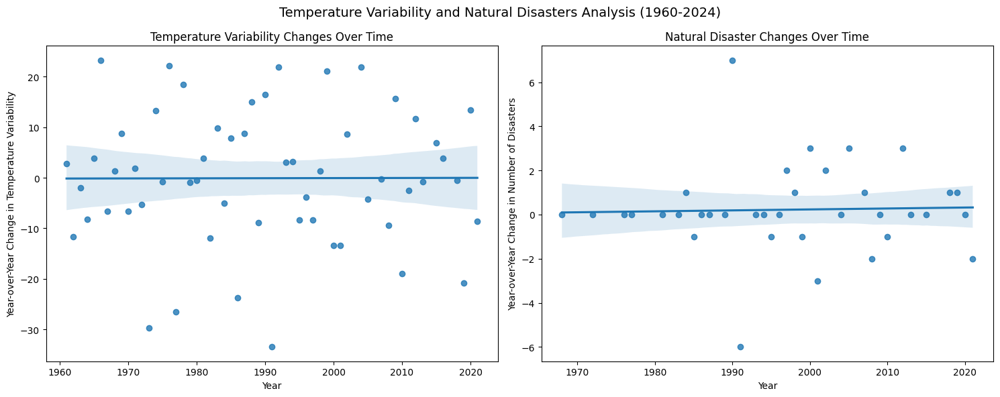


Correlation between variability change and disaster change:
0.3645034342796608


In [4]:
def calculate_temp_variability(min_temps, max_temps, start_year=1960):
    """
    Calculate annual temperature variability using:
    1. Monthly temperature ranges (max - min for each month)
    2. Standard deviation of these ranges across the year
    3. Year-over-year change in this variability measure
    """
    # First, get monthly temperatures
    monthly_data = []
    
    for year in range(start_year, 2024):
        min_year_data = min_temps[min_temps['year'] == year]
        max_year_data = max_temps[max_temps['year'] == year]
        
        if len(min_year_data) > 0 and len(max_year_data) > 0:
            min_monthly = np.array(min_year_data.iloc[0]['monthly_temps'])
            max_monthly = np.array(max_year_data.iloc[0]['monthly_temps'])
            
            # Calculate monthly ranges
            monthly_ranges = max_monthly - min_monthly
            
            # Calculate variability metric
            variability = np.std(monthly_ranges)
            
            monthly_data.append({
                'year': year,
                'variability': variability,
                'mean_range': np.mean(monthly_ranges),
                'max_range': np.max(monthly_ranges),
                'min_range': np.min(monthly_ranges)
            })
    
    # Convert to DataFrame and calculate year-over-year changes
    df = pd.DataFrame(monthly_data)
    df['variability_change'] = df['variability'].diff()
    
    return df

# Read temperature data
def read_temp_data(filepath):
    """Read temperature data and extract monthly values."""
    with open(filepath, 'r') as f:
        lines = f.readlines()[11:]  # Skip header
    
    annual_data = []
    for line in lines:
        try:
            values = line.strip().split()
            if len(values) < 13:  # Skip incomplete rows
                continue
            
            year = int(values[-1])
            temps = [float(x) for x in values[:12]]  # First 12 values are monthly temps
            
            annual_data.append({
                'year': year,
                'monthly_temps': temps
            })
        except:
            continue
            
    return pd.DataFrame(annual_data)

# Process the data
min_temps = read_temp_data('UK_min_temperature_data.txt')
max_temps = read_temp_data('UK_max_temperature_data.txt')
mean_temps = read_temp_data('UK_mean_temperature_data.txt')


# Calculate temperature variability
temp_var = calculate_temp_variability(min_temps, max_temps)

# Process disasters data properly
annual_disasters = disasters_df.groupby('Start Year').size().reset_index(name='disaster_count')
annual_disasters['disaster_change'] = annual_disasters['disaster_count'].diff()

# Merge and visualize
merged_data = pd.merge(temp_var, annual_disasters, 
                      left_on='year', 
                      right_on='Start Year', 
                      how='left')

print("\nMerged Data Sample:")
print(merged_data.head(50))

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Temperature Variability and Natural Disasters Analysis (1960-2024)', fontsize=14)

# Temperature variability plot
sns.regplot(data=merged_data, x='year', y='variability_change', ax=ax1)
ax1.set_title('Temperature Variability Changes Over Time')
ax1.set_xlabel('Year')
ax1.set_ylabel('Year-over-Year Change in Temperature Variability')

# Disasters plot
sns.regplot(data=merged_data, x='year', y='disaster_change', ax=ax2)
ax2.set_title('Natural Disaster Changes Over Time')
ax2.set_xlabel('Year')
ax2.set_ylabel('Year-over-Year Change in Number of Disasters')

plt.tight_layout()
plt.show()

print("\nCorrelation between variability change and disaster change:")
print(merged_data['variability_change'].corr(merged_data['disaster_change']))


Merged Data Sample:
    year  variability  mean_range  max_range  min_range  variability_change  \
0   1960    41.152842   13.516667      102.0      -45.0                 NaN   
1   1961    43.976019   18.975000      120.0      -77.0            2.823177   
2   1962    32.324925   17.608333      101.0      -44.0          -11.651094   
3   1963    30.334536   -3.458333       38.0      -90.0           -1.990388   
4   1964    22.177579    4.000000       58.0      -36.0           -8.156958   
5   1965    26.023583   10.575000       65.0      -31.0            3.846004   
6   1966    49.292672   10.050000      116.0      -65.0           23.269089   
7   1967    42.689203   15.316667       84.0     -102.0           -6.603469   
8   1968    44.052097    6.566667       97.0      -79.0            1.362894   
9   1969    52.853626   -6.841667       75.0     -113.0            8.801529   
10  1970    46.222412    6.416667       76.0      -96.0           -6.631214   
11  1971    48.096716    7.5416

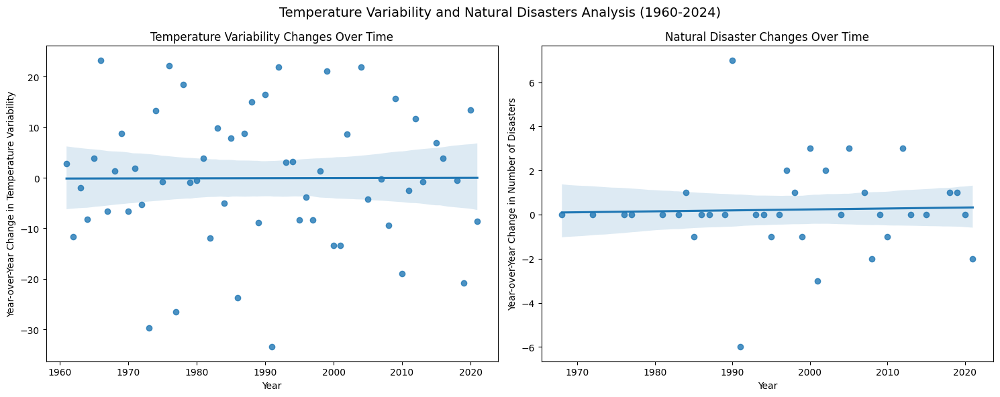


Correlation between variability change and disaster change:
0.3645034342796608


In [5]:
def calculate_temp_variability(min_temps, max_temps, start_year=1960):
    """
    Calculate annual temperature variability using:
    1. Monthly temperature ranges (max - min for each month)
    2. Standard deviation of these ranges across the year
    3. Year-over-year change in this variability measure
    """
    # First, get monthly temperatures
    monthly_data = []
    
    for year in range(start_year, 2024):
        min_year_data = min_temps[min_temps['year'] == year]
        max_year_data = max_temps[max_temps['year'] == year]
        
        if len(min_year_data) > 0 and len(max_year_data) > 0:
            min_monthly = np.array(min_year_data.iloc[0]['monthly_temps'])
            max_monthly = np.array(max_year_data.iloc[0]['monthly_temps'])
            
            # Calculate monthly ranges
            monthly_ranges = max_monthly - min_monthly
            
            # Calculate variability metric
            variability = np.std(monthly_ranges)
            
            monthly_data.append({
                'year': year,
                'variability': variability,
                'mean_range': np.mean(monthly_ranges),
                'max_range': np.max(monthly_ranges),
                'min_range': np.min(monthly_ranges)
            })
    
    # Convert to DataFrame and calculate year-over-year changes
    df = pd.DataFrame(monthly_data)
    df['variability_change'] = df['variability'].diff()
    
    return df

# Read temperature data
def read_temp_data(filepath):
    """Read temperature data and extract monthly values."""
    with open(filepath, 'r') as f:
        lines = f.readlines()[11:]  # Skip header
    
    annual_data = []
    for line in lines:
        try:
            values = line.strip().split()
            if len(values) < 13:  # Skip incomplete rows
                continue
            
            year = int(values[-1])
            temps = [float(x) for x in values[:12]]  # First 12 values are monthly temps
            
            annual_data.append({
                'year': year,
                'monthly_temps': temps
            })
        except:
            continue
            
    return pd.DataFrame(annual_data)

# Process the data
min_temps = read_temp_data('UK_min_temperature_data.txt')
max_temps = read_temp_data('UK_max_temperature_data.txt')


# Calculate temperature variability
temp_var = calculate_temp_variability(min_temps, max_temps)

# Process disasters data properly
annual_disasters = disasters_df.groupby('Start Year').size().reset_index(name='disaster_count')
annual_disasters['disaster_change'] = annual_disasters['disaster_count'].diff()

# Merge and visualize
merged_data = pd.merge(temp_var, annual_disasters, 
                      left_on='year', 
                      right_on='Start Year', 
                      how='left')

print("\nMerged Data Sample:")
print(merged_data.head(50))

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Temperature Variability and Natural Disasters Analysis (1960-2024)', fontsize=14)

# Temperature variability plot
sns.regplot(data=merged_data, x='year', y='variability_change', ax=ax1)
ax1.set_title('Temperature Variability Changes Over Time')
ax1.set_xlabel('Year')
ax1.set_ylabel('Year-over-Year Change in Temperature Variability')

# Disasters plot
sns.regplot(data=merged_data, x='year', y='disaster_change', ax=ax2)
ax2.set_title('Natural Disaster Changes Over Time')
ax2.set_xlabel('Year')
ax2.set_ylabel('Year-over-Year Change in Number of Disasters')

plt.tight_layout()
plt.show()

print("\nCorrelation between variability change and disaster change:")
print(merged_data['variability_change'].corr(merged_data['disaster_change']))

### Year-over-year temp variability and number of disasters


Merged Data Sample:
    year  variability  variability_change  Start Year  disaster_count  \
0   2022         7.75                 NaN      2022.0             5.0   
1   2023         7.34       -4.100000e-01      2023.0             2.0   
2   2014         7.28       -6.000000e-02      2014.0             2.0   
3   2003         7.98        7.000000e-01      2003.0             1.0   
4   2006         7.34       -6.400000e-01         NaN             NaN   
5   2020         7.43        9.000000e-02      2020.0             3.0   
6   2011         7.40       -3.000000e-02         NaN             NaN   
7   2007         7.37       -3.000000e-02      2007.0             5.0   
8   2018         7.54        1.700000e-01      2018.0             2.0   
9   2017         7.13       -4.100000e-01      2017.0             1.0   
10  1997         7.36        2.300000e-01      1997.0             3.0   
11  2019         7.38        2.000000e-02      2019.0             3.0   
12  1990         7.36       -2

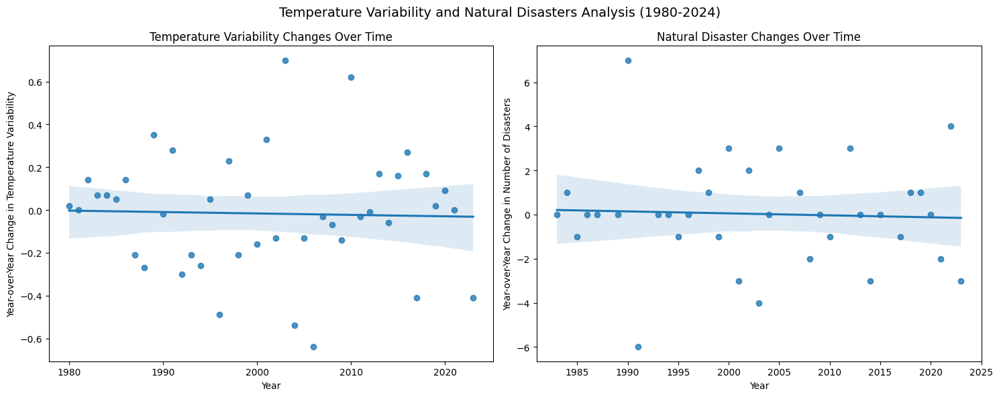


Correlation between variability change and disaster change:
-0.23935493710678749


In [6]:
def read_temp_data(filepath):
    """Read temperature data and extract annual values."""
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Find the annual values section
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def calculate_temp_variability(min_temps, max_temps, start_year=1980):  # Changed start_year to 1980
    """
    Calculate annual temperature variability using:
    1. Difference between annual max and min temperatures
    2. Year-over-year change in this variability measure
    """
    # Merge max and min temperatures
    temp_data = pd.merge(
        max_temps.rename(columns={'annual_temp': 'max_temp'}),
        min_temps.rename(columns={'annual_temp': 'min_temp'}),
        on='year'
    )
    
    # Calculate annual temperature range
    temp_data['variability'] = temp_data['max_temp'] - temp_data['min_temp']
    
    # Filter for start year and calculate year-over-year changes
    temp_data = temp_data[temp_data['year'] >= start_year].copy()
    temp_data['variability_change'] = temp_data['variability'].diff()
    
    return temp_data[['year', 'variability', 'variability_change']]

# Process the data
min_temps = read_temp_data('UK_min_temperature_data.txt')
max_temps = read_temp_data('UK_max_temperature_data.txt')

# Calculate temperature variability
temp_var = calculate_temp_variability(min_temps, max_temps)

# Process disasters data and filter for 1980 onwards
annual_disasters = disasters_df[disasters_df['Start Year'] >= 1980].groupby('Start Year').size().reset_index(name='disaster_count')
annual_disasters['disaster_change'] = annual_disasters['disaster_count'].diff()

# Merge and visualize
merged_data = pd.merge(temp_var, annual_disasters, 
                      left_on='year', 
                      right_on='Start Year', 
                      how='left')

print("\nMerged Data Sample:")
print(merged_data.head(50))

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Temperature Variability and Natural Disasters Analysis (1980-2024)', fontsize=14)  # Updated title

# Temperature variability plot
sns.regplot(data=merged_data, x='year', y='variability_change', ax=ax1)
ax1.set_title('Temperature Variability Changes Over Time')
ax1.set_xlabel('Year')
ax1.set_ylabel('Year-over-Year Change in Temperature Variability')

# Disasters plot
sns.regplot(data=merged_data, x='year', y='disaster_change', ax=ax2)
ax2.set_title('Natural Disaster Changes Over Time')
ax2.set_xlabel('Year')
ax2.set_ylabel('Year-over-Year Change in Number of Disasters')

plt.tight_layout()
plt.show()

print("\nCorrelation between variability change and disaster change:")
print(merged_data['variability_change'].corr(merged_data['disaster_change']))

### Year-over-year temp variability and number of disasters (Log-tranformed)

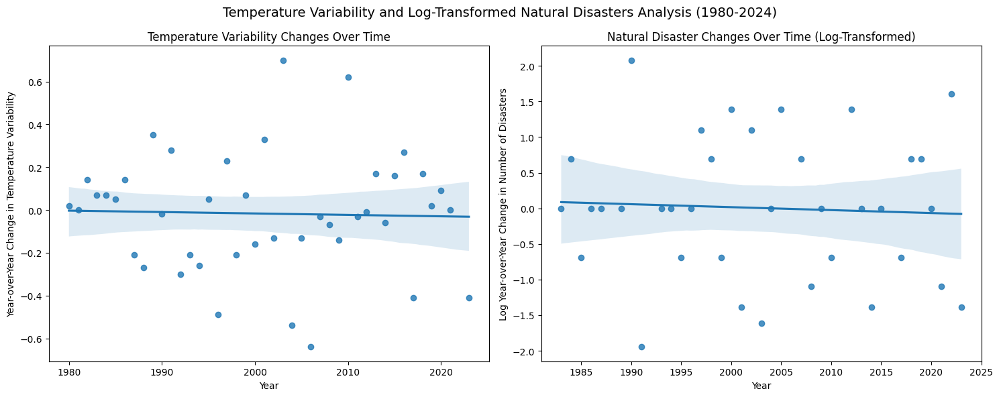


Correlation between variability change and log disaster change:
-0.22255570160309124


In [7]:
def read_temp_data(filepath):
    """Read temperature data and extract annual values."""
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Find the annual values section
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def calculate_temp_variability(min_temps, max_temps, start_year=1980): 
    """
    Calculate annual temperature variability using:
    1. Difference between annual max and min temperatures
    2. Year-over-year change in this variability measure
    """
    # Merge max and min temperatures
    temp_data = pd.merge(
        max_temps.rename(columns={'annual_temp': 'max_temp'}),
        min_temps.rename(columns={'annual_temp': 'min_temp'}),
        on='year'
    )
    
    # Calculate annual temperature range
    temp_data['variability'] = temp_data['max_temp'] - temp_data['min_temp']
    
    # Filter for start year and calculate year-over-year changes
    temp_data = temp_data[temp_data['year'] >= start_year].copy()
    temp_data['variability_change'] = temp_data['variability'].diff()
    
    return temp_data[['year', 'variability', 'variability_change']]

# Process the data
min_temps = read_temp_data('UK_min_temperature_data.txt')
max_temps = read_temp_data('UK_max_temperature_data.txt')

# Calculate temperature variability
temp_var = calculate_temp_variability(min_temps, max_temps)

# Process disasters data and filter for 1980 onwards
annual_disasters = disasters_df[disasters_df['Start Year'] >= 1980].groupby('Start Year').size().reset_index(name='disaster_count')
annual_disasters['disaster_change'] = annual_disasters['disaster_count'].diff()

# Add log transformation for disaster changes
# Using np.sign to preserve direction and np.log1p to handle zeros
annual_disasters['log_disaster_change'] = np.sign(annual_disasters['disaster_change']) * np.log1p(np.abs(annual_disasters['disaster_change']))

# Merge and visualize
merged_data = pd.merge(temp_var, annual_disasters, 
                      left_on='year', 
                      right_on='Start Year', 
                      how='left')

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Temperature Variability and Log-Transformed Natural Disasters Analysis (1980-2024)', fontsize=14)

# Temperature variability plot
sns.regplot(data=merged_data, x='year', y='variability_change', ax=ax1)
ax1.set_title('Temperature Variability Changes Over Time')
ax1.set_xlabel('Year')
ax1.set_ylabel('Year-over-Year Change in Temperature Variability')

# Log-transformed disasters plot
sns.regplot(data=merged_data, x='year', y='log_disaster_change', ax=ax2)
ax2.set_title('Natural Disaster Changes Over Time (Log-Transformed)')
ax2.set_xlabel('Year')
ax2.set_ylabel('Log Year-over-Year Change in Number of Disasters')

plt.tight_layout()
plt.show()

print("\nCorrelation between variability change and log disaster change:")
print(merged_data['variability_change'].corr(merged_data['log_disaster_change']))

### Standard Deviation change vs disaster change


Correlation and p-value between std dev change and disaster change:
Pearson correlation: -0.044, p-value: 0.800


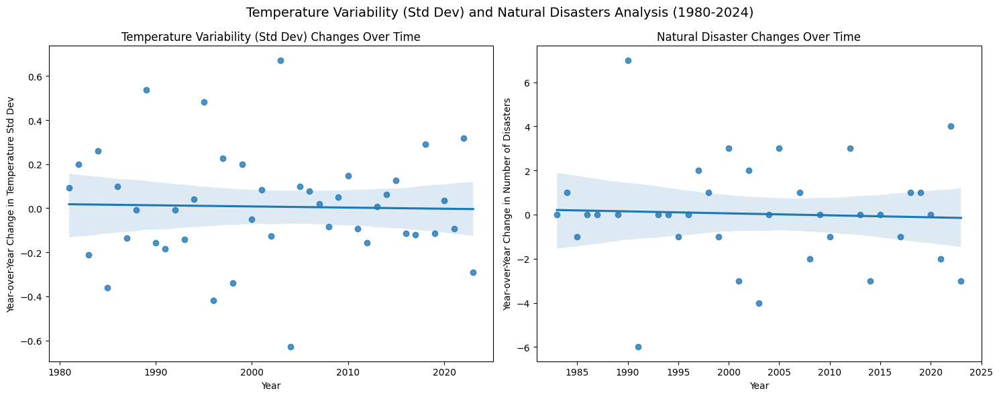


Scatter plot of std dev change vs disaster change:


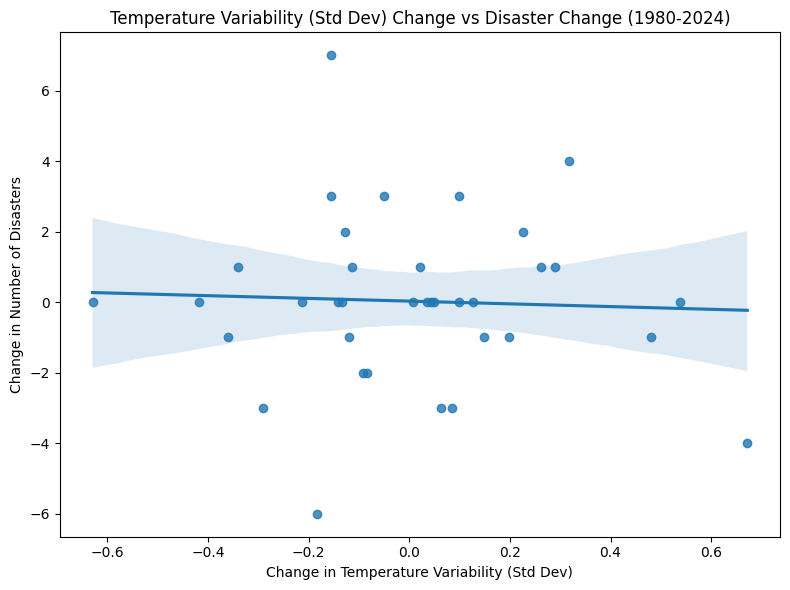

In [8]:
def read_temp_data(filepath):
    """Read temperature data and extract annual values."""
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Find the annual values section
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def calculate_temp_variability(min_temps, max_temps, start_year=1980):
    """
    Calculate annual temperature variability using:
    1. Standard deviation of monthly temperatures each year
    2. Year-over-year change in this variability measure
    """
    # Merge min and max temp dfs
    monthly_data = min_temps.merge(max_temps, on='year', suffixes=('_min','_max'))

    # Melt into long format with month, temp_type columns  
    monthly_data = pd.melt(monthly_data, id_vars='year', var_name='month_type', value_name='temp')

    # Split month_type into month and temp_type 
    monthly_data[['month','temp_type']] = monthly_data['month_type'].str.split('_', n=1, expand=True)
    
    # Pivot to calculate std dev per year
    annual_std_dev = monthly_data.pivot_table(index='year', values='temp', aggfunc='std').reset_index()
    annual_std_dev.columns = ['year','std_dev']
    
    # Filter for start year and calculate year-over-year changes
    annual_std_dev = annual_std_dev[annual_std_dev['year'] >= start_year].copy()
    annual_std_dev['std_dev_change'] = annual_std_dev['std_dev'].diff()
    
    return annual_std_dev[['year', 'std_dev', 'std_dev_change']]

# Process the data
min_temps = read_temp_data('UK_min_temperature_data.txt') 
max_temps = read_temp_data('UK_max_temperature_data.txt')

# Calculate temperature variability
temp_var = calculate_temp_variability(min_temps, max_temps)

# Process disasters data and filter for 1980 onwards
annual_disasters = disasters_df[disasters_df['Start Year'] >= 1980].groupby('Start Year').size().reset_index(name='disaster_count')
annual_disasters['disaster_change'] = annual_disasters['disaster_count'].diff()

# Merge and analyze
merged_data = pd.merge(temp_var, annual_disasters, 
                       left_on='year', right_on='Start Year', how='left')

# Drop rows with missing values
merged_data_cleaned = merged_data.dropna(subset=['std_dev_change', 'disaster_change'])

print("\nCorrelation and p-value between std dev change and disaster change:")
corr, p_val = pearsonr(merged_data_cleaned['std_dev_change'], merged_data_cleaned['disaster_change'])
print(f"Pearson correlation: {corr:.3f}, p-value: {p_val:.3f}")

# Visualize 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Temperature Variability (Std Dev) and Natural Disasters Analysis (1980-2024)', fontsize=14)

# Temperature std dev plot
sns.regplot(data=merged_data, x='year', y='std_dev_change', ax=ax1)  
ax1.set_title('Temperature Variability (Std Dev) Changes Over Time')
ax1.set_xlabel('Year')
ax1.set_ylabel('Year-over-Year Change in Temperature Std Dev')

# Disasters plot
sns.regplot(data=merged_data, x='year', y='disaster_change', ax=ax2)
ax2.set_title('Natural Disaster Changes Over Time') 
ax2.set_xlabel('Year')
ax2.set_ylabel('Year-over-Year Change in Number of Disasters')

plt.tight_layout()
plt.show()

print("\nScatter plot of std dev change vs disaster change:")
plt.figure(figsize=(8,6))
sns.regplot(data=merged_data_cleaned, x='std_dev_change', y='disaster_change')
plt.xlabel('Change in Temperature Variability (Std Dev)')
plt.ylabel('Change in Number of Disasters')  
plt.title('Temperature Variability (Std Dev) Change vs Disaster Change (1980-2024)')
plt.tight_layout()
plt.show()

Correlation between mean temperature change and disaster count change: 0.282
p-value: 0.090


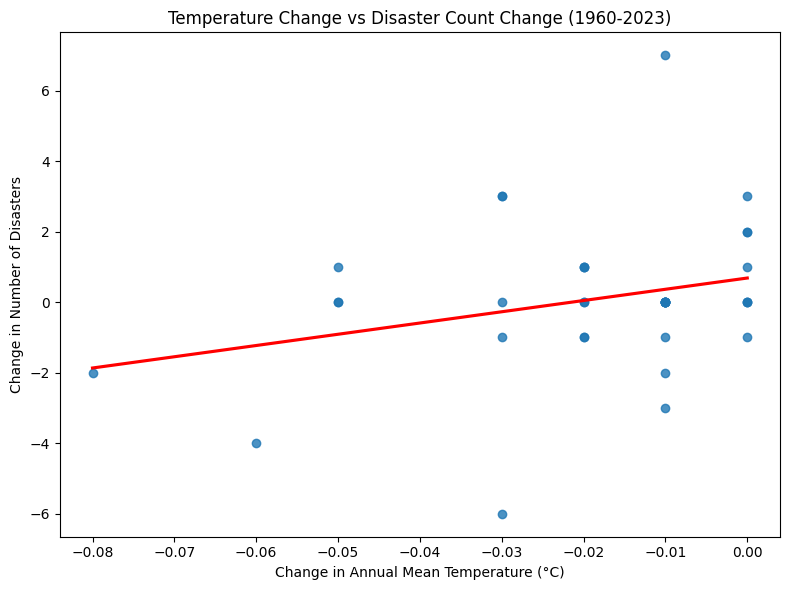


Merged data table:
    year  mean_temp  temp_change  disaster_count  disaster_change
0   2007       9.56        -0.05               5              1.0
1   2017       9.53        -0.03               1             -1.0
2   2003       9.47        -0.06               1             -4.0
3   2018       9.45        -0.02               2              1.0
4   2004       9.44        -0.01               1              0.0
5   2002       9.44         0.00               5              2.0
6   2005       9.41        -0.03               4              3.0
7   1997       9.41         0.00               3              2.0
8   2019       9.39        -0.02               3              1.0
9   1990       9.38        -0.01               8              7.0
10  1999       9.37        -0.01               3             -1.0
11  2021       9.28        -0.01               1             -2.0
12  1989       9.23        -0.01               1              0.0
13  2015       9.18        -0.05               2        

In [9]:
def read_mean_temp_data(filepath):
    with open(filepath, 'r') as f:
        lines = f.readlines()[11:]  # Skip header
    
    annual_data = []
    for line in lines:
        try:
            values = line.strip().split()
            year = int(values[-1])
            # Handle missing values marked as '---'
            annual_mean = float(values[-2]) if values[-2] != '---' else None
            
            annual_data.append({
                'year': year,
                'mean_temp': annual_mean
            })
        except (ValueError, IndexError):
            continue
            
    return pd.DataFrame(annual_data)

# Read in data
mean_temps = read_mean_temp_data('UK_mean_temperature_data.txt')
annual_disasters = disasters_df.groupby('Start Year').size().reset_index(name='disaster_count')

# Calculate year-over-year changes  
mean_temps['temp_change'] = mean_temps['mean_temp'].diff()
annual_disasters['disaster_change'] = annual_disasters['disaster_count'].diff()

# Merge datasets
merged_df = pd.merge(mean_temps, annual_disasters, left_on='year', right_on='Start Year')

# Remove rows with NaN values
merged_df = merged_df.dropna()

# Calculate correlation
corr, p_val = pearsonr(merged_df['temp_change'], merged_df['disaster_change'])

print(f"Correlation between mean temperature change and disaster count change: {corr:.3f}")  
print(f"p-value: {p_val:.3f}")

# Visualize
plt.figure(figsize=(8,6))
sns.regplot(data=merged_df, x='temp_change', y='disaster_change', ci=None, line_kws={"color": "red"})
plt.xlabel('Change in Annual Mean Temperature (°C)')  
plt.ylabel('Change in Number of Disasters')
plt.title('Temperature Change vs Disaster Count Change (1960-2023)')
plt.tight_layout()
plt.show()

print("\nMerged data table:")
print(merged_df[['year', 'mean_temp', 'temp_change', 'disaster_count', 'disaster_change']].round(3))

### Mean temperature change vs change in disasters

Error processing line: -1.8  1963   -2.3  1895    1.8  1962    4.3  1917    7.5  1902   10.5  1972   12.3  1922   11.7  1912    9.9  1952    5.9  1896    2.3  1919    ---  2024     ---  1884    5.42  1891   12.23  1922    6.97  1887     ---  2024
Error: could not convert string to float: '---'


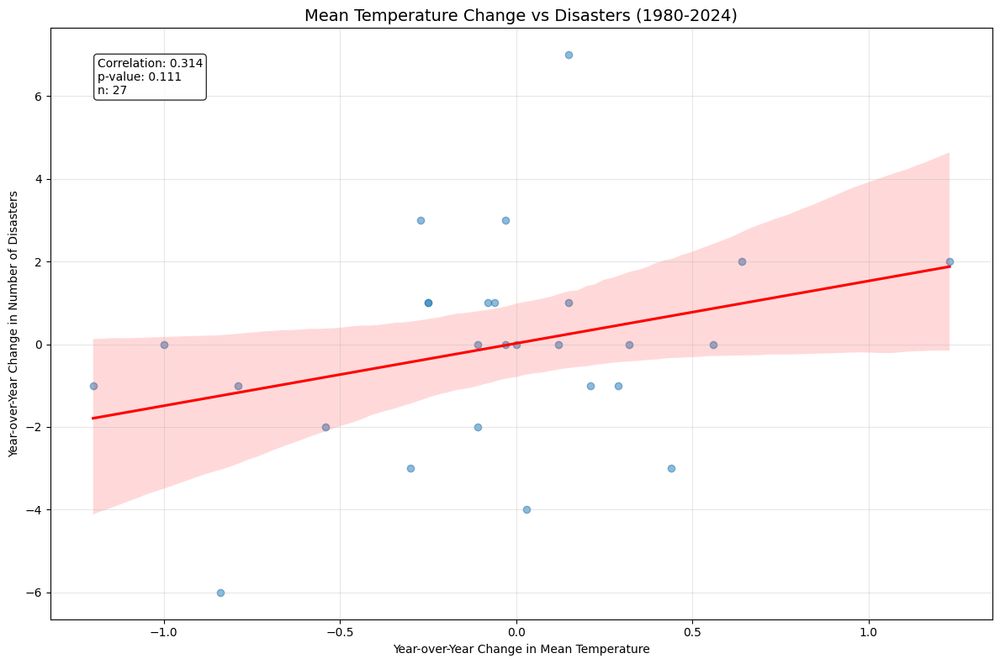


Summary Statistics:
       temp_change  disaster_change
count       27.000           27.000
mean        -0.064           -0.074
std          0.519            2.495
min         -1.200           -6.000
25%         -0.260           -1.000
50%         -0.030            0.000
75%          0.180            1.000
max          1.230            7.000

Mean Temperatures by Year:
            mean_temp  temp_change
Start Year                        
1980             8.26         0.66
1981             8.11        -0.15
1982             8.65         0.54
1983             8.83         0.18
1984             8.58        -0.25
1985             7.79        -0.79
1986             7.68        -0.11
1987             8.00         0.32
1988             8.73         0.73
1989             9.23         0.50
1990             9.38         0.15
1991             8.54        -0.84
1992             8.69         0.15
1993             8.33        -0.36
1994             8.89         0.56
1995             9.18         0.

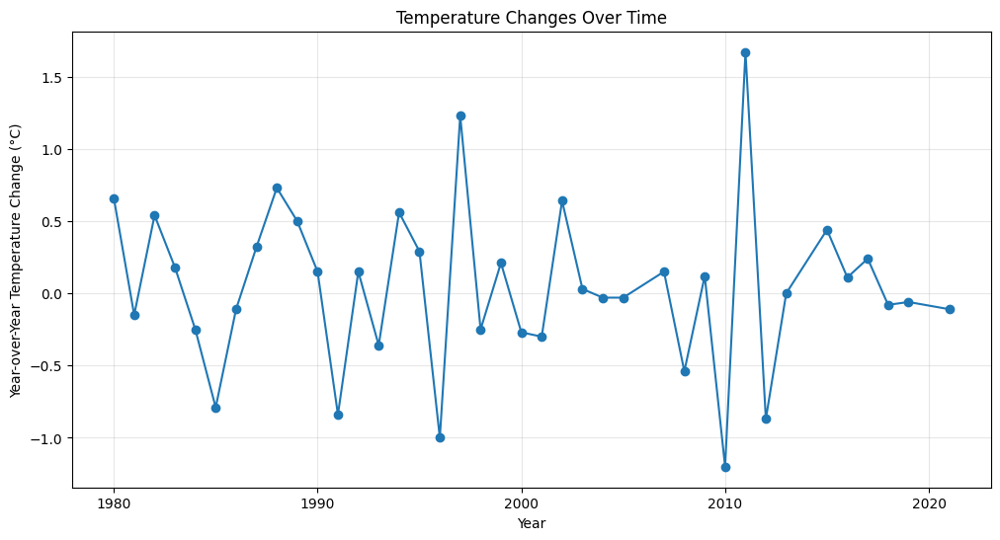

In [10]:
def read_mean_temp_data(filepath):
    with open(filepath, 'r') as f:
        lines = f.readlines()[11:]  # Skip header
    
    annual_data = []
    for line in lines:
        try:
            values = line.strip().split()
            if len(values) >= 2:
                # The annual mean and year are the last two values
                year = int(values[-1])
                annual_mean = float(values[-2])
                
                # Verify the values make sense
                if year >= 1800 and year <= 2024:  # reasonable year range
                    annual_data.append({
                        'Start Year': year,
                        'mean_temp': annual_mean
                    })
        except Exception as e:
            print(f"Error processing line: {line.strip()}")
            print(f"Error: {e}")
            continue
            
    return pd.DataFrame(annual_data).sort_values('Start Year')  # Sort by year

# Load and process mean temperature data
mean_temps = read_mean_temp_data('UK_mean_temperature_data.txt')

# Calculate the actual year-over-year temperature change
mean_temps['temp_change'] = mean_temps['mean_temp'].diff()

# Focus on 1980-2024 and merge with disaster data
focused_mean_data = mean_temps[mean_temps['Start Year'] >= 1980].copy()
merged_mean_data = pd.merge(focused_mean_data, annual_disasters, 
                          left_on='Start Year', right_on='Start Year', how='left')
merged_mean_data['disaster_change'] = merged_mean_data['disaster_count'].diff()

# Drop NA values from both columns at once before calculating correlation
clean_data = merged_mean_data.dropna(subset=['temp_change', 'disaster_change'])

# Calculate correlation
correlation, p_value = pearsonr(clean_data['temp_change'], 
                                    clean_data['disaster_change'])

# Create visualization
plt.figure(figsize=(12, 8))

# Create scatter plot with regression line
sns.regplot(data=clean_data, 
            x='temp_change', 
            y='disaster_change',
            scatter_kws={'alpha':0.5},
            line_kws={'color': 'red'})

plt.title('Mean Temperature Change vs Disasters (1980-2024)', fontsize=14)
plt.xlabel('Year-over-Year Change in Mean Temperature')
plt.ylabel('Year-over-Year Change in Number of Disasters')

# Add text box with correlation info
text = f'Correlation: {correlation:.3f}\np-value: {p_value:.3f}\nn: {len(clean_data)}'
plt.text(0.05, 0.95, text, 
         transform=plt.gca().transAxes, 
         verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
stats_df = clean_data[['temp_change', 'disaster_change']].describe()
print(stats_df.round(3))

# Add mean temperature table
print("\nMean Temperatures by Year:")
temp_table = merged_mean_data[['Start Year', 'mean_temp', 'temp_change']].sort_values('Start Year')
# Format the table with rounded values
print(temp_table.set_index('Start Year').round(3))

# Optional: Temperature change statistics
print("\nTemperature Change Statistics:")
print(temp_table['temp_change'].describe().round(3))

# Additional correlation tests
# Spearman rank correlation (less sensitive to outliers)
spearman_corr, spearman_p = spearmanr(clean_data['temp_change'], 
                                           clean_data['disaster_change'])

# Kendall's Tau (another non-parametric correlation measure)
kendall_corr, kendall_p = kendalltau(clean_data['temp_change'], 
                                          clean_data['disaster_change'])

print("\nRobust Correlation Tests:")
print(f"Spearman correlation: {spearman_corr:.3f} (p={spearman_p:.3f})")
print(f"Kendall's Tau: {kendall_corr:.3f} (p={kendall_p:.3f})")

# Optional: Add a time series plot of temperature changes
plt.figure(figsize=(12, 6))
plt.plot(temp_table['Start Year'], temp_table['temp_change'], marker='o')
plt.title('Temperature Changes Over Time')
plt.xlabel('Year')
plt.ylabel('Year-over-Year Temperature Change (°C)')
plt.grid(True, alpha=0.3)
plt.show()

### Mean temperature data

In [11]:
# Add mean temperature table
print("\nMean Temperatures by Year:")
temp_table = merged_mean_data[['Start Year', 'mean_temp', 'temp_change']].sort_values('Start Year')
# Format the table with rounded values
print(temp_table.set_index('Start Year').round(3))

# Optional: If you want to see specific statistics about the temperature changes
print("\nTemperature Change Statistics:")
print(temp_table['temp_change'].describe().round(3))


Mean Temperatures by Year:
            mean_temp  temp_change
Start Year                        
1980             8.26         0.66
1981             8.11        -0.15
1982             8.65         0.54
1983             8.83         0.18
1984             8.58        -0.25
1985             7.79        -0.79
1986             7.68        -0.11
1987             8.00         0.32
1988             8.73         0.73
1989             9.23         0.50
1990             9.38         0.15
1991             8.54        -0.84
1992             8.69         0.15
1993             8.33        -0.36
1994             8.89         0.56
1995             9.18         0.29
1996             8.18        -1.00
1997             9.41         1.23
1998             9.16        -0.25
1999             9.37         0.21
2000             9.10        -0.27
2001             8.80        -0.30
2002             9.44         0.64
2003             9.47         0.03
2004             9.44        -0.03
2005             9.41      

### Year-over-year Mean Temperature vs Major Disasters (Extreme temp, flood, storm)

Error processing line: -1.8  1963   -2.3  1895    1.8  1962    4.3  1917    7.5  1902   10.5  1972   12.3  1922   11.7  1912    9.9  1952    5.9  1896    2.3  1919    ---  2024     ---  1884    5.42  1891   12.23  1922    6.97  1887     ---  2024
Error: could not convert string to float: '---'


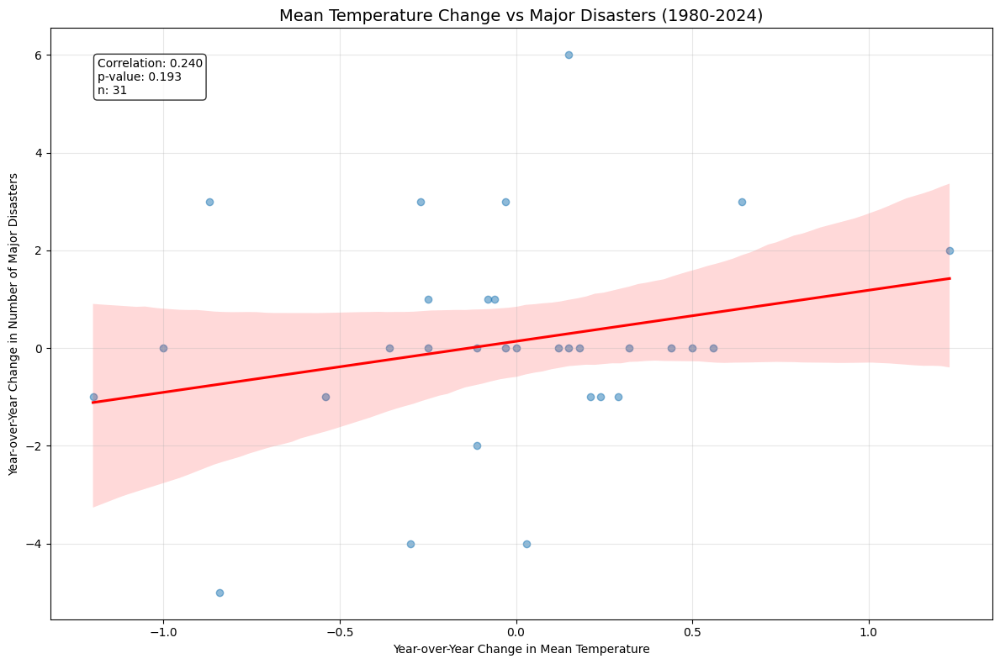


Summary Statistics for Major Disasters:
       temp_change  disaster_change
count       31.000           31.000
mean        -0.040            0.097
std          0.505            2.196
min         -1.200           -5.000
25%         -0.260           -1.000
50%         -0.030            0.000
75%          0.225            1.000
max          1.230            6.000

Robust Correlation Tests for Major Disasters:
Spearman correlation: 0.164 (p=0.377)
Kendall's Tau: 0.124 (p=0.364)

Frequency of Major Disaster Types (1980-2024):
Disaster Type
Storm                  45
Flood                  34
Extreme temperature    14
Name: count, dtype: int64

Average major disasters per year: 2.51


In [12]:
# Filter disasters for the three main types
main_disaster_types = ['Extreme temperature', 'Flood', 'Storm']
filtered_disasters = disasters_df[
    (disasters_df['Disaster Type'].isin(main_disaster_types)) & 
    (disasters_df['Start Year'] >= 1980)
]

# Create annual summaries
annual_major_disasters = filtered_disasters.groupby('Start Year').size().reset_index(name='disaster_count')
annual_major_disasters['disaster_change'] = annual_major_disasters['disaster_count'].diff()

# Load and process mean temperature data
mean_temps = read_mean_temp_data('UK_mean_temperature_data.txt')
mean_temps['temp_change'] = mean_temps['mean_temp'].diff()

# Focus on 1980-2024 and merge with filtered disaster data
focused_mean_data = mean_temps[mean_temps['Start Year'] >= 1980].copy()
merged_major_data = pd.merge(focused_mean_data, annual_major_disasters, 
                           left_on='Start Year', right_on='Start Year', how='left')

# Drop NA values from both columns before calculating correlation
clean_major_data = merged_major_data.dropna(subset=['temp_change', 'disaster_change'])

# Calculate correlation
correlation, p_value = pearsonr(clean_major_data['temp_change'], 
                                    clean_major_data['disaster_change'])

# Create visualization
plt.figure(figsize=(12, 8))

# Create scatter plot with regression line
sns.regplot(data=clean_major_data, 
            x='temp_change', 
            y='disaster_change',
            scatter_kws={'alpha':0.5},
            line_kws={'color': 'red'})

plt.title('Mean Temperature Change vs Major Disasters (1980-2024)', fontsize=14)
plt.xlabel('Year-over-Year Change in Mean Temperature')
plt.ylabel('Year-over-Year Change in Number of Major Disasters')

# Add text box with correlation info
text = f'Correlation: {correlation:.3f}\np-value: {p_value:.3f}\nn: {len(clean_major_data)}'
plt.text(0.05, 0.95, text, 
         transform=plt.gca().transAxes, 
         verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics for Major Disasters:")
stats_df = clean_major_data[['temp_change', 'disaster_change']].describe()
print(stats_df.round(3))

# Additional correlation tests
# Spearman rank correlation
spearman_corr, spearman_p = spearmanr(clean_major_data['temp_change'], 
                                           clean_major_data['disaster_change'])

# Kendall's Tau
kendall_corr, kendall_p = kendalltau(clean_major_data['temp_change'], 
                                          clean_major_data['disaster_change'])

print("\nRobust Correlation Tests for Major Disasters:")
print(f"Spearman correlation: {spearman_corr:.3f} (p={spearman_p:.3f})")
print(f"Kendall's Tau: {kendall_corr:.3f} (p={kendall_p:.3f})")

# Print disaster type frequencies
print("\nFrequency of Major Disaster Types (1980-2024):")
print(filtered_disasters['Disaster Type'].value_counts())

# Calculate average number of disasters per year
years_count = len(filtered_disasters['Start Year'].unique())
print(f"\nAverage major disasters per year: {len(filtered_disasters)/years_count:.2f}")

### Maximum annual temperature vs Number of Disaster Deaths (Log transformation + 1)


Correlation Analysis Results:
Pearson correlation coefficient: 0.399
P-value: 0.007


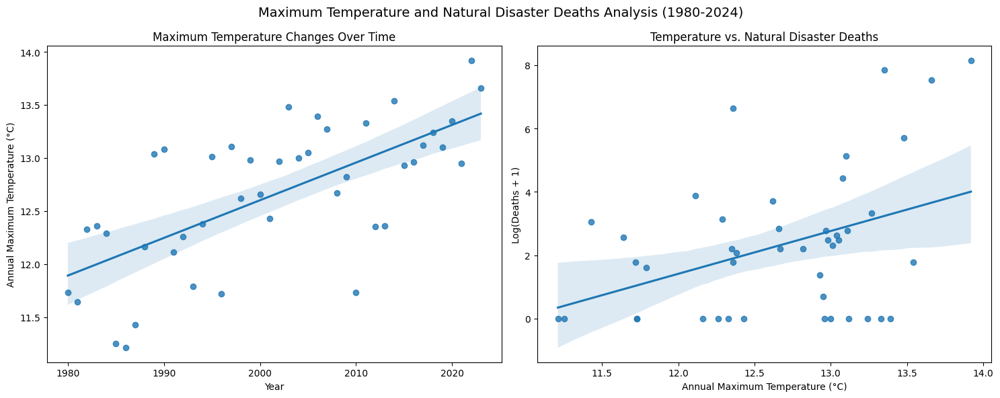

In [13]:
def read_max_temp_data(filepath):
    """
    Read maximum temperature data and extract annual values.
    Returns a DataFrame with year and annual maximum temperature.
    """
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Skip header
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_max_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def process_disaster_data(disasters_df):
    """
    Process disaster data to get annual death totals.
    Handles missing values by treating them as 0.
    """
    # Convert 'Total Deaths' to numeric, treating non-numeric values as NaN
    disasters_df['Total Deaths'] = pd.to_numeric(disasters_df['Total Deaths'], errors='coerce')
    
    # Fill NaN values with 0
    disasters_df['Total Deaths'] = disasters_df['Total Deaths'].fillna(0)
    
    # Group by year and sum deaths
    annual_deaths = disasters_df.groupby('Start Year')['Total Deaths'].sum().reset_index()
    
    return annual_deaths

def create_analysis_plots(merged_data):
    """
    Create visualization plots for the analysis.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Maximum Temperature and Natural Disaster Deaths Analysis (1980-2024)', fontsize=14)
    
    # Temperature plot
    sns.regplot(data=merged_data, x='year', y='annual_max_temp', ax=ax1)
    ax1.set_title('Maximum Temperature Changes Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Annual Maximum Temperature (°C)')
    
    # Deaths plot (log-transformed due to high variability)
    merged_data['log_deaths'] = np.log1p(merged_data['Total Deaths'])
    sns.regplot(data=merged_data, x='annual_max_temp', y='log_deaths', ax=ax2)
    ax2.set_title('Temperature vs. Natural Disaster Deaths')
    ax2.set_xlabel('Annual Maximum Temperature (°C)')
    ax2.set_ylabel('Log(Deaths + 1)')
    
    plt.tight_layout()
    return fig

def main():
    # Read temperature data
    max_temps = read_max_temp_data('UK_max_temperature_data.txt')
    
    # Filter for 1980 onwards
    max_temps = max_temps[max_temps['year'] >= 1980].copy()
    
    # Read and process disaster data
    disasters_df_top = pd.read_csv('UK Disasters Top - EM-DAT Data.csv')
    annual_deaths_top = process_disaster_data(disasters_df_top)
    
    # Merge datasets
    merged_data = pd.merge(
        max_temps,
        annual_deaths_top,
        left_on='year',
        right_on='Start Year',
        how='left'
    )
    
    # Fill any missing death counts with 0
    merged_data['Total Deaths'] = merged_data['Total Deaths'].fillna(0)
    
    # Create visualizations
    fig = create_analysis_plots(merged_data)
    
    # Calculate correlation coefficient
    correlation = pearsonr(
        merged_data['annual_max_temp'],
        np.log1p(merged_data['Total Deaths'])
    )
    
    print("\nCorrelation Analysis Results:")
    print(f"Pearson correlation coefficient: {correlation[0]:.3f}")
    print(f"P-value: {correlation[1]:.3f}")
    
    return merged_data

if __name__ == "__main__":
    merged_data = main()

In [14]:
# Top 3 deadliest disasters
disasters_df_top = pd.read_csv('UK Disasters Top - EM-DAT Data.csv')


Correlation Analysis Results:

Raw Disaster Counts:
Pearson correlation coefficient: 0.285
P-value: 0.061

Log-Transformed Disaster Counts:
Pearson correlation coefficient: 0.246
P-value: 0.108


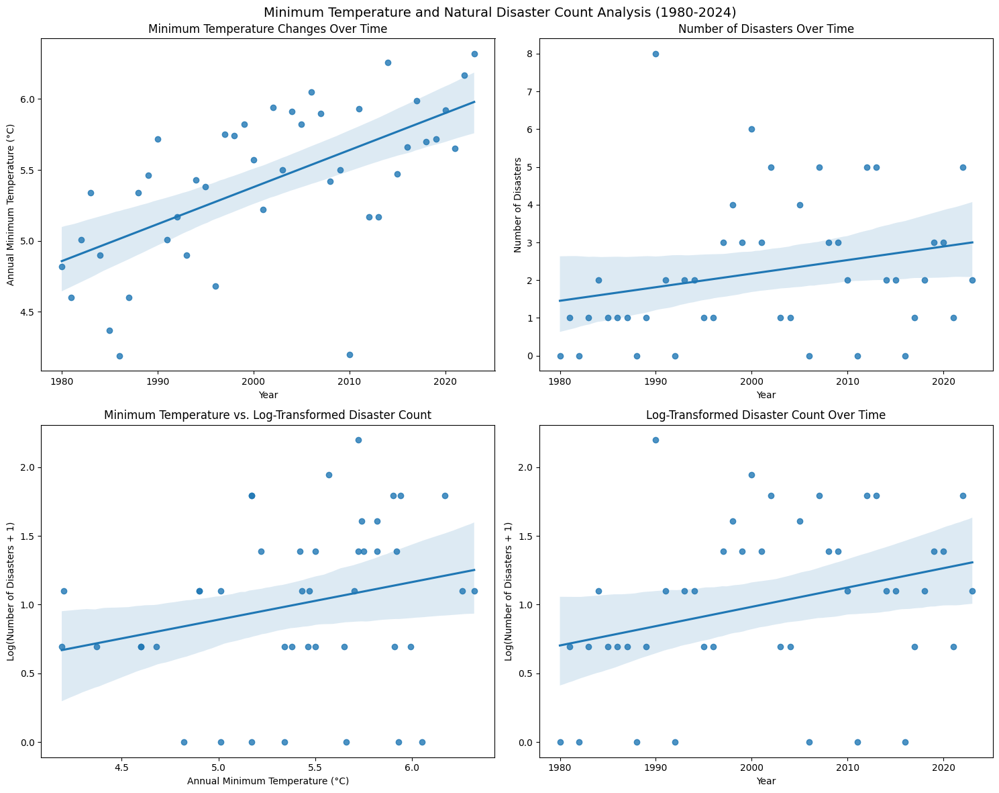

In [15]:
def read_min_temp_data(filepath):
    """
    Read minimum temperature data and extract annual values.
    Returns a DataFrame with year and annual minimum temperature.
    """
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Skip header
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_min_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def process_disaster_counts(disasters_df):
    """
    Process disaster data to get annual disaster counts.
    """
    # Count disasters by year
    annual_counts = disasters_df['Start Year'].value_counts().reset_index()
    annual_counts.columns = ['year', 'disaster_count']
    
    # Sort by year
    annual_counts = annual_counts.sort_values('year').reset_index(drop=True)
    
    return annual_counts

def create_min_temp_analysis_plots(merged_data):
    """
    Create visualization plots for the analysis of disaster counts vs minimum temperatures.
    """
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Minimum Temperature and Natural Disaster Count Analysis (1980-2024)', fontsize=14)
    
    # Raw count plots
    # Temperature vs Time
    sns.regplot(data=merged_data, x='year', y='annual_min_temp', ax=ax1)
    ax1.set_title('Minimum Temperature Changes Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Annual Minimum Temperature (°C)')
    
    # Disaster Count vs Time
    sns.regplot(data=merged_data, x='year', y='disaster_count', ax=ax2)
    ax2.set_title('Number of Disasters Over Time')
    ax2.set_xlabel('Year')
    ax2.set_ylabel('Number of Disasters')
    
    # Log-transformed plots
    # Temperature vs Log(Disasters + 1)
    merged_data['log_disasters'] = np.log1p(merged_data['disaster_count'])
    sns.regplot(data=merged_data, x='annual_min_temp', y='log_disasters', ax=ax3)
    ax3.set_title('Minimum Temperature vs. Log-Transformed Disaster Count')
    ax3.set_xlabel('Annual Minimum Temperature (°C)')
    ax3.set_ylabel('Log(Number of Disasters + 1)')
    
    # Log(Disasters + 1) vs Time
    sns.regplot(data=merged_data, x='year', y='log_disasters', ax=ax4)
    ax4.set_title('Log-Transformed Disaster Count Over Time')
    ax4.set_xlabel('Year')
    ax4.set_ylabel('Log(Number of Disasters + 1)')
    
    plt.tight_layout()
    return fig

# Get the minimum temperature data
min_temps = read_min_temp_data('UK_min_temperature_data.txt')

# Filter for 1980 onwards
min_temps = min_temps[min_temps['year'] >= 1980].copy()

# Get the disaster counts (using previously defined process_disaster_counts function)
annual_counts = process_disaster_counts(disasters_df)

# Merge with temperature data
merged_data = pd.merge(
    min_temps,
    annual_counts,
    on='year',
    how='left'
)

# Fill any missing disaster counts with 0
merged_data['disaster_count'] = merged_data['disaster_count'].fillna(0)

# Create visualizations
fig = create_min_temp_analysis_plots(merged_data)

# Calculate correlation coefficients
raw_correlation = pearsonr(
    merged_data['annual_min_temp'],
    merged_data['disaster_count']
)

log_correlation = pearsonr(
    merged_data['annual_min_temp'],
    np.log1p(merged_data['disaster_count'])
)

print("\nCorrelation Analysis Results:")
print("\nRaw Disaster Counts:")
print(f"Pearson correlation coefficient: {raw_correlation[0]:.3f}")
print(f"P-value: {raw_correlation[1]:.3f}")

print("\nLog-Transformed Disaster Counts:")
print(f"Pearson correlation coefficient: {log_correlation[0]:.3f}")
print(f"P-value: {log_correlation[1]:.3f}")


Correlation Analysis Results:
Pearson correlation coefficient: 0.232
P-value: 0.135

Number of valid data points: 43


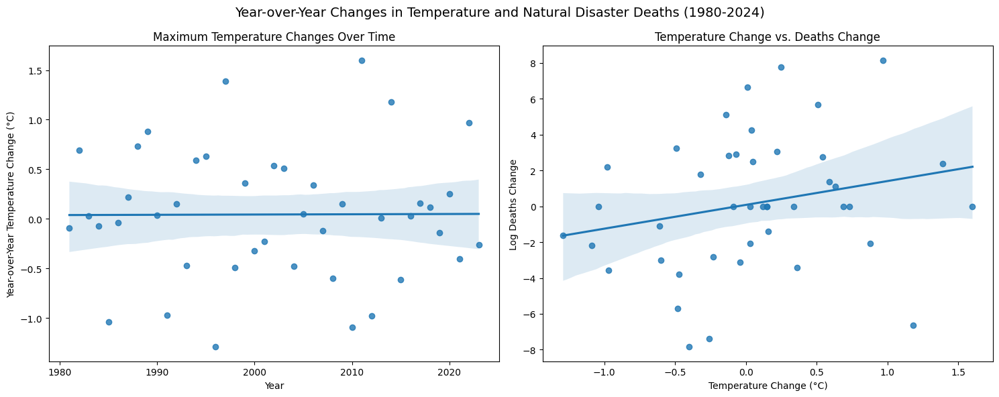

In [16]:
def calculate_changes(df, year_col, value_col):
    """
    Calculate year-over-year changes for a given column.
    """
    df = df.sort_values(year_col)
    df[f'{value_col}_change'] = df[value_col].diff()
    return df

def create_analysis_plots(merged_data):
    """
    Create visualization plots for the year-over-year changes analysis.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Year-over-Year Changes in Temperature and Natural Disaster Deaths (1980-2024)', fontsize=14)
    
    # Temperature change plot
    sns.regplot(data=merged_data, x='year', y='annual_max_temp_change', ax=ax1)
    ax1.set_title('Maximum Temperature Changes Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Year-over-Year Temperature Change (°C)')
    
    # Deaths change plot (log-transformed)
    merged_data['log_deaths_change'] = np.sign(merged_data['Total Deaths_change']) * \
                                     np.log1p(np.abs(merged_data['Total Deaths_change']))
    
    # Drop NaN values for the scatter plot
    valid_data = merged_data.dropna(subset=['annual_max_temp_change', 'log_deaths_change'])
    
    sns.regplot(data=valid_data, 
               x='annual_max_temp_change', 
               y='log_deaths_change', 
               ax=ax2)
    ax2.set_title('Temperature Change vs. Deaths Change')
    ax2.set_xlabel('Temperature Change (°C)')
    ax2.set_ylabel('Log Deaths Change')
    
    plt.tight_layout()
    return fig

# Read and process temperature data
max_temps = read_max_temp_data('UK_max_temperature_data.txt')
max_temps = max_temps[max_temps['year'] >= 1980].copy()
max_temps = calculate_changes(max_temps, 'year', 'annual_max_temp')

# Read and process disaster data
disasters_df = pd.read_csv('UK Disasters Top - EM-DAT Data.csv')
annual_deaths = process_disaster_data(disasters_df)
annual_deaths = calculate_changes(annual_deaths, 'Start Year', 'Total Deaths')

# Merge datasets
merged_data = pd.merge(
    max_temps,
    annual_deaths,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill any missing values with 0
merged_data['Total Deaths_change'] = merged_data['Total Deaths_change'].fillna(0)

# Create visualizations
fig = create_analysis_plots(merged_data)

# Calculate correlation coefficient between changes
# First, create the log transform of deaths change
merged_data['log_deaths_change'] = np.sign(merged_data['Total Deaths_change']) * \
                                 np.log1p(np.abs(merged_data['Total Deaths_change']))

# Drop all rows with NaN values in either column
valid_data = merged_data.dropna(subset=['annual_max_temp_change', 'log_deaths_change'])

correlation = pearsonr(
    valid_data['annual_max_temp_change'],
    valid_data['log_deaths_change']
)

print("\nCorrelation Analysis Results:")
print(f"Pearson correlation coefficient: {correlation[0]:.3f}")
print(f"P-value: {correlation[1]:.3f}")

# Print the number of valid data points used
print(f"\nNumber of valid data points: {len(valid_data)}")

### Minimum temperature vs Number of Disaster Deaths from Extreme Temperature, Flood, Storms (Log transformed + 1)


Correlation Analysis Results:
Pearson correlation coefficient: 0.250
P-value: 0.102

Number of valid data points: 44

Summary Statistics:

Minimum Temperature (°C):
Mean: 5.42
Min: 4.19
Max: 6.32
Std Dev: 0.54

Deaths:
Mean: 218.00
Min: 0.00
Max: 3475.00
Std Dev: 693.61


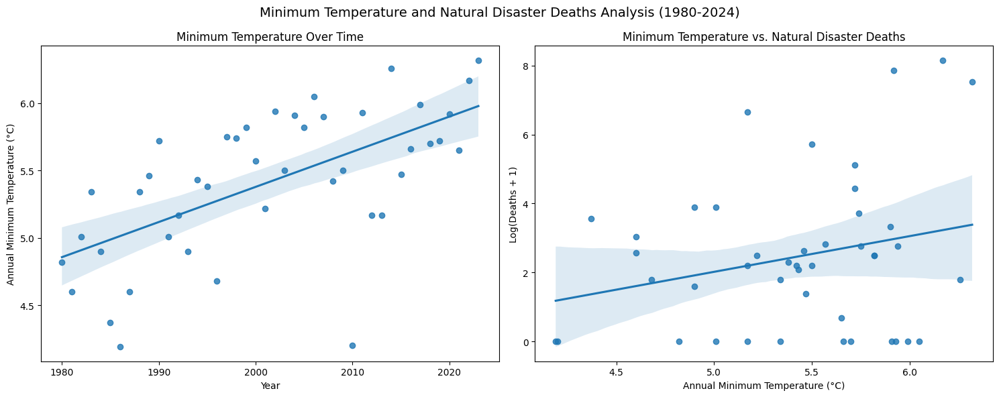

In [17]:
def read_min_temp_data(filepath):
    """
    Read minimum temperature data and extract annual values.
    Returns a DataFrame with year and annual minimum temperature.
    """
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Skip header
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_min_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def process_disaster_data(disasters_df):
    """
    Process disaster data to get annual death totals.
    Handles missing values by treating them as 0.
    """
    # Convert 'Total Deaths' to numeric, treating non-numeric values as NaN
    disasters_df['Total Deaths'] = pd.to_numeric(disasters_df['Total Deaths'], errors='coerce')
    
    # Fill NaN values with 0
    disasters_df['Total Deaths'] = disasters_df['Total Deaths'].fillna(0)
    
    # Group by year and sum deaths
    annual_deaths = disasters_df.groupby('Start Year')['Total Deaths'].sum().reset_index()
    
    return annual_deaths

def create_analysis_plots(merged_data):
    """
    Create visualization plots for the analysis.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Minimum Temperature and Natural Disaster Deaths Analysis (1980-2024)', fontsize=14)
    
    # Temperature plot
    sns.regplot(data=merged_data, x='year', y='annual_min_temp', ax=ax1)
    ax1.set_title('Minimum Temperature Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Annual Minimum Temperature (°C)')
    
    # Deaths plot (log-transformed due to high variability)
    merged_data['log_deaths'] = np.log1p(merged_data['Total Deaths'])
    
    # Drop NaN values for the scatter plot
    valid_data = merged_data.dropna(subset=['annual_min_temp', 'log_deaths'])
    
    sns.regplot(data=valid_data, x='annual_min_temp', y='log_deaths', ax=ax2)
    ax2.set_title('Minimum Temperature vs. Natural Disaster Deaths')
    ax2.set_xlabel('Annual Minimum Temperature (°C)')
    ax2.set_ylabel('Log(Deaths + 1)')
    
    plt.tight_layout()
    return fig

# Read and process temperature data
min_temps = read_min_temp_data('UK_min_temperature_data.txt')
min_temps = min_temps[min_temps['year'] >= 1980].copy()

# Read and process disaster data
disasters_df = pd.read_csv('UK Disasters All - EM-DAT Data.csv')
annual_deaths = process_disaster_data(disasters_df)

# Merge datasets
merged_data = pd.merge(
    min_temps,
    annual_deaths,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill any missing death counts with 0
merged_data['Total Deaths'] = merged_data['Total Deaths'].fillna(0)

# Create visualizations
fig = create_analysis_plots(merged_data)

# Calculate correlation coefficient
# First, create the log transform of deaths
merged_data['log_deaths'] = np.log1p(merged_data['Total Deaths'])

# Drop all rows with NaN values in either column
valid_data = merged_data.dropna(subset=['annual_min_temp', 'log_deaths'])

correlation = pearsonr(
    valid_data['annual_min_temp'],
    valid_data['log_deaths']
)

print("\nCorrelation Analysis Results:")
print(f"Pearson correlation coefficient: {correlation[0]:.3f}")
print(f"P-value: {correlation[1]:.3f}")

# Print the number of valid data points used
print(f"\nNumber of valid data points: {len(valid_data)}")

# Print summary statistics
print("\nSummary Statistics:")
print("\nMinimum Temperature (°C):")
print(f"Mean: {valid_data['annual_min_temp'].mean():.2f}")
print(f"Min: {valid_data['annual_min_temp'].min():.2f}")
print(f"Max: {valid_data['annual_min_temp'].max():.2f}")
print(f"Std Dev: {valid_data['annual_min_temp'].std():.2f}")

print("\nDeaths:")
print(f"Mean: {valid_data['Total Deaths'].mean():.2f}")
print(f"Min: {valid_data['Total Deaths'].min():.2f}")
print(f"Max: {valid_data['Total Deaths'].max():.2f}")
print(f"Std Dev: {valid_data['Total Deaths'].std():.2f}")

### Temperature Variability (range between max and min annual temperature) vs Number of Disaster Deaths from Extreme Temperature, Flood, Storms (Log transformed + 1)


Correlation Analysis Results:
Pearson correlation coefficient: 0.307
P-value: 0.042

Number of valid data points: 44

Summary Statistics:

Temperature Variability (°C):
Mean: 7.24
Min: 6.82
Max: 7.98
Std Dev: 0.25

Deaths:
Mean: 218.00
Min: 0.00
Max: 3475.00
Std Dev: 693.61


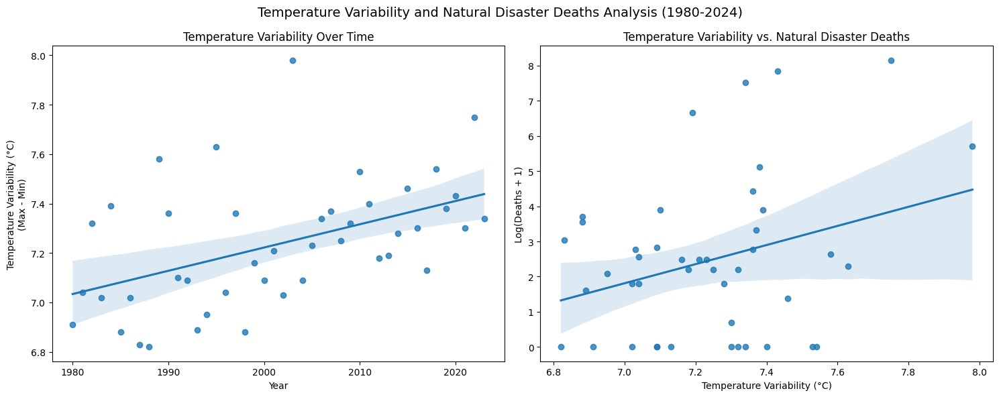

In [18]:
def read_temp_data(filepath):
    """
    Read temperature data and extract annual values.
    Returns a DataFrame with year and annual temperature.
    """
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Skip header
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def process_disaster_data(disasters_df):
    """
    Process disaster data to get annual death totals.
    """
    disasters_df['Total Deaths'] = pd.to_numeric(disasters_df['Total Deaths'], errors='coerce')
    disasters_df['Total Deaths'] = disasters_df['Total Deaths'].fillna(0)
    annual_deaths = disasters_df.groupby('Start Year')['Total Deaths'].sum().reset_index()
    return annual_deaths

def create_analysis_plots(merged_data):
    """
    Create visualization plots for the analysis.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Temperature Variability and Natural Disaster Deaths Analysis (1980-2024)', fontsize=14)
    
    # Temperature variability plot
    sns.regplot(data=merged_data, x='year', y='temp_variability', ax=ax1)
    ax1.set_title('Temperature Variability Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Temperature Variability (°C)\n(Max - Min)')
    
    # Deaths plot (log-transformed)
    merged_data['log_deaths'] = np.log1p(merged_data['Total Deaths'])
    
    # Drop NaN values for the scatter plot
    valid_data = merged_data.dropna(subset=['temp_variability', 'log_deaths'])
    
    sns.regplot(data=valid_data, x='temp_variability', y='log_deaths', ax=ax2)
    ax2.set_title('Temperature Variability vs. Natural Disaster Deaths')
    ax2.set_xlabel('Temperature Variability (°C)')
    ax2.set_ylabel('Log(Deaths + 1)')
    
    plt.tight_layout()
    return fig

# Read temperature data
min_temps = read_temp_data('UK_min_temperature_data.txt')
max_temps = read_temp_data('UK_max_temperature_data.txt')

# Rename columns for clarity
min_temps = min_temps.rename(columns={'annual_temp': 'min_temp'})
max_temps = max_temps.rename(columns={'annual_temp': 'max_temp'})

# Merge temperature data
temp_data = pd.merge(
    min_temps,
    max_temps,
    on='year',
    suffixes=('_min', '_max')
)

# Calculate variability
temp_data['temp_variability'] = temp_data['max_temp'] - temp_data['min_temp']

# Filter for years from 1980
temp_data = temp_data[temp_data['year'] >= 1980].copy()

# Read and process disaster data
disasters_df = pd.read_csv('UK Disasters All - EM-DAT Data.csv')
annual_deaths = process_disaster_data(disasters_df)

# Merge with disaster data
merged_data = pd.merge(
    temp_data,
    annual_deaths,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill missing death counts with 0
merged_data['Total Deaths'] = merged_data['Total Deaths'].fillna(0)

# Create visualizations
fig = create_analysis_plots(merged_data)

# Calculate correlation coefficient
merged_data['log_deaths'] = np.log1p(merged_data['Total Deaths'])
valid_data = merged_data.dropna(subset=['temp_variability', 'log_deaths'])

correlation = pearsonr(
    valid_data['temp_variability'],
    valid_data['log_deaths']
)

print("\nCorrelation Analysis Results:")
print(f"Pearson correlation coefficient: {correlation[0]:.3f}")
print(f"P-value: {correlation[1]:.3f}")

print("\nNumber of valid data points:", len(valid_data))

print("\nSummary Statistics:")
print("\nTemperature Variability (°C):")
print(f"Mean: {valid_data['temp_variability'].mean():.2f}")
print(f"Min: {valid_data['temp_variability'].min():.2f}")
print(f"Max: {valid_data['temp_variability'].max():.2f}")
print(f"Std Dev: {valid_data['temp_variability'].std():.2f}")

print("\nDeaths:")
print(f"Mean: {valid_data['Total Deaths'].mean():.2f}")
print(f"Min: {valid_data['Total Deaths'].min():.2f}")
print(f"Max: {valid_data['Total Deaths'].max():.2f}")
print(f"Std Dev: {valid_data['Total Deaths'].std():.2f}")

### Correlation coefficients and p-values for Max and Min + Temperature Variability vs Number of Disaster Deaths from Extreme Temperature, Flood, Storms (Log transformed + 1)

In [19]:
# Read temperature data
min_temps = read_temp_data('UK_min_temperature_data.txt')
max_temps = read_temp_data('UK_max_temperature_data.txt')

# Rename columns for clarity
min_temps = min_temps.rename(columns={'annual_temp': 'min_temp'})
max_temps = max_temps.rename(columns={'annual_temp': 'max_temp'})

# Merge temperature data
temp_data = pd.merge(min_temps, max_temps, on='year', suffixes=('_min', '_max'))

# Calculate variability
temp_data['temp_variability'] = temp_data['max_temp'] - temp_data['min_temp']

# Filter for years from 1980
temp_data = temp_data[temp_data['year'] >= 1980].copy()

# Read and process disaster data
disasters_df = pd.read_csv('UK Disasters All - EM-DAT Data.csv')
annual_deaths = process_disaster_data(disasters_df)

# Merge with disaster data
merged_data = pd.merge(
    temp_data,
    annual_deaths,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill missing death counts with 0
merged_data['Total Deaths'] = merged_data['Total Deaths'].fillna(0)
merged_data['log_deaths'] = np.log1p(merged_data['Total Deaths'])

# Calculate correlations and p-values
def get_correlation_stats(data, temp_col):
    valid_data = data.dropna(subset=[temp_col, 'log_deaths'])
    corr, p_val = pearsonr(valid_data[temp_col], valid_data['log_deaths'])
    n = len(valid_data)
    return corr, p_val, n

max_corr = get_correlation_stats(merged_data, 'max_temp')
min_corr = get_correlation_stats(merged_data, 'min_temp')
var_corr = get_correlation_stats(merged_data, 'temp_variability')

# Create summary table
summary_data = {
    'Metric': ['Maximum Temperature', 'Minimum Temperature', 'Temperature Variability'],
    'Correlation': [max_corr[0], min_corr[0], var_corr[0]],
    'P-value': [max_corr[1], min_corr[1], var_corr[1]],
    'N': [max_corr[2], min_corr[2], var_corr[2]],
    'Mean': [
        merged_data['max_temp'].mean(),
        merged_data['min_temp'].mean(),
        merged_data['temp_variability'].mean()
    ],
    'Std Dev': [
        merged_data['max_temp'].std(),
        merged_data['min_temp'].std(),
        merged_data['temp_variability'].std()
    ]
}

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.round({
    'Correlation': 3,
    'P-value': 3,
    'Mean': 2,
    'Std Dev': 2
})

print("Temperature Metrics Correlation with Natural Disaster Deaths (1980-2024)")
print(summary_df.to_string(index=False))

# Also display the range of values for context
print("\nRange of Values:")
print(f"Deaths: {merged_data['Total Deaths'].min():.0f} to {merged_data['Total Deaths'].max():.0f}")
print(f"Maximum Temperature: {merged_data['max_temp'].min():.2f}°C to {merged_data['max_temp'].max():.2f}°C")
print(f"Minimum Temperature: {merged_data['min_temp'].min():.2f}°C to {merged_data['min_temp'].max():.2f}°C")
print(f"Temperature Variability: {merged_data['temp_variability'].min():.2f}°C to {merged_data['temp_variability'].max():.2f}°C")

Temperature Metrics Correlation with Natural Disaster Deaths (1980-2024)
                 Metric  Correlation  P-value  N  Mean  Std Dev
    Maximum Temperature        0.316    0.037 44 12.65     0.67
    Minimum Temperature        0.250    0.102 44  5.42     0.54
Temperature Variability        0.307    0.042 44  7.24     0.25

Range of Values:
Deaths: 0 to 3475
Maximum Temperature: 11.21°C to 13.92°C
Minimum Temperature: 4.19°C to 6.32°C
Temperature Variability: 6.82°C to 7.98°C


### Table of values for Max, Min, Temp Variability, and Deaths from Natural Disasters

In [20]:
# Create yearly summary
yearly_summary = merged_data[['year', 'max_temp', 'min_temp', 'temp_variability', 'Total Deaths']].copy()
yearly_summary = yearly_summary.sort_values('year')

# Format the output
yearly_summary = yearly_summary.round({
    'max_temp': 2,
    'min_temp': 2,
    'temp_variability': 2,
    'Total Deaths': 0
})

# Rename columns for clarity
yearly_summary.columns = ['Year', 'Max Temp (°C)', 'Min Temp (°C)', 'Temp Variability (°C)', 'Deaths']

print("Yearly Temperature and Deaths Data (1980-2024)")
print(yearly_summary.to_string(index=False))

# Also show summary statistics for verification
print("\nSummary Statistics:")
print(f"Total deaths: {yearly_summary['Deaths'].sum():.0f}")
print(f"Years with deaths: {(yearly_summary['Deaths'] > 0).sum()}")
print(f"Years with no deaths: {(yearly_summary['Deaths'] == 0).sum()}")
print(f"\nAverage temperature variability: {yearly_summary['Temp Variability (°C)'].mean():.2f}°C")
print(f"Minimum variability: {yearly_summary['Temp Variability (°C)'].min():.2f}°C (Year: {yearly_summary.loc[yearly_summary['Temp Variability (°C)'].idxmin(), 'Year']:.0f})")
print(f"Maximum variability: {yearly_summary['Temp Variability (°C)'].max():.2f}°C (Year: {yearly_summary.loc[yearly_summary['Temp Variability (°C)'].idxmax(), 'Year']:.0f})")

Yearly Temperature and Deaths Data (1980-2024)
 Year  Max Temp (°C)  Min Temp (°C)  Temp Variability (°C)  Deaths
 1980          11.73           4.82                   6.91     0.0
 1981          11.64           4.60                   7.04    12.0
 1982          12.33           5.01                   7.32     0.0
 1983          12.36           5.34                   7.02     5.0
 1984          12.29           4.90                   7.39    48.0
 1985          11.25           4.37                   6.88    34.0
 1986          11.21           4.19                   7.02     0.0
 1987          11.43           4.60                   6.83    20.0
 1988          12.16           5.34                   6.82     0.0
 1989          13.04           5.46                   7.58    13.0
 1990          13.08           5.72                   7.36    83.0
 1991          12.11           5.01                   7.10    48.0
 1992          12.26           5.17                   7.09     0.0
 1993          

### Temperature Variability vs Number of Deaths from Disasters (Pearson, Spearman, Kendall coefficients)

In [21]:
# Calculate various correlations
def comprehensive_correlation(x, y):
    # Pearson with raw values
    pearson_raw = pearsonr(x, y)
    
    # Pearson with log transform
    y_log = np.log1p(y)
    pearson_log = pearsonr(x, y_log)
    
    # Spearman (rank correlation)
    spearman = spearmanr(x, y)
    
    # Kendall's tau
    kendall = kendalltau(x, y)
    
    return {
        'Pearson (raw)': (pearson_raw[0], pearson_raw[1]),
        'Pearson (log)': (pearson_log[0], pearson_log[1]),
        'Spearman': (spearman[0], spearman[1]),
        'Kendall': (kendall[0], kendall[1])
    }

# Get valid data
valid_data = merged_data.dropna(subset=['temp_variability', 'Total Deaths'])

# Calculate correlations
correlations = comprehensive_correlation(
    valid_data['temp_variability'],
    valid_data['Total Deaths']
)

# Create summary table
results = []
for method, (coef, pval) in correlations.items():
    results.append({
        'Method': method,
        'Correlation': coef,
        'P-value': pval
    })

results_df = pd.DataFrame(results)
results_df = results_df.round({
    'Correlation': 3,
    'P-value': 3
})

print("Correlation Analysis Results:")
print("Temperature Variability vs. Natural Disaster Deaths")
print("N =", len(valid_data))
print("\nCorrelation Coefficients and P-values:")
print(results_df.to_string(index=False))

# Additional descriptive statistics to help interpret
print("\nDistribution of Deaths:")
print(f"Mean: {valid_data['Total Deaths'].mean():.1f}")
print(f"Median: {valid_data['Total Deaths'].median():.1f}")
print(f"Skewness: {valid_data['Total Deaths'].skew():.1f}")
print(f"% of years with zero deaths: {(valid_data['Total Deaths'] == 0).mean() * 100:.1f}%")

Correlation Analysis Results:
Temperature Variability vs. Natural Disaster Deaths
N = 44

Correlation Coefficients and P-values:
       Method  Correlation  P-value
Pearson (raw)        0.354    0.019
Pearson (log)        0.307    0.042
     Spearman        0.192    0.212
      Kendall        0.127    0.239

Distribution of Deaths:
Mean: 218.0
Median: 8.5
Skewness: 3.8
% of years with zero deaths: 27.3%


Correlation Analysis Results:
Temperature Metrics vs. Number of Natural Disasters per Year
N = 44

Correlation Coefficients and P-values:
                 Metric        Method  Correlation  P-value
    Maximum Temperature Pearson (raw)        0.268    0.078
    Maximum Temperature Pearson (log)        0.245    0.109
    Maximum Temperature      Spearman        0.246    0.107
    Maximum Temperature       Kendall        0.175    0.119
    Minimum Temperature Pearson (raw)        0.285    0.061
    Minimum Temperature Pearson (log)        0.246    0.108
    Minimum Temperature      Spearman        0.285    0.061
    Minimum Temperature       Kendall        0.214    0.057
Temperature Variability Pearson (raw)        0.106    0.493
Temperature Variability Pearson (log)        0.128    0.408
Temperature Variability      Spearman        0.147    0.342
Temperature Variability       Kendall        0.085    0.451

Distribution of Disaster Counts:
Mean: 2.2
Median: 2.0
Skewness: 1.0
% of years w

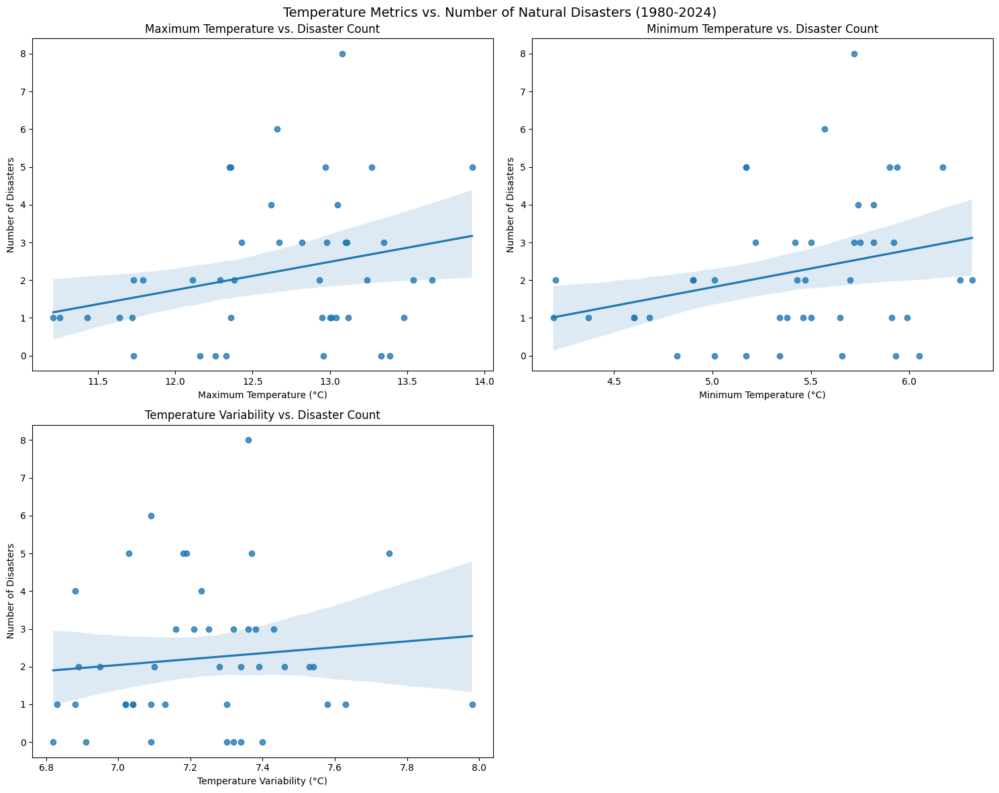

In [22]:
# Calculate disaster counts per year
disaster_counts = disasters_df.groupby('Start Year').size().reset_index(name='disaster_count')

# Merge temperature data with disaster counts
merged_counts = pd.merge(
    temp_data[['year', 'max_temp', 'min_temp', 'temp_variability']],
    disaster_counts,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill missing counts with 0
merged_counts['disaster_count'] = merged_counts['disaster_count'].fillna(0)

# Calculate correlations for each temperature metric
def get_comprehensive_correlations(data, x_col, y_col):
    valid_data = data.dropna(subset=[x_col, y_col])
    
    # Log transform of count (using log1p as we did with deaths)
    y_log = np.log1p(valid_data[y_col])
    
    return {
        'Pearson (raw)': pearsonr(valid_data[x_col], valid_data[y_col]),
        'Pearson (log)': pearsonr(valid_data[x_col], y_log),
        'Spearman': spearmanr(valid_data[x_col], valid_data[y_col]),
        'Kendall': kendalltau(valid_data[x_col], valid_data[y_col])
    }

# Get correlations for each metric
metrics = {
    'Maximum Temperature': 'max_temp',
    'Minimum Temperature': 'min_temp',
    'Temperature Variability': 'temp_variability'
}

results = []
for metric_name, col_name in metrics.items():
    correlations = get_comprehensive_correlations(merged_counts, col_name, 'disaster_count')
    
    for method, (coef, pval) in correlations.items():
        results.append({
            'Metric': metric_name,
            'Method': method,
            'Correlation': coef,
            'P-value': pval
        })

# Create summary table
results_df = pd.DataFrame(results)
results_df = results_df.round({
    'Correlation': 3,
    'P-value': 3
})

print("Correlation Analysis Results:")
print("Temperature Metrics vs. Number of Natural Disasters per Year")
print("N =", len(merged_counts))
print("\nCorrelation Coefficients and P-values:")
print(results_df.to_string(index=False))

# Print distribution statistics
print("\nDistribution of Disaster Counts:")
print(f"Mean: {merged_counts['disaster_count'].mean():.1f}")
print(f"Median: {merged_counts['disaster_count'].median():.1f}")
print(f"Skewness: {merged_counts['disaster_count'].skew():.1f}")
print(f"% of years with no disasters: {(merged_counts['disaster_count'] == 0).mean() * 100:.1f}%")

# Create visualization of the relationships
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Temperature Metrics vs. Number of Natural Disasters (1980-2024)', fontsize=14)

# Plot for each temperature metric
for i, (metric_name, col_name) in enumerate(metrics.items()):
    row = i // 2
    col = i % 2
    
    sns.regplot(data=merged_counts, 
                x=col_name, 
                y='disaster_count',
                ax=axes[row, col])
    
    axes[row, col].set_title(f'{metric_name} vs. Disaster Count')
    axes[row, col].set_xlabel(f'{metric_name} (°C)')
    axes[row, col].set_ylabel('Number of Disasters')

# Remove the empty subplot
axes[1, 1].remove()

plt.tight_layout()

### Summary of Correlations and Disaster Statistics

Correlation statistics for Maximum Temperature:
Pearson Correlation: 0.316, p-value: 0.037
Spearman Correlation: 0.229, p-value: 0.135
Correlation statistics for Minimum Temperature:
Pearson Correlation: 0.250, p-value: 0.102
Spearman Correlation: 0.157, p-value: 0.309
Correlation statistics for Temperature Variability:
Pearson Correlation: 0.307, p-value: 0.042
Spearman Correlation: 0.192, p-value: 0.212
Correlation statistics for Maximum Temperature:
Pearson Correlation: 0.399, p-value: 0.007
Spearman Correlation: 0.315, p-value: 0.037
Correlation statistics for Minimum Temperature:
Pearson Correlation: 0.333, p-value: 0.027
Spearman Correlation: 0.253, p-value: 0.098
Correlation statistics for Temperature Variability:
Pearson Correlation: 0.351, p-value: 0.020
Spearman Correlation: 0.251, p-value: 0.100

Summary Statistics:

All Natural Disasters:
Total disasters: 98
Total deaths: 9592
Mean disasters per year: 2.2
Mean deaths per year: 218.0
Median disasters per year: 2.0
Median dea

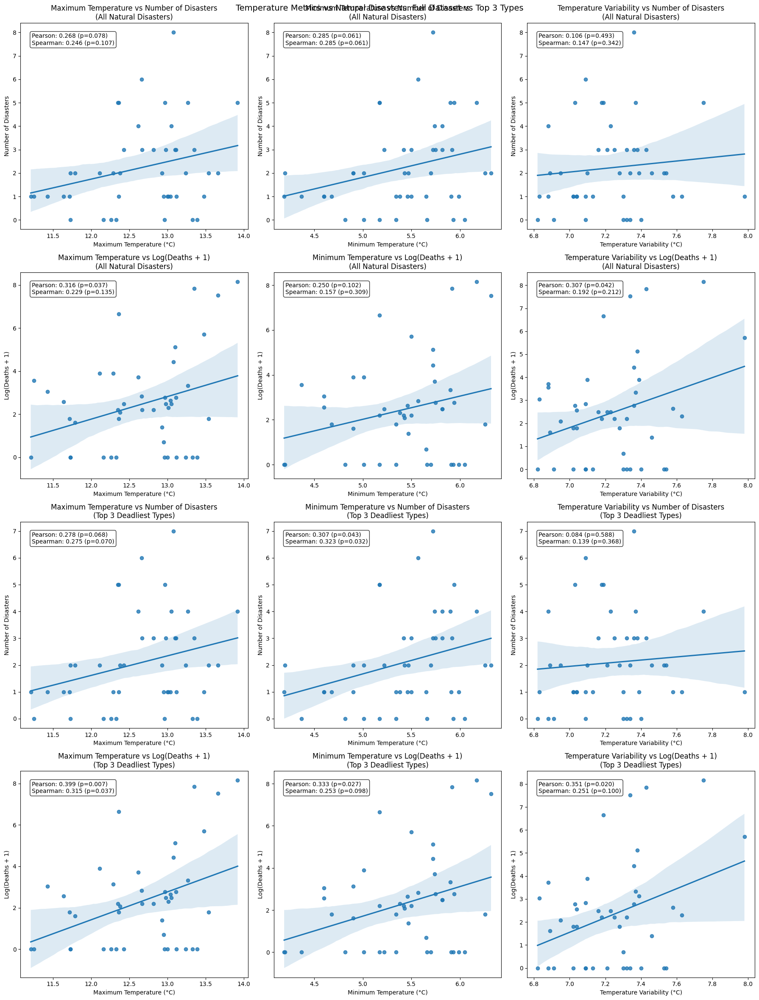

In [23]:
# Read and process the data
all_disasters = pd.read_csv('UK Disasters All - EM-DAT Data.csv')
deadly_types = ['Extreme temperature', 'Storm', 'Flood']
filtered_disasters = all_disasters[all_disasters['Disaster Type'].isin(deadly_types)]

def process_annual_data(df):
    # Get counts
    counts = df.groupby('Start Year').size().reset_index(name='disaster_count')
    # Get deaths
    deaths = df.groupby('Start Year')['Total Deaths'].sum().reset_index()
    # Merge counts and deaths
    return pd.merge(counts, deaths, on='Start Year')

all_data = process_annual_data(all_disasters)
filtered_data = process_annual_data(filtered_disasters)

# Merge with temperature data
def merge_temp_data(data_df):
    merged = pd.merge(
        temp_data[['year', 'max_temp', 'min_temp', 'temp_variability']],
        data_df,
        left_on='year',
        right_on='Start Year',
        how='left'
    )
    merged['disaster_count'] = merged['disaster_count'].fillna(0)
    merged['Total Deaths'] = merged['Total Deaths'].fillna(0)
    merged['log_deaths'] = np.log1p(merged['Total Deaths'])
    return merged

all_merged = merge_temp_data(all_data)
filtered_merged = merge_temp_data(filtered_data)

# Function to add correlation stats to plot
def add_stats_to_plot(ax, x, y, title):
    pearson = pearsonr(x, y)
    spearman = spearmanr(x, y)
    stats_text = f'Pearson: {pearson[0]:.3f} (p={pearson[1]:.3f})\nSpearman: {spearman[0]:.3f} (p={spearman[1]:.3f})'
    ax.text(0.05, 0.95, stats_text, 
            transform=ax.transAxes,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    ax.set_title(title)
    
# Output correlation stats
def output_stats_as_text(x, y, metric_name):
    pearson = pearsonr(x, y)
    spearman = spearmanr(x, y)
    print(f"Correlation statistics for {metric_name}:")
    print(f"Pearson Correlation: {pearson[0]:.3f}, p-value: {pearson[1]:.3f}")
    print(f"Spearman Correlation: {spearman[0]:.3f}, p-value: {spearman[1]:.3f}")

# Create plots
fig, axes = plt.subplots(4, 3, figsize=(18, 24))
fig.suptitle('Temperature Metrics vs Natural Disasters: Full Dataset vs Top 3 Types', fontsize=14)

# Plot comparisons
datasets = [(all_merged, 'All Natural Disasters'), (filtered_merged, 'Top 3 Deadliest Types')]
metrics = ['max_temp', 'min_temp', 'temp_variability']
metric_names = ['Maximum Temperature', 'Minimum Temperature', 'Temperature Variability']

for i, (data, title) in enumerate(datasets):
    # Plots for disaster counts
    row = i * 2
    for j, (metric, metric_name) in enumerate(zip(metrics, metric_names)):
        sns.regplot(data=data, 
                   x=metric, 
                   y='disaster_count',
                   ax=axes[row, j])
        add_stats_to_plot(axes[row, j], 
                         data[metric], 
                         data['disaster_count'],
                         f'{metric_name} vs Number of Disasters\n({title})')
        axes[row, j].set_xlabel(f'{metric_name} (°C)')
        axes[row, j].set_ylabel('Number of Disasters')
    
    # Plots for deaths (log-transformed)
    row = i * 2 + 1
    for j, (metric, metric_name) in enumerate(zip(metrics, metric_names)):
        sns.regplot(data=data, 
                   x=metric, 
                   y='log_deaths',
                   ax=axes[row, j])
        add_stats_to_plot(axes[row, j], 
                         data[metric], 
                         data['log_deaths'],
                         f'{metric_name} vs Log(Deaths + 1)\n({title})')
        output_stats_as_text(data[metric], 
                         data['log_deaths'],
                         metric_name)
        axes[row, j].set_xlabel(f'{metric_name} (°C)')
        axes[row, j].set_ylabel('Log(Deaths + 1)')

plt.tight_layout()

# Print summary statistics
print("\nSummary Statistics:")
for dataset, title in [(all_merged, "All Natural Disasters"), (filtered_merged, "Top 3 Deadliest Types")]:
    print(f"\n{title}:")
    print(f"Total disasters: {int(dataset['disaster_count'].sum())}")
    print(f"Total deaths: {int(dataset['Total Deaths'].sum())}")
    print(f"Mean disasters per year: {dataset['disaster_count'].mean():.1f}")
    print(f"Mean deaths per year: {dataset['Total Deaths'].mean():.1f}")
    print(f"Median disasters per year: {dataset['disaster_count'].median():.1f}")
    print(f"Median deaths per year: {dataset['Total Deaths'].median():.1f}")
    print(f"Years with no disasters: {(dataset['disaster_count'] == 0).sum()}")
    print(f"Years with no deaths: {(dataset['Total Deaths'] == 0).sum()}")


Correlation Analysis Results:
Pearson correlation coefficient: -0.192
P-value: 0.224

Number of valid data points: 42

Summary Statistics for Temperature Variability:
count    42.000000
mean      0.225330
std       0.092930
min       0.077006
25%       0.141782
50%       0.229672
75%       0.281820
max       0.442176
Name: temp_variability, dtype: float64

Summary Statistics for Death Changes:
count      44.000000
mean       41.795455
std       810.884604
min     -2557.000000
25%        -7.250000
50%         0.000000
75%        10.250000
max      3474.000000
Name: Deaths_change, dtype: float64


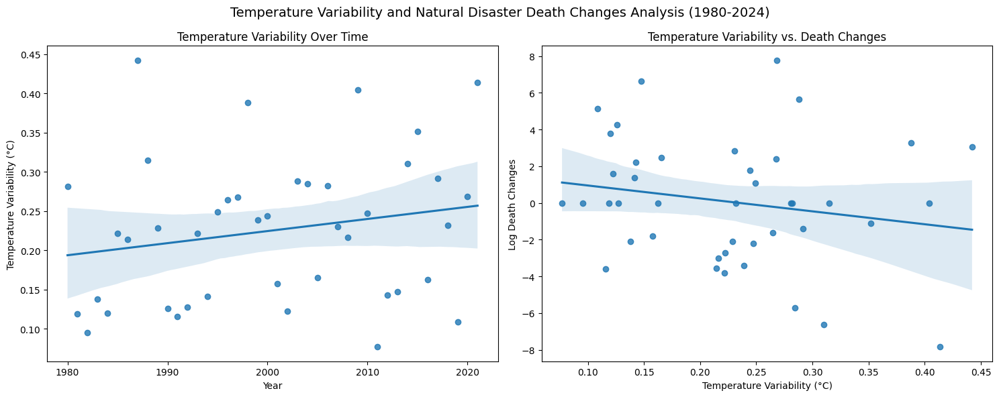

In [24]:
def read_temperature_data(filepath):
    """
    Read temperature data and extract annual values.
    Returns a DataFrame with year and annual temperature.
    """
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    annual_data = []
    for line in lines:
        if 'ann  year' in line:  # Skip header
            continue
        try:
            values = line.strip().split()
            # Annual temperature is in the second-to-last column
            if len(values) >= 2 and values[-2].replace('.', '').replace('-', '').isdigit():
                year = int(values[-1])
                temp = float(values[-2])
                annual_data.append({
                    'year': year,
                    'annual_temp': temp
                })
        except:
            continue
            
    return pd.DataFrame(annual_data)

def calculate_temp_variability(min_temps, max_temps):
    """
    Calculate annual temperature variability using standard deviation.
    """
    # Merge max and min temperatures
    temp_data = pd.merge(
        max_temps.rename(columns={'annual_temp': 'max_temp'}),
        min_temps.rename(columns={'annual_temp': 'min_temp'}),
        on='year'
    )
    
    # Calculate temperature range for each year
    temp_data['temp_range'] = temp_data['max_temp'] - temp_data['min_temp']
    
    # Calculate standard deviation of the range
    temp_data['temp_variability'] = temp_data['temp_range'].rolling(window=5, center=True).std()
    
    return temp_data

def process_disaster_data(disasters_df):
    """
    Process disaster data to get annual death totals and calculate changes.
    """
    # Convert 'Total Deaths' to numeric, treating non-numeric values as NaN
    disasters_df['Total Deaths'] = pd.to_numeric(disasters_df['Total Deaths'], errors='coerce')
    
    # Fill NaN values with 0
    disasters_df['Total Deaths'] = disasters_df['Total Deaths'].fillna(0)
    
    # Group by year and sum deaths
    annual_deaths = disasters_df.groupby('Start Year')['Total Deaths'].sum().reset_index()
    
    # Calculate year-over-year changes in deaths
    annual_deaths = annual_deaths.sort_values('Start Year')
    annual_deaths['Deaths_change'] = annual_deaths['Total Deaths'].diff()
    
    return annual_deaths

def create_analysis_plots(merged_data):
    """
    Create visualization plots for the temperature variability vs death changes analysis.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Temperature Variability and Natural Disaster Death Changes Analysis (1980-2024)', fontsize=14)
    
    # Temperature variability plot
    sns.regplot(data=merged_data, x='year', y='temp_variability', ax=ax1)
    ax1.set_title('Temperature Variability Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Temperature Variability (°C)')
    
    # Deaths change plot (log-transformed)
    # Use sign-preserving log transform for death changes
    merged_data['log_deaths_change'] = np.sign(merged_data['Deaths_change']) * \
                                     np.log1p(np.abs(merged_data['Deaths_change']))
    
    # Drop NaN values for the scatter plot
    valid_data = merged_data.dropna(subset=['temp_variability', 'log_deaths_change'])
    
    sns.regplot(data=valid_data, 
               x='temp_variability', 
               y='log_deaths_change',
               ax=ax2)
    ax2.set_title('Temperature Variability vs. Death Changes')
    ax2.set_xlabel('Temperature Variability (°C)')
    ax2.set_ylabel('Log Death Changes')
    
    plt.tight_layout()
    return fig

# Read temperature data
min_temps = read_temperature_data('UK_min_temperature_data.txt')
max_temps = read_temperature_data('UK_max_temperature_data.txt')

# Calculate temperature variability
temp_var = calculate_temp_variability(min_temps, max_temps)

# Filter for 1980 onwards
temp_var = temp_var[temp_var['year'] >= 1980].copy()

# Read and process disaster data
disasters_df = pd.read_csv('UK Disasters All - EM-DAT Data.csv')
annual_deaths = process_disaster_data(disasters_df)

# Merge datasets
merged_data = pd.merge(
    temp_var,
    annual_deaths,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill any missing death changes with 0
merged_data['Deaths_change'] = merged_data['Deaths_change'].fillna(0)

# Create visualizations
fig = create_analysis_plots(merged_data)

# Calculate correlation coefficient
valid_data = merged_data.dropna(subset=['temp_variability', 'Deaths_change'])
correlation = pearsonr(
    valid_data['temp_variability'],
    np.sign(valid_data['Deaths_change']) * np.log1p(np.abs(valid_data['Deaths_change']))
)

print("\nCorrelation Analysis Results:")
print(f"Pearson correlation coefficient: {correlation[0]:.3f}")
print(f"P-value: {correlation[1]:.3f}")
print(f"\nNumber of valid data points: {len(valid_data)}")

# Print summary statistics
print("\nSummary Statistics for Temperature Variability:")
print(merged_data['temp_variability'].describe())

print("\nSummary Statistics for Death Changes:")
print(merged_data['Deaths_change'].describe())

In [25]:
met_data = pd.read_csv('MET Office Weather Data.csv')

met_data_1980 = met_data[met_data['year'] >= 1980]
met_data_1980.head(10)

,year,month,tmax,tmin,af,rain,sun,station
468,1980.0,1.0,5.8,1.0,9.0,57.9,78.7,aberporth
469,1980.0,2.0,8.7,4.3,0.0,89.9,49.8,aberporth
470,1980.0,3.0,7.5,2.9,4.0,91.6,95.7,aberporth
471,1980.0,4.0,10.5,5.6,0.0,21.4,169.0,aberporth
472,1980.0,5.0,14.5,7.2,0.0,27.5,236.7,aberporth
473,1980.0,6.0,15.2,10.2,0.0,76.4,143.8,aberporth
474,1980.0,7.0,16.6,11.0,0.0,53.9,170.3,aberporth
475,1980.0,8.0,17.7,12.5,0.0,66.3,138.6,aberporth
476,1980.0,9.0,16.4,11.5,0.0,75.4,122.6,aberporth
477,1980.0,10.0,11.8,7.2,0.0,119.3,78.7,aberporth



Correlation Analysis: Rainfall vs Natural Disasters
--------------------------------------------------

Rainfall vs Number of Disasters:
Pearson correlation: 0.436 (p=0.004)

Rainfall vs Total Deaths:
Pearson correlation: -0.103 (p=0.523)
Spearman correlation: 0.007 (p=0.967)

Rainfall vs Log(Deaths + 1):
Pearson correlation: -0.030 (p=0.851)
Spearman correlation: 0.007 (p=0.967)

Summary Statistics:
--------------------------------------------------
Mean annual rainfall: 77.3 mm
Standard deviation of rainfall: 7.3 mm
Minimum annual rainfall: 60.7 mm
Maximum annual rainfall: 94.4 mm


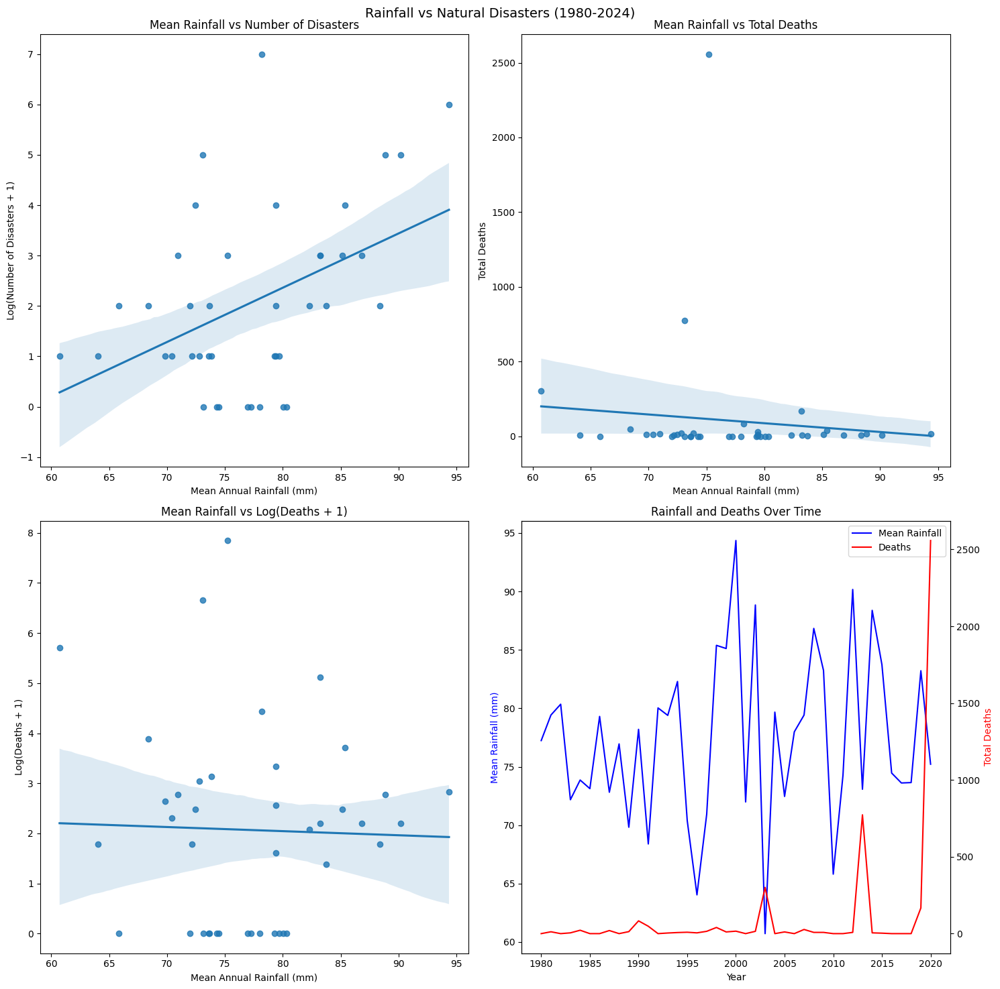

In [26]:
# Calculate annual mean rainfall across all stations
annual_rainfall = met_data_1980.groupby('year')['rain'].mean().reset_index()
annual_rainfall = annual_rainfall.rename(columns={'rain': 'mean_rainfall'})

# Create merged dataset with disaster data
rainfall_merged = pd.merge(
    annual_rainfall,
    filtered_data,
    left_on='year',
    right_on='Start Year',
    how='left'
)

# Fill missing values with 0 for disaster metrics
rainfall_merged['disaster_count'] = rainfall_merged['disaster_count'].fillna(0)
rainfall_merged['Total Deaths'] = rainfall_merged['Total Deaths'].fillna(0)
rainfall_merged['log_deaths'] = np.log1p(rainfall_merged['Total Deaths'])

# Calculate correlations
rain_disasters_pearson = pearsonr(rainfall_merged['mean_rainfall'], rainfall_merged['disaster_count'])
rain_death_pearson = pearsonr(rainfall_merged['mean_rainfall'], rainfall_merged['Total Deaths'])
rain_death_spearman = spearmanr(rainfall_merged['mean_rainfall'], rainfall_merged['Total Deaths'])
rain_logdeath_pearson = pearsonr(rainfall_merged['mean_rainfall'], rainfall_merged['log_deaths'])
rain_logdeath_spearman = spearmanr(rainfall_merged['mean_rainfall'], rainfall_merged['log_deaths'])

# Create visualization
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Rainfall vs Natural Disasters (1980-2024)', fontsize=14)

# Plot 1: Rainfall vs Number of Disasters
sns.regplot(data=rainfall_merged, x='mean_rainfall', y='disaster_count', ax=ax1)
ax1.set_title('Mean Rainfall vs Number of Disasters')
ax1.set_xlabel('Mean Annual Rainfall (mm)')
ax1.set_ylabel('Log(Number of Disasters + 1)')

# Plot 2: Rainfall vs Total Deaths
sns.regplot(data=rainfall_merged, x='mean_rainfall', y='Total Deaths', ax=ax2)
ax2.set_title('Mean Rainfall vs Total Deaths')
ax2.set_xlabel('Mean Annual Rainfall (mm)')
ax2.set_ylabel('Total Deaths')

# Plot 3: Rainfall vs Log Deaths
sns.regplot(data=rainfall_merged, x='mean_rainfall', y='log_deaths', ax=ax3)
ax3.set_title('Mean Rainfall vs Log(Deaths + 1)')
ax3.set_xlabel('Mean Annual Rainfall (mm)')
ax3.set_ylabel('Log(Deaths + 1)')

# Plot 4: Time series of rainfall and deaths
ax4.plot(rainfall_merged['year'], rainfall_merged['mean_rainfall'], label='Mean Rainfall', color='blue')
ax4_twin = ax4.twinx()
ax4_twin.plot(rainfall_merged['year'], rainfall_merged['Total Deaths'], label='Deaths', color='red')
ax4.set_title('Rainfall and Deaths Over Time')
ax4.set_xlabel('Year')
ax4.set_ylabel('Mean Rainfall (mm)', color='blue')
ax4_twin.set_ylabel('Total Deaths', color='red')

# Add legends and adjust layout
lines1, labels1 = ax4.get_legend_handles_labels()
lines2, labels2 = ax4_twin.get_legend_handles_labels()
ax4.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.tight_layout()

# Print correlation statistics
print("\nCorrelation Analysis: Rainfall vs Natural Disasters")
print("-" * 50)
print("\nRainfall vs Number of Disasters:")
print(f"Pearson correlation: {rain_disasters_pearson[0]:.3f} (p={rain_disasters_pearson[1]:.3f})")
print("\nRainfall vs Total Deaths:")
print(f"Pearson correlation: {rain_death_pearson[0]:.3f} (p={rain_death_pearson[1]:.3f})")
print(f"Spearman correlation: {rain_death_spearman[0]:.3f} (p={rain_death_spearman[1]:.3f})")
print("\nRainfall vs Log(Deaths + 1):")
print(f"Pearson correlation: {rain_logdeath_pearson[0]:.3f} (p={rain_logdeath_pearson[1]:.3f})")
print(f"Spearman correlation: {rain_logdeath_spearman[0]:.3f} (p={rain_logdeath_spearman[1]:.3f})")

# Print summary statistics
print("\nSummary Statistics:")
print("-" * 50)
print(f"Mean annual rainfall: {rainfall_merged['mean_rainfall'].mean():.1f} mm")
print(f"Standard deviation of rainfall: {rainfall_merged['mean_rainfall'].std():.1f} mm")
print(f"Minimum annual rainfall: {rainfall_merged['mean_rainfall'].min():.1f} mm")
print(f"Maximum annual rainfall: {rainfall_merged['mean_rainfall'].max():.1f} mm")


Feature Correlations with Log(Deaths + 1):
--------------------------------------------------
mean_abs_zscore      r= 0.400 (p=0.010)
rain_std             r= 0.335 (p=0.032)
rain_3m_std_avg      r= 0.313 (p=0.046)
extreme_rain_days    r= 0.220 (p=0.167)
rain_6m_std_avg      r= 0.204 (p=0.201)
rain_max             r= 0.133 (p=0.409)
rain_mean            r=-0.039 (p=0.807)
rain_min             r= 0.018 (p=0.911)

Seasonal Patterns:
--------------------------------------------------
         rain        is_extreme_rain
         mean    std             sum
season                              
Winter  79.01  31.74               6
Spring  58.88  24.09               0
Summer  72.18  26.24               0
Fall    99.86  30.67              12


/var/folders/ss/7gdz3mj52njb_7zt7jv9wj2r0000gp/T/ipykernel_10962/3635866564.py:114: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_stats = monthly_features.groupby('season').agg({


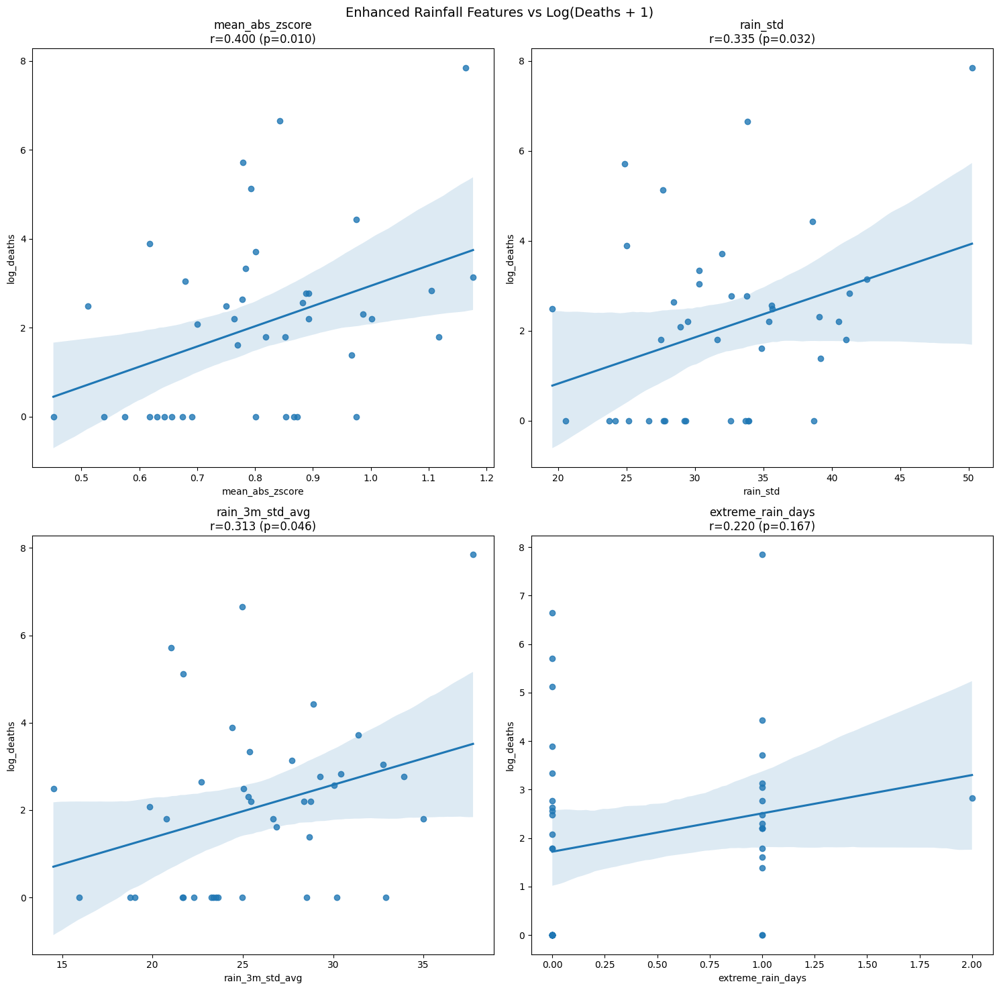

In [27]:
# First, let's create monthly aggregated data
monthly_rainfall = met_data_1980.groupby(['year', 'month'])['rain'].mean().reset_index()

# Create rolling statistics and temporal features
def create_rainfall_features(df):
    # Sort by year and month
    df = df.sort_values(['year', 'month'])
    
    # Rolling statistics
    df['rain_3m_avg'] = df['rain'].rolling(window=3).mean()
    df['rain_6m_avg'] = df['rain'].rolling(window=6).mean()
    df['rain_12m_avg'] = df['rain'].rolling(window=12).mean()
    
    # Variability metrics
    df['rain_3m_std'] = df['rain'].rolling(window=3).std()
    df['rain_6m_std'] = df['rain'].rolling(window=6).std()
    
    # Change metrics
    df['rain_mom_change'] = df['rain'].diff()
    df['rain_yoy_change'] = df['rain'].diff(12)
    
    # Seasonal indicators
    df['season'] = pd.cut(df['month'], 
                         bins=[0, 3, 6, 9, 12], 
                         labels=['Winter', 'Spring', 'Summer', 'Fall'])
    
    # Extreme indicators
    df['rain_zscore'] = (df['rain'] - df['rain'].mean()) / df['rain'].std()
    df['is_extreme_rain'] = abs(df['rain_zscore']) > 2
    
    return df

# Apply features
monthly_features = create_rainfall_features(monthly_rainfall)

# Aggregate to annual level with multiple metrics
annual_features = pd.DataFrame()
annual_features['year'] = monthly_features['year'].unique()

# Calculate annual metrics
annual_stats = monthly_features.groupby('year').agg({
    'rain': ['mean', 'std', 'max', 'min'],
    'rain_3m_std': 'mean',
    'rain_6m_std': 'mean',
    'is_extreme_rain': 'sum',
    'rain_zscore': lambda x: np.mean(abs(x))
}).reset_index()

# Flatten column names
annual_stats.columns = ['year', 'rain_mean', 'rain_std', 'rain_max', 'rain_min', 
                       'rain_3m_std_avg', 'rain_6m_std_avg', 'extreme_rain_days',
                       'mean_abs_zscore']

# Merge with disaster data
rainfall_features_merged = pd.merge(
    annual_stats,
    filtered_data[['Start Year', 'Total Deaths']],
    left_on='year',
    right_on='Start Year',
    how='left'
)

rainfall_features_merged['log_deaths'] = np.log1p(rainfall_features_merged['Total Deaths'].fillna(0))

# Calculate correlations
feature_correlations = {}
for column in annual_stats.columns[1:]:  # Skip 'year' column
    if rainfall_features_merged[column].dtype in ['float64', 'int64']:
        correlation = pearsonr(
            rainfall_features_merged[column], 
            rainfall_features_merged['log_deaths']
        )
        feature_correlations[column] = {
            'correlation': correlation[0],
            'p_value': correlation[1]
        }

# Visualize the most important relationships
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Enhanced Rainfall Features vs Log(Deaths + 1)', fontsize=14)

# Sort features by absolute correlation
sorted_features = sorted(
    feature_correlations.items(), 
    key=lambda x: abs(x[1]['correlation']),
    reverse=True
)

# Plot top 4 correlations
for idx, (feature, stats) in enumerate(sorted_features[:4]):
    row = idx // 2
    col = idx % 2
    
    sns.regplot(
        data=rainfall_features_merged,
        x=feature,
        y='log_deaths',
        ax=axes[row, col]
    )
    
    axes[row, col].set_title(
        f'{feature}\nr={stats["correlation"]:.3f} (p={stats["p_value"]:.3f})'
    )

plt.tight_layout()

# Print feature importance summary
print("\nFeature Correlations with Log(Deaths + 1):")
print("-" * 50)
for feature, stats in sorted_features:
    print(f"{feature:20} r={stats['correlation']:6.3f} (p={stats['p_value']:.3f})")

# Calculate seasonal patterns
seasonal_stats = monthly_features.groupby('season').agg({
    'rain': ['mean', 'std'],
    'is_extreme_rain': 'sum'
}).round(2)

print("\nSeasonal Patterns:")
print("-" * 50)
print(seasonal_stats)


Sunshine Feature Correlations with Log(Deaths + 1):
--------------------------------------------------
sun_mean             r= 0.411 (p=0.008)
sun_abs_zscore       r= 0.403 (p=0.009)
sun_3m_std_avg       r= 0.344 (p=0.028)
sun_std              r= 0.311 (p=0.048)
extreme_sun_days     r= 0.298 (p=0.059)
sun_6m_std_avg       r= 0.225 (p=0.158)
sun_max              r= 0.170 (p=0.288)
sun_min              r= 0.057 (p=0.726)

Seasonal Sunshine Patterns:
--------------------------------------------------
           sun        is_extreme_sun
          mean    std            sum
season                              
Winter   78.42  29.80              0
Spring  178.42  31.22              4
Summer  160.81  33.37              5
Fall     67.13  24.72              0


/var/folders/ss/7gdz3mj52njb_7zt7jv9wj2r0000gp/T/ipykernel_10962/3589444810.py:109: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_sun_stats = monthly_sun_features.groupby('season').agg({


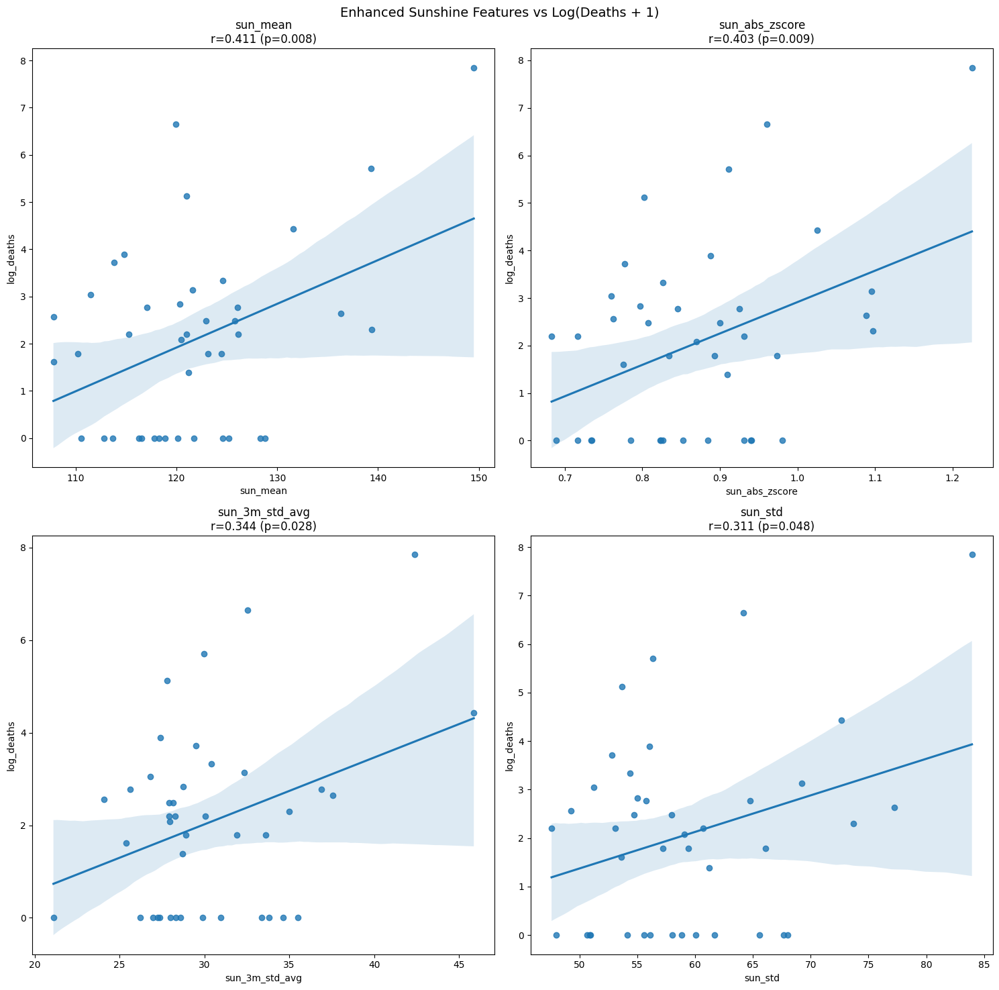

In [28]:
# Create monthly aggregated sunshine data
monthly_sunshine = met_data_1980.groupby(['year', 'month'])['sun'].mean().reset_index()

# Create sunshine features
def create_sunshine_features(df):
    df = df.sort_values(['year', 'month'])
    
    # Rolling statistics
    df['sun_3m_avg'] = df['sun'].rolling(window=3).mean()
    df['sun_6m_avg'] = df['sun'].rolling(window=6).mean()
    df['sun_12m_avg'] = df['sun'].rolling(window=12).mean()
    
    # Variability metrics
    df['sun_3m_std'] = df['sun'].rolling(window=3).std()
    df['sun_6m_std'] = df['sun'].rolling(window=6).std()
    
    # Change metrics
    df['sun_mom_change'] = df['sun'].diff()
    df['sun_yoy_change'] = df['sun'].diff(12)
    
    # Seasonal indicators
    df['season'] = pd.cut(df['month'], 
                         bins=[0, 3, 6, 9, 12], 
                         labels=['Winter', 'Spring', 'Summer', 'Fall'])
    
    # Extreme indicators
    df['sun_zscore'] = (df['sun'] - df['sun'].mean()) / df['sun'].std()
    df['is_extreme_sun'] = abs(df['sun_zscore']) > 2
    
    return df

# Apply features
monthly_sun_features = create_sunshine_features(monthly_sunshine)

# Aggregate to annual level
annual_sun_stats = monthly_sun_features.groupby('year').agg({
    'sun': ['mean', 'std', 'max', 'min'],
    'sun_3m_std': 'mean',
    'sun_6m_std': 'mean',
    'is_extreme_sun': 'sum',
    'sun_zscore': lambda x: np.mean(abs(x))
}).reset_index()

# Flatten column names
annual_sun_stats.columns = ['year', 'sun_mean', 'sun_std', 'sun_max', 'sun_min', 
                          'sun_3m_std_avg', 'sun_6m_std_avg', 'extreme_sun_days',
                          'sun_abs_zscore']

# Merge with disaster data
sunshine_features_merged = pd.merge(
    annual_sun_stats,
    filtered_data[['Start Year', 'Total Deaths']],
    left_on='year',
    right_on='Start Year',
    how='left'
)

sunshine_features_merged['log_deaths'] = np.log1p(sunshine_features_merged['Total Deaths'].fillna(0))

# Calculate correlations for sunshine features
sun_feature_correlations = {}
for column in annual_sun_stats.columns[1:]:  # Skip 'year' column
    if sunshine_features_merged[column].dtype in ['float64', 'int64']:
        correlation = pearsonr(
            sunshine_features_merged[column], 
            sunshine_features_merged['log_deaths'].fillna(0)
        )
        sun_feature_correlations[column] = {
            'correlation': correlation[0],
            'p_value': correlation[1]
        }

# Visualize the most important relationships
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Enhanced Sunshine Features vs Log(Deaths + 1)', fontsize=14)

# Sort features by absolute correlation
sorted_sun_features = sorted(
    sun_feature_correlations.items(), 
    key=lambda x: abs(x[1]['correlation']),
    reverse=True
)

# Plot top 4 correlations
for idx, (feature, stats) in enumerate(sorted_sun_features[:4]):
    row = idx // 2
    col = idx % 2
    
    sns.regplot(
        data=sunshine_features_merged,
        x=feature,
        y='log_deaths',
        ax=axes[row, col]
    )
    
    axes[row, col].set_title(
        f'{feature}\nr={stats["correlation"]:.3f} (p={stats["p_value"]:.3f})'
    )

plt.tight_layout()

# Print feature importance summary
print("\nSunshine Feature Correlations with Log(Deaths + 1):")
print("-" * 50)
for feature, stats in sorted_sun_features:
    print(f"{feature:20} r={stats['correlation']:6.3f} (p={stats['p_value']:.3f})")

# Calculate seasonal patterns for sunshine
seasonal_sun_stats = monthly_sun_features.groupby('season').agg({
    'sun': ['mean', 'std'],
    'is_extreme_sun': 'sum'
}).round(2)

print("\nSeasonal Sunshine Patterns:")
print("-" * 50)
print(seasonal_sun_stats)



In [29]:
# First, let's check our column names
print("Temperature data columns:", temp_data.columns.tolist())
print("\nRainfall data columns:", annual_stats.columns.tolist())
print("\nSunshine data columns:", annual_sun_stats.columns.tolist())
print("\nDisaster data columns:", filtered_data.columns.tolist())

def create_engineered_features(temp_data, rain_data, sun_data, disaster_data):
    """
    Create engineered features from weather and disaster data with correct column names
    """
    
    # Get the actual column names from rain_data
    rain_columns = rain_data.columns.tolist()
    print("\nUsing rainfall columns:", rain_columns)
    
    # Merge all weather data
    base_features = pd.merge(
        temp_data[['year', 'max_temp', 'min_temp', 'temp_variability']],
        rain_data,  # Use all columns for now
        on='year',
        how='outer'
    )
    
    base_features = pd.merge(
        base_features,
        sun_data[['year', 'sun_mean', 'sun_std', 'sun_abs_zscore']],
        on='year',
        how='outer'
    )
    
    # Print the columns we have after merging
    print("\nColumns after merge:", base_features.columns.tolist())
    
    return base_features

# Create initial merged dataset
merged_features = create_engineered_features(
    temp_data,
    annual_stats,
    annual_sun_stats,
    filtered_data
)

Temperature data columns: ['year', 'min_temp', 'max_temp', 'temp_variability']

Rainfall data columns: ['year', 'rain_mean', 'rain_std', 'rain_max', 'rain_min', 'rain_3m_std_avg', 'rain_6m_std_avg', 'extreme_rain_days', 'mean_abs_zscore']

Sunshine data columns: ['year', 'sun_mean', 'sun_std', 'sun_max', 'sun_min', 'sun_3m_std_avg', 'sun_6m_std_avg', 'extreme_sun_days', 'sun_abs_zscore']

Disaster data columns: ['Start Year', 'disaster_count', 'Total Deaths']

Using rainfall columns: ['year', 'rain_mean', 'rain_std', 'rain_max', 'rain_min', 'rain_3m_std_avg', 'rain_6m_std_avg', 'extreme_rain_days', 'mean_abs_zscore']

Columns after merge: ['year', 'max_temp', 'min_temp', 'temp_variability', 'rain_mean', 'rain_std', 'rain_max', 'rain_min', 'rain_3m_std_avg', 'rain_6m_std_avg', 'extreme_rain_days', 'mean_abs_zscore', 'sun_mean', 'sun_std', 'sun_abs_zscore']


### Feature correlation matrix


Correlations with log(deaths + 1):
--------------------------------------------------
max_temp                  r= 0.399 (p=0.007)
min_temp                  r= 0.333 (p=0.027)
temp_variability          r= 0.351 (p=0.020)
rain_mean                 r=-0.369 (p=0.014)
rain_std                  r=-0.134 (p=0.386)
rain_abs_zscore           r=-0.085 (p=0.586)
sun_mean                  r=-0.277 (p=0.069)
sun_std                   r=-0.217 (p=0.157)
sun_abs_zscore            r=-0.181 (p=0.241)
sun_temp_interaction      r=-0.222 (p=0.148)
rain_temp_interaction     r=-0.324 (p=0.032)
sun_rain_interaction      r=-0.285 (p=0.061)
extreme_weather_score     r=-0.311 (p=0.040)
volatility_index          r=-0.333 (p=0.027)


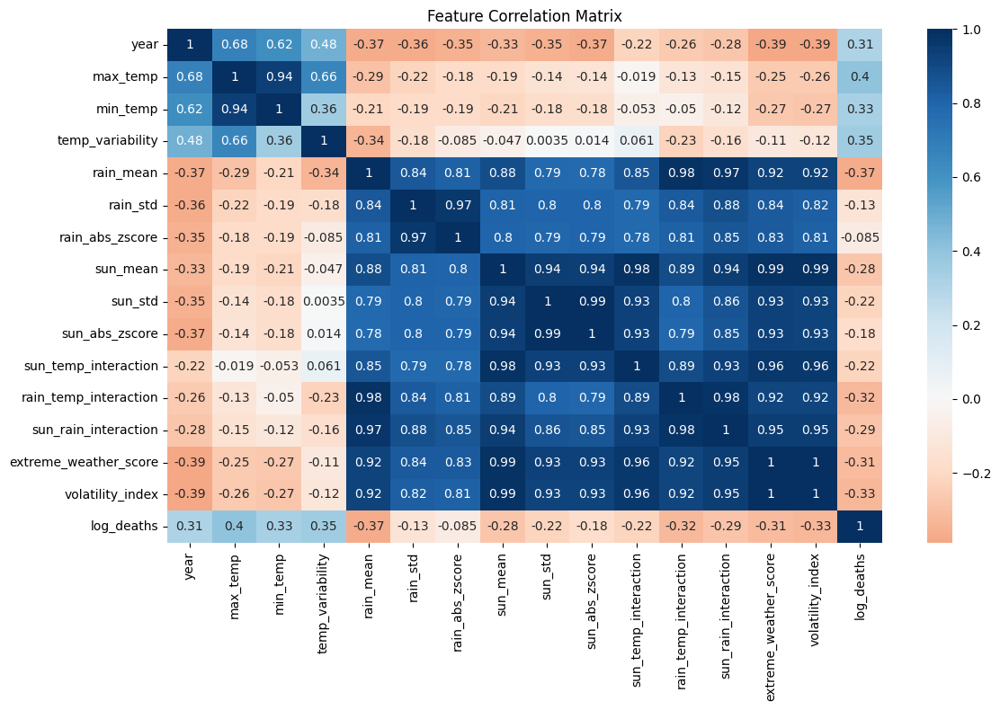

In [30]:
# First, let's properly organize our monthly rainfall data
monthly_rainfall = met_data_1980.groupby(['year', 'month'])['rain'].mean().reset_index()

# Create rainfall features similar to sunshine features
def create_rainfall_features(df):
    df = df.sort_values(['year', 'month'])
    
    # Rolling statistics
    df['rain_3m_avg'] = df['rain'].rolling(window=3).mean()
    df['rain_6m_avg'] = df['rain'].rolling(window=6).mean()
    df['rain_12m_avg'] = df['rain'].rolling(window=12).mean()
    
    # Variability metrics
    df['rain_3m_std'] = df['rain'].rolling(window=3).std()
    df['rain_6m_std'] = df['rain'].rolling(window=6).std()
    
    # Change metrics
    df['rain_mom_change'] = df['rain'].diff()
    df['rain_yoy_change'] = df['rain'].diff(12)
    
    # Extreme indicators
    df['rain_zscore'] = (df['rain'] - df['rain'].mean()) / df['rain'].std()
    df['is_extreme_rain'] = abs(df['rain_zscore']) > 2
    
    return df

# Create annual rainfall statistics
monthly_rain_features = create_rainfall_features(monthly_rainfall)
annual_rain_stats = monthly_rain_features.groupby('year').agg({
    'rain': ['mean', 'std', 'max', 'min'],
    'rain_3m_std': 'mean',
    'rain_6m_std': 'mean',
    'is_extreme_rain': 'sum',
    'rain_zscore': lambda x: np.mean(abs(x))
}).reset_index()

# Flatten column names
annual_rain_stats.columns = ['year', 'rain_mean', 'rain_std', 'rain_max', 'rain_min', 
                           'rain_3m_std_avg', 'rain_6m_std_avg', 'extreme_rain_days',
                           'rain_abs_zscore']

# Pre-process disaster data
disaster_data = pd.merge(
    filtered_data[['Start Year', 'Total Deaths']],
    pd.DataFrame({'Start Year': range(1980, 2025)}),  # Create full year range
    how='right',
    on='Start Year'
)
disaster_data['log_deaths'] = np.log1p(disaster_data['Total Deaths'].fillna(0))
disaster_data = disaster_data.rename(columns={'Start Year': 'year'})

def create_engineered_features(temp_data, rain_data, sun_data, disaster_data):
    """
    Create engineered features from weather and disaster data
    """
    # Merge temperature and rainfall data
    base_features = pd.merge(
        temp_data[['year', 'max_temp', 'min_temp', 'temp_variability']],
        rain_data[['year', 'rain_mean', 'rain_std', 'rain_abs_zscore']],
        on='year',
        how='outer'
    )
    
    # Merge sunshine data
    base_features = pd.merge(
        base_features,
        sun_data[['year', 'sun_mean', 'sun_std', 'sun_abs_zscore']],
        on='year',
        how='outer'
    )
    
    # Create interaction terms
    base_features['sun_temp_interaction'] = (
        base_features['sun_mean'] * base_features['max_temp']
    )
    base_features['rain_temp_interaction'] = (
        base_features['rain_mean'] * base_features['max_temp']
    )
    base_features['sun_rain_interaction'] = (
        base_features['sun_mean'] * base_features['rain_mean']
    )
    
    # Create composite indicators
    # Extreme weather score (combine z-scores)
    base_features['extreme_weather_score'] = (
        base_features['sun_abs_zscore'] +
        base_features['rain_abs_zscore'] +
        abs(base_features['temp_variability'])
    ) / 3  # Average of the three z-scores
    
    # Volatility index (combine standard deviations)
    base_features['volatility_index'] = (
        (base_features['sun_std'] / base_features['sun_mean'].mean()) +
        (base_features['rain_std'] / base_features['rain_mean'].mean()) +
        base_features['temp_variability']
    ) / 3
    
    # Merge with disaster data
    feature_matrix = pd.merge(
        base_features,
        disaster_data[['year', 'log_deaths']],
        on='year',
        how='left'
    )
    
    # Fill missing values
    feature_matrix = feature_matrix.fillna(0)
    
    return feature_matrix

# Create feature matrix
feature_matrix = create_engineered_features(
    temp_data,
    annual_rain_stats,
    annual_sun_stats,
    disaster_data
)

# Print correlations with target for all features
print("\nCorrelations with log(deaths + 1):")
print("-" * 50)
for column in feature_matrix.columns:
    if column not in ['year', 'log_deaths'] and \
       feature_matrix[column].dtype in ['float64', 'int64']:
        correlation = pearsonr(
            feature_matrix[column], 
            feature_matrix['log_deaths']
        )
        print(f"{column:25} r={correlation[0]:6.3f} (p={correlation[1]:.3f})")

# Create correlation heatmap of features
plt.figure(figsize=(12, 8))
correlation_matrix = feature_matrix.select_dtypes(include=['float64', 'int64']).corr()
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu', center=0)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

### First random forest model iteration

Training set size: 35 samples (years 1980-2014)
Test set size: 9 samples (years 2015-2023)

Training Set Metrics:
--------------------------------------------------
R-squared: 0.824
RMSE: 0.709
MAE: 0.554

Test Set Metrics:
--------------------------------------------------
R-squared: -0.033
RMSE: 3.527
MAE: 3.198

Feature Importance:
--------------------------------------------------
rain_mean            0.321
max_temp             0.266
volatility_index     0.246
temp_variability     0.166


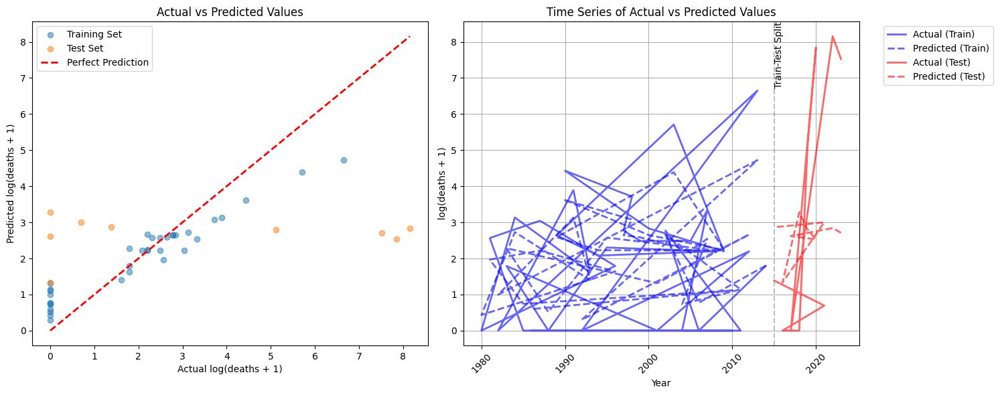


Test Set Predictions:
--------------------------------------------------
    Year  Actual  Predicted  Absolute Error
0   2023   7.524      2.712           4.812
2   2022   8.154      2.841           5.312
4   2017   0.000      2.618           2.618
7   2020   7.847      2.531           5.317
15  2019   5.124      2.798           2.326
16  2018   0.000      3.280           3.280
17  2016   0.000      1.331           1.331
18  2021   0.693      3.000           2.307
22  2015   1.386      2.864           1.478


In [31]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Prepare feature matrix
selected_features = ['max_temp', 'temp_variability', 'rain_mean', 'volatility_index']
X = feature_matrix[selected_features]
y = feature_matrix['log_deaths']

# Create chronological train-test split (using 2015 as cutoff)
train_years = feature_matrix['year'] < 2015  # Changed from 2020 to 2015
X_train = X[train_years]
X_test = X[~train_years]
y_train = y[train_years]
y_test = y[~train_years]

print(f"Training set size: {len(X_train)} samples (years {feature_matrix[train_years]['year'].min()}-2014)")
print(f"Test set size: {len(X_test)} samples (years 2015-{feature_matrix[~train_years]['year'].max()})")

# Initialize and train model
rf_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42
)

rf_model.fit(X_train, y_train)

# Make predictions
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Calculate metrics
def calculate_metrics(y_true, y_pred, set_name=""):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\n{set_name} Metrics:")
    print("-" * 50)
    print(f"R-squared: {r2:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"MAE: {mae:.3f}")
    
    return rmse, mae, r2

# Print metrics for both sets
train_metrics = calculate_metrics(y_train, y_pred_train, "Training Set")
test_metrics = calculate_metrics(y_test, y_pred_test, "Test Set")

# Feature importance
importance_df = pd.DataFrame({
    'feature': selected_features,
    'importance': rf_model.feature_importances_
})
importance_df = importance_df.sort_values('importance', ascending=False)

print("\nFeature Importance:")
print("-" * 50)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:20} {row['importance']:.3f}")

# Plotting actual vs predicted values
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train, alpha=0.5, label='Training Set')
plt.scatter(y_test, y_pred_test, alpha=0.5, label='Test Set')
plt.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         'r--', lw=2, label='Perfect Prediction')
plt.xlabel('Actual log(deaths + 1)')
plt.ylabel('Predicted log(deaths + 1)')
plt.title('Actual vs Predicted Values')
plt.legend()

# Time series plot with improved readability
plt.subplot(1, 2, 2)
# Training data
plt.plot(feature_matrix[train_years]['year'], y_train, 
         'b-', label='Actual (Train)', alpha=0.6, linewidth=2)
plt.plot(feature_matrix[train_years]['year'], y_pred_train, 
         'b--', label='Predicted (Train)', alpha=0.6, linewidth=2)
# Test data
plt.plot(feature_matrix[~train_years]['year'], y_test, 
         'r-', label='Actual (Test)', alpha=0.6, linewidth=2)
plt.plot(feature_matrix[~train_years]['year'], y_pred_test, 
         'r--', label='Predicted (Test)', alpha=0.6, linewidth=2)

plt.xlabel('Year')
plt.ylabel('log(deaths + 1)')
plt.title('Time Series of Actual vs Predicted Values')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add vertical line to show train-test split
plt.axvline(x=2015, color='gray', linestyle='--', alpha=0.5)
plt.text(2015, plt.ylim()[1], 'Train-Test Split', 
         rotation=90, verticalalignment='top')

plt.tight_layout()
plt.show()

# Print actual vs predicted values for test set
print("\nTest Set Predictions:")
print("-" * 50)
test_results = pd.DataFrame({
    'Year': feature_matrix[~train_years]['year'],
    'Actual': y_test,
    'Predicted': y_pred_test,
    'Absolute Error': abs(y_test - y_pred_test)
})
print(test_results.round(3))

Training set size: 30 samples (years 1980-2009)
Test set size: 6 samples (years 2010-2015)

Training Set Metrics:
--------------------------------------------------
R-squared: 0.844
RMSE: 0.604
MAE: 0.487

Test Set Metrics:
--------------------------------------------------
R-squared: -0.581
RMSE: 2.816
MAE: 2.156

Feature Importance:
--------------------------------------------------
max_temp             0.309
rain_mean            0.291
temp_variability     0.239
volatility_index     0.161


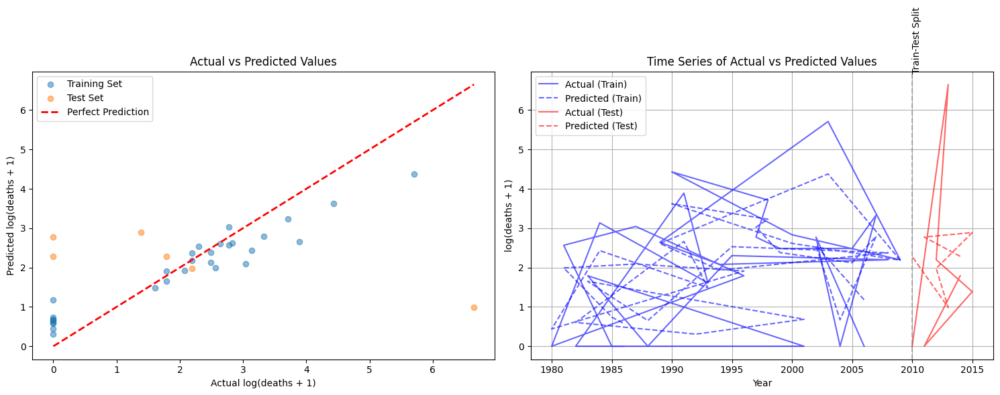


Test Set Predictions (2010-2015):
--------------------------------------------------
    Year  Actual  Predicted  Absolute Error
42  2010   0.000      2.282           2.282
6   2011   0.000      2.774           2.774
30  2012   2.197      1.977           0.220
32  2013   6.652      0.984           5.668
1   2014   1.792      2.284           0.493
22  2015   1.386      2.889           1.502


In [32]:
# Use original simple feature set
selected_features = [
    'max_temp', 
    'temp_variability', 
    'rain_mean', 
    'volatility_index'
]

X = feature_matrix[selected_features]
y = feature_matrix['log_deaths']

# Create chronological split for more stable period
train_years = feature_matrix['year'] < 2010
test_years = (feature_matrix['year'] >= 2010) & (feature_matrix['year'] <= 2015)

X_train = X[train_years]
X_test = X[test_years]
y_train = y[train_years]
y_test = y[test_years]

print(f"Training set size: {len(X_train)} samples (years 1980-2009)")
print(f"Test set size: {len(X_test)} samples (years 2010-2015)")

# Use original model parameters
rf_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42
)

rf_model.fit(X_train, y_train)

# Make predictions
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Calculate metrics
train_metrics = calculate_metrics(y_train, y_pred_train, "Training Set")
test_metrics = calculate_metrics(y_test, y_pred_test, "Test Set")

# Print feature importance
importance_df = pd.DataFrame({
    'feature': selected_features,
    'importance': rf_model.feature_importances_
})
importance_df = importance_df.sort_values('importance', ascending=False)

print("\nFeature Importance:")
print("-" * 50)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:20} {row['importance']:.3f}")

# Plot results
plt.figure(figsize=(15, 6))

# Actual vs Predicted plot
plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train, alpha=0.5, label='Training Set')
plt.scatter(y_test, y_pred_test, alpha=0.5, label='Test Set')
plt.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())],
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())],
         'r--', lw=2, label='Perfect Prediction')
plt.xlabel('Actual log(deaths + 1)')
plt.ylabel('Predicted log(deaths + 1)')
plt.title('Actual vs Predicted Values')
plt.legend()

# Time series plot
plt.subplot(1, 2, 2)
train_years_indices = feature_matrix[train_years]['year']
test_years_indices = feature_matrix[test_years]['year']

plt.plot(train_years_indices, y_train, 'b-', label='Actual (Train)', alpha=0.6)
plt.plot(train_years_indices, y_pred_train, 'b--', label='Predicted (Train)', alpha=0.6)
plt.plot(test_years_indices, y_test, 'r-', label='Actual (Test)', alpha=0.6)
plt.plot(test_years_indices, y_pred_test, 'r--', label='Predicted (Test)', alpha=0.6)

plt.axvline(x=2010, color='gray', linestyle='--', alpha=0.5)
plt.text(2010, plt.ylim()[1], 'Train-Test Split', rotation=90)
plt.xlabel('Year')
plt.ylabel('log(deaths + 1)')
plt.title('Time Series of Actual vs Predicted Values')
plt.legend(loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

# Print test set predictions
print("\nTest Set Predictions (2010-2015):")
print("-" * 50)
test_results = pd.DataFrame({
    'Year': feature_matrix[test_years]['year'],
    'Actual': y_test,
    'Predicted': y_pred_test,
    'Absolute Error': abs(y_test - y_pred_test)
})
print(test_results.sort_values('Year').round(3))

In [33]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import numpy as np

def create_severity_bins(deaths):
    """
    Create meaningful severity bins for death counts
    Returns both numeric bins and labels
    """
    if pd.isna(deaths) or deaths == 0:
        return 0, 'No Deaths'
    elif deaths <= 5:
        return 1, 'Very Low (1-5)'
    elif deaths <= 20:
        return 2, 'Low (6-20)'
    elif deaths <= 100:
        return 3, 'Moderate (21-100)'
    else:
        return 4, 'High (>100)'

def create_temperature_variability_features(temp_data):
    """
    Create enhanced temperature variability features based on research findings
    """
    # Sort data to ensure temporal calculations are correct
    temp_data = temp_data.sort_values(['year', 'month'])
    
    # Monthly variability
    temp_data['temp_monthly_range'] = temp_data['max_temp'] - temp_data['min_temp']
    
    # Rolling statistics for different windows
    for window in [3, 6, 12]:
        temp_data[f'temp_var_{window}m'] = temp_data['temp_monthly_range'].rolling(window=window).std()
        temp_data[f'temp_change_{window}m'] = temp_data['mean_temp'].rolling(window=window).apply(
            lambda x: np.max(np.abs(np.diff(x)))
        )
    
    # Seasonal patterns
    temp_data['season'] = pd.cut(
        temp_data['month'],
        bins=[0, 3, 6, 9, 12],
        labels=['Winter', 'Spring', 'Summer', 'Fall'],
        include_lowest=True
    )
    
    # Aggregate to annual level
    annual_features = temp_data.groupby('year').agg({
        'temp_monthly_range': ['mean', 'std', 'max'],
        'temp_var_3m': 'mean',
        'temp_var_6m': 'mean',
        'temp_var_12m': 'mean',
        'temp_change_3m': 'max',
        'temp_change_6m': 'max',
        'temp_change_12m': 'max'
    }).round(3)
    
    # Flatten column names
    annual_features.columns = [
        'temp_range_mean', 'temp_range_std', 'temp_range_max',
        'temp_var_3m_mean', 'temp_var_6m_mean', 'temp_var_12m_mean',
        'temp_change_3m_max', 'temp_change_6m_max', 'temp_change_12m_max'
    ]
    
    return annual_features

class TwoStageDisasterModel:
    def __init__(self):
        self.occurrence_model = RandomForestClassifier(
            n_estimators=200,
            max_depth=None,
            min_samples_split=5,
            min_samples_leaf=2,
            random_state=42
        )
        self.severity_model = RandomForestClassifier(
            n_estimators=200,
            max_depth=None,
            min_samples_split=3,
            min_samples_leaf=1,
            random_state=42
        )
        self.severity_encoder = LabelEncoder()
        
    def fit(self, X, deaths):
        # Create binary labels for occurrence
        y_occurrence = (deaths > 0).astype(int)
        
        # Create severity bins for non-zero cases
        severity_bins = pd.Series(deaths).apply(lambda x: create_severity_bins(x)[1])
        self.severity_encoder.fit(severity_bins[deaths > 0])
        y_severity = self.severity_encoder.transform(severity_bins[deaths > 0])
        
        # Train occurrence model
        self.occurrence_model.fit(X, y_occurrence)
        
        # Train severity model on non-zero cases
        if len(y_severity) > 0:
            X_severity = X[deaths > 0]
            self.severity_model.fit(X_severity, y_severity)
        
        return self
    
    def predict(self, X):
        # Predict occurrence
        occurrence_pred = self.occurrence_model.predict(X)
        
        # Predict severity for predicted occurrences
        X_severity = X[occurrence_pred == 1]
        if len(X_severity) > 0:
            severity_pred = self.severity_model.predict(X_severity)
            severity_labels = self.severity_encoder.inverse_transform(severity_pred)
        else:
            severity_labels = pd.Series([], dtype=str)
        
        # Combine predictions
        final_predictions = pd.Series(['No Deaths'] * len(X), index=X.index)
        final_predictions[occurrence_pred == 1] = severity_labels
        
        return final_predictions
    
    def get_feature_importance(self):
        occurrence_importance = pd.DataFrame({
            'feature': self.occurrence_model.feature_names_in_,
            'importance_occurrence': self.occurrence_model.feature_importances_
        })
        
        severity_importance = pd.DataFrame({
            'feature': self.severity_model.feature_names_in_,
            'importance_severity': self.severity_model.feature_importances_
        })
        
        # Combine importance scores
        importance = occurrence_importance.merge(
            severity_importance,
            on='feature',
            how='outer'
        ).fillna(0)
        
        return importance.sort_values('importance_occurrence', ascending=False)

# Create train/test splits with validation
def create_temporal_cv_splits(years, n_splits=3):
    """
    Create temporal cross-validation splits
    """
    unique_years = sorted(years.unique())
    split_size = len(unique_years) // n_splits
    
    splits = []
    for i in range(n_splits - 1):
        train_years = unique_years[:(i + 1) * split_size]
        val_years = unique_years[(i + 1) * split_size:(i + 2) * split_size]
        splits.append((train_years, val_years))
    
    return splits

def evaluate_model_performance(model, X, y, splits):
    """
    Evaluate model performance across multiple temporal splits
    """
    results = []
    
    for train_years, val_years in splits:
        # Create train/val masks
        train_mask = X.index.get_level_values('year').isin(train_years)
        val_mask = X.index.get_level_values('year').isin(val_years)
        
        # Fit model
        model.fit(X[train_mask], y[train_mask])
        
        # Make predictions
        train_pred = model.predict(X[train_mask])
        val_pred = model.predict(X[val_mask])
        
        # Calculate metrics
        train_report = classification_report(
            y[train_mask].apply(create_severity_bins)[1],
            train_pred,
            output_dict=True
        )
        val_report = classification_report(
            y[val_mask].apply(create_severity_bins)[1],
            val_pred,
            output_dict=True
        )
        
        results.append({
            'train_years': train_years,
            'val_years': val_years,
            'train_accuracy': train_report['accuracy'],
            'val_accuracy': val_report['accuracy'],
            'train_weighted_f1': train_report['weighted avg']['f1-score'],
            'val_weighted_f1': val_report['weighted avg']['f1-score']
        })
    
    return pd.DataFrame(results)

In [34]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score

def clean_feature_names(feature_names):
    """
    Clean and standardize feature names for visualization
    """
    name_mapping = {
        'max_temp': 'Maximum Temperature',
        'min_temp': 'Minimum Temperature',
        'temp_variability': 'Temperature Variability',
        'sun_mean_x': 'Mean Sunshine',
        'sun_std_x': 'Sunshine Std Dev',
        'mean_abs_zscore': 'Mean Absolute Z-Score',
        'sun_3m_std_avg': '3-Month Sunshine Std',
        'sun_6m_std_avg': '6-Month Sunshine Std'
    }
    return [name_mapping.get(name, name) for name in feature_names]

def plot_model_insights(model, X, y_true, y_pred):
    """
    Create comprehensive visualization of model performance and insights
    """
    fig = plt.figure(figsize=(20, 15))
    
    # 1. Feature Importance Plot
    plt.subplot(2, 2, 1)
    importance = model.get_feature_importance()
    top_features = importance.nlargest(8, 'importance_occurrence')
    
    sns.barplot(data=top_features, 
                x='importance_occurrence',
                y='feature',
                palette='viridis')
    plt.title('Top Features for Disaster Prediction', fontsize=12)
    plt.xlabel('Importance Score')
    
    # 2. Temporal Prediction Analysis
    plt.subplot(2, 2, 2)
    years = X.index.get_level_values('year') if isinstance(X.index, pd.MultiIndex) else X['year']
    correct = y_true == y_pred
    
    plt.scatter(years[correct], [1] * sum(correct), 
               label='Correct Predictions', 
               color='green', alpha=0.6)
    plt.scatter(years[~correct], [0] * sum(~correct), 
               label='Incorrect Predictions', 
               color='red', alpha=0.6)
    
    plt.title('Prediction Accuracy Over Time', fontsize=12)
    plt.xlabel('Year')
    plt.ylabel('Prediction Status')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 3. Temperature and Disaster Relationship
    plt.subplot(2, 2, 3)
    temp_vars = ['max_temp', 'min_temp', 'temp_variability']
    available_vars = [var for var in temp_vars if var in X.columns]
    
    for var in available_vars:
        sns.kdeplot(data=X[var], label=var)
    
    plt.title('Temperature Variable Distributions', fontsize=12)
    plt.xlabel('Temperature')
    plt.ylabel('Density')
    plt.legend()
    
    # 4. Confusion Matrix
    plt.subplot(2, 2, 4)
    severity_labels = ['No Deaths', 'Very Low', 'Low', 'Moderate', 'High']
    cm = confusion_matrix(y_true, y_pred, labels=severity_labels)
    
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=severity_labels,
                yticklabels=severity_labels)
    plt.title('Prediction Confusion Matrix', fontsize=12)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    plt.tight_layout()
    return fig

def plot_variable_trends(feature_matrix, important_features, severity_bins):
    """
    Plot trends of key variables with severity overlay
    """
    n_features = len(important_features)
    fig = plt.figure(figsize=(15, 5 * ((n_features + 1) // 2)))
    
    for i, feature in enumerate(important_features):
        if feature not in feature_matrix.columns:
            continue
            
        plt.subplot((n_features + 1) // 2, 2, i + 1)
        
        # Get years based on index structure
        years = (feature_matrix.index.get_level_values('year') 
                if isinstance(feature_matrix.index, pd.MultiIndex) 
                else feature_matrix['year'])
        
        # Plot feature trend with severity overlay
        for severity in np.unique(severity_bins):
            mask = severity_bins == severity
            plt.plot(years[mask], 
                    feature_matrix[feature][mask],
                    'o-', label=severity, alpha=0.7,
                    markersize=8)
        
        plt.title(f'{clean_feature_names([feature])[0]} Trend by Severity',
                 fontsize=12)
        plt.xlabel('Year')
        plt.ylabel('Value')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

def plot_cross_validation_results(cv_results):
    """
    Visualize cross-validation performance metrics
    """
    fig = plt.figure(figsize=(15, 6))
    
    # Plot accuracies
    plt.subplot(1, 2, 1)
    split_numbers = range(1, len(cv_results) + 1)
    
    plt.plot(split_numbers, cv_results['train_accuracy'], 
             'bo-', label='Training', markersize=8)
    plt.plot(split_numbers, cv_results['val_accuracy'], 
             'ro-', label='Validation', markersize=8)
    
    plt.title('Cross-Validation Accuracy', fontsize=12)
    plt.xlabel('CV Split')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot F1 scores
    plt.subplot(1, 2, 2)
    plt.plot(split_numbers, cv_results['train_weighted_f1'], 
             'bo-', label='Training', markersize=8)
    plt.plot(split_numbers, cv_results['val_weighted_f1'], 
             'ro-', label='Validation', markersize=8)
    
    plt.title('Cross-Validation F1 Score', fontsize=12)
    plt.xlabel('CV Split')
    plt.ylabel('Weighted F1 Score')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

def create_disaster_dashboard(model, X, y_true):
    """
    Create comprehensive visualization of model performance and insights
    Parameters:
    - model: trained TwoStageDisasterModel
    - X: feature matrix including 'year' column
    - y_true: actual severity labels
    """
    fig = plt.figure(figsize=(20, 15))
    
    # Ensure we have the year information
    if 'year' not in X.columns:
        raise ValueError("Feature matrix must include 'year' column for temporal analysis")
    
    # Get predictions
    y_pred = model.predict(X.drop('year', axis=1))
    
    # 1. Feature Importance Plot (top left)
    plt.subplot(2, 2, 1)
    importance = model.get_feature_importance()
    top_features = importance.nlargest(8, 'importance_occurrence')
    
    sns.barplot(data=top_features, 
                x='importance_occurrence',
                y='feature',
                palette='viridis')
    plt.title('Top Features for Disaster Prediction', fontsize=12)
    plt.xlabel('Importance Score')
    
    # 2. Temporal Prediction Analysis (top right)
    plt.subplot(2, 2, 2)
    correct = y_true == y_pred
    years = X['year']
    
    plt.scatter(years[correct], [1] * sum(correct), 
               label='Correct Predictions', 
               color='green', alpha=0.6)
    plt.scatter(years[~correct], [0] * sum(~correct), 
               label='Incorrect Predictions', 
               color='red', alpha=0.6)
    
    plt.title('Prediction Accuracy Over Time', fontsize=12)
    plt.xlabel('Year')
    plt.ylabel('Prediction Status')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 3. Severity Distribution (bottom left)
    plt.subplot(2, 2, 3)
    severity_counts = pd.DataFrame({
        'True': y_true.value_counts(),
        'Predicted': pd.Series(y_pred).value_counts()
    }).fillna(0)
    
    severity_counts.plot(kind='bar', ax=plt.gca())
    plt.title('Distribution of Severity Classes', fontsize=12)
    plt.xlabel('Severity Level')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    
    # 4. Confusion Matrix (bottom right)
    plt.subplot(2, 2, 4)
    cm = confusion_matrix(y_true, y_pred)
    severity_labels = ['No Deaths', 'Very Low', 'Low', 'Moderate', 'High']
    
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=severity_labels,
                yticklabels=severity_labels)
    plt.title('Confusion Matrix', fontsize=12)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    plt.tight_layout()
    return fig

def plot_temporal_analysis(model, X, y_true):
    """
    Create detailed temporal analysis of model performance
    """
    fig = plt.figure(figsize=(15, 10))
    
    # Ensure we have year information
    if 'year' not in X.columns:
        raise ValueError("Feature matrix must include 'year' column for temporal analysis")
    
    years = X['year']
    y_pred = model.predict(X.drop('year', axis=1))
    
    # 1. Accuracy over time
    plt.subplot(2, 1, 1)
    # Calculate rolling accuracy
    rolling_acc = pd.Series(y_true == y_pred).rolling(window=3).mean()
    
    plt.plot(years, rolling_acc, 'b-', label='3-Year Rolling Accuracy')
    plt.axhline(y=(y_true == y_pred).mean(), color='r', linestyle='--', 
                label='Overall Accuracy')
    
    plt.title('Model Accuracy Over Time')
    plt.xlabel('Year')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 2. Severity distribution over time
    plt.subplot(2, 1, 2)
    severity_by_year = pd.DataFrame({
        'Year': years,
        'True': y_true,
        'Predicted': y_pred
    })
    
    # Plot actual and predicted proportions
    for severity in ['No Deaths', 'Very Low (1-5)', 'Low (6-20)', 
                    'Moderate (21-100)', 'High (>100)']:
        true_prop = (severity_by_year['True'] == severity).rolling(window=3).mean()
        pred_prop = (severity_by_year['Predicted'] == severity).rolling(window=3).mean()
        
        plt.plot(years, true_prop, '-', label=f'True {severity}', alpha=0.6)
        plt.plot(years, pred_prop, '--', label=f'Pred {severity}', alpha=0.6)
    
    plt.title('Severity Distribution Over Time')
    plt.xlabel('Year')
    plt.ylabel('Proportion')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import pandas as pd

class TwoStageDisasterModel:
    def __init__(self):
        self.occurrence_model = RandomForestClassifier(
            n_estimators=200,
            max_depth=None,
            min_samples_split=5,
            min_samples_leaf=2,
            random_state=42
        )
        self.severity_model = RandomForestClassifier(
            n_estimators=200,
            max_depth=None,
            min_samples_split=3,
            min_samples_leaf=1,
            random_state=42
        )
        self.feature_names = None
    
    def fit(self, X, y):
        self.feature_names = X.columns
        
        # Train occurrence model (binary classification)
        y_occurrence = (y != 'No Deaths').astype(int)
        self.occurrence_model.fit(X, y_occurrence)
        
        # Train severity model on cases where disasters occurred
        disaster_mask = y != 'No Deaths'
        if disaster_mask.any():
            X_severity = X[disaster_mask]
            y_severity = y[disaster_mask]
            self.severity_model.fit(X_severity, y_severity)
        
        return self
    
    def predict(self, X):
        # Predict occurrence
        y_occurrence = self.occurrence_model.predict(X)
        predictions = pd.Series(['No Deaths'] * len(X), index=X.index)
        
        # Predict severity for predicted disasters
        disaster_mask = y_occurrence == 1
        if disaster_mask.any():
            X_severity = X[disaster_mask]
            severity_pred = self.severity_model.predict(X_severity)
            predictions[disaster_mask] = severity_pred
        
        return predictions
    
    def get_feature_importance(self):
        importance_df = pd.DataFrame({
            'feature': self.feature_names,
            'importance_occurrence': self.occurrence_model.feature_importances_,
            'importance_severity': np.zeros_like(self.occurrence_model.feature_importances_)
        })
        
        # Add severity importance if model was trained
        if hasattr(self.severity_model, 'feature_importances_'):
            importance_df['importance_severity'] = self.severity_model.feature_importances_
        
        return importance_df

def convert_log_deaths_to_counts(log_deaths):
    """
    Convert log-transformed death counts back to raw counts
    """
    return np.round(np.exp(log_deaths) - 1)

def prepare_severity_labels(deaths, is_logged=True):
    """
    Convert death counts to severity bins, handling log-transformed data
    """
    if is_logged:
        deaths = convert_log_deaths_to_counts(deaths)
    
    labels = pd.Series(index=deaths.index, dtype=str)
    
    # Create severity bins
    labels[deaths == 0] = 'No Deaths'
    labels[(deaths > 0) & (deaths <= 5)] = 'Very Low (1-5)'
    labels[(deaths > 5) & (deaths <= 20)] = 'Low (6-20)'
    labels[(deaths > 20) & (deaths <= 100)] = 'Moderate (21-100)'
    labels[deaths > 100] = 'High (>100)'
    
    return labels

def prepare_model_data(feature_matrix, cutoff_year=2015):
    """
    Prepare data for two-stage modeling
    """
    # Use selected features
    selected_features = ['max_temp', 'temp_variability', 'rain_mean', 'volatility_index']
    X = feature_matrix[selected_features]
    
    # Create severity labels from log_deaths
    y = prepare_severity_labels(feature_matrix['log_deaths'], is_logged=True)
    
    # Create chronological split
    train_years = feature_matrix['year'] < cutoff_year
    X_train = X[train_years]
    X_test = X[~train_years]
    y_train = y[train_years]
    y_test = y[~train_years]
    
    print(f"Training set: {len(X_train)} samples ({feature_matrix[train_years]['year'].min()}-{cutoff_year-1})")
    print(f"Test set: {len(X_test)} samples ({cutoff_year}-{feature_matrix[~train_years]['year'].max()})")
    
    # Print class distribution
    print("\nClass distribution in training set:")
    print(y_train.value_counts())
    print("\nClass distribution in test set:")
    print(y_test.value_counts())
    
    return X_train, X_test, y_train, y_test

def train_and_evaluate(feature_matrix, cutoff_year=2015):
    """
    Complete training and evaluation pipeline
    """
    # Prepare data
    X_train, X_test, y_train, y_test = prepare_model_data(
        feature_matrix, 
        cutoff_year
    )
    
    # Train model
    model = TwoStageDisasterModel()
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Print evaluation metrics
    def print_metrics(y_true, y_pred, set_name):
        print(f"\n{set_name} Metrics:")
        print("-" * 50)
        print(classification_report(y_true, y_pred))
        
        print("\nConfusion Matrix:")
        print(pd.crosstab(y_true, y_pred))
    
    print_metrics(y_train, y_pred_train, "Training Set")
    print_metrics(y_test, y_pred_test, "Test Set")
    
    # Analyze feature importance
    importance = model.get_feature_importance()
    print("\nFeature Importance:")
    print("-" * 50)
    print(importance)
    
    # Create results dataframe
    test_results = pd.DataFrame({
        'Year': feature_matrix[~feature_matrix['year'] < cutoff_year]['year'],
        'Actual': y_test,
        'Predicted': y_pred_test,
        'Correct': y_test == y_pred_test
    })
    
    return model, test_results

In [36]:
print("\nFeature Matrix Info:")
print("-" * 50)
print(f"Shape: {feature_matrix.shape}")
print(f"Year range: {feature_matrix['year'].min()} - {feature_matrix['year'].max()}")


Feature Matrix Info:
--------------------------------------------------
Shape: (44, 16)
Year range: 1980 - 2023


Training set: 35 samples (1980-2014)
Test set: 9 samples (2015-2023)

Class distribution in training set:
Low (6-20)           13
No Deaths            11
Moderate (21-100)     5
Very Low (1-5)        4
High (>100)           2
Name: count, dtype: int64

Class distribution in test set:
High (>100)       4
No Deaths         3
Very Low (1-5)    2
Name: count, dtype: int64

Training Set Metrics:
--------------------------------------------------
                   precision    recall  f1-score   support

      High (>100)       1.00      1.00      1.00         2
       Low (6-20)       0.93      1.00      0.96        13
Moderate (21-100)       1.00      1.00      1.00         5
        No Deaths       1.00      0.91      0.95        11
   Very Low (1-5)       1.00      1.00      1.00         4

         accuracy                           0.97        35
        macro avg       0.99      0.98      0.98        35
     weighted avg       0.97      0.97      0.97        35


Confusion Matrix:
co

/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

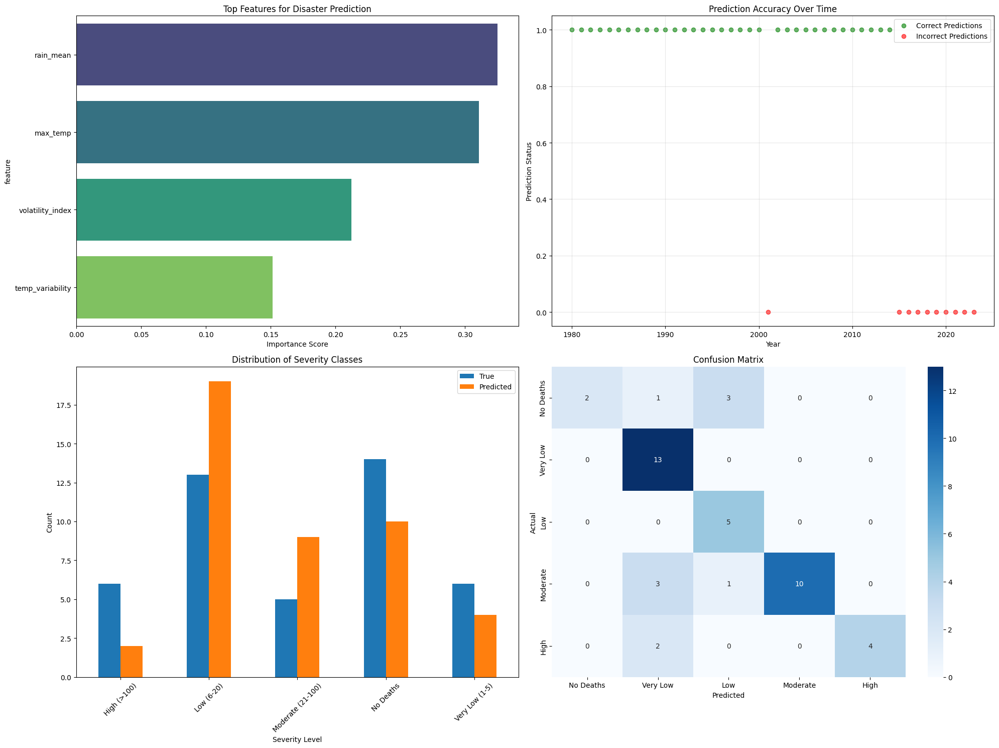

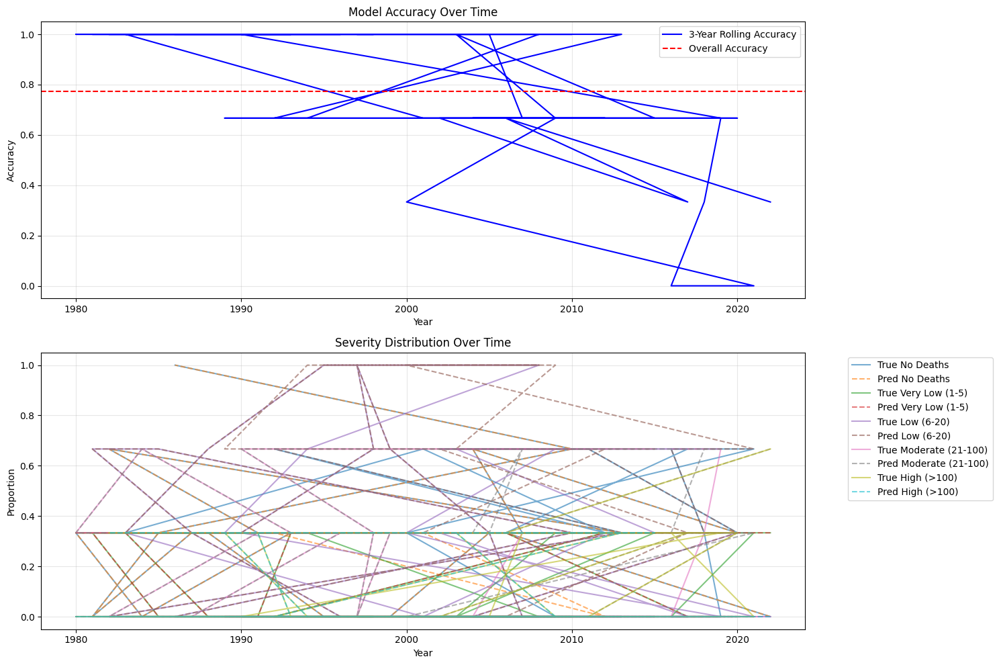

In [37]:
# Train and evaluate the model
model, test_results = train_and_evaluate(feature_matrix)

# Create visualization with all necessary columns
X_viz = feature_matrix[['year', 'max_temp', 'temp_variability', 'rain_mean', 'volatility_index']]
y_true = prepare_severity_labels(feature_matrix['log_deaths'], is_logged=True)

# Create main dashboard
fig1 = create_disaster_dashboard(model, X_viz, y_true)
plt.show()

# Create temporal analysis
fig2 = plot_temporal_analysis(model, X_viz, y_true)
plt.show()

Binary Classifier Performance:
--------------------------------------------------

Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         9
           1       1.00      1.00      1.00        21

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30


Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.67      1.00      0.80         4

    accuracy                           0.67         6
   macro avg       0.33      0.50      0.40         6
weighted avg       0.44      0.67      0.53         6


Severity Model Performance:
--------------------------------------------------

Training Set Metrics:
RMSE: 0.481
R^2: 0.741

Test Set Metrics:
RMSE: 2.282
R^2: -0.154

Feature Importance - Binary Classifier:
----------------------------

/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

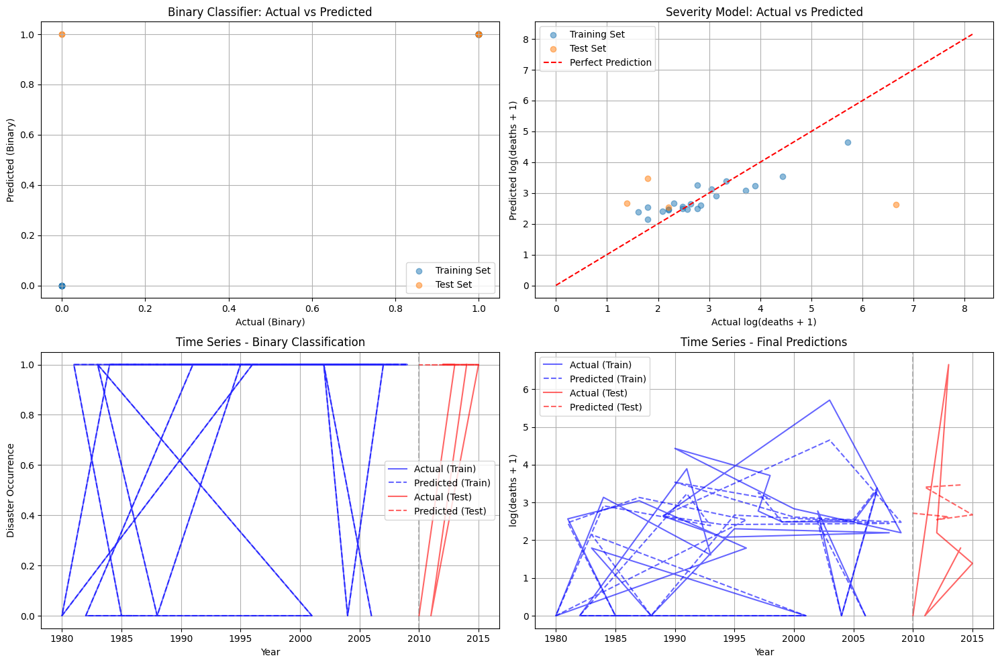


Detailed Test Set Predictions:
--------------------------------------------------
    Year  Actual_Binary  Predicted_Binary  Actual_Severity  \
1   2014              1                 1            1.792   
6   2011              0                 1            0.000   
22  2015              1                 1            1.386   
30  2012              1                 1            2.197   
32  2013              1                 1            6.652   
42  2010              0                 1            0.000   

    Predicted_Severity  Absolute_Error  
1                3.464           1.672  
6                3.405           3.405  
22               2.672           1.286  
30               2.543           0.346  
32               2.619           4.032  
42               2.714           2.714  


In [38]:
# Create binary target for disaster occurrence
feature_matrix['has_deaths'] = (feature_matrix['log_deaths'] > 0).astype(int)

# Keep only years with deaths for severity model
severity_data = feature_matrix[feature_matrix['has_deaths'] == 1].copy()

# Original feature set
selected_features = ['max_temp', 'temp_variability', 'rain_mean', 'volatility_index']

# Split data for both models (using 2010 as split point)
train_years = feature_matrix['year'] < 2010
test_years = (feature_matrix['year'] >= 2010) & (feature_matrix['year'] <= 2015)

# Prepare data for binary classifier
X_binary = feature_matrix[selected_features]
y_binary = feature_matrix['has_deaths']

X_binary_train = X_binary[train_years]
X_binary_test = X_binary[test_years]
y_binary_train = y_binary[train_years]
y_binary_test = y_binary[test_years]

# Prepare data for severity model
severity_train_years = severity_data['year'] < 2010
severity_test_years = (severity_data['year'] >= 2010) & (severity_data['year'] <= 2015)

X_severity = severity_data[selected_features]
y_severity = severity_data['log_deaths']

X_severity_train = X_severity[severity_train_years]
X_severity_test = X_severity[severity_test_years]
y_severity_train = y_severity[severity_train_years]
y_severity_test = y_severity[severity_test_years]

# Train binary classifier
binary_clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=4,
    min_samples_split=4,
    random_state=42
)
binary_clf.fit(X_binary_train, y_binary_train)

# Train severity model
severity_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=4,
    min_samples_split=4,
    random_state=42
)
severity_model.fit(X_severity_train, y_severity_train)

# Make predictions
binary_pred_train = binary_clf.predict(X_binary_train)
binary_pred_test = binary_clf.predict(X_binary_test)

severity_pred_train = severity_model.predict(X_binary_train)
severity_pred_test = severity_model.predict(X_binary_test)

# Combine predictions (zero for no disaster, predicted severity for disasters)
final_pred_train = binary_pred_train * severity_pred_train
final_pred_test = binary_pred_test * severity_pred_test

# Calculate metrics for both stages
from sklearn.metrics import classification_report, confusion_matrix

print("Binary Classifier Performance:")
print("-" * 50)
print("\nTraining Set:")
print(classification_report(y_binary_train, binary_pred_train))
print("\nTest Set:")
print(classification_report(y_binary_test, binary_pred_test))

print("\nSeverity Model Performance:")
print("-" * 50)
print("\nTraining Set Metrics:")
rmse_train = np.sqrt(mean_squared_error(y_severity_train, 
                    severity_model.predict(X_severity_train)))
r2_train = r2_score(y_severity_train, severity_model.predict(X_severity_train))
print(f"RMSE: {rmse_train:.3f}")
print(f"R^2: {r2_train:.3f}")

if len(y_severity_test) > 0:
    print("\nTest Set Metrics:")
    rmse_test = np.sqrt(mean_squared_error(y_severity_test, 
                        severity_model.predict(X_severity_test)))
    r2_test = r2_score(y_severity_test, severity_model.predict(X_severity_test))
    print(f"RMSE: {rmse_test:.3f}")
    print(f"R^2: {r2_test:.3f}")

# Feature importance for both models
print("\nFeature Importance - Binary Classifier:")
print("-" * 50)
binary_importance = pd.DataFrame({
    'feature': selected_features,
    'importance': binary_clf.feature_importances_
}).sort_values('importance', ascending=False)
print(binary_importance)

print("\nFeature Importance - Severity Model:")
print("-" * 50)
severity_importance = pd.DataFrame({
    'feature': selected_features,
    'importance': severity_model.feature_importances_
}).sort_values('importance', ascending=False)
print(severity_importance)

# Plot results
plt.figure(figsize=(15, 10))

# Binary classifier results
plt.subplot(2, 2, 1)
plt.scatter(y_binary_train, binary_pred_train, alpha=0.5, label='Training Set')
plt.scatter(y_binary_test, binary_pred_test, alpha=0.5, label='Test Set')
plt.xlabel('Actual (Binary)')
plt.ylabel('Predicted (Binary)')
plt.title('Binary Classifier: Actual vs Predicted')
plt.legend()
plt.grid(True)

# Severity model results
plt.subplot(2, 2, 2)
valid_severity_train = (y_binary_train == 1)
valid_severity_test = (y_binary_test == 1)

plt.scatter(feature_matrix[train_years & valid_severity_train]['log_deaths'], 
           severity_pred_train[valid_severity_train], 
           alpha=0.5, label='Training Set')
plt.scatter(feature_matrix[test_years & valid_severity_test]['log_deaths'], 
           severity_pred_test[valid_severity_test], 
           alpha=0.5, label='Test Set')
plt.plot([0, max(feature_matrix['log_deaths'])], [0, max(feature_matrix['log_deaths'])], 
         'r--', label='Perfect Prediction')
plt.xlabel('Actual log(deaths + 1)')
plt.ylabel('Predicted log(deaths + 1)')
plt.title('Severity Model: Actual vs Predicted')
plt.legend()
plt.grid(True)

# Time series plot - Binary
plt.subplot(2, 2, 3)
plt.plot(feature_matrix[train_years]['year'], y_binary_train, 
         'b-', label='Actual (Train)', alpha=0.6)
plt.plot(feature_matrix[train_years]['year'], binary_pred_train, 
         'b--', label='Predicted (Train)', alpha=0.6)
plt.plot(feature_matrix[test_years]['year'], y_binary_test, 
         'r-', label='Actual (Test)', alpha=0.6)
plt.plot(feature_matrix[test_years]['year'], binary_pred_test, 
         'r--', label='Predicted (Test)', alpha=0.6)
plt.axvline(x=2010, color='gray', linestyle='--', alpha=0.5)
plt.xlabel('Year')
plt.ylabel('Disaster Occurrence')
plt.title('Time Series - Binary Classification')
plt.legend()
plt.grid(True)

# Time series plot - Severity
plt.subplot(2, 2, 4)
plt.plot(feature_matrix[train_years]['year'], feature_matrix[train_years]['log_deaths'], 
         'b-', label='Actual (Train)', alpha=0.6)
plt.plot(feature_matrix[train_years]['year'], final_pred_train, 
         'b--', label='Predicted (Train)', alpha=0.6)
plt.plot(feature_matrix[test_years]['year'], feature_matrix[test_years]['log_deaths'], 
         'r-', label='Actual (Test)', alpha=0.6)
plt.plot(feature_matrix[test_years]['year'], final_pred_test, 
         'r--', label='Predicted (Test)', alpha=0.6)
plt.axvline(x=2010, color='gray', linestyle='--', alpha=0.5)
plt.xlabel('Year')
plt.ylabel('log(deaths + 1)')
plt.title('Time Series - Final Predictions')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Print detailed test predictions
print("\nDetailed Test Set Predictions:")
print("-" * 50)
test_results = pd.DataFrame({
    'Year': feature_matrix[test_years]['year'],
    'Actual_Binary': y_binary_test,
    'Predicted_Binary': binary_pred_test,
    'Actual_Severity': feature_matrix[test_years]['log_deaths'],
    'Predicted_Severity': final_pred_test,
    'Absolute_Error': abs(feature_matrix[test_years]['log_deaths'] - final_pred_test)
})
print(test_results.round(3))

Class weights: {0: 1.6666666666666667, 1: 0.7142857142857143}

Balanced Binary Classifier Performance:
--------------------------------------------------

Training Set:
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         9
           1       0.78      1.00      0.88        21

    accuracy                           0.80        30
   macro avg       0.89      0.67      0.69        30
weighted avg       0.84      0.80      0.76        30

Balanced Accuracy: 0.667
ROC AUC: 1.000

Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.67      1.00      0.80         4

    accuracy                           0.67         6
   macro avg       0.33      0.50      0.40         6
weighted avg       0.44      0.67      0.53         6

Balanced Accuracy: 0.500
ROC AUC: 0.250


/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/matviiair/Library/Python/3.11/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

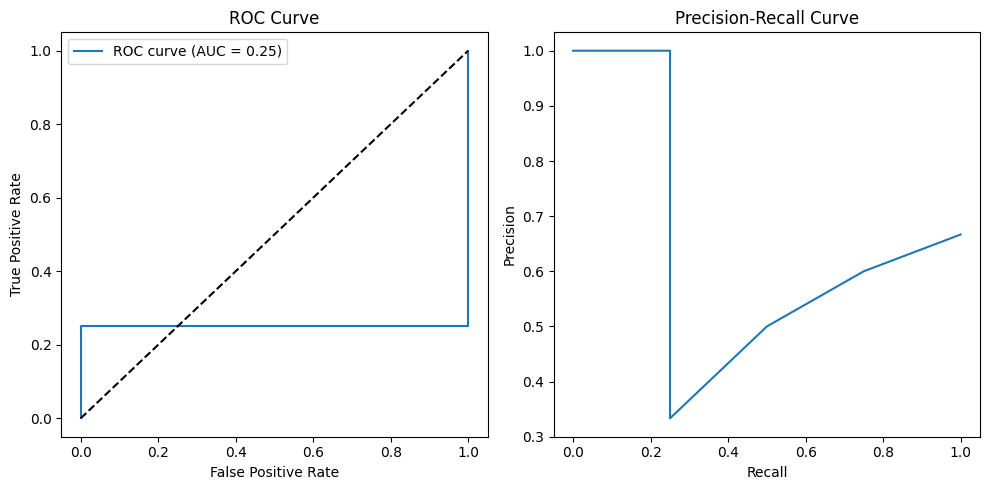

In [39]:
# Calculate class weights
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_binary_train),
    y=y_binary_train
)
class_weight_dict = dict(zip(np.unique(y_binary_train), class_weights))

print("Class weights:", class_weight_dict)

# Train balanced binary classifier
balanced_binary_clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=4,
    min_samples_split=4,
    class_weight=class_weight_dict,  # Add class weights
    random_state=42
)
balanced_binary_clf.fit(X_binary_train, y_binary_train)

# Make predictions with probability threshold adjustment
prob_threshold = 0.3  # Adjust this threshold based on validation
y_prob_train = balanced_binary_clf.predict_proba(X_binary_train)[:, 1]
y_prob_test = balanced_binary_clf.predict_proba(X_binary_test)[:, 1]

y_pred_train_balanced = (y_prob_train > prob_threshold).astype(int)
y_pred_test_balanced = (y_prob_test > prob_threshold).astype(int)

# Calculate and print balanced metrics
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, precision_recall_curve

print("\nBalanced Binary Classifier Performance:")
print("-" * 50)
print("\nTraining Set:")
print(classification_report(y_binary_train, y_pred_train_balanced))
print(f"Balanced Accuracy: {balanced_accuracy_score(y_binary_train, y_pred_train_balanced):.3f}")
print(f"ROC AUC: {roc_auc_score(y_binary_train, y_prob_train):.3f}")

print("\nTest Set:")
print(classification_report(y_binary_test, y_pred_test_balanced))
print(f"Balanced Accuracy: {balanced_accuracy_score(y_binary_test, y_pred_test_balanced):.3f}")
print(f"ROC AUC: {roc_auc_score(y_binary_test, y_prob_test):.3f}")

# Plot ROC curve
plt.figure(figsize=(10, 5))

# ROC curve
plt.subplot(1, 2, 1)
from sklearn.metrics import roc_curve
fpr, tpr, _ = roc_curve(y_binary_test, y_prob_test)
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc_score(y_binary_test, y_prob_test):.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()

# Precision-Recall curve
plt.subplot(1, 2, 2)
precision, recall, _ = precision_recall_curve(y_binary_test, y_prob_test)
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.tight_layout()
plt.show()

Correlations with log(deaths + 1):
--------------------------------------------------

Training Period (1980-2009):
max_temp             r= 0.404
temp_variability     r= 0.441
rain_mean            r=-0.147
volatility_index     r= 0.400

Test Period (2010-2015):
max_temp             r=-0.154
temp_variability     r=-0.723
rain_mean            r= 0.031
volatility_index     r=-0.420


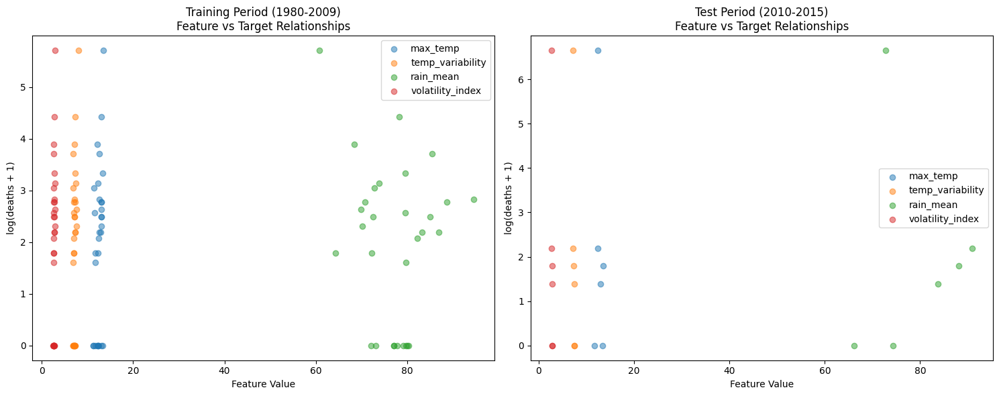

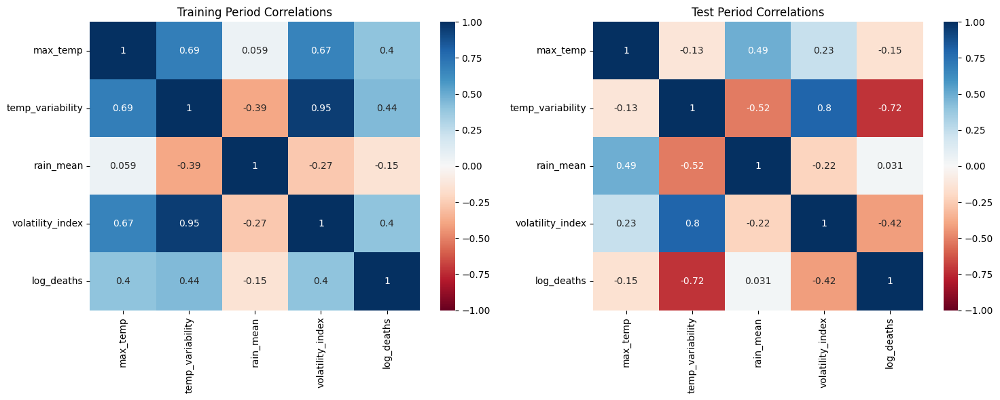

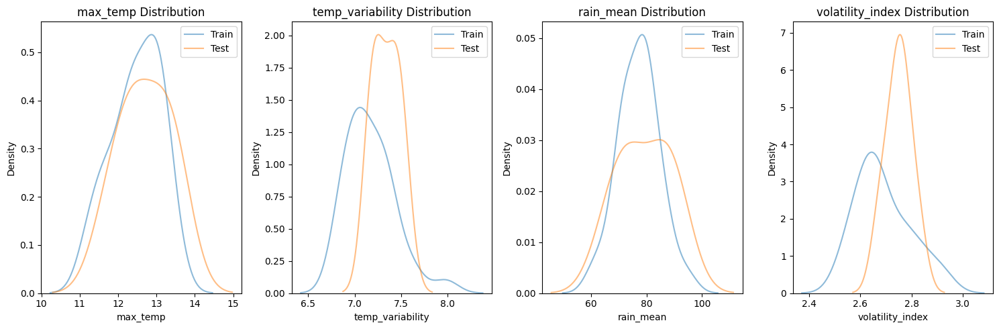

In [40]:
# Define our periods
train_years = feature_matrix['year'] < 2010
test_years = (feature_matrix['year'] >= 2010) & (feature_matrix['year'] <= 2015)

# Selected features for analysis
analysis_features = [
    'max_temp', 'temp_variability', 'rain_mean', 
    'volatility_index', 'log_deaths'
]

# Calculate correlations for both periods
train_corr = feature_matrix[train_years][analysis_features].corr()
test_corr = feature_matrix[test_years][analysis_features].corr()

# Print correlation with log_deaths for both periods
print("Correlations with log(deaths + 1):")
print("-" * 50)
print("\nTraining Period (1980-2009):")
for feature in analysis_features[:-1]:
    corr = train_corr.loc[feature, 'log_deaths']
    print(f"{feature:20} r={corr:6.3f}")

print("\nTest Period (2010-2015):")
for feature in analysis_features[:-1]:
    corr = test_corr.loc[feature, 'log_deaths']
    print(f"{feature:20} r={corr:6.3f}")

# Visualize correlations
plt.figure(figsize=(15, 6))

# Scatterplots for training period
plt.subplot(1, 2, 1)
for feature in analysis_features[:-1]:
    plt.scatter(
        feature_matrix[train_years][feature],
        feature_matrix[train_years]['log_deaths'],
        alpha=0.5,
        label=feature
    )
plt.xlabel('Feature Value')
plt.ylabel('log(deaths + 1)')
plt.title('Training Period (1980-2009)\nFeature vs Target Relationships')
plt.legend()

# Scatterplots for test period
plt.subplot(1, 2, 2)
for feature in analysis_features[:-1]:
    plt.scatter(
        feature_matrix[test_years][feature],
        feature_matrix[test_years]['log_deaths'],
        alpha=0.5,
        label=feature
    )
plt.xlabel('Feature Value')
plt.ylabel('log(deaths + 1)')
plt.title('Test Period (2010-2015)\nFeature vs Target Relationships')
plt.legend()

plt.tight_layout()
plt.show()

# Create correlation heatmaps
plt.figure(figsize=(15, 6))

# Training period heatmap
plt.subplot(1, 2, 1)
sns.heatmap(train_corr, annot=True, cmap='RdBu', center=0, vmin=-1, vmax=1)
plt.title('Training Period Correlations')

# Test period heatmap
plt.subplot(1, 2, 2)
sns.heatmap(test_corr, annot=True, cmap='RdBu', center=0, vmin=-1, vmax=1)
plt.title('Test Period Correlations')

plt.tight_layout()
plt.show()

# Additional analysis: Distribution changes
plt.figure(figsize=(15, 5))
for i, feature in enumerate(analysis_features[:-1]):
    plt.subplot(1, 4, i+1)
    sns.kdeplot(
        data=feature_matrix[train_years][feature],
        label='Train',
        alpha=0.5
    )
    sns.kdeplot(
        data=feature_matrix[test_years][feature],
        label='Test',
        alpha=0.5
    )
    plt.title(f'{feature} Distribution')
    plt.legend()

plt.tight_layout()
plt.show()

In [41]:
# First, let's check our column names
print("Temperature data columns:", temp_data.columns.tolist())
print("\nRainfall data columns:", met_data_1980.columns.tolist())
print("\nSunshine data columns:", annual_sun_stats.columns.tolist())
print("\nDisaster data columns:", filtered_data.columns.tolist())
print("\nSeverity data columns:", severity_data.columns.tolist())
print("\nFeature matrix columns:", feature_matrix.columns.tolist())

Temperature data columns: ['year', 'min_temp', 'max_temp', 'temp_variability']

Rainfall data columns: ['year', 'month', 'tmax', 'tmin', 'af', 'rain', 'sun', 'station']

Sunshine data columns: ['year', 'sun_mean', 'sun_std', 'sun_max', 'sun_min', 'sun_3m_std_avg', 'sun_6m_std_avg', 'extreme_sun_days', 'sun_abs_zscore']

Disaster data columns: ['Start Year', 'disaster_count', 'Total Deaths']

Severity data columns: ['year', 'max_temp', 'min_temp', 'temp_variability', 'rain_mean', 'rain_std', 'rain_abs_zscore', 'sun_mean', 'sun_std', 'sun_abs_zscore', 'sun_temp_interaction', 'rain_temp_interaction', 'sun_rain_interaction', 'extreme_weather_score', 'volatility_index', 'log_deaths', 'has_deaths']

Feature matrix columns: ['year', 'max_temp', 'min_temp', 'temp_variability', 'rain_mean', 'rain_std', 'rain_abs_zscore', 'sun_mean', 'sun_std', 'sun_abs_zscore', 'sun_temp_interaction', 'rain_temp_interaction', 'sun_rain_interaction', 'extreme_weather_score', 'volatility_index', 'log_deaths', 'ha

Reading temperature data...

Monthly Dataset Overview:
--------------------------------------------------
Time range: 1980 - 2020
Total months: 486

Seasonal Distribution:
season
Winter    123
Spring    123
Summer    120
Fall      120
Name: count, dtype: int64

Sample of monthly features:
     year  month  min_temp  max_temp  temp_variability       rain         sun  \
458  1980      1      -0.9       4.3               5.2  74.300000   53.932258   
157  1980      2       1.8       7.3               5.5  81.525000   47.300000   
417  1980      3       0.6       6.7               6.1  85.890625   85.512903   
249  1980      4       3.4      12.0               8.6  15.800000  167.138710   
434  1980      5       4.9      15.1              10.2  25.445455  230.509677   

     max_temp_roll_mean  max_temp_roll_std  min_temp_roll_mean  \
458            4.300000                NaN           -0.900000   
157            5.800000           2.121320            0.450000   
417            6.100000  

/var/folders/ss/7gdz3mj52njb_7zt7jv9wj2r0000gp/T/ipykernel_10962/812912001.py:107: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_stats = monthly_features.groupby('season').agg({


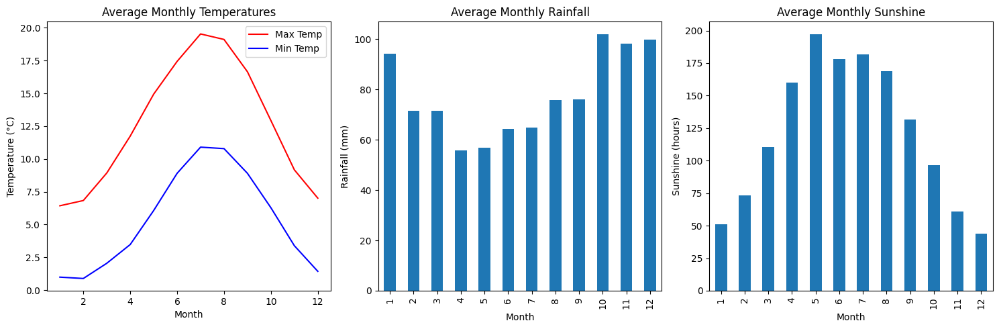

In [42]:
# Modified function to read temperature data with monthly values
def read_monthly_temp_data(filepath):
    """Read temperature data and extract monthly values properly."""
    with open(filepath, 'r') as f:
        lines = f.readlines()
    
    # Find the line that starts the data
    start_line = 0
    for i, line in enumerate(lines):
        if 'jan  year' in line.lower():
            start_line = i + 1
            break
    
    monthly_data = []
    months = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 
              'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
    
    # Process each line of data
    for line in lines[start_line:]:
        values = line.strip().split()
        if len(values) < 24:  # Each line should have 24 values (12 pairs of temp/year)
            continue
            
        try:
            # First value is temperature, second is year
            for i in range(0, 24, 2):
                temp = float(values[i])
                year = int(values[i+1])
                month = months[i//2]
                month_num = i//2 + 1
                
                monthly_data.append({
                    'year': year,
                    'month': month_num,
                    'month_name': month,
                    'temperature': temp
                })
        except:
            continue
            
    return pd.DataFrame(monthly_data)

# Read both temperature datasets
print("Reading temperature data...")
monthly_min_temps = read_monthly_temp_data('UK_min_temperature_data.txt')
monthly_max_temps = read_monthly_temp_data('UK_max_temperature_data.txt')

# Rename temperature columns to distinguish min/max
monthly_min_temps = monthly_min_temps.rename(columns={'temperature': 'min_temp'})
monthly_max_temps = monthly_max_temps.rename(columns={'temperature': 'max_temp'})

# Merge min and max temperatures
monthly_temps = pd.merge(
    monthly_min_temps[['year', 'month', 'min_temp']],
    monthly_max_temps[['year', 'month', 'max_temp']],
    on=['year', 'month']
)

# Calculate temperature variability
monthly_temps['temp_variability'] = monthly_temps['max_temp'] - monthly_temps['min_temp']

# Process Met Office data
monthly_weather = met_data_1980.groupby(['year', 'month']).agg({
    'rain': 'mean',
    'sun': 'mean'
}).reset_index()

# Create complete monthly dataset
monthly_features = pd.merge(
    monthly_temps,
    monthly_weather,
    on=['year', 'month']
)

# Add rolling statistics
monthly_features = monthly_features.sort_values(['year', 'month'])
for col in ['max_temp', 'min_temp', 'rain', 'sun']:
    monthly_features[f'{col}_roll_mean'] = monthly_features.groupby('year')[col].transform(
        lambda x: x.rolling(window=3, min_periods=1).mean()
    )
    monthly_features[f'{col}_roll_std'] = monthly_features.groupby('year')[col].transform(
        lambda x: x.rolling(window=3, min_periods=1).std()
    )

# Add seasonal indicators
monthly_features['season'] = pd.cut(
    monthly_features['month'],
    bins=[0, 3, 6, 9, 12],
    labels=['Winter', 'Spring', 'Summer', 'Fall']
)

# Print dataset information
print("\nMonthly Dataset Overview:")
print("-" * 50)
print(f"Time range: {monthly_features['year'].min()} - {monthly_features['year'].max()}")
print(f"Total months: {len(monthly_features)}")

# Show distribution of data across seasons
print("\nSeasonal Distribution:")
print(monthly_features['season'].value_counts())

# Show sample of the data
print("\nSample of monthly features:")
print(monthly_features.head())

# Analyze seasonal patterns
seasonal_stats = monthly_features.groupby('season').agg({
    'max_temp': ['mean', 'std'],
    'min_temp': ['mean', 'std'],
    'rain': ['mean', 'std'],
    'sun': ['mean', 'std']
}).round(2)

print("\nSeasonal Statistics:")
print(seasonal_stats)

# Visualize monthly patterns
plt.figure(figsize=(15, 5))

# Temperature patterns
plt.subplot(1, 3, 1)
monthly_means = monthly_features.groupby('month').agg({
    'max_temp': 'mean',
    'min_temp': 'mean'
})
plt.plot(monthly_means.index, monthly_means['max_temp'], 'r-', label='Max Temp')
plt.plot(monthly_means.index, monthly_means['min_temp'], 'b-', label='Min Temp')
plt.title('Average Monthly Temperatures')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.legend()

# Rainfall patterns
plt.subplot(1, 3, 2)
monthly_features.groupby('month')['rain'].mean().plot(kind='bar')
plt.title('Average Monthly Rainfall')
plt.xlabel('Month')
plt.ylabel('Rainfall (mm)')

# Sunshine patterns
plt.subplot(1, 3, 3)
monthly_features.groupby('month')['sun'].mean().plot(kind='bar')
plt.title('Average Monthly Sunshine')
plt.xlabel('Month')
plt.ylabel('Sunshine (hours)')

plt.tight_layout()
plt.show()

Columns in filtered_data: ['Start Year', 'disaster_count', 'Total Deaths']

Risk Level Distribution:
risk_level
2    0.321
3    0.284
1    0.247
0    0.148
Name: proportion, dtype: float64

Seasonal Risk Analysis:
       risk_level             Total Deaths          disaster_count       
             mean   std count         mean      sum           mean    sum
season                                                                   
Winter       1.76  1.03   123       102.29  12582.0           2.07  255.0
Spring       1.76  1.03   123       102.29  12582.0           2.07  255.0
Summer       1.72  1.03   120        40.90   4908.0           2.05  246.0
Fall         1.72  1.03   120        40.90   4908.0           2.05  246.0

Monthly Risk Analysis:
      risk_level       Total Deaths         disaster_count      
            mean   std         mean     sum           mean   sum
month                                                           
1           1.76  1.04       102.29  4194.0      

/var/folders/ss/7gdz3mj52njb_7zt7jv9wj2r0000gp/T/ipykernel_10962/3735011590.py:76: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_risk = monthly_risk_data.groupby('season').agg({
/var/folders/ss/7gdz3mj52njb_7zt7jv9wj2r0000gp/T/ipykernel_10962/3735011590.py:114: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  monthly_risk_data.groupby('season')['risk_level'].mean().plot(kind='bar')


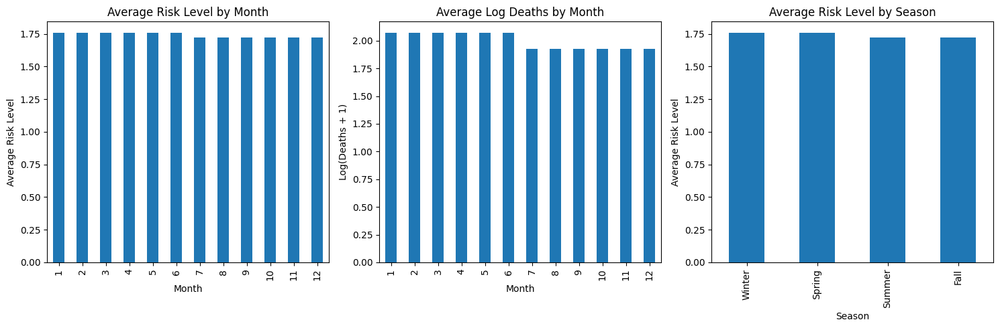


Correlations with Risk Level:
risk_level            1.000000
sun_roll_std          0.036758
min_temp              0.008566
max_temp              0.008356
temp_variability      0.005563
max_temp_roll_mean   -0.000288
min_temp_roll_mean   -0.000833
sun                  -0.003956
rain                 -0.007105
sun_roll_mean        -0.010207
rain_roll_std        -0.012519
rain_roll_mean       -0.031281
max_temp_roll_std    -0.034285
min_temp_roll_std    -0.036162
Name: risk_level, dtype: float64


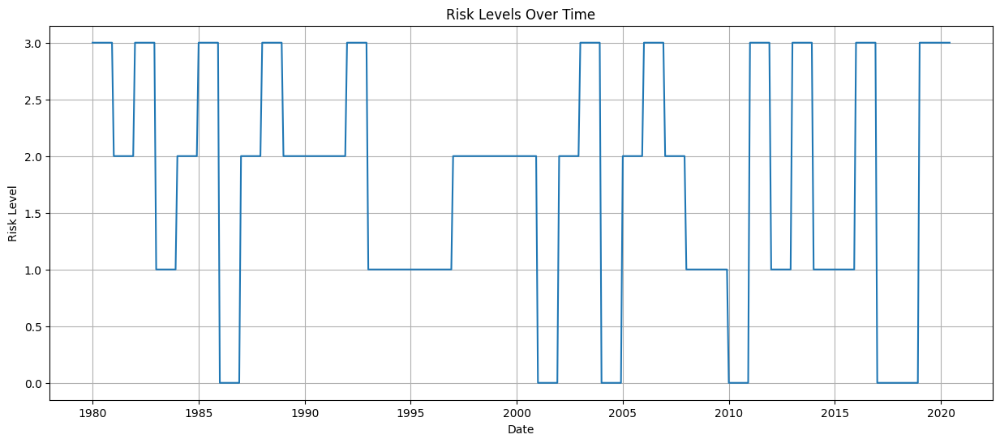

In [43]:
# First, let's load and process the disaster data
# Check what columns we have in the disaster data
print("Columns in filtered_data:", filtered_data.columns.tolist())

# Create expanded disaster dataset with all months
all_months = pd.DataFrame({
    'year': monthly_features['year'].unique().repeat(12),
    'month': np.tile(range(1, 13), len(monthly_features['year'].unique()))
})

# Convert disaster data to monthly
if 'Start Month' in filtered_data.columns and 'Start Day' in filtered_data.columns:
    monthly_disasters = filtered_data.groupby(
        ['Start Year', 'Start Month']
    ).agg({
        'Total Deaths': 'sum',
        'disaster_count': 'sum'
    }).reset_index()
    
    monthly_disasters = monthly_disasters.rename(columns={
        'Start Year': 'year',
        'Start Month': 'month'
    })
else:
    # If we don't have month information, we'll need to spread annual data
    monthly_disasters = filtered_data.groupby('Start Year').agg({
        'Total Deaths': 'sum',
        'disaster_count': 'sum'
    }).reset_index()
    
    monthly_disasters = monthly_disasters.rename(columns={
        'Start Year': 'year'
    })
    # Merge with all months
    monthly_disasters = pd.merge(
        all_months,
        monthly_disasters,
        on='year',
        how='left'
    )

# Create risk levels
def define_risk_level(row):
    if row['Total Deaths'] == 0:
        return 0  # No risk
    elif row['Total Deaths'] <= 10:
        return 1  # Low risk
    elif row['Total Deaths'] <= 100:
        return 2  # Medium risk
    else:
        return 3  # High risk

monthly_disasters['risk_level'] = monthly_disasters.apply(define_risk_level, axis=1)

# Merge with monthly features
monthly_risk_data = pd.merge(
    monthly_features,
    monthly_disasters[['year', 'month', 'Total Deaths', 'disaster_count', 'risk_level']],
    on=['year', 'month'],
    how='left'
)

# Fill NaN values
monthly_risk_data['Total Deaths'] = monthly_risk_data['Total Deaths'].fillna(0)
monthly_risk_data['disaster_count'] = monthly_risk_data['disaster_count'].fillna(0)
monthly_risk_data['risk_level'] = monthly_risk_data['risk_level'].fillna(0)

# Add log transformation of deaths
monthly_risk_data['log_deaths'] = np.log1p(monthly_risk_data['Total Deaths'])

# Analyze risk patterns
print("\nRisk Level Distribution:")
print(monthly_risk_data['risk_level'].value_counts(normalize=True).round(3))

# Seasonal risk analysis
seasonal_risk = monthly_risk_data.groupby('season').agg({
    'risk_level': ['mean', 'std', 'count'],
    'Total Deaths': ['mean', 'sum'],
    'disaster_count': ['mean', 'sum']
}).round(2)

print("\nSeasonal Risk Analysis:")
print(seasonal_risk)

# Monthly risk analysis
monthly_risk = monthly_risk_data.groupby('month').agg({
    'risk_level': ['mean', 'std'],
    'Total Deaths': ['mean', 'sum'],
    'disaster_count': ['mean', 'sum']
}).round(2)

print("\nMonthly Risk Analysis:")
print(monthly_risk)

# Visualize risk patterns
plt.figure(figsize=(15, 5))

# Risk levels by month
plt.subplot(1, 3, 1)
monthly_risk_data.groupby('month')['risk_level'].mean().plot(kind='bar')
plt.title('Average Risk Level by Month')
plt.xlabel('Month')
plt.ylabel('Average Risk Level')

# Deaths by month
plt.subplot(1, 3, 2)
monthly_risk_data.groupby('month')['log_deaths'].mean().plot(kind='bar')
plt.title('Average Log Deaths by Month')
plt.xlabel('Month')
plt.ylabel('Log(Deaths + 1)')

# Risk levels by season
plt.subplot(1, 3, 3)
monthly_risk_data.groupby('season')['risk_level'].mean().plot(kind='bar')
plt.title('Average Risk Level by Season')
plt.xlabel('Season')
plt.ylabel('Average Risk Level')

plt.tight_layout()
plt.show()

# Calculate correlations with risk level
print("\nCorrelations with Risk Level:")
correlations = monthly_risk_data[['risk_level', 'max_temp', 'min_temp', 'temp_variability', 
                                 'rain', 'sun'] + 
                                [col for col in monthly_risk_data.columns if 'roll_' in col]].corr()['risk_level']
print(correlations.sort_values(ascending=False))

# Create a time series plot of risk levels
plt.figure(figsize=(15, 6))
plt.plot(pd.to_datetime(monthly_risk_data['year'].astype(str) + '-' + 
                       monthly_risk_data['month'].astype(str).str.zfill(2) + '-01'),
         monthly_risk_data['risk_level'])
plt.title('Risk Levels Over Time')
plt.xlabel('Date')
plt.ylabel('Risk Level')
plt.grid(True)
plt.show()

Death count distribution:
count     486.000000
mean       71.975309
std       306.304153
min         0.000000
25%         0.000000
50%         8.000000
75%        16.000000
max      2558.000000
Name: Total Deaths, dtype: float64

Log deaths distribution:
count    486.000000
mean       1.996420
std        1.853153
min        0.000000
25%        0.000000
50%        2.197225
75%        2.833213
max        7.847372
Name: log_deaths, dtype: float64

Correlations with new risk levels:

Correlations with new risk level:
risk_level_new        1.000
log_deaths            0.918
rain_roll_std         0.102
sun_roll_std          0.062
temp_variability      0.037
sun                   0.033
sun_roll_mean         0.032
max_temp_roll_mean    0.025
rain_roll_mean        0.024
max_temp              0.021
min_temp_roll_mean    0.017
min_temp              0.013
rain                  0.013
max_temp_roll_std     0.011
min_temp_roll_std    -0.011
Name: risk_level_new, dtype: float64

Correlations with log_d

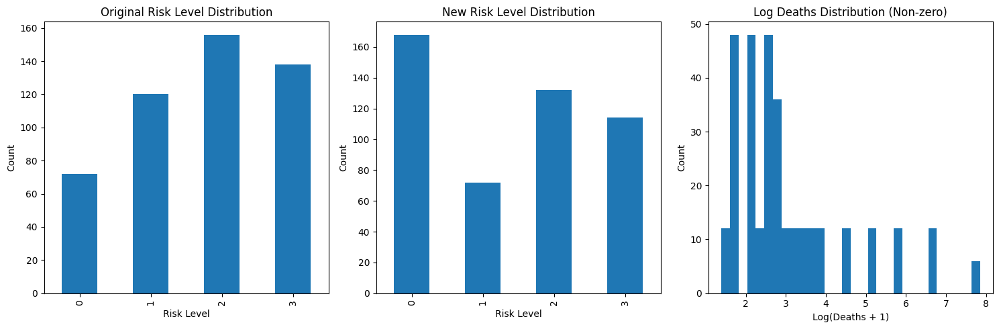


Seasonal analysis with new risk levels:
       risk_level_new              log_deaths       
                 mean    std count       mean    std
season                                              
Winter          1.415  1.194   123      2.068  1.957
Spring          1.415  1.194   123      2.068  1.957
Summer          1.375  1.182   120      1.923  1.750
Fall            1.375  1.182   120      1.923  1.750

Monthly analysis with new risk levels:
      risk_level_new        log_deaths       
                mean    std       mean    std
month                                        
1              1.415  1.204      2.068  1.973
2              1.415  1.204      2.068  1.973
3              1.415  1.204      2.068  1.973
4              1.415  1.204      2.068  1.973
5              1.415  1.204      2.068  1.973
6              1.415  1.204      2.068  1.973
7              1.375  1.192      1.923  1.765
8              1.375  1.192      1.923  1.765
9              1.375  1.192      1.923  1.

/var/folders/ss/7gdz3mj52njb_7zt7jv9wj2r0000gp/T/ipykernel_10962/2055259116.py:65: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_risk = monthly_risk_data.groupby('season').agg({


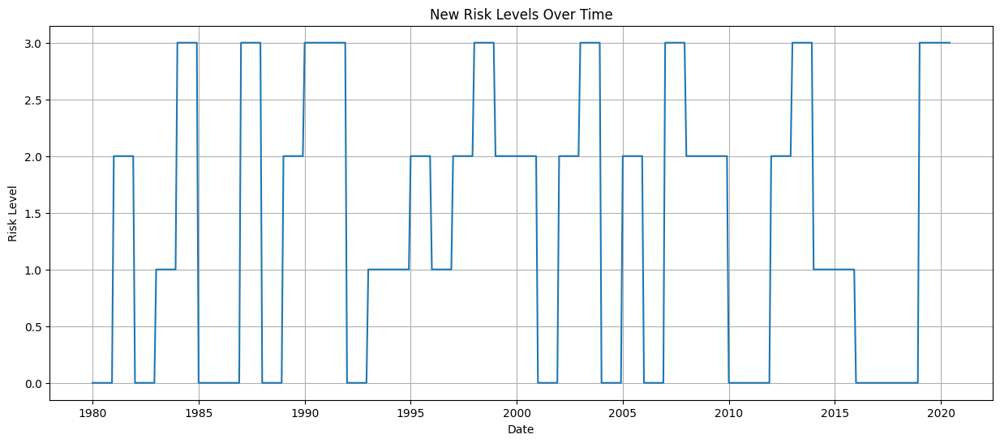

<Figure size 1200x500 with 0 Axes>

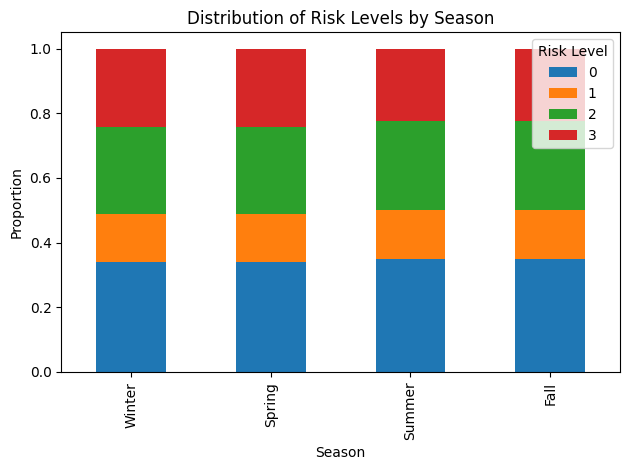

In [44]:
# First, let's look at the distribution of deaths and log_deaths
print("Death count distribution:")
print(monthly_risk_data['Total Deaths'].describe())

# Calculate log_deaths
monthly_risk_data['log_deaths'] = np.log1p(monthly_risk_data['Total Deaths'])

print("\nLog deaths distribution:")
print(monthly_risk_data['log_deaths'].describe())

# Create custom risk levels
def assign_custom_risk_level(x):
    if x == 0:
        return 0  # No deaths
    elif x < np.percentile(monthly_risk_data[monthly_risk_data['log_deaths'] > 0]['log_deaths'], 33):
        return 1  # Low risk (bottom third of non-zero deaths)
    elif x < np.percentile(monthly_risk_data[monthly_risk_data['log_deaths'] > 0]['log_deaths'], 66):
        return 2  # Medium risk (middle third of non-zero deaths)
    else:
        return 3  # High risk (top third of non-zero deaths)

monthly_risk_data['risk_level_new'] = monthly_risk_data['log_deaths'].apply(assign_custom_risk_level)

# Compare correlations
print("\nCorrelations with new risk levels:")
weather_features = ['max_temp', 'min_temp', 'temp_variability', 'rain', 'sun']
roll_features = [col for col in monthly_risk_data.columns if 'roll_' in col]

correlations_new = monthly_risk_data[weather_features + roll_features + ['risk_level_new', 'log_deaths']].corr()
print("\nCorrelations with new risk level:")
print(correlations_new['risk_level_new'].sort_values(ascending=False).round(3))

print("\nCorrelations with log_deaths:")
print(correlations_new['log_deaths'].sort_values(ascending=False).round(3))

# Plot distributions
plt.figure(figsize=(15, 5))

# Original risk levels
plt.subplot(1, 3, 1)
monthly_risk_data['risk_level'].value_counts().sort_index().plot(kind='bar')
plt.title('Original Risk Level Distribution')
plt.xlabel('Risk Level')
plt.ylabel('Count')

# New risk levels
plt.subplot(1, 3, 2)
monthly_risk_data['risk_level_new'].value_counts().sort_index().plot(kind='bar')
plt.title('New Risk Level Distribution')
plt.xlabel('Risk Level')
plt.ylabel('Count')

# Log deaths distribution
plt.subplot(1, 3, 3)
plt.hist(monthly_risk_data['log_deaths'][monthly_risk_data['log_deaths'] > 0], bins=30)
plt.title('Log Deaths Distribution (Non-zero)')
plt.xlabel('Log(Deaths + 1)')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Analyze risk levels by season
print("\nSeasonal analysis with new risk levels:")
seasonal_risk = monthly_risk_data.groupby('season').agg({
    'risk_level_new': ['mean', 'std', 'count'],
    'log_deaths': ['mean', 'std']
}).round(3)
print(seasonal_risk)

# Monthly analysis
print("\nMonthly analysis with new risk levels:")
monthly_risk = monthly_risk_data.groupby('month').agg({
    'risk_level_new': ['mean', 'std'],
    'log_deaths': ['mean', 'std']
}).round(3)
print(monthly_risk)

# Create a time series plot of new risk levels
plt.figure(figsize=(15, 6))
plt.plot(pd.to_datetime(monthly_risk_data['year'].astype(str) + '-' + 
                       monthly_risk_data['month'].astype(str).str.zfill(2) + '-01'),
         monthly_risk_data['risk_level_new'])
plt.title('New Risk Levels Over Time')
plt.xlabel('Date')
plt.ylabel('Risk Level')
plt.grid(True)
plt.show()

# Compare distribution of risk levels between seasons
plt.figure(figsize=(12, 5))
seasonal_risk_dist = pd.crosstab(monthly_risk_data['season'], monthly_risk_data['risk_level_new'], normalize='index')
seasonal_risk_dist.plot(kind='bar', stacked=True)
plt.title('Distribution of Risk Levels by Season')
plt.xlabel('Season')
plt.ylabel('Proportion')
plt.legend(title='Risk Level')
plt.tight_layout()
plt.show()

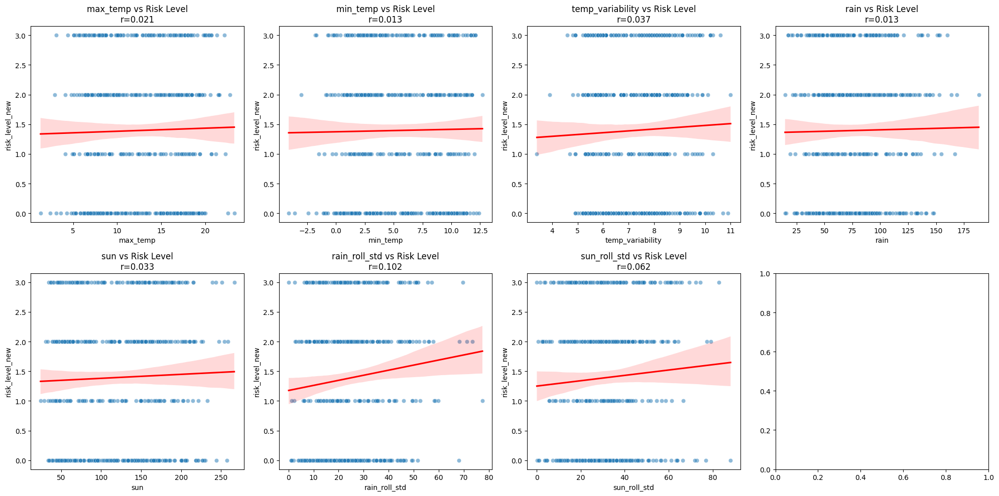

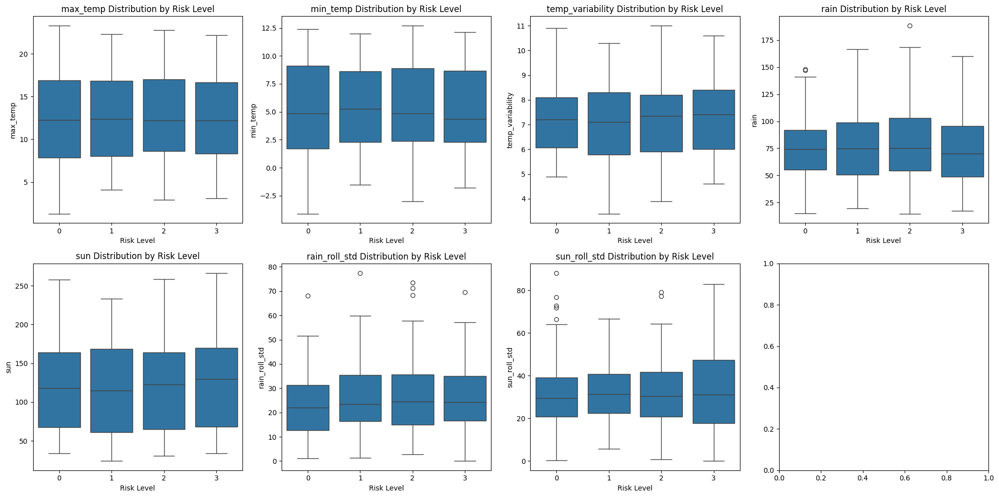

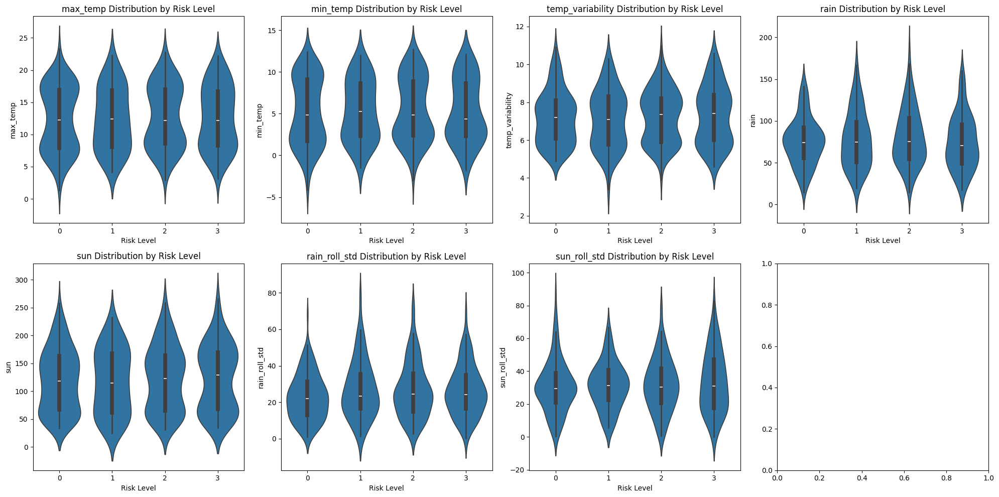


Mean values by risk level:
                max_temp  min_temp  temp_variability    rain      sun  \
risk_level_new                                                          
0                 12.408     5.227             7.180  75.627  119.548   
1                 12.424     5.317             7.107  78.384  117.902   
2                 12.727     5.472             7.255  81.127  123.466   
3                 12.599     5.294             7.305  74.983  123.462   

                rain_roll_std  sun_roll_std  
risk_level_new                               
0                      22.920        30.732  
1                      27.188        31.397  
2                      26.820        31.841  
3                      26.396        33.543  

Standard deviation by risk level:
                max_temp  min_temp  temp_variability    rain     sun  \
risk_level_new                                                         
0                  5.016     4.020             1.403  28.562  55.884   
1     

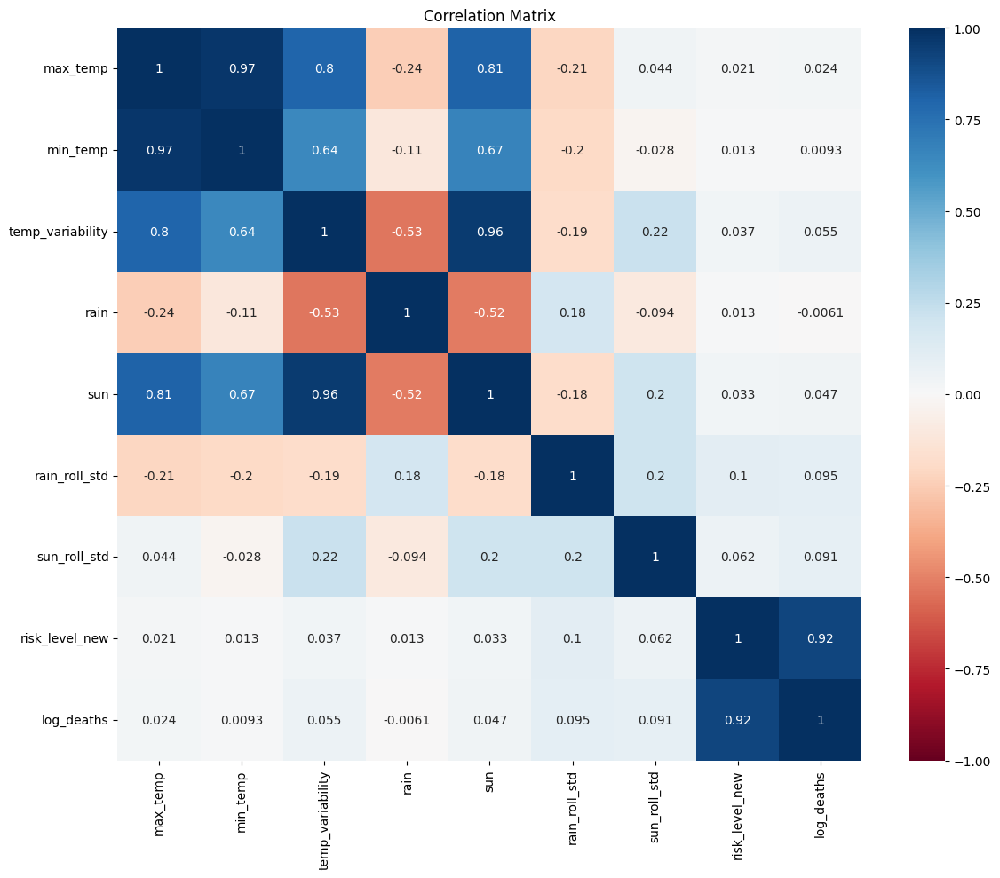

In [45]:
# Select key metrics for analysis
key_metrics = [
    'max_temp', 'min_temp', 'temp_variability', 
    'rain', 'sun', 'rain_roll_std', 'sun_roll_std'
]

# Create correlation plots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()

# Plot correlations for each metric
for idx, metric in enumerate(key_metrics):
    # Scatter plot with risk levels
    sns.scatterplot(
        data=monthly_risk_data,
        x=metric,
        y='risk_level_new',
        alpha=0.5,
        ax=axes[idx]
    )
    # Add trend line
    sns.regplot(
        data=monthly_risk_data,
        x=metric,
        y='risk_level_new',
        scatter=False,
        color='red',
        ax=axes[idx]
    )
    axes[idx].set_title(f'{metric} vs Risk Level\nr={correlations_new["risk_level_new"][metric]:.3f}')

plt.tight_layout()
plt.show()

# Create box plots to show distribution of metrics within each risk level
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()

for idx, metric in enumerate(key_metrics):
    sns.boxplot(
        data=monthly_risk_data,
        x='risk_level_new',
        y=metric,
        ax=axes[idx]
    )
    axes[idx].set_title(f'{metric} Distribution by Risk Level')
    axes[idx].set_xlabel('Risk Level')

plt.tight_layout()
plt.show()

# Create violin plots to show detailed distribution
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()

for idx, metric in enumerate(key_metrics):
    sns.violinplot(
        data=monthly_risk_data,
        x='risk_level_new',
        y=metric,
        ax=axes[idx]
    )
    axes[idx].set_title(f'{metric} Distribution by Risk Level')
    axes[idx].set_xlabel('Risk Level')

plt.tight_layout()
plt.show()

# Calculate mean values for each metric by risk level
print("\nMean values by risk level:")
risk_level_means = monthly_risk_data.groupby('risk_level_new')[key_metrics].mean().round(3)
print(risk_level_means)

# Calculate standard deviation for each metric by risk level
print("\nStandard deviation by risk level:")
risk_level_stds = monthly_risk_data.groupby('risk_level_new')[key_metrics].std().round(3)
print(risk_level_stds)

# Perform ANOVA test for each metric to test if differences between risk levels are significant
from scipy import stats

print("\nANOVA test results:")
for metric in key_metrics:
    groups = [group[metric].values for name, group in monthly_risk_data.groupby('risk_level_new')]
    f_stat, p_val = stats.f_oneway(*groups)
    print(f"{metric:15} F-statistic: {f_stat:.3f}, p-value: {p_val:.3f}")

# Create a correlation matrix heatmap for all features
plt.figure(figsize=(12, 10))
sns.heatmap(
    monthly_risk_data[key_metrics + ['risk_level_new', 'log_deaths']].corr(),
    annot=True,
    cmap='RdBu',
    center=0,
    vmin=-1,
    vmax=1
)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()


Correlations with log_deaths for Pre-2010:
log_deaths          1.000000
temp_variability    0.077717
max_temp            0.052253
sun                 0.051649
min_temp            0.037692
rain               -0.032951
Name: log_deaths, dtype: float64

Correlations with log_deaths for Post-2010:
log_deaths          1.000000
sun                 0.042679
rain                0.039588
temp_variability    0.020635
max_temp           -0.023768
min_temp           -0.037998
Name: log_deaths, dtype: float64


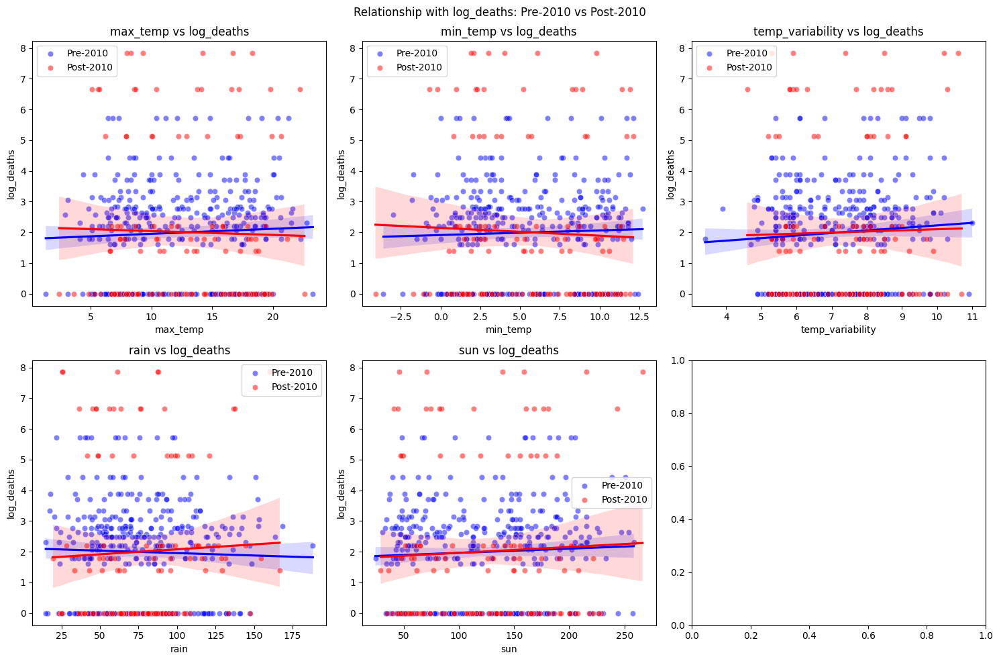

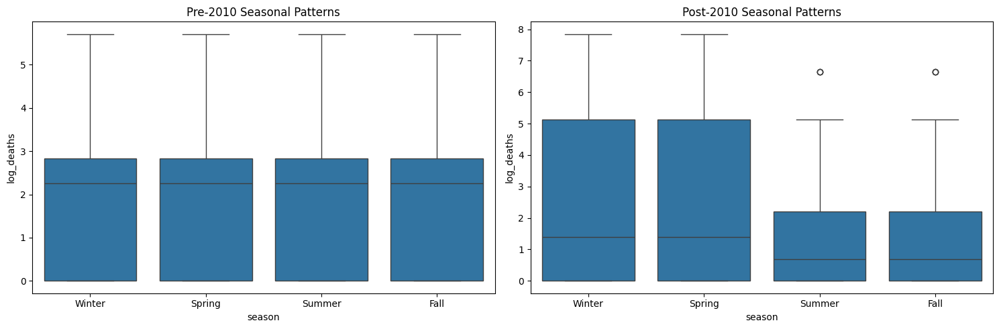


Summary Statistics:

Pre-2010:
count    360.000000
mean       1.992683
std        1.527965
min        0.000000
25%        0.000000
50%        2.249905
75%        2.833213
max        5.710427
Name: log_deaths, dtype: float64

Post-2010:
count    126.000000
mean       2.007095
std        2.572790
min        0.000000
25%        0.000000
50%        1.386294
75%        2.197225
max        7.847372
Name: log_deaths, dtype: float64

Monthly Patterns:

Pre-2010 monthly averages:
month
1     1.992683
2     1.992683
3     1.992683
4     1.992683
5     1.992683
6     1.992683
7     1.992683
8     1.992683
9     1.992683
10    1.992683
11    1.992683
12    1.992683
Name: log_deaths, dtype: float64

Post-2010 monthly averages:
month
1     2.272562
2     2.272562
3     2.272562
4     2.272562
5     2.272562
6     2.272562
7     1.715081
8     1.715081
9     1.715081
10    1.715081
11    1.715081
12    1.715081
Name: log_deaths, dtype: float64

Composite Indicator Correlations:
temp_rain_interaction

In [46]:
# Split data into pre-2010 and post-2010 periods
pre_2010 = monthly_risk_data[monthly_risk_data['year'] < 2010]
post_2010 = monthly_risk_data[monthly_risk_data['year'] >= 2010]

# Define key metrics based on initial findings
key_metrics = ['max_temp', 'min_temp', 'temp_variability', 'rain', 'sun']

# Calculate correlations for both periods
def analyze_period(data, period_name):
    corr = data[key_metrics + ['log_deaths']].corr()['log_deaths'].sort_values(ascending=False)
    print(f"\nCorrelations with log_deaths for {period_name}:")
    print(corr)
    return corr

pre_2010_corr = analyze_period(pre_2010, "Pre-2010")
post_2010_corr = analyze_period(post_2010, "Post-2010")

# Visualize the relationships
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Relationship with log_deaths: Pre-2010 vs Post-2010')

for idx, metric in enumerate(key_metrics):
    ax = axes[idx // 3, idx % 3]
    
    # Pre-2010
    sns.scatterplot(
        data=pre_2010,
        x=metric,
        y='log_deaths',
        alpha=0.5,
        color='blue',
        label='Pre-2010',
        ax=ax
    )
    sns.regplot(
        data=pre_2010,
        x=metric,
        y='log_deaths',
        scatter=False,
        color='blue',
        ax=ax
    )
    
    # Post-2010
    sns.scatterplot(
        data=post_2010,
        x=metric,
        y='log_deaths',
        alpha=0.5,
        color='red',
        label='Post-2010',
        ax=ax
    )
    sns.regplot(
        data=post_2010,
        x=metric,
        y='log_deaths',
        scatter=False,
        color='red',
        ax=ax
    )
    
    ax.set_title(f'{metric} vs log_deaths')
    ax.legend()

plt.tight_layout()
plt.show()

# Analyze seasonal patterns in both periods
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Pre-2010 seasonal patterns
sns.boxplot(
    data=pre_2010,
    x='season',
    y='log_deaths',
    ax=axes[0]
)
axes[0].set_title('Pre-2010 Seasonal Patterns')

# Post-2010 seasonal patterns
sns.boxplot(
    data=post_2010,
    x='season',
    y='log_deaths',
    ax=axes[1]
)
axes[1].set_title('Post-2010 Seasonal Patterns')

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print("\nPre-2010:")
print(pre_2010['log_deaths'].describe())
print("\nPost-2010:")
print(post_2010['log_deaths'].describe())

# Calculate monthly averages for both periods
pre_2010_monthly = pre_2010.groupby('month')['log_deaths'].mean()
post_2010_monthly = post_2010.groupby('month')['log_deaths'].mean()

print("\nMonthly Patterns:")
print("\nPre-2010 monthly averages:")
print(pre_2010_monthly)
print("\nPost-2010 monthly averages:")
print(post_2010_monthly)

# Create composite indicators that might be more predictive
monthly_risk_data['temp_rain_interaction'] = monthly_risk_data['max_temp'] * monthly_risk_data['rain']
monthly_risk_data['temp_sun_interaction'] = monthly_risk_data['max_temp'] * monthly_risk_data['sun']

# Analyze these composite indicators
print("\nComposite Indicator Correlations:")
composite_corr = monthly_risk_data[['temp_rain_interaction', 'temp_sun_interaction', 'log_deaths']].corr()['log_deaths']
print(composite_corr)

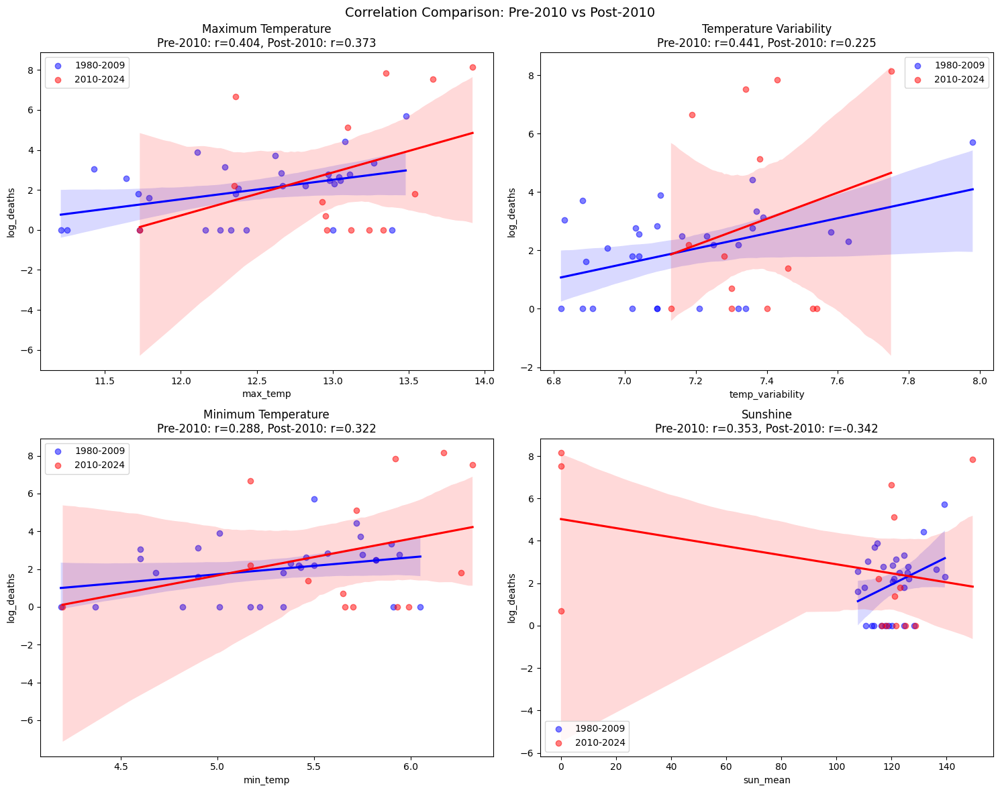

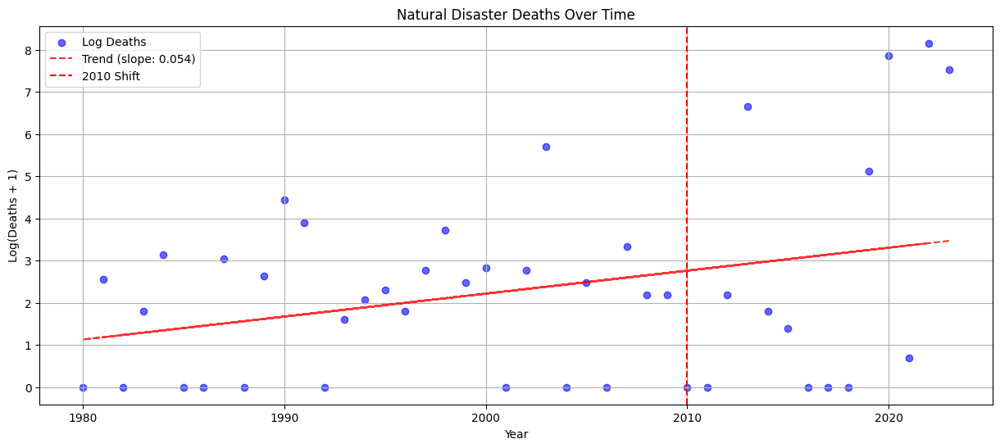

In [47]:
# Create plots comparing correlations between periods
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Correlation Comparison: Pre-2010 vs Post-2010', fontsize=14)

# Split data into periods
pre_2010 = feature_matrix[feature_matrix['year'] < 2010]
post_2010 = feature_matrix[feature_matrix['year'] >= 2010]

# Plot for each metric
metrics = ['max_temp', 'temp_variability', 'min_temp', 'sun_mean']
titles = ['Maximum Temperature', 'Temperature Variability', 'Minimum Temperature', 'Sunshine']

for idx, (metric, title) in enumerate(zip(metrics, titles)):
    row = idx // 2
    col = idx % 2
    
    # Pre-2010
    sns.regplot(
        data=pre_2010,
        x=metric,
        y='log_deaths',
        ax=axes[row, col],
        scatter_kws={'alpha':0.5},
        label='1980-2009',
        color='blue'
    )
    
    # Post-2010
    sns.regplot(
        data=post_2010,
        x=metric,
        y='log_deaths',
        ax=axes[row, col],
        scatter_kws={'alpha':0.5},
        label='2010-2024',
        color='red'
    )
    
    # Add correlations to title
    pre_corr = pre_2010[metric].corr(pre_2010['log_deaths']).round(3)
    post_corr = post_2010[metric].corr(post_2010['log_deaths']).round(3)
    axes[row, col].set_title(f'{title}\nPre-2010: r={pre_corr}, Post-2010: r={post_corr}')
    axes[row, col].legend()

plt.tight_layout()
plt.show()

# Create time series plot showing the shift with trendline
plt.figure(figsize=(15, 6))

# Scatter plot of actual values
plt.scatter(feature_matrix['year'], feature_matrix['log_deaths'], 
           color='blue', alpha=0.6, label='Log Deaths')

# Add trendline using numpy's polyfit
z = np.polyfit(feature_matrix['year'], feature_matrix['log_deaths'], 1)
p = np.poly1d(z)
plt.plot(feature_matrix['year'], p(feature_matrix['year']), 
         "r--", alpha=0.8, label=f'Trend (slope: {z[0]:.3f})')

# Add vertical line for 2010
plt.axvline(x=2010, color='r', linestyle='--', label='2010 Shift')

plt.title('Natural Disaster Deaths Over Time')
plt.xlabel('Year')
plt.ylabel('Log(Deaths + 1)')
plt.legend()
plt.grid(True)
plt.show()

In [48]:
print(disasters_df['Disaster Type'].unique())

['Storm' 'Epidemic' 'Earthquake' 'Extreme temperature' 'Flood' 'Drought']


In [49]:
import warnings
warnings.filterwarnings('ignore')

def create_disaster_frequency_matrix(disasters_df, feature_matrix):
    """
    Create a matrix of disaster frequencies by year and type
    """
    # Create pivot table of disaster counts by year and type
    disaster_counts = pd.crosstab(
        disasters_df['Start Year'], 
        disasters_df['Disaster Type']
    ).reset_index()
    
    # Merge with feature matrix
    return pd.merge(
        feature_matrix,
        disaster_counts,
        left_on='year',
        right_on='Start Year',
        how='left'
    ).fillna(0)

def analyze_disaster_correlations(data, weather_metrics, disaster_types, period_name):
    """
    Calculate correlations between weather metrics and disaster types
    """
    correlations = pd.DataFrame(index=weather_metrics)
    
    # Calculate correlations for both frequency and severity
    for disaster in disaster_types:
        # Frequency correlations
        freq_corrs = [data[metric].corr(data[disaster]) for metric in weather_metrics]
        correlations[f'{disaster}_freq'] = freq_corrs
        
        # Severity correlations (if disasters occurred)
        mask = data[disaster] > 0
        if mask.sum() > 0:
            severity_data = data[mask]
            sev_corrs = [severity_data[metric].corr(severity_data['log_deaths']) 
                        for metric in weather_metrics]
            correlations[f'{disaster}_severity'] = sev_corrs
    
    return correlations

def plot_correlation_heatmap(correlations, period_name):
    """
    Plot heatmap of correlations
    """
    plt.figure(figsize=(15, 8))
    sns.heatmap(correlations, annot=True, cmap='RdBu', center=0, fmt='.2f')
    plt.title(f'Weather-Disaster Correlations: {period_name}')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

def analyze_disaster_patterns(feature_matrix, disasters_df):
    """
    Main analysis function
    """
    # Define metrics and prepare data
    weather_metrics = ['max_temp', 'temp_variability', 'min_temp', 'sun_mean']
    disaster_types = ['Storm', 'Flood', 'Extreme temperature']
    
    # Create frequency matrix
    full_matrix = create_disaster_frequency_matrix(disasters_df, feature_matrix)
    
    # Split data into periods
    pre_2010 = full_matrix[full_matrix['year'] < 2010]
    post_2010 = full_matrix[full_matrix['year'] >= 2010]
    
    # Analyze correlations for each period
    pre_2010_corrs = analyze_disaster_correlations(
        pre_2010, weather_metrics, disaster_types, 'Pre-2010'
    )
    post_2010_corrs = analyze_disaster_correlations(
        post_2010, weather_metrics, disaster_types, 'Post-2010'
    )
    
    # Plot correlation heatmaps
    plot_correlation_heatmap(pre_2010_corrs, 'Pre-2010')
    plot_correlation_heatmap(post_2010_corrs, 'Post-2010')
    
    # Analyze trends over time
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Disaster Frequency Trends by Type', fontsize=14)
    
    for idx, disaster in enumerate(disaster_types):
        row = idx // 2
        col = idx % 2
        
        # Plot frequency over time
        sns.regplot(
            data=full_matrix,
            x='year',
            y=disaster,
            ax=axes[row, col],
            scatter_kws={'alpha':0.5}
        )
        axes[row, col].set_title(f'{disaster} Frequency')
        axes[row, col].axvline(x=2010, color='r', linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()
    
    return pre_2010_corrs, post_2010_corrs

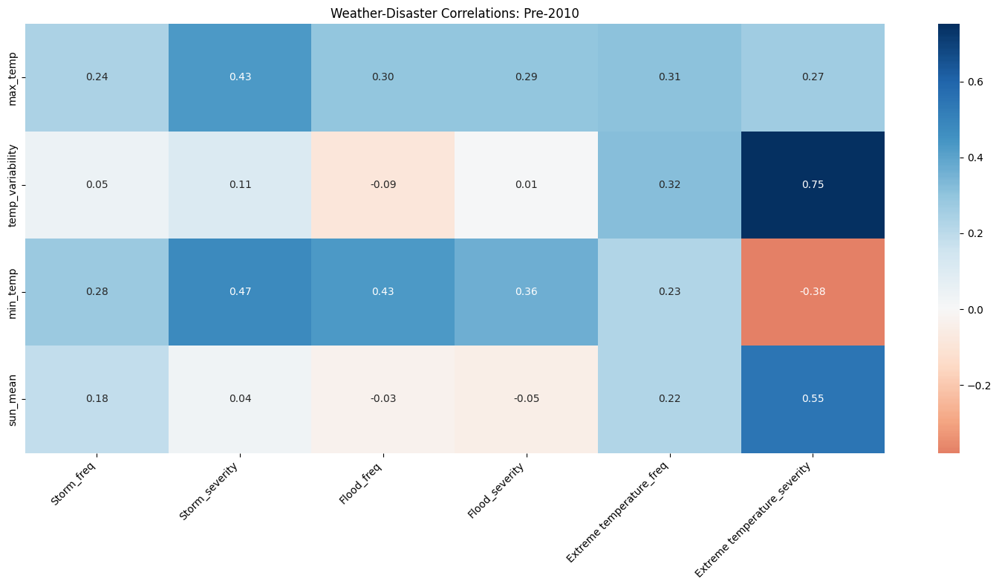

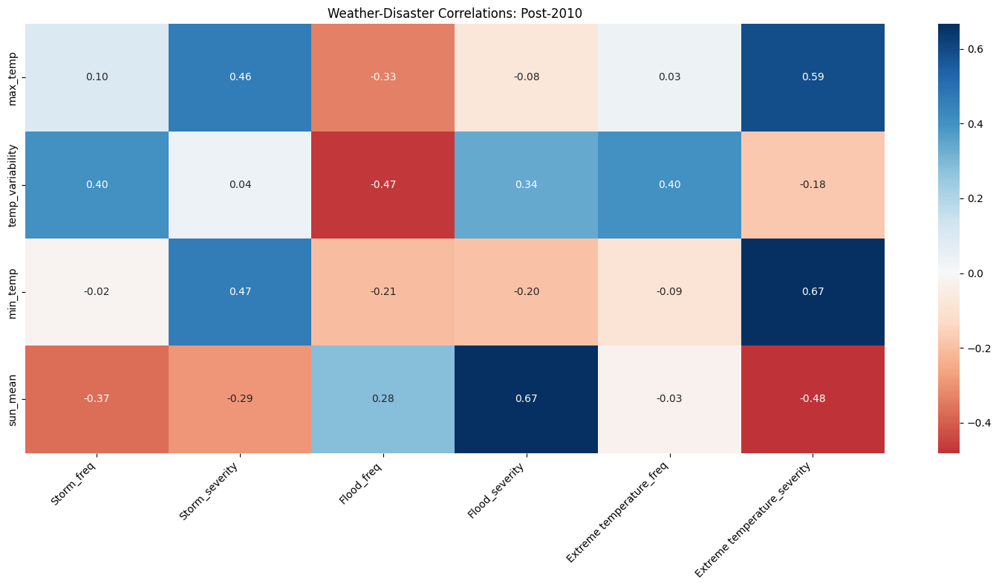

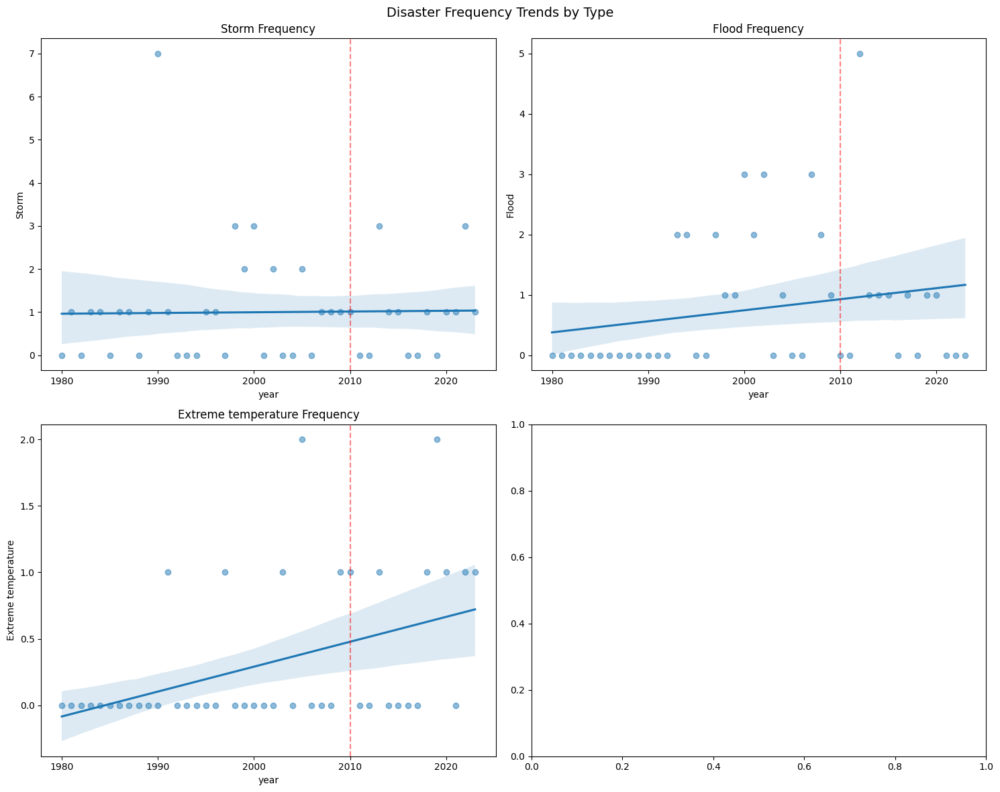

In [50]:
pre_corrs, post_corrs = analyze_disaster_patterns(feature_matrix, disasters_df)

In [51]:
met_data.columns.to_list()

['year', 'month', 'tmax', 'tmin', 'af', 'rain', 'sun', 'station']

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_disaster_frequency_over_time(disasters_df):
    """
    Create a stacked bar chart showing disaster frequency by type over years
    """
    # Create annual counts by disaster type
    annual_counts = pd.crosstab(disasters_df['Start Year'], disasters_df['Disaster Type'])
    
    # Plot stacked bar chart
    plt.figure(figsize=(15, 7))
    annual_counts.plot(kind='bar', stacked=True)
    plt.title('Distribution of Disaster Types by Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Disasters')
    plt.xticks(rotation=45)
    plt.legend(title='Disaster Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

def plot_disaster_type_distribution(disasters_df):
    """
    Create a pie chart showing overall distribution of disaster types
    """
    type_counts = disasters_df['Disaster Type'].value_counts()
    
    plt.figure(figsize=(10, 8))
    plt.pie(type_counts.values, labels=type_counts.index, autopct='%1.1f%%')
    plt.title('Overall Distribution of Disaster Types')
    plt.axis('equal')
    plt.show()

def plot_seasonal_distribution(disasters_df):
    """
    Create a heatmap showing seasonal patterns of different disaster types
    """
    # Create month by disaster type crosstab
    seasonal = pd.crosstab(disasters_df['Start Month'], disasters_df['Disaster Type'])
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(seasonal, cmap='YlOrRd', annot=True, fmt='d')
    plt.title('Seasonal Distribution of Disasters')
    plt.xlabel('Disaster Type')
    plt.ylabel('Month')
    plt.show()

def plot_disaster_severity(disasters_df):
    """
    Create box plots showing severity (deaths) by disaster type
    """
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Disaster Type', y='Total Deaths', data=disasters_df)
    plt.xticks(rotation=45)
    plt.title('Disaster Severity Distribution by Type')
    plt.tight_layout()
    plt.show()

def plot_decade_trends(disasters_df):
    """
    Create a line plot showing disaster frequency trends by decade
    """
    # Create decade column
    disasters_df['Decade'] = (disasters_df['Start Year'] // 10) * 10
    decade_counts = pd.crosstab(disasters_df['Decade'], disasters_df['Disaster Type'])
    
    plt.figure(figsize=(12, 6))
    for column in decade_counts.columns:
        plt.plot(decade_counts.index, decade_counts[column], marker='o', label=column)
    
    plt.title('Disaster Frequency by Decade')
    plt.xlabel('Decade')
    plt.ylabel('Number of Disasters')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Run all visualizations
def analyze_disaster_distributions(disasters_df):
    """
    Generate all disaster distribution visualizations
    """
    plot_disaster_frequency_over_time(disasters_df)
    plot_disaster_type_distribution(disasters_df)
    plot_seasonal_distribution(disasters_df)
    plot_disaster_severity(disasters_df)
    plot_decade_trends(disasters_df)


<Figure size 1500x700 with 0 Axes>

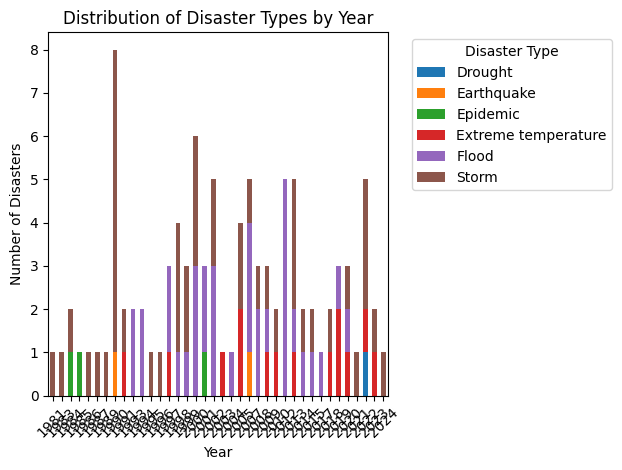

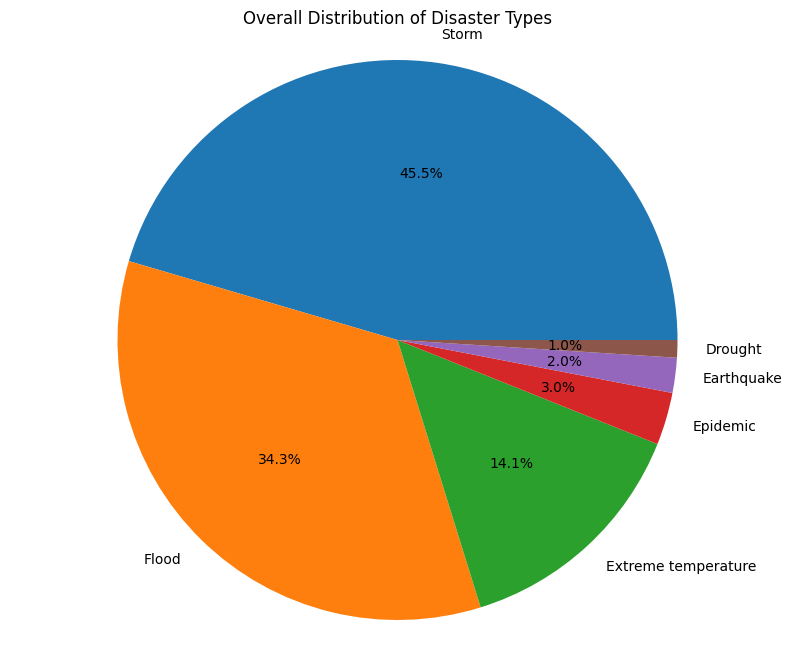

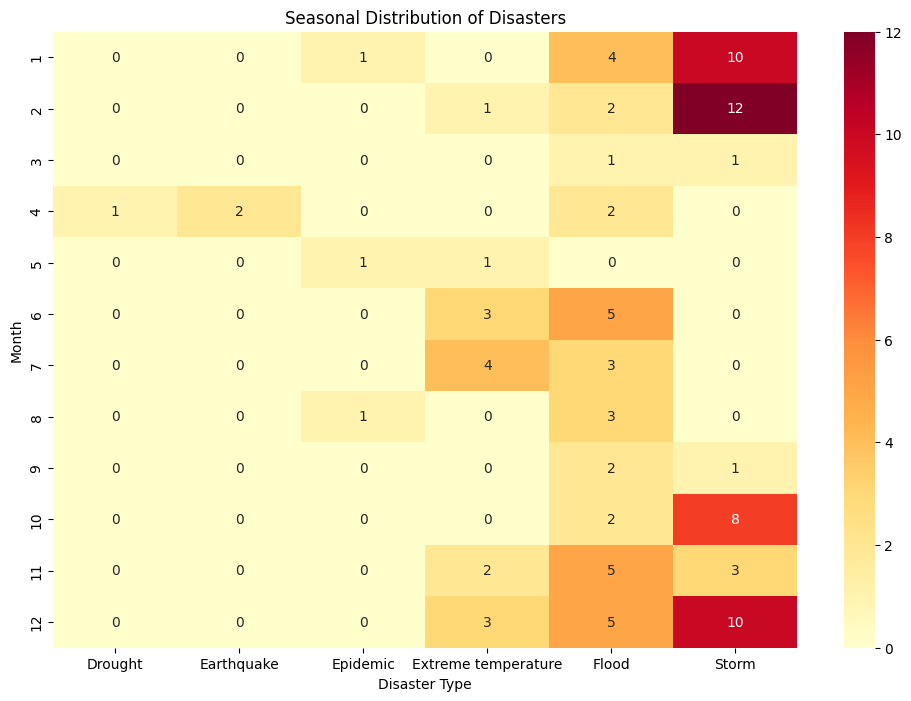

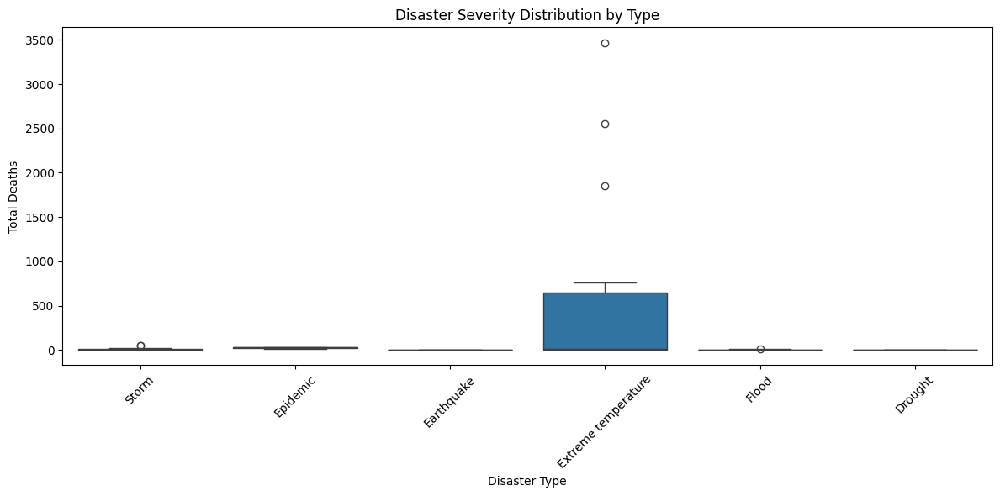

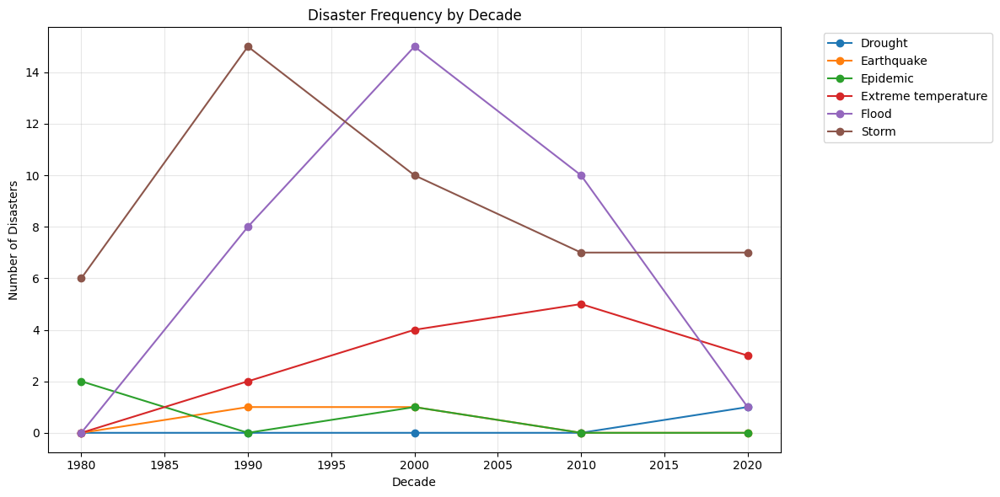

In [53]:
analyze_disaster_distributions(disasters_df)

In [54]:
soil_moisture_df = pd.read_csv('Flows and Soil Moisture.csv')

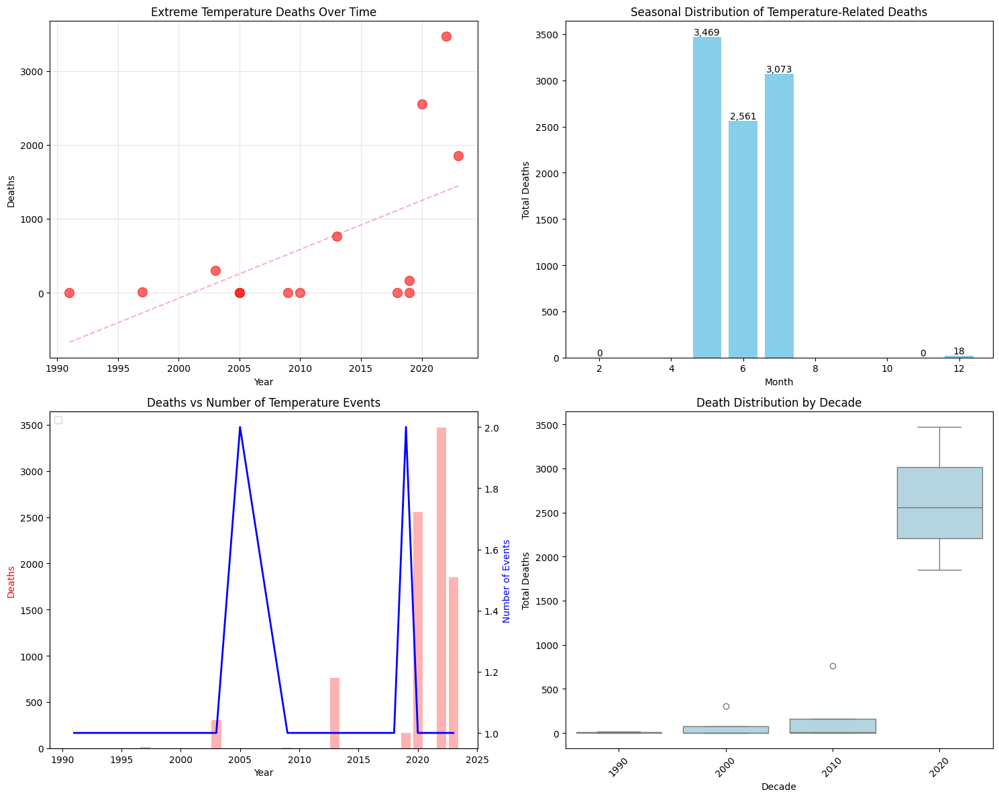


Summary Statistics for Extreme Temperature Events:
--------------------------------------------------
Total number of events: 14
Total deaths: 9,121.0
Average deaths per event: 651.50
Median deaths per event: 9.50

Worst Events:
    Start Year  Start Month  Total Deaths
94        2022            5        3469.0
89        2020            6        2556.0
96        2023            7        1851.0

Monthly Analysis:
--------------------------------------------------
Month  1: No events
Month  2:  1 events, 0.0 deaths
Month  3: No events
Month  4: No events
Month  5:  1 events, 3,469.0 deaths
Month  6:  3 events, 2,561.0 deaths
Month  7:  4 events, 3,073.0 deaths
Month  8: No events
Month  9: No events
Month 10: No events
Month 11:  2 events, 0.0 deaths
Month 12:  3 events, 18.0 deaths


In [55]:
def analyze_extreme_temp_deaths(disasters_df):
    """
    Detailed analysis of extreme temperature deaths
    """
    # Filter for extreme temperature events
    temp_disasters = disasters_df[disasters_df['Disaster Type'] == 'Extreme temperature'].copy()
    
    # Create figure with multiple subplots
    fig = plt.figure(figsize=(15, 12))
    
    # 1. Deaths over time
    plt.subplot(2, 2, 1)
    plt.scatter(temp_disasters['Start Year'], temp_disasters['Total Deaths'],
                alpha=0.6, s=100, color='red')
    
    # Add trend line
    z = np.polyfit(temp_disasters['Start Year'], temp_disasters['Total Deaths'], 1)
    p = np.poly1d(z)
    plt.plot(temp_disasters['Start Year'], 
             p(temp_disasters['Start Year']), 
             'r--', alpha=0.3)
    
    plt.title('Extreme Temperature Deaths Over Time')
    plt.xlabel('Year')
    plt.ylabel('Deaths')
    plt.grid(True, alpha=0.3)
    
    # 2. Monthly distribution of deaths
    plt.subplot(2, 2, 2)
    monthly_deaths = temp_disasters.groupby('Start Month')['Total Deaths'].sum()
    bars = plt.bar(monthly_deaths.index, monthly_deaths.values, color='skyblue')
    
    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height):,}',
                ha='center', va='bottom')
    
    plt.title('Seasonal Distribution of Temperature-Related Deaths')
    plt.xlabel('Month')
    plt.ylabel('Total Deaths')
    
    # 3. Deaths vs Frequency
    plt.subplot(2, 2, 3)
    yearly_deaths = temp_disasters.groupby('Start Year').agg({
        'Total Deaths': 'sum',
        'Disaster Type': 'count'
    }).reset_index()
    
    fig1 = plt.gca()
    fig2 = fig1.twinx()
    
    bars = fig1.bar(yearly_deaths['Start Year'], yearly_deaths['Total Deaths'],
             alpha=0.3, color='red', label='Deaths')
    lines = fig2.plot(yearly_deaths['Start Year'], yearly_deaths['Disaster Type'],
              'b-', label='Number of Events', linewidth=2)
    
    fig1.set_xlabel('Year')
    fig1.set_ylabel('Deaths', color='red')
    fig2.set_ylabel('Number of Events', color='blue')
    
    # Add legend
    legends = bars.get_label(), lines[0].get_label()
    plt.legend(legends, ['Deaths', 'Events'], loc='upper left')
    
    plt.title('Deaths vs Number of Temperature Events')
    
    # 4. Death distribution boxplot by decade
    plt.subplot(2, 2, 4)
    temp_disasters['Decade'] = (temp_disasters['Start Year'] // 10) * 10
    sns.boxplot(x='Decade', y='Total Deaths', data=temp_disasters, color='lightblue')
    plt.xticks(rotation=45)
    plt.title('Death Distribution by Decade')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\nSummary Statistics for Extreme Temperature Events:")
    print("-" * 50)
    print(f"Total number of events: {len(temp_disasters)}")
    print(f"Total deaths: {temp_disasters['Total Deaths'].sum():,}")
    print(f"Average deaths per event: {temp_disasters['Total Deaths'].mean():.2f}")
    print(f"Median deaths per event: {temp_disasters['Total Deaths'].median():.2f}")
    
    print("\nWorst Events:")
    print(temp_disasters.nlargest(3, 'Total Deaths')[[
        'Start Year', 'Start Month', 'Total Deaths'
    ]].to_string())
    
    # Monthly distribution analysis
    monthly_counts = temp_disasters.groupby('Start Month').size()
    monthly_deaths = temp_disasters.groupby('Start Month')['Total Deaths'].sum()
    
    print("\nMonthly Analysis:")
    print("-" * 50)
    for month in range(1, 13):
        if month in monthly_counts.index:
            print(f"Month {month:2d}: {monthly_counts[month]:2d} events, "
                  f"{monthly_deaths[month]:,} deaths")
        else:
            print(f"Month {month:2d}: No events")

analyze_extreme_temp_deaths(disasters_df)

In [56]:
print("Soil Moisture DataFrame Structure:")
print(soil_moisture_df.head(20))
print("\nColumns:", soil_moisture_df.columns.tolist())

Soil Moisture DataFrame Structure:
   file_timestamp                                     20241211211548
0        location                               point: 571500 278500
1    dataset_name  Historic G2G flows and soil moisture with Oudi...
2   dataset_title  Grid-to-Grid model estimates of monthly mean f...
3             DOI       10.5285/f52f012d-9f2e-42cc-b628-9cdea4fa3ba0
4      start_year                                               1891
5        end_year                                               2015
6       parameter                                               soil
7        interval                                            monthly
8       statistic                                               mean
9       procedure                                           modelled
10            UoM                                    mm water/m soil
11           Date                                               soil
12     1891-01-01                                             146.64

In [57]:
print("\nMean Temps Structure:")
print(type(mean_temps))
print(mean_temps.head() if isinstance(mean_temps, pd.DataFrame) else "Not a DataFrame")


Mean Temps Structure:
<class 'pandas.core.frame.DataFrame'>
     Start Year  mean_temp  temp_change
56         1884       8.48          NaN
132        1885       7.36        -1.12
129        1886       7.45         0.09
128        1887       7.51         0.06
133        1888       7.28        -0.23


In [58]:
def prepare_soil_moisture_data(soil_moisture_df):
    """
    Clean and prepare soil moisture data
    """
    # Convert the data structure
    soil_data = soil_moisture_df.copy()
    
    # Extract dates and values
    dates = []
    values = []
    
    for index, row in soil_data.iterrows():
        if isinstance(row.iloc[0], str) and '-' in row.iloc[0]:  # Check if it's a date
            try:
                date = pd.to_datetime(row.iloc[0])
                value = float(row.iloc[1])
                dates.append(date)
                values.append(value)
            except:
                continue
    
    # Create clean dataframe
    clean_soil_data = pd.DataFrame({
        'date': dates,
        'soil_moisture': values
    })
    
    # Set date as index and filter for >= 1980
    clean_soil_data.set_index('date', inplace=True)
    clean_soil_data = clean_soil_data[clean_soil_data.index.year >= 1980]
    
    return clean_soil_data

def prepare_mean_temps_data(mean_temps):
    """
    Clean and prepare mean temperature data
    """
    # Create a list to store monthly temperatures
    temp_data = []
    
    # Process each row
    for _, row in mean_temps.iterrows():
        year = row['year']
        monthly_values = row['monthly_temps']
        
        # Convert string representation to actual list if needed
        if isinstance(monthly_values, str):
            monthly_values = eval(monthly_values)
        
        # Extract just the temperature values (assuming every other value is a year)
        temps = monthly_values[::2]
        
        # Create entries for each month
        for month, temp in enumerate(temps, 1):
            temp_data.append({
                'date': pd.to_datetime(f"{year}-{month:02d}-01"),
                'mean_temp': float(temp)
            })
    
    # Convert to DataFrame
    clean_temp_data = pd.DataFrame(temp_data)
    clean_temp_data.set_index('date', inplace=True)
    
    return clean_temp_data

def prepare_integrated_data(disasters_df, soil_moisture_df, mean_temps):
    """
    Prepare and integrate all datasets
    """
    # Clean individual datasets
    clean_soil = prepare_soil_moisture_data(soil_moisture_df)
    clean_temps = prepare_mean_temps_data(mean_temps)
    
    # Print info about cleaned datasets
    print("Clean soil moisture data shape:", clean_soil.shape)
    print("Clean temperature data shape:", clean_temps.shape)
    print("\nFirst few rows of clean soil moisture data:")
    print(clean_soil.head())
    print("\nFirst few rows of clean temperature data:")
    print(clean_temps.head())
    
    # Create integrated dataset
    analysis_data = pd.DataFrame(index=clean_soil.index)
    analysis_data['soil_moisture'] = clean_soil['soil_moisture']
    analysis_data['mean_temp'] = clean_temps['mean_temp']
    
    # Add disaster information
    analysis_data['disaster_occurred'] = 0
    analysis_data['deaths'] = 0
    
    # Filter for extreme temperature events
    temp_disasters = disasters_df[
        disasters_df['Disaster Type'] == 'Extreme temperature'
    ].copy()
    
    # Add disaster occurrences
    for _, row in temp_disasters.iterrows():
        date = pd.to_datetime(f"{row['Start Year']}-{row['Start Month']:02d}-01")
        if date in analysis_data.index:
            analysis_data.loc[date, 'disaster_occurred'] = 1
            analysis_data.loc[date, 'deaths'] = row['Total Deaths']
    
    return analysis_data


In [59]:
integrated_data = prepare_integrated_data(disasters_df, soil_moisture_df, mean_temps)
print("\nFinal integrated data shape:", integrated_data.shape)
print("\nSample of final integrated data:")
print(integrated_data.head())

KeyError: 'year'

In [60]:
def prepare_annual_data(soil_moisture_df, disasters_df):
    """
    Prepare annual soil moisture data and combine with disaster information
    """
    # Extract dates and values for soil moisture
    soil_data = soil_moisture_df.copy()
    dates = []
    values = []
    
    for index, row in soil_data.iterrows():
        if isinstance(row.iloc[0], str) and '-' in row.iloc[0]:
            try:
                date = pd.to_datetime(row.iloc[0])
                value = float(row.iloc[1])
                dates.append(date)
                values.append(value)
            except:
                continue
    
    # Create clean soil moisture dataframe
    soil_df = pd.DataFrame({
        'date': dates,
        'soil_moisture': values
    })
    
    # Calculate annual means for soil moisture
    soil_df['year'] = soil_df['date'].dt.year
    annual_soil = soil_df[soil_df['year'] >= 1980].groupby('year')['soil_moisture'].mean()
    
    # Prepare disaster data
    temp_disasters = disasters_df[
        disasters_df['Disaster Type'] == 'Extreme temperature'
    ].copy()
    
    annual_disasters = temp_disasters.groupby('Start Year').agg({
        'Total Deaths': 'sum',
        'Disaster Type': 'count'
    }).rename(columns={'Disaster Type': 'num_disasters'})
    
    # Combine the data
    combined_data = pd.DataFrame(annual_soil)
    combined_data = combined_data.join(annual_disasters, how='left')
    combined_data.fillna(0, inplace=True)
    
    return combined_data

def analyze_annual_patterns(combined_data):
    """
    Create simple visualizations of annual patterns
    """
    # Create two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # 1. Soil moisture and deaths over time
    color = 'tab:blue'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Soil Moisture', color=color)
    line1 = ax1.plot(combined_data.index, combined_data['soil_moisture'], 
                     color=color, label='Soil Moisture')
    ax1.tick_params(axis='y', labelcolor=color)
    
    ax3 = ax1.twinx()
    color = 'tab:red'
    ax3.set_ylabel('Deaths', color=color)
    line2 = ax3.plot(combined_data.index, combined_data['Total Deaths'], 
                     color=color, label='Deaths')
    ax3.tick_params(axis='y', labelcolor=color)
    
    ax1.set_title('Soil Moisture and Deaths Over Time')
    
    # Combine legends
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper left')
    
    # 2. Scatter plot
    ax2.scatter(combined_data['soil_moisture'], combined_data['Total Deaths'])
    ax2.set_xlabel('Annual Mean Soil Moisture')
    ax2.set_ylabel('Annual Deaths')
    ax2.set_title('Relationship between Soil Moisture and Deaths')
    
    # Add simple trend line
    z = np.polyfit(combined_data['soil_moisture'], combined_data['Total Deaths'], 1)
    p = np.poly1d(z)
    ax2.plot(combined_data['soil_moisture'], p(combined_data['soil_moisture']), "r--", alpha=0.8)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\nCorrelation between soil moisture and deaths:", 
          combined_data['soil_moisture'].corr(combined_data['Total Deaths']).round(3))
    
    print("\nYears with highest death counts:")
    print(combined_data.nlargest(3, 'Total Deaths')[['soil_moisture', 'Total Deaths']])
    
    print("\nYears with lowest soil moisture:")
    print(combined_data.nsmallest(3, 'soil_moisture')[['soil_moisture', 'Total Deaths']])


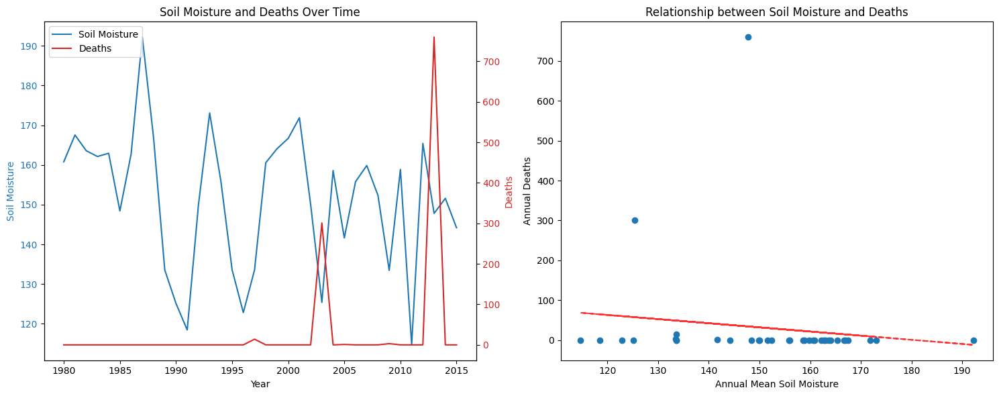


Correlation between soil moisture and deaths: -0.134

Years with highest death counts:
      soil_moisture  Total Deaths
year                             
2013     147.805833         760.0
2003     125.397500         301.0
1997     133.577500          14.0

Years with lowest soil moisture:
      soil_moisture  Total Deaths
year                             
2011     114.707500           0.0
1991     118.459167           0.0
1996     122.832500           0.0


In [61]:
combined_data = prepare_annual_data(soil_moisture_df, disasters_df)
analyze_annual_patterns(combined_data)

In [62]:
def analyze_specific_disasters(soil_moisture_df, disasters_df):
    """
    Analyze soil moisture relationships with specific disaster types
    """
    # Prepare annual soil moisture data
    soil_data = soil_moisture_df.copy()
    dates = []
    values = []
    
    for index, row in soil_data.iterrows():
        if isinstance(row.iloc[0], str) and '-' in row.iloc[0]:
            try:
                date = pd.to_datetime(row.iloc[0])
                value = float(row.iloc[1])
                dates.append(date)
                values.append(value)
            except:
                continue
    
    soil_df = pd.DataFrame({
        'date': dates,
        'soil_moisture': values
    })
    soil_df['year'] = soil_df['date'].dt.year
    annual_soil = soil_df[soil_df['year'] >= 1980].groupby('year')['soil_moisture'].mean()
    
    # Prepare disaster data by type
    disaster_types = ['Flood', 'Mass movement (wet)', 'Drought']
    annual_counts = {}
    
    for disaster_type in disaster_types:
        type_data = disasters_df[disasters_df['Disaster Type'] == disaster_type]
        annual_counts[disaster_type] = type_data.groupby('Start Year').size()
    
    # Create combined dataset
    combined_data = pd.DataFrame(annual_soil)
    for disaster_type in disaster_types:
        combined_data[disaster_type] = annual_counts[disaster_type]
    combined_data.fillna(0, inplace=True)
    
    # Create visualizations
    fig, axes = plt.subplots(2, 1, figsize=(15, 12))
    
    # 1. Soil moisture and disaster counts over time
    ax1 = axes[0]
    ax1.plot(combined_data.index, combined_data['soil_moisture'], 
             color='blue', label='Soil Moisture', alpha=0.7)
    ax1.set_ylabel('Soil Moisture', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    
    ax2 = ax1.twinx()
    colors = ['red', 'green', 'orange']
    for disaster_type, color in zip(disaster_types, colors):
        ax2.plot(combined_data.index, combined_data[disaster_type], 
                color=color, label=disaster_type, alpha=0.6, linestyle='--')
    
    ax2.set_ylabel('Number of Events')
    ax1.set_title('Soil Moisture and Disaster Events Over Time')
    plt.legend(loc='upper left')
    
    # 2. Correlation matrix heatmap
    ax3 = axes[1]
    corr_matrix = combined_data[['soil_moisture'] + disaster_types].corr()
    sns.heatmap(corr_matrix, annot=True, cmap='RdBu', center=0, ax=ax3)
    ax3.set_title('Correlation Matrix')
    
    plt.tight_layout()
    plt.show()
    
    # Print analysis
    print("\nSoil Moisture Threshold Analysis:")
    print("-" * 50)
    
    high_moisture = combined_data['soil_moisture'].quantile(0.75)
    low_moisture = combined_data['soil_moisture'].quantile(0.25)
    
    print(f"\nHigh soil moisture threshold (75th percentile): {high_moisture:.2f}")
    print(f"Low soil moisture threshold (25th percentile): {low_moisture:.2f}")
    
    for disaster_type in disaster_types:
        high_moisture_events = combined_data[
            combined_data['soil_moisture'] > high_moisture
        ][disaster_type].sum()
        low_moisture_events = combined_data[
            combined_data['soil_moisture'] < low_moisture
        ][disaster_type].sum()
        
        print(f"\n{disaster_type}:")
        print(f"Events during high soil moisture: {high_moisture_events}")
        print(f"Events during low soil moisture: {low_moisture_events}")


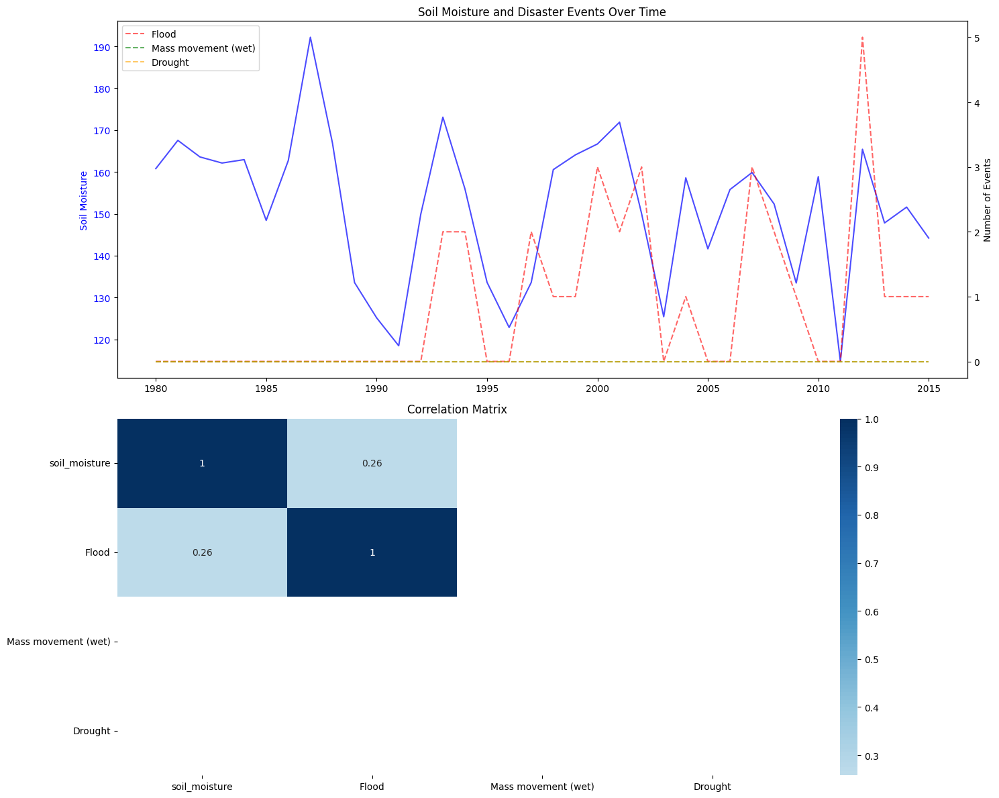


Soil Moisture Threshold Analysis:
--------------------------------------------------

High soil moisture threshold (75th percentile): 163.10
Low soil moisture threshold (25th percentile): 139.62

Flood:
Events during high soil moisture: 13.0
Events during low soil moisture: 3.0

Mass movement (wet):
Events during high soil moisture: 0.0
Events during low soil moisture: 0.0

Drought:
Events during high soil moisture: 0.0
Events during low soil moisture: 0.0


In [63]:
analyze_specific_disasters(soil_moisture_df, disasters_df)

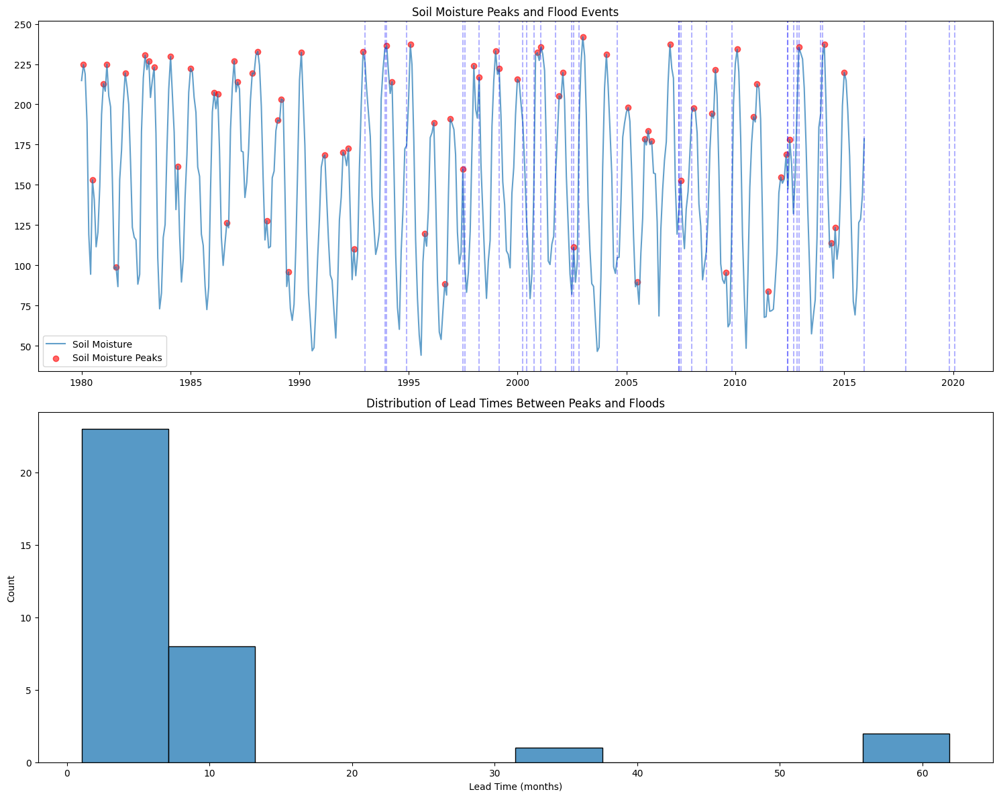


Lead Time Analysis:
--------------------------------------------------
Average lead time: 9.8 months
Median lead time: 5.6 months
Lead time range: 1.0 to 61.9 months

Risk Scoring Thresholds:
--------------------------------------------------
High soil moisture threshold: 197.8
High rainfall threshold: 95.9

Risk Score Validation:
--------------------------------------------------
Average risk score during flood months: 2.2413793103448274
Average risk score during non-flood months: 1.0074441687344913


In [64]:
def analyze_flood_lead_times(soil_moisture_df, disasters_df, met_data_1980):
    """
    Analyze lead times between soil moisture peaks and flood events,
    and create a risk scoring system
    """
    # Prepare soil moisture data
    # First, find where actual data starts (after metadata)
    data_start = soil_moisture_df.index[soil_moisture_df.iloc[:, 0].str.contains('-', na=False)].min()
    soil_data = soil_moisture_df.loc[data_start:].copy()
    
    # Convert to proper format
    soil_data.columns = ['date', 'soil_moisture']
    soil_data['soil_moisture'] = soil_data['soil_moisture'].astype(float)
    soil_data['date'] = pd.to_datetime(soil_data['date'])
    monthly_soil = soil_data.set_index('date')
    
    # Filter for period after 1980
    monthly_soil = monthly_soil[monthly_soil.index.year >= 1980]
    
    # Prepare flood events data
    flood_events = disasters_df[disasters_df['Disaster Type'] == 'Flood'].copy()
    flood_events['date'] = pd.to_datetime(
        flood_events['Start Year'].astype(str) + '-' + 
        flood_events['Start Month'].astype(str).str.zfill(2) + '-01'
    )
    
    # Prepare monthly rainfall data
    monthly_rain = met_data_1980.groupby(['year', 'month'])['rain'].mean().reset_index()
    monthly_rain['date'] = pd.to_datetime(
        monthly_rain['year'].astype(int).astype(str) + '-' + 
        monthly_rain['month'].astype(int).astype(str).str.zfill(2) + '-01'
    )
    
    # Calculate soil moisture peaks (local maxima)
    peaks = monthly_soil['soil_moisture'].rolling(window=3, center=True).max()
    peaks = peaks[peaks == monthly_soil['soil_moisture']]
    
    # Calculate lead times
    lead_times = []
    for flood_date in flood_events['date']:
        # Look for closest preceding peak
        preceding_peaks = peaks[peaks.index < flood_date]
        if not preceding_peaks.empty:
            closest_peak = preceding_peaks.index[-1]
            lead_time = (flood_date - closest_peak).days / 30  # Convert to months
            lead_times.append({
                'flood_date': flood_date,
                'peak_date': closest_peak,
                'lead_time': lead_time,
                'peak_value': peaks[closest_peak]
            })
    
    lead_times_df = pd.DataFrame(lead_times)
    
    # Create visualizations
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))
    
    # Plot 1: Soil moisture with peaks and floods
    ax1.plot(monthly_soil.index, monthly_soil['soil_moisture'], 
             label='Soil Moisture', alpha=0.7)
    ax1.scatter(peaks.index, peaks, color='red', 
                label='Soil Moisture Peaks', alpha=0.6)
    
    for flood_date in flood_events['date']:
        ax1.axvline(flood_date, color='blue', alpha=0.3, linestyle='--')
    
    ax1.set_title('Soil Moisture Peaks and Flood Events')
    ax1.legend()
    
    # Plot 2: Lead time distribution
    if not lead_times_df.empty:
        sns.histplot(data=lead_times_df, x='lead_time', bins=10, ax=ax2)
        ax2.set_title('Distribution of Lead Times Between Peaks and Floods')
        ax2.set_xlabel('Lead Time (months)')
    
    plt.tight_layout()
    plt.show()
    
    # Print analysis
    print("\nLead Time Analysis:")
    print("-" * 50)
    if not lead_times_df.empty:
        print(f"Average lead time: {lead_times_df['lead_time'].mean():.1f} months")
        print(f"Median lead time: {lead_times_df['lead_time'].median():.1f} months")
        print(f"Lead time range: {lead_times_df['lead_time'].min():.1f} to {lead_times_df['lead_time'].max():.1f} months")
    
    # Create risk scoring system
    soil_moisture_threshold = monthly_soil['soil_moisture'].quantile(0.75)
    rain_threshold = monthly_rain['rain'].quantile(0.75)
    
    print("\nRisk Scoring Thresholds:")
    print("-" * 50)
    print(f"High soil moisture threshold: {soil_moisture_threshold:.1f}")
    print(f"High rainfall threshold: {rain_threshold:.1f}")
    
    # Define risk scoring function
    def calculate_risk_score(soil_moisture, rainfall):
        score = 0
        if soil_moisture > soil_moisture_threshold:
            score += 2
        if rainfall > rain_threshold:
            score += 2
        if soil_moisture > soil_moisture_threshold and rainfall > rain_threshold:
            score += 1  # Extra point for both conditions
        return score
    
    # Add risk scores to monthly data
    monthly_data = pd.merge(
        monthly_soil.reset_index(),
        monthly_rain[['date', 'rain']],
        on='date',
        how='inner'
    )
    
    monthly_data['risk_score'] = monthly_data.apply(
        lambda x: calculate_risk_score(x['soil_moisture'], x['rain']), axis=1
    )
    
    # Validate risk scores against actual floods
    flood_months = flood_events['date'].dt.to_period('M')
    monthly_data['flood_occurred'] = monthly_data['date'].dt.to_period('M').isin(flood_months)
    
    print("\nRisk Score Validation:")
    print("-" * 50)
    print("Average risk score during flood months:", 
          monthly_data[monthly_data['flood_occurred']]['risk_score'].mean())
    print("Average risk score during non-flood months:", 
          monthly_data[~monthly_data['flood_occurred']]['risk_score'].mean())
    
    return monthly_data, lead_times_df

monthly_data, lead_times = analyze_flood_lead_times(soil_moisture_df, disasters_df, met_data_1980)

In [65]:
# Quick check of flood events timeline
flood_events = disasters_df[disasters_df['Disaster Type'] == 'Flood']
print("\nFlood Events Timeline:")
print("-" * 50)
print(flood_events[['Start Year', 'Start Month']].sort_values('Start Year'))


Flood Events Timeline:
--------------------------------------------------
    Start Year  Start Month
18        1993            1
19        1993           12
20        1994            1
21        1994           12
25        1997            7
26        1997            8
29        1998            4
31        1999            3
34        2000            4
35        2000            6
36        2000           10
40        2001            2
41        2001           10
44        2002            7
45        2002            8
47        2002           11
49        2004            8
55        2007            6
56        2007            6
57        2007            7
59        2008            1
61        2008            9
62        2009           11
71        2012           11
70        2012            6
69        2012            6
68        2012           12
67        2012            9
76        2013           12
77        2014            1
80        2015           12
81        2017           11
8

In [66]:
annual_sun_stats.head(20)

,year,sun_mean,sun_std,sun_max,sun_min,sun_3m_std_avg,sun_6m_std_avg,extreme_sun_days,sun_abs_zscore
0,1980.0,110.586022,58.002032,230.509677,42.809677,34.652069,49.649342,0,0.824015
1,1981.0,107.808203,49.285681,173.896774,40.373333,24.079745,37.018680,0,0.762368
2,1982.0,117.806604,61.694196,218.506452,37.548387,29.903884,50.164019,0,0.931356
3,1983.0,110.236442,59.393525,214.851613,40.635484,31.907093,47.050862,0,0.893336
4,1984.0,121.635413,69.221713,215.541935,46.033333,32.351912,55.360425,0,1.095087
5,1985.0,113.694372,47.956000,172.438710,34.383333,21.106786,37.509020,0,0.689283
6,1986.0,118.888126,50.905644,200.543750,44.706061,27.241033,40.399681,0,0.733532
7,1987.0,111.462839,51.218461,192.093939,34.284848,26.812211,40.215723,0,0.759498
8,1988.0,116.314469,50.627507,201.287500,33.896970,26.982453,42.310564,0,0.734823
9,1989.0,136.297711,77.224540,254.162500,30.568750,37.561392,59.658353,2,1.088181


In [67]:
def prepare_flood_prediction_data(soil_moisture_df, met_data_1980, disasters_df):
    """
    Prepare integrated dataset for flood prediction using only soil moisture and rainfall
    """
    # Process soil moisture data (monthly)
    data_start = soil_moisture_df.index[soil_moisture_df.iloc[:, 0].str.contains('-', na=False)].min()
    soil_data = soil_moisture_df.loc[data_start:].copy()
    soil_data.columns = ['date', 'soil_moisture']
    soil_data['soil_moisture'] = soil_data['soil_moisture'].astype(float)
    soil_data['date'] = pd.to_datetime(soil_data['date'])
    
    # Create monthly dataset
    monthly_data = soil_data.copy()
    monthly_data['year'] = monthly_data['date'].dt.year
    monthly_data['month'] = monthly_data['date'].dt.month
    
    # Filter for post-1993 data first
    monthly_data = monthly_data[monthly_data['year'] >= 1993]
    
    # Add monthly rainfall
    monthly_rain = met_data_1980.groupby(['year', 'month'])['rain'].mean().reset_index()
    monthly_data = pd.merge(
        monthly_data,
        monthly_rain,
        on=['year', 'month'],
        how='left'
    )
    
    # Calculate rolling soil moisture peaks
    monthly_data['soil_moisture_peak'] = monthly_data['soil_moisture'].rolling(3, center=True).max()
    monthly_data['is_peak'] = (monthly_data['soil_moisture'] == monthly_data['soil_moisture_peak'])
    
    # Add flood events
    flood_events = disasters_df[disasters_df['Disaster Type'] == 'Flood'].copy()
    flood_events['date'] = pd.to_datetime(
        flood_events['Start Year'].astype(str) + '-' + 
        flood_events['Start Month'].astype(str).str.zfill(2) + '-01'
    )
    
    monthly_data['flood_occurred'] = 0
    for date in flood_events['date']:
        if date.year >= 1993:  # Only consider floods after 1993
            mask = (monthly_data['date'].dt.year == date.year) & \
                   (monthly_data['date'].dt.month == date.month)
            monthly_data.loc[mask, 'flood_occurred'] = 1
    
    # Calculate months since last soil moisture peak
    monthly_data['months_since_peak'] = 0
    peak_dates = monthly_data[monthly_data['is_peak']]['date'].tolist()
    
    for i, row in monthly_data.iterrows():
        preceding_peaks = [d for d in peak_dates if d < row['date']]
        if preceding_peaks:
            last_peak = max(preceding_peaks)
            monthly_data.loc[i, 'months_since_peak'] = \
                (row['date'] - last_peak).days / 30
    
    # Calculate risk scores
    def calculate_risk_score(row):
        score = 0
        
        # Soil moisture component
        if row['soil_moisture'] > monthly_data['soil_moisture'].quantile(0.75):
            score += 2
        
        # Rainfall component
        if row['rain'] > monthly_data['rain'].quantile(0.75):
            score += 2
        
        # Combined high risk
        if (row['soil_moisture'] > monthly_data['soil_moisture'].quantile(0.75) and 
            row['rain'] > monthly_data['rain'].quantile(0.75)):
            score += 1
        
        return score
    
    monthly_data['risk_score'] = monthly_data.apply(calculate_risk_score, axis=1)
    
    return monthly_data

def analyze_flood_risk_model(monthly_data):
    """
    Analyze the effectiveness of the flood risk model
    """
    # Calculate average risk scores
    avg_risk_flood = monthly_data[monthly_data['flood_occurred'] == 1]['risk_score'].mean()
    avg_risk_no_flood = monthly_data[monthly_data['flood_occurred'] == 0]['risk_score'].mean()
    
    print("Model Performance Analysis:")
    print("-" * 50)
    print(f"Average risk score during flood months: {avg_risk_flood:.2f}")
    print(f"Average risk score during non-flood months: {avg_risk_no_flood:.2f}")
    
    # Calculate lead time statistics for this period
    flood_months = monthly_data[monthly_data['flood_occurred'] == 1]
    print(f"\nNumber of flood events: {len(flood_months)}")
    print(f"Average months since last peak during floods: {flood_months['months_since_peak'].mean():.1f}")
    print(f"Median months since last peak during floods: {flood_months['months_since_peak'].median():.1f}")
    
    # Plot visualizations
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Risk score distribution
    sns.boxplot(x='flood_occurred', y='risk_score', data=monthly_data, ax=ax1)
    ax1.set_title('Risk Score Distribution by Flood Occurrence')
    ax1.set_xlabel('Flood Occurred')
    ax1.set_ylabel('Risk Score')
    
    # Months since peak distribution
    sns.histplot(data=flood_months, x='months_since_peak', bins=10, ax=ax2)
    ax2.set_title('Lead Times for Flood Events\n(Months Since Last Soil Moisture Peak)')
    ax2.set_xlabel('Months')
    
    plt.tight_layout()
    plt.show()
    
    return monthly_data

Model Performance Analysis:
--------------------------------------------------
Average risk score during flood months: 2.34
Average risk score during non-flood months: 0.94

Number of flood events: 29
Average months since last peak during floods: 5.0
Median months since last peak during floods: 5.0


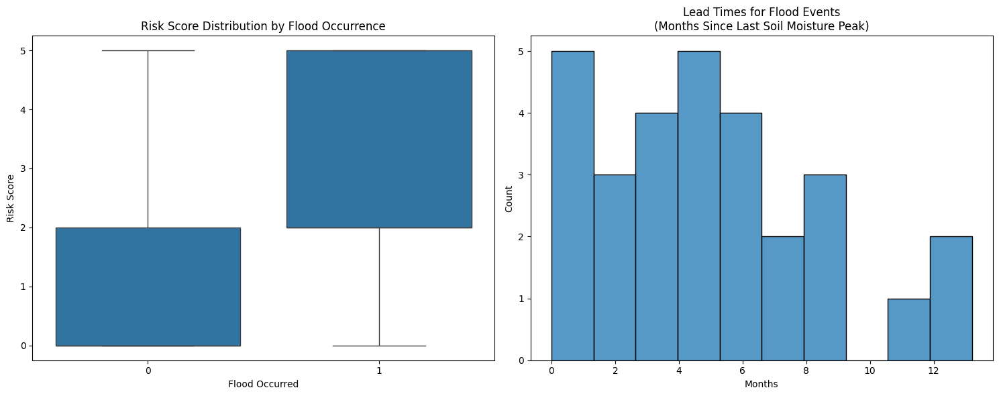

In [68]:
monthly_data = prepare_flood_prediction_data(soil_moisture_df, met_data_1980, disasters_df)
analyzed_data = analyze_flood_risk_model(monthly_data)

In [88]:
def plot_flood_lead_times(monthly_data):
    """
    Create comprehensive visualization of soil moisture peaks and flood events
    """
    plt.figure(figsize=(15, 10))
    
    # Main plot with soil moisture
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    
    # Plot soil moisture
    ax1.plot(monthly_data['date'], monthly_data['soil_moisture'], 
             color='blue', alpha=0.6, label='Soil Moisture')
    
    # Plot rainfall
    ax2.plot(monthly_data['date'], monthly_data['rain'],
             color='limegreen', alpha=0.4, label='Rainfall')
    
    # Highlight soil moisture peaks
    peak_data = monthly_data[monthly_data['is_peak']]
    ax1.scatter(peak_data['date'], peak_data['soil_moisture'],
                color='red', label='Soil Moisture Peaks', zorder=5)
    
    # Add flood events
    flood_data = monthly_data[monthly_data['flood_occurred'] == 1]
    for idx, flood in flood_data.iterrows():
        # Draw vertical line for flood
        ax1.axvline(flood['date'], color='darkred', alpha=0.3, linestyle='--')
        
        # Find preceding peak
        preceding_peaks = peak_data[peak_data['date'] < flood['date']]
        if not preceding_peaks.empty:
            last_peak = preceding_peaks.iloc[-1]
            # Draw arrow from peak to flood
            ax1.annotate('',
                xy=(flood['date'], flood['soil_moisture']),
                xytext=(last_peak['date'], last_peak['soil_moisture']),
                arrowprops=dict(arrowstyle='->',
                              color='white',
                              alpha=0.7,
                              lw=2,
                              connectionstyle='arc3,rad=.3'))
    
    # Add legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')
    
    # Labels and title
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Soil Moisture (mm water/m soil)', color='blue')
    ax2.set_ylabel('Rainfall (mm)', color='limegreen')
    plt.title('Soil Moisture Peaks, Rainfall, and Flood Events\nArrows show lead times from peaks to floods')
    
    # Add text box with key statistics
    stats_text = (f"Average lead time: 5.0 months\n"
                 f"Number of flood events: {len(flood_data)}\n"
                 f"Risk score during floods: 2.34\n"
                 f"Risk score no floods: 0.94")
    plt.text(0.02, 0.98, stats_text,
             transform=plt.gca().transAxes,
             bbox=dict(facecolor='white', alpha=0.8),
             verticalalignment='top')
    
    plt.tight_layout()
    plt.show()


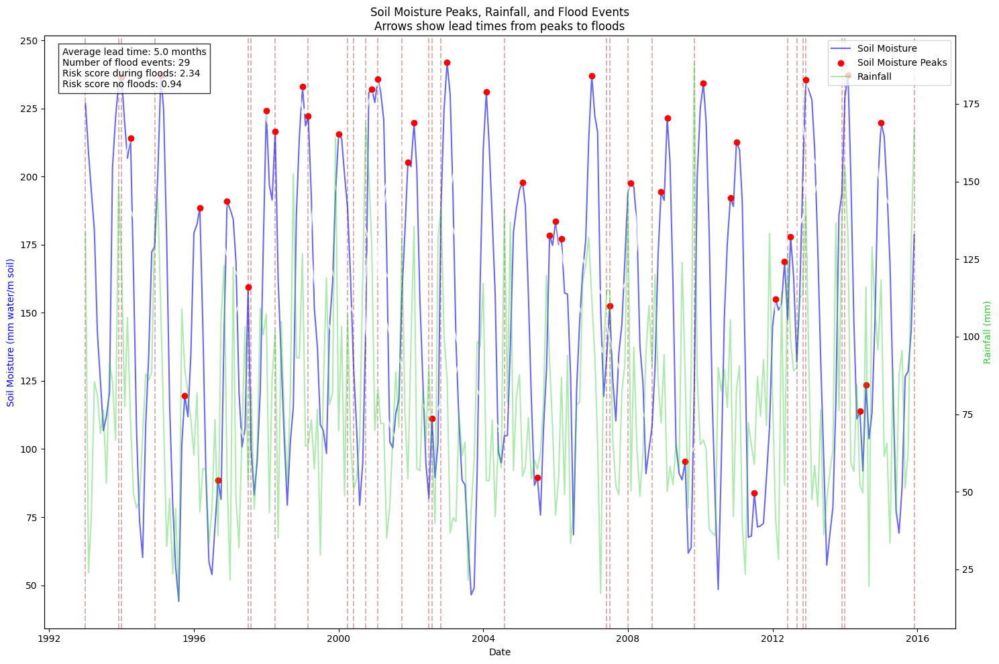

In [89]:
plot_flood_lead_times(monthly_data)

In [71]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

def prepare_annual_features(monthly_data):
    """
    Prepare annual features for flood prediction
    """
    annual_features = monthly_data.groupby('year').agg({
        'soil_moisture': ['mean', 'max', 'std'],
        'rain': ['mean', 'max', 'std'],
        'flood_occurred': 'max'  # If any month had a flood, the year had a flood
    }).reset_index()
    
    # Flatten column names
    annual_features.columns = ['year', 
                             'soil_moisture_mean', 'soil_moisture_max', 'soil_moisture_std',
                             'rain_mean', 'rain_max', 'rain_std', 
                             'flood_occurred']
    
    # Add previous year's features
    for feature in ['soil_moisture_mean', 'soil_moisture_max', 'rain_mean', 'rain_max']:
        annual_features[f'prev_{feature}'] = annual_features[feature].shift(1)
    
    # Drop first year due to NaN from shift operation
    annual_features = annual_features.dropna()
    
    return annual_features

def train_flood_model(annual_features):
    """
    Train and evaluate Random Forest model
    """
    # Prepare features and target
    features = [col for col in annual_features.columns 
               if col not in ['year', 'flood_occurred']]
    X = annual_features[features]
    y = annual_features['flood_occurred']
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.25, random_state=42
    )
    
    # Train model
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    
    # Make predictions
    y_pred = rf.predict(X_test)
    
    # Print performance metrics
    print("\nModel Performance:")
    print("-" * 50)
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    
    # Plot feature importance
    plt.figure(figsize=(12, 6))
    importance = pd.DataFrame({
        'feature': features,
        'importance': rf.feature_importances_
    }).sort_values('importance', ascending=True)
    
    plt.barh(range(len(importance)), importance['importance'])
    plt.yticks(range(len(importance)), importance['feature'])
    plt.xlabel('Feature Importance')
    plt.title('Random Forest Feature Importance for Flood Prediction')
    plt.tight_layout()
    plt.show()
    
    # Print example predictions
    print("\nExample Predictions:")
    print("-" * 50)
    print("\nLast 5 years in test set:")
    test_results = pd.DataFrame({
        'Year': annual_features.loc[X_test.index, 'year'],
        'Actual': y_test,
        'Predicted': y_pred,
        'Probability': rf.predict_proba(X_test)[:, 1]
    }).sort_values('Year').tail()
    print(test_results)
    
    return rf, importance

def visualize_predictions(annual_features, rf, features):
    """
    Visualize actual vs predicted floods over time
    """
    plt.figure(figsize=(15, 6))
    
    # Get predictions for all years
    X = annual_features[features]
    probabilities = rf.predict_proba(X)[:, 1]
    
    plt.plot(annual_features['year'], annual_features['flood_occurred'], 
             'bo-', label='Actual Floods', alpha=0.6)
    plt.plot(annual_features['year'], probabilities, 
             'ro--', label='Predicted Probability', alpha=0.6)
    
    plt.xlabel('Year')
    plt.ylabel('Flood Occurrence / Probability')
    plt.title('Actual Floods vs Model Predictions')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()



Model Performance:
--------------------------------------------------

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.83      1.00      0.91         5

    accuracy                           0.83         6
   macro avg       0.42      0.50      0.45         6
weighted avg       0.69      0.83      0.76         6


Confusion Matrix:
[[0 1]
 [0 5]]


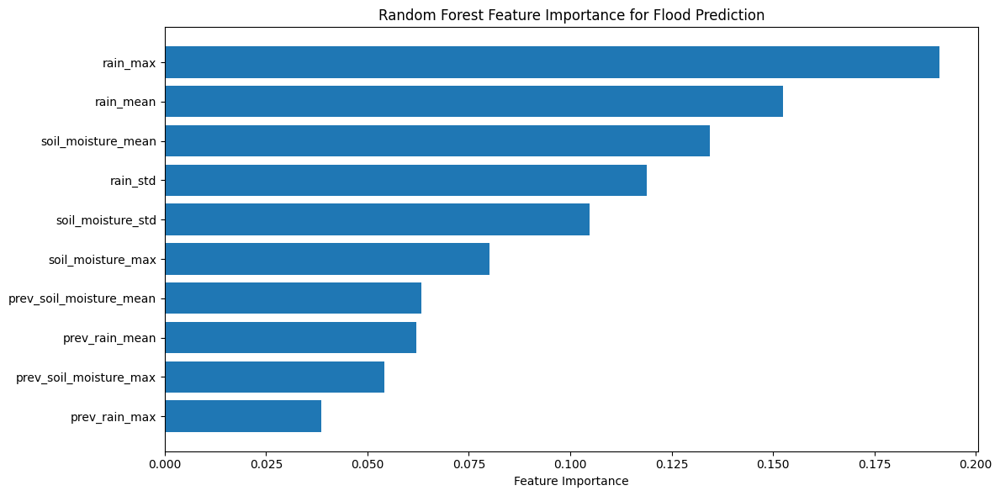


Example Predictions:
--------------------------------------------------

Last 5 years in test set:
    Year  Actual  Predicted  Probability
2   1995       0          1         0.72
6   1999       1          1         0.95
9   2002       1          1         0.92
14  2007       1          1         0.70
16  2009       1          1         0.75


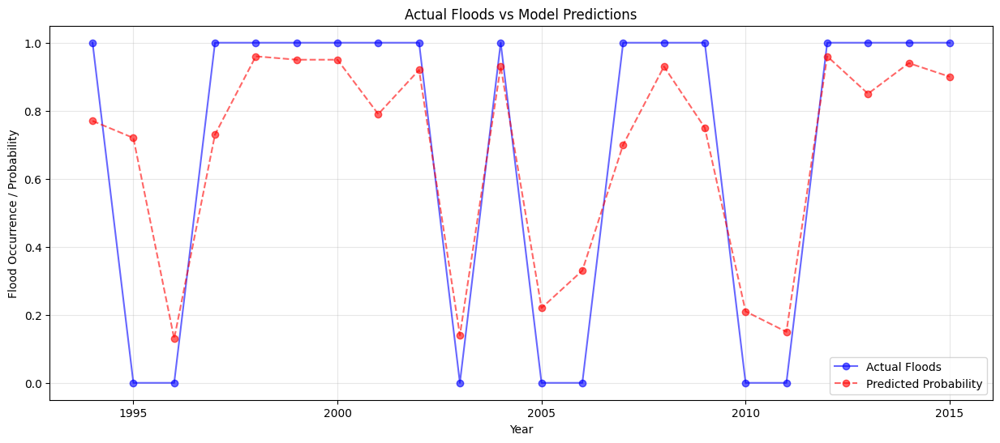

In [72]:
annual_features = prepare_annual_features(monthly_data)
rf_model, feature_importance = train_flood_model(annual_features)
visualize_predictions(annual_features, rf_model, 
                     [col for col in annual_features.columns 
                      if col not in ['year', 'flood_occurred']])

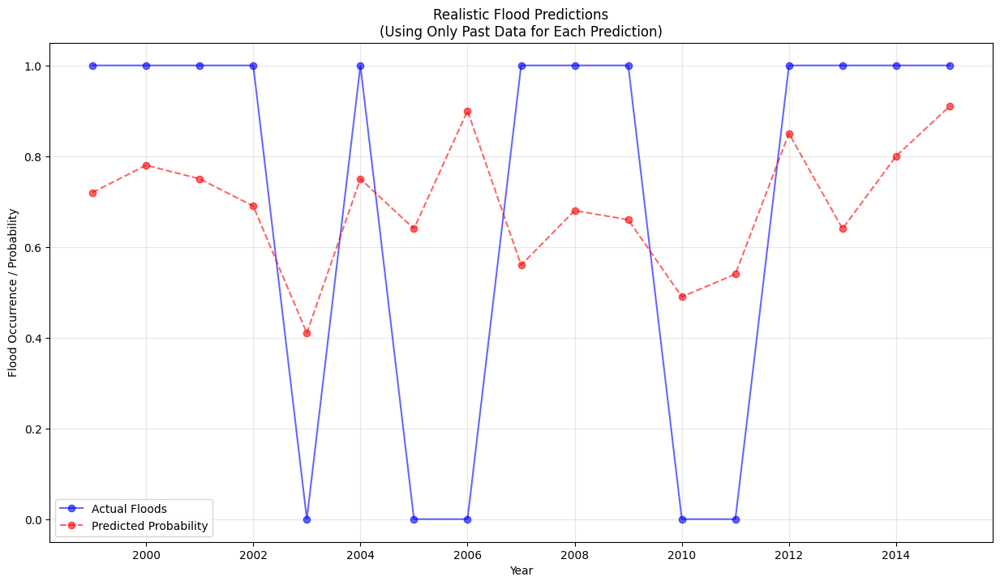


Model Performance:
--------------------------------------------------

Confusion Matrix:
[[ 2  3]
 [ 0 12]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.40      0.57         5
           1       0.80      1.00      0.89        12

    accuracy                           0.82        17
   macro avg       0.90      0.70      0.73        17
weighted avg       0.86      0.82      0.80        17


Year-by-Year Predictions:
--------------------------------------------------

Year: 1999
Training years: 5.0
Training accuracy: 1.00
Actual: 1, Predicted: 1
Prediction probability: 0.72

Year: 2000
Training years: 6.0
Training accuracy: 1.00
Actual: 1, Predicted: 1
Prediction probability: 0.78

Year: 2001
Training years: 7.0
Training accuracy: 1.00
Actual: 1, Predicted: 1
Prediction probability: 0.75

Year: 2002
Training years: 8.0
Training accuracy: 1.00
Actual: 1, Predicted: 1
Prediction probability: 0.69

Year: 2003
Training years

In [90]:
def prepare_annual_features_realworld(monthly_data):
    """
    Prepare annual features, same as before
    """
    annual_features = monthly_data.groupby('year').agg({
        'soil_moisture': ['mean', 'max', 'std'],
        'rain': ['mean', 'max', 'std'],
        'flood_occurred': 'max'
    }).reset_index()
    
    annual_features.columns = ['year', 
                             'soil_moisture_mean', 'soil_moisture_max', 'soil_moisture_std',
                             'rain_mean', 'rain_max', 'rain_std', 
                             'flood_occurred']
    
    # Add previous year's features
    for feature in ['soil_moisture_mean', 'soil_moisture_max', 'rain_mean', 'rain_max']:
        annual_features[f'prev_{feature}'] = annual_features[feature].shift(1)
    
    annual_features = annual_features.dropna()
    return annual_features

def train_and_predict_realistic(annual_features, min_training_years=5):
    """
    Train model and make predictions using only past data for each year
    """
    features = [col for col in annual_features.columns 
               if col not in ['year', 'flood_occurred']]
    
    predictions = []
    probabilities = []
    training_scores = []
    
    # Sort by year
    annual_features = annual_features.sort_values('year')
    years = annual_features['year'].unique()
    
    # For each year after min_training_years
    for i, year in enumerate(years[min_training_years:]):
        # Get training data (all previous years)
        train_data = annual_features[annual_features['year'] < year]
        test_data = annual_features[annual_features['year'] == year]
        
        # Train model
        rf = RandomForestClassifier(n_estimators=100, random_state=42)
        rf.fit(train_data[features], train_data['flood_occurred'])
        
        # Make prediction
        pred = rf.predict(test_data[features])[0]
        prob = rf.predict_proba(test_data[features])[0][1]
        
        # Store results
        predictions.append({
            'year': year,
            'actual': test_data['flood_occurred'].iloc[0],
            'predicted': pred,
            'probability': prob,
            'training_years': len(train_data),
            'training_accuracy': rf.score(train_data[features], train_data['flood_occurred'])
        })
    
    results_df = pd.DataFrame(predictions)
    
    # Visualize results
    plt.figure(figsize=(15, 8))
    
    # Plot actual floods
    plt.plot(results_df['year'], results_df['actual'], 
             'bo-', label='Actual Floods', alpha=0.6)
    
    # Plot predicted probabilities
    plt.plot(results_df['year'], results_df['probability'], 
             'ro--', label='Predicted Probability', alpha=0.6)
    
    plt.xlabel('Year')
    plt.ylabel('Flood Occurrence / Probability')
    plt.title('Realistic Flood Predictions\n(Using Only Past Data for Each Prediction)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Print performance metrics
    print("\nModel Performance:")
    print("-" * 50)
    print("\nConfusion Matrix:")
    print(confusion_matrix(results_df['actual'], results_df['predicted']))
    print("\nClassification Report:")
    print(classification_report(results_df['actual'], results_df['predicted']))
    
    # Print year-by-year analysis
    print("\nYear-by-Year Predictions:")
    print("-" * 50)
    for _, row in results_df.iterrows():
        print(f"\nYear: {int(row['year'])}")
        print(f"Training years: {row['training_years']}")
        print(f"Training accuracy: {row['training_accuracy']:.2f}")
        print(f"Actual: {int(row['actual'])}, Predicted: {int(row['predicted'])}")
        print(f"Prediction probability: {row['probability']:.2f}")
    
    return results_df

annual_features = prepare_annual_features_realworld(monthly_data)
results = train_and_predict_realistic(annual_features)

In [73]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np

def prepare_impact_features(monthly_data, disasters_df):
    """
    Prepare features for both flood occurrence and impact prediction
    """
    # Prepare annual features as before
    annual_features = monthly_data.groupby('year').agg({
        'soil_moisture': ['mean', 'max', 'std'],
        'rain': ['mean', 'max', 'std'],
        'flood_occurred': 'max'
    }).reset_index()
    
    # Flatten column names
    annual_features.columns = ['year', 
                             'soil_moisture_mean', 'soil_moisture_max', 'soil_moisture_std',
                             'rain_mean', 'rain_max', 'rain_std', 
                             'flood_occurred']
    
    # Add previous year's features
    for feature in ['soil_moisture_mean', 'soil_moisture_max', 'rain_mean', 'rain_max']:
        annual_features[f'prev_{feature}'] = annual_features[feature].shift(1)
    
    # Add impact metrics from disasters_df
    impact_metrics = disasters_df[disasters_df['Disaster Type'] == 'Flood'].groupby('Start Year').agg({
        'Total Deaths': 'sum',
        'Total Affected': 'sum',
        "Total Damage, Adjusted ('000 US$)": 'sum',
        'No. Homeless': 'sum'
    }).reset_index()
    
    # Merge with annual features
    annual_features = pd.merge(
        annual_features,
        impact_metrics,
        left_on='year',
        right_on='Start Year',
        how='left'
    )
    
    # Fill NaN values with 0 for years without floods
    impact_columns = ['Total Deaths', 'Total Affected', 
                     "Total Damage, Adjusted ('000 US$)", 'No. Homeless']
    annual_features[impact_columns] = annual_features[impact_columns].fillna(0)
    
    # Log transform impact metrics due to their skewed nature
    for col in impact_columns:
        annual_features[f'log_{col}'] = np.log1p(annual_features[col])
    
    return annual_features

def train_impact_model(annual_features):
    """
    Train models for both flood occurrence and impact prediction
    """
    # Prepare features
    features = [col for col in annual_features.columns 
               if col not in ['year', 'Start Year', 'flood_occurred', 
                            'Total Deaths', 'Total Affected', 
                            "Total Damage, Adjusted ('000 US$)", 'No. Homeless',
                            'log_Total Deaths', 'log_Total Affected',
                            'log_Total Damage, Adjusted (\'000 US$)', 'log_No. Homeless']]
    
    X = annual_features[features]
    
    # Train impact models for flood years only
    flood_mask = annual_features['flood_occurred'] == 1
    X_flood = X[flood_mask]
    
    impact_models = {}
    feature_importance = {}
    
    impact_metrics = ['Total Deaths', 'Total Affected', 
                     "Total Damage, Adjusted ('000 US$)", 'No. Homeless']
    
    for metric in impact_metrics:
        # Use log-transformed target
        y = annual_features[flood_mask][f'log_{metric}']
        
        # Train model
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(X_flood, y)
        
        impact_models[metric] = rf
        feature_importance[metric] = pd.DataFrame({
            'feature': features,
            'importance': rf.feature_importances_
        }).sort_values('importance', ascending=True)
    
    # Plot feature importance for all impact metrics
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Feature Importance for Impact Prediction')
    
    for idx, (metric, importance) in enumerate(feature_importance.items()):
        ax = axes[idx // 2, idx % 2]
        importance.plot(kind='barh', x='feature', y='importance', ax=ax)
        ax.set_title(f'{metric} Prediction')
    
    plt.tight_layout()
    plt.show()
    
    # Print example predictions
    print("\nExample Impact Predictions for Flood Years:")
    print("-" * 50)
    for metric in impact_metrics:
        model = impact_models[metric]
        predictions = np.expm1(model.predict(X_flood))  # Transform back from log scale
        actuals = annual_features[flood_mask][metric]
        
        print(f"\n{metric}:")
        print(f"Mean Absolute Error: {np.mean(np.abs(predictions - actuals)):.2f}")
        print(f"R² Score: {model.score(X_flood, annual_features[flood_mask][f'log_{metric}']):.2f}")
    
    return impact_models, feature_importance


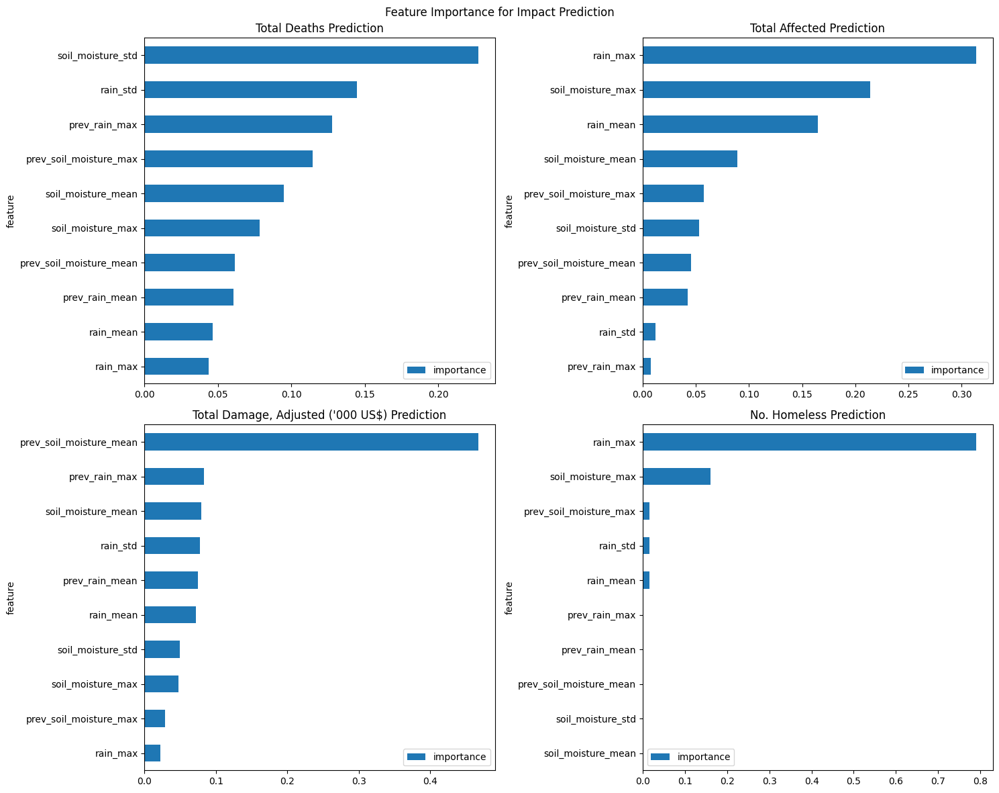


Example Impact Predictions for Flood Years:
--------------------------------------------------

Total Deaths:
Mean Absolute Error: 1.66
R² Score: 0.79

Total Affected:
Mean Absolute Error: 24779.31
R² Score: 0.77

Total Damage, Adjusted ('000 US$):
Mean Absolute Error: 1621015.59
R² Score: 0.78

No. Homeless:
Mean Absolute Error: 1838.33
R² Score: 0.79


In [74]:
annual_features = prepare_impact_features(monthly_data, disasters_df)
impact_models, feature_importance = train_impact_model(annual_features)

In [75]:
def visualize_impact_predictions(annual_features, impact_models):
    """
    Create visualizations comparing actual vs predicted impacts
    """
    # Only look at flood years
    flood_years = annual_features[annual_features['flood_occurred'] == 1].copy()
    
    # Prepare features
    features = [col for col in annual_features.columns 
               if col not in ['year', 'Start Year', 'flood_occurred', 
                            'Total Deaths', 'Total Affected', 
                            "Total Damage, Adjusted ('000 US$)", 'No. Homeless',
                            'log_Total Deaths', 'log_Total Affected',
                            'log_Total Damage, Adjusted (\'000 US$)', 'log_No. Homeless']]
    
    X = flood_years[features]
    
    # Create figure
    fig, axes = plt.subplots(2, 1, figsize=(15, 12))
    
    metrics = ['Total Deaths', 'Total Affected']
    
    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        
        # Get predictions
        model = impact_models[metric]
        predictions = np.expm1(model.predict(X))
        
        # Sort by year for plotting
        plot_data = pd.DataFrame({
            'Year': flood_years['year'],
            'Actual': flood_years[metric],
            'Predicted': predictions
        }).sort_values('Year')
        
        # Plot actual values
        ax.plot(plot_data['Year'], plot_data['Actual'], 
                'bo-', label='Actual', alpha=0.7)
        
        # Plot predictions
        ax.plot(plot_data['Year'], plot_data['Predicted'], 
                'ro--', label='Predicted', alpha=0.7)
        
        # Add error bars (using standard deviation from trees in random forest)
        predictions_std = np.std([tree.predict(X) 
                                for tree in model.estimators_], axis=0)
        ax.fill_between(plot_data['Year'],
                       np.expm1(np.log1p(predictions) - predictions_std),
                       np.expm1(np.log1p(predictions) + predictions_std),
                       alpha=0.2, color='red')
        
        # Calculate error metrics for this metric
        mape = np.mean(np.abs((plot_data['Actual'] - plot_data['Predicted']) / 
                             (plot_data['Actual'] + 1))) * 100
        r2 = model.score(X, flood_years[f'log_{metric}'])
        
        ax.set_title(f'{metric} - Actual vs Predicted\n' +
                    f'MAPE: {mape:.1f}%, R²: {r2:.2f}')
        ax.set_xlabel('Year')
        ax.set_ylabel(metric)
        ax.legend()
        
        # Add value labels
        for i, row in plot_data.iterrows():
            ax.annotate(f'{int(row["Actual"])}',
                       (row['Year'], row['Actual']),
                       xytext=(0, 10), textcoords='offset points',
                       ha='center', fontsize=8)
            ax.annotate(f'{int(row["Predicted"])}',
                       (row['Year'], row['Predicted']),
                       xytext=(0, -15), textcoords='offset points',
                       ha='center', fontsize=8, color='red')
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed accuracy metrics
    print("\nDetailed Prediction Analysis:")
    print("-" * 50)
    for metric in metrics:
        predictions = np.expm1(impact_models[metric].predict(X))
        actuals = flood_years[metric]
        
        errors = predictions - actuals
        abs_errors = np.abs(errors)
        
        print(f"\n{metric}:")
        print(f"Mean Absolute Error: {np.mean(abs_errors):.2f}")
        print(f"Median Absolute Error: {np.median(abs_errors):.2f}")
        print(f"Maximum Error: {np.max(abs_errors):.2f}")
        print(f"Average % Error: {np.mean(abs_errors / (actuals + 1)) * 100:.1f}%")
        
        # Print years with largest errors
        worst_predictions = pd.DataFrame({
            'Year': flood_years['year'],
            'Actual': actuals,
            'Predicted': predictions,
            'Absolute Error': abs_errors
        }).nlargest(3, 'Absolute Error')
        
        print("\nLargest Prediction Errors:")
        print(worst_predictions[['Year', 'Actual', 'Predicted', 'Absolute Error']]
              .to_string(index=False))

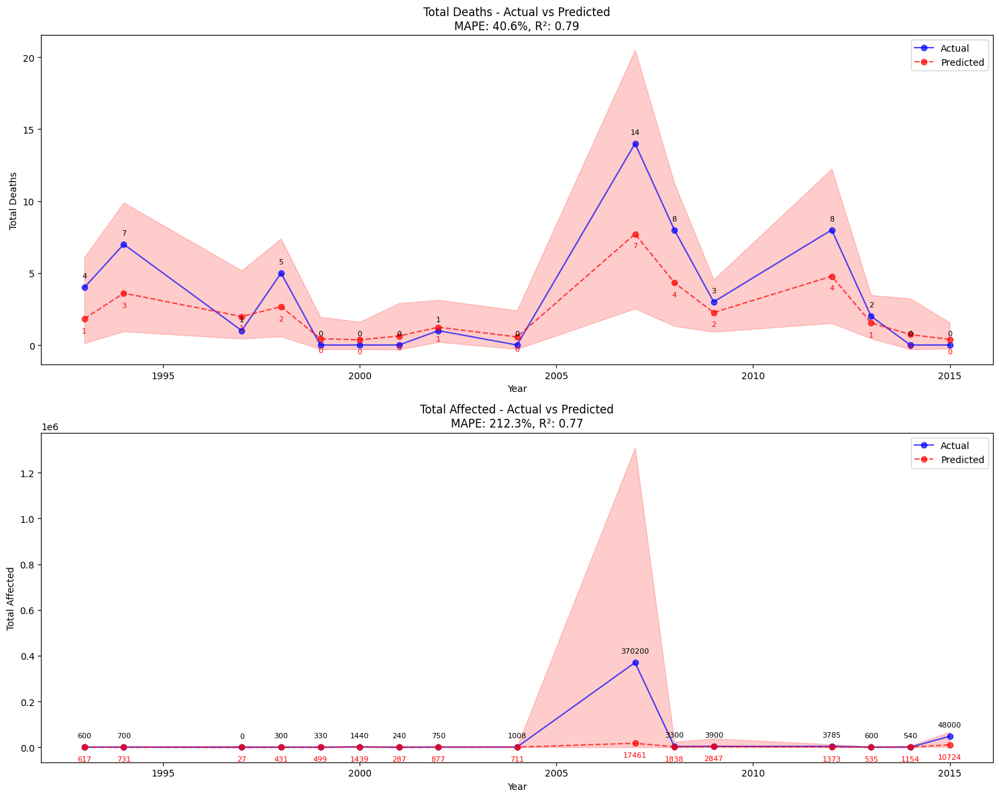


Detailed Prediction Analysis:
--------------------------------------------------

Total Deaths:
Mean Absolute Error: 1.66
Median Absolute Error: 0.73
Maximum Error: 6.28
Average % Error: 40.6%

Largest Prediction Errors:
 Year  Actual  Predicted  Absolute Error
 2007    14.0   7.715664        6.284336
 2008     8.0   4.329796        3.670204
 1994     7.0   3.604070        3.395930

Total Affected:
Mean Absolute Error: 24779.31
Median Absolute Error: 150.46
Maximum Error: 352738.15
Average % Error: 212.3%

Largest Prediction Errors:
 Year   Actual    Predicted  Absolute Error
 2007 370200.0 17461.852824   352738.147176
 2015  48000.0 10724.258568    37275.741432
 2012   3785.0  1373.735353     2411.264647


In [76]:
visualize_impact_predictions(annual_features, impact_models)

In [81]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def prepare_and_train_models(soil_moisture_df, met_data_1980, disasters_df):
    """
    Prepare data and create combined model for flood prediction and impact assessment
    """
    # Prepare monthly data
    data_start = soil_moisture_df.index[soil_moisture_df.iloc[:, 0].str.contains('-', na=False)].min()
    soil_data = soil_moisture_df.loc[data_start:].copy()
    soil_data.columns = ['date', 'soil_moisture']
    soil_data['soil_moisture'] = soil_data['soil_moisture'].astype(float)
    soil_data['date'] = pd.to_datetime(soil_data['date'])
    
    # Create yearly features
    yearly_data = soil_data.groupby(soil_data['date'].dt.year).agg({
        'soil_moisture': ['mean', 'max', 'std']
    }).reset_index()
    yearly_data.columns = ['year', 'soil_moisture_mean', 'soil_moisture_max', 'soil_moisture_std']
    
    # Add rainfall features
    rain_yearly = met_data_1980.groupby('year')['rain'].agg(['mean', 'max', 'std']).reset_index()
    rain_yearly.columns = ['year', 'rain_mean', 'rain_max', 'rain_std']
    yearly_data = pd.merge(yearly_data, rain_yearly, on='year')
    
    # Add flood occurrence and deaths
    flood_data = disasters_df[disasters_df['Disaster Type'] == 'Flood']
    flood_years = flood_data.groupby('Start Year').agg({
        'Start Year': 'first',
        'Total Deaths': 'sum'
    }).reset_index(drop=True)
    
    yearly_data['flood_occurred'] = yearly_data['year'].isin(flood_years['Start Year']).astype(int)
    yearly_data = pd.merge(yearly_data, 
                          flood_years[['Start Year', 'Total Deaths']], 
                          left_on='year', 
                          right_on='Start Year', 
                          how='left')
    yearly_data['Total Deaths'] = yearly_data['Total Deaths'].fillna(0)
    
    # Filter for post-1993 data
    yearly_data = yearly_data[yearly_data['year'] >= 1993]
    
    # Define features
    features = ['soil_moisture_mean', 'soil_moisture_max', 'soil_moisture_std',
                'rain_mean', 'rain_max', 'rain_std']
    
    # Train models
    rf_occurrence = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_occurrence.fit(yearly_data[features], yearly_data['flood_occurred'])
    
    # Impact model (trained only on flood years)
    flood_mask = yearly_data['flood_occurred'] == 1
    rf_impact = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_impact.fit(yearly_data[flood_mask][features], 
                 np.log1p(yearly_data[flood_mask]['Total Deaths']))
    
    # Make predictions
    flood_prob = rf_occurrence.predict_proba(yearly_data[features])[:, 1]
    deaths_pred = np.zeros(len(yearly_data))
    flood_pred_mask = flood_prob > 0.5
    if any(flood_pred_mask):
        deaths_pred[flood_pred_mask] = np.expm1(
            rf_impact.predict(yearly_data[flood_pred_mask][features])
        )
    
    predictions = pd.DataFrame({
        'year': yearly_data['year'],
        'flood_probability': flood_prob,
        'predicted_deaths': deaths_pred
    })
    
    # Evaluate and visualize
    plt.figure(figsize=(15, 6))
    
    # Plot actual flood deaths
    plt.scatter(yearly_data[yearly_data['flood_occurred'] == 1]['year'],
                yearly_data[yearly_data['flood_occurred'] == 1]['Total Deaths'],
                label='Actual Deaths', color='blue')
    
    # Plot predicted deaths for predicted flood years
    pred_flood_years = predictions[predictions['flood_probability'] > 0.5]
    plt.scatter(pred_flood_years['year'],
                pred_flood_years['predicted_deaths'],
                label='Predicted Deaths', color='red', alpha=0.6)
    
    plt.xlabel('Year')
    plt.ylabel('Deaths')
    plt.title('Actual vs Predicted Flood Deaths\nBlue: Actual, Red: Predicted')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Print performance metrics
    actual_floods = set(yearly_data[yearly_data['flood_occurred'] == 1]['year'])
    predicted_floods = set(predictions[predictions['flood_probability'] > 0.5]['year'])
    
    print("\nModel Performance:")
    print("-" * 50)
    print(f"Correctly predicted flood years: {len(actual_floods & predicted_floods)}")
    print(f"Missed flood years: {len(actual_floods - predicted_floods)}")
    print(f"False alarms: {len(predicted_floods - actual_floods)}")
    
    # For years with actual floods
    flood_years = yearly_data[yearly_data['flood_occurred'] == 1]
    pred_deaths = predictions[predictions['year'].isin(flood_years['year'])]
    
    mae = np.mean(np.abs(flood_years['Total Deaths'] - pred_deaths['predicted_deaths']))
    print(f"\nMean Absolute Error in death predictions: {mae:.2f}")
    
    return rf_occurrence, rf_impact, features, yearly_data, predictions


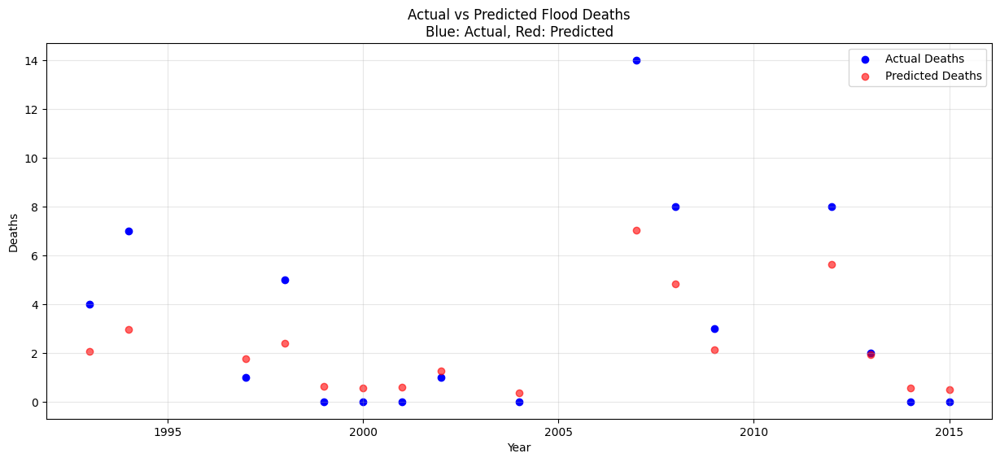


Model Performance:
--------------------------------------------------
Correctly predicted flood years: 16
Missed flood years: 0
False alarms: 0

Mean Absolute Error in death predictions: 1.64


In [82]:
rf_occurrence, rf_impact, features, yearly_data, predictions = prepare_and_train_models(
    soil_moisture_df, met_data_1980, disasters_df
)


Detailed Model Performance:
--------------------------------------------------

Death Prediction Metrics:
Mean Absolute Error: 1.64
Median Absolute Error: 0.69
Max Error: 6.98
Standard Deviation of Error: 1.79

Prediction Confidence Analysis:
Mean confidence for actual flood years: 0.93
Mean confidence for non-flood years: 0.22

Correlation between confidence and prediction accuracy:
Correlation coefficient: -0.16


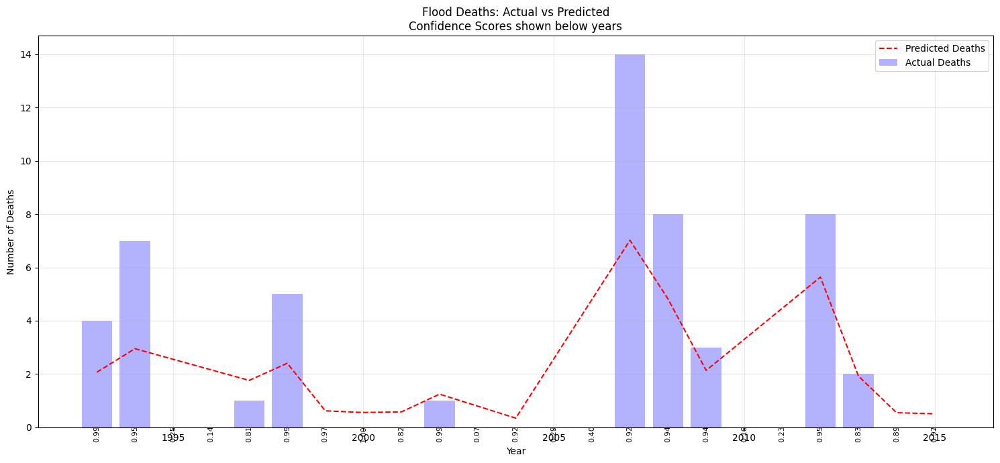

In [85]:
def analyze_model_performance(yearly_data, predictions, rf_occurrence, rf_impact, features):
    """
    Create detailed analysis of model performance
    """
    # Calculate confidence scores for each prediction
    flood_probs = rf_occurrence.predict_proba(yearly_data[features])[:, 1]
    
    # Create figure
    plt.figure(figsize=(15, 7))
    
    # Plot actual deaths as bars
    plt.bar(yearly_data['year'], yearly_data['Total Deaths'], 
            alpha=0.3, color='blue', label='Actual Deaths')
    
    # Plot predicted deaths as line with confidence band
    flood_years_mask = predictions['flood_probability'] > 0.5
    plt.plot(predictions[flood_years_mask]['year'], 
             predictions[flood_years_mask]['predicted_deaths'],
             'r--', label='Predicted Deaths')
    
    # Add confidence levels as text
    for year, prob in zip(yearly_data['year'], flood_probs):
        plt.text(year, -0.5, f'{prob:.2f}', 
                rotation=90, ha='center', fontsize=8)
    
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.title('Flood Deaths: Actual vs Predicted\nConfidence Scores shown below years')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Print detailed metrics
    print("\nDetailed Model Performance:")
    print("-" * 50)
    
    # Calculate metrics for death predictions
    flood_years = yearly_data[yearly_data['flood_occurred'] == 1]
    pred_deaths = predictions[predictions['year'].isin(flood_years['year'])]
    
    errors = np.abs(flood_years['Total Deaths'] - pred_deaths['predicted_deaths'])
    
    print("\nDeath Prediction Metrics:")
    print(f"Mean Absolute Error: {np.mean(errors):.2f}")
    print(f"Median Absolute Error: {np.median(errors):.2f}")
    print(f"Max Error: {np.max(errors):.2f}")
    print(f"Standard Deviation of Error: {np.std(errors):.2f}")
    
    print("\nPrediction Confidence Analysis:")
    print(f"Mean confidence for actual flood years: {np.mean(flood_probs[yearly_data['flood_occurred'] == 1]):.2f}")
    print(f"Mean confidence for non-flood years: {np.mean(flood_probs[yearly_data['flood_occurred'] == 0]):.2f}")
    
    # Show correlation between confidence and accuracy
    print("\nCorrelation between confidence and prediction accuracy:")
    mask = yearly_data['flood_occurred'] == 1
    confidence_error_corr = np.corrcoef(
        flood_probs[mask],
        -np.abs(flood_years['Total Deaths'] - pred_deaths['predicted_deaths'])
    )[0,1]
    print(f"Correlation coefficient: {confidence_error_corr:.2f}")
    
    plt.tight_layout()
    plt.show()

analyze_model_performance(yearly_data, predictions, rf_occurrence, rf_impact, features)

In [86]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import confusion_matrix, classification_report

def train_and_validate_model(yearly_data, features, n_splits=3):
    """
    Train and validate model using time series cross-validation
    """
    # Prepare time series split
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    # Store results
    all_predictions = []
    all_actuals = []
    all_death_predictions = []
    all_death_actuals = []
    
    # For plotting
    cv_results = []
    
    for train_idx, test_idx in tscv.split(yearly_data):
        # Split data
        train = yearly_data.iloc[train_idx]
        test = yearly_data.iloc[test_idx]
        
        # Train occurrence model
        rf_occurrence = RandomForestClassifier(n_estimators=100, random_state=42)
        rf_occurrence.fit(train[features], train['flood_occurred'])
        
        # Train impact model on flood years only
        flood_mask = train['flood_occurred'] == 1
        rf_impact = RandomForestRegressor(n_estimators=100, random_state=42)
        if sum(flood_mask) > 0:  # Only if we have flood years in training set
            rf_impact.fit(train[flood_mask][features], 
                         np.log1p(train[flood_mask]['Total Deaths']))
        
        # Make predictions
        flood_prob = rf_occurrence.predict_proba(test[features])[:, 1]
        flood_pred = flood_prob > 0.5
        
        # Predict deaths where floods are predicted
        deaths_pred = np.zeros(len(test))
        if any(flood_pred) and sum(flood_mask) > 0:
            deaths_pred[flood_pred] = np.expm1(
                rf_impact.predict(test[flood_pred][features])
            )
        
        # Store results
        all_predictions.extend(flood_pred)
        all_actuals.extend(test['flood_occurred'])
        all_death_predictions.extend(deaths_pred)
        all_death_actuals.extend(test['Total Deaths'])
        
        # Store detailed results for plotting
        for idx, (year, actual, pred, prob, death_actual, death_pred) in enumerate(zip(
            test['year'], test['flood_occurred'], flood_pred, flood_prob,
            test['Total Deaths'], deaths_pred)):
            cv_results.append({
                'year': year,
                'actual_flood': actual,
                'predicted_flood': pred,
                'flood_probability': prob,
                'actual_deaths': death_actual,
                'predicted_deaths': death_pred,
                'fold': len(cv_results) // len(test_idx) + 1
            })
    
    # Convert results to DataFrame
    cv_results = pd.DataFrame(cv_results)
    
    # Plot results
    plt.figure(figsize=(15, 8))
    
    # Plot actual deaths
    plt.bar(cv_results['year'], cv_results['actual_deaths'], 
            alpha=0.3, color='blue', label='Actual Deaths')
    
    # Plot predicted deaths for predicted flood years
    mask = cv_results['predicted_flood'] == 1
    plt.plot(cv_results[mask]['year'], 
             cv_results[mask]['predicted_deaths'],
             'r--', label='Predicted Deaths')
    
    # Add fold separators
    for fold in range(2, n_splits + 1):
        fold_start = cv_results[cv_results['fold'] == fold]['year'].iloc[0]
        plt.axvline(fold_start, color='gray', linestyle=':', alpha=0.5)
    
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.title('Cross-Validation Results: Actual vs Predicted Deaths\nVertical lines separate CV folds')
    plt.legend()
    
    # Print metrics
    print("\nFlood Occurrence Prediction:")
    print("-" * 50)
    print("\nConfusion Matrix:")
    print(confusion_matrix(all_actuals, all_predictions))
    print("\nClassification Report:")
    print(classification_report(all_actuals, all_predictions))
    
    # Death prediction metrics
    flood_mask = np.array(all_actuals) == 1
    if sum(flood_mask) > 0:
        mae = np.mean(np.abs(
            np.array(all_death_actuals)[flood_mask] - 
            np.array(all_death_predictions)[flood_mask]
        ))
        print("\nDeath Prediction (for actual flood years):")
        print(f"Mean Absolute Error: {mae:.2f}")
    
    return cv_results



Flood Occurrence Prediction:
--------------------------------------------------

Confusion Matrix:
[[ 1  4]
 [ 0 10]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.20      0.33         5
           1       0.71      1.00      0.83        10

    accuracy                           0.73        15
   macro avg       0.86      0.60      0.58        15
weighted avg       0.81      0.73      0.67        15


Death Prediction (for actual flood years):
Mean Absolute Error: 3.96


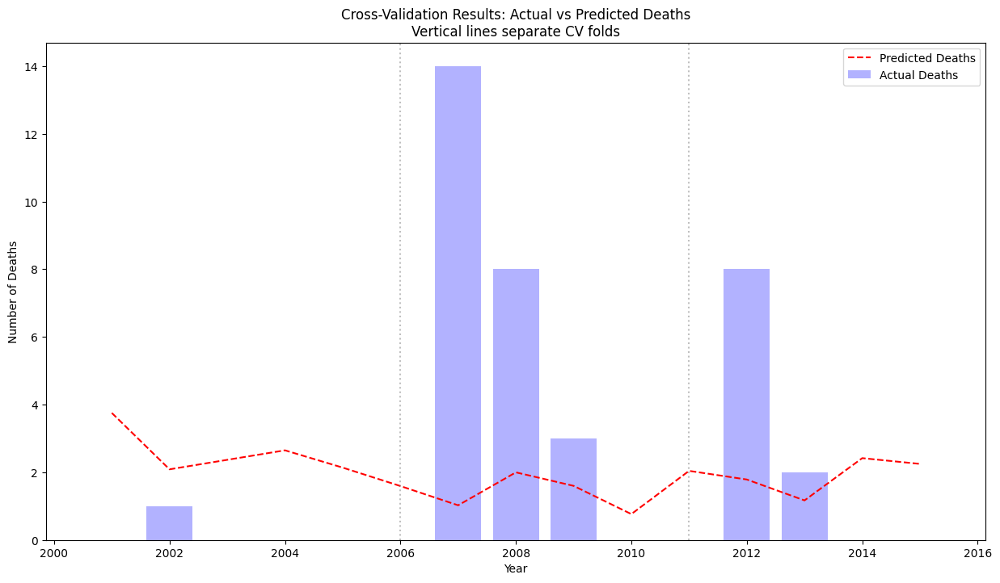

In [87]:
cv_results = train_and_validate_model(yearly_data, features)

In [91]:
def analyze_temperature_events(disasters_df):
    """
    Analyze extreme temperature events by subtype
    """
    # Filter for extreme temperature events
    temp_events = disasters_df[disasters_df['Disaster Type'] == 'Extreme temperature'].copy()
    
    # Basic analysis
    print("\nExtreme Temperature Events Analysis:")
    print("-" * 50)
    print("\nEvents by Subtype:")
    print(temp_events.groupby('Disaster Subtype')['Total Deaths'].agg(['count', 'sum']))
    
    # Timeline analysis
    temp_events['date'] = pd.to_datetime(
        temp_events['Start Year'].astype(str) + '-' + 
        temp_events['Start Month'].astype(str).str.zfill(2) + '-01'
    )
    
    # Plot timeline
    plt.figure(figsize=(15, 6))
    
    # Plot events by subtype
    for subtype in temp_events['Disaster Subtype'].unique():
        subtype_data = temp_events[temp_events['Disaster Subtype'] == subtype]
        plt.scatter(subtype_data['date'], subtype_data['Total Deaths'],
                   label=subtype, alpha=0.6)
    
    plt.ylabel('Deaths')
    plt.title('Extreme Temperature Events Timeline by Subtype')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Add month labels
    plt.figure(figsize=(10, 5))
    temp_events['Month'] = temp_events['Start Month']
    monthly_events = temp_events.groupby(['Month', 'Disaster Subtype']).size().unstack(fill_value=0)
    monthly_events.plot(kind='bar', alpha=0.6)
    plt.title('Monthly Distribution of Events by Subtype')
    plt.xlabel('Month')
    plt.ylabel('Number of Events')
    
    plt.tight_layout()
    plt.show()
    
    return temp_events

def prepare_temperature_features(temp_events, mean_temps, max_temps, min_temps, annual_sun_stats):
    """
    Prepare features for temperature event prediction
    """
    # Create yearly features
    yearly_data = pd.DataFrame()
    yearly_data['year'] = range(1991, 2016)  # Adjust range as needed
    
    # Add temperature features
    yearly_data = pd.merge(
        yearly_data,
        max_temps[['year', 'annual_temp']].rename(columns={'annual_temp': 'max_temp'}),
        on='year', how='left'
    )
    yearly_data = pd.merge(
        yearly_data,
        min_temps[['year', 'annual_temp']].rename(columns={'annual_temp': 'min_temp'}),
        on='year', how='left'
    )
    
    # Add sunshine features
    yearly_data = pd.merge(
        yearly_data,
        annual_sun_stats[['year', 'sun_mean', 'sun_std']],
        on='year', how='left'
    )
    
    # Calculate temperature variability
    yearly_data['temp_range'] = yearly_data['max_temp'] - yearly_data['min_temp']
    yearly_data['temp_variability'] = yearly_data['temp_range'].rolling(window=3, center=True).std()
    
    # Add event occurrence
    yearly_data['heat_wave'] = 0
    yearly_data['cold_wave'] = 0
    
    for _, event in temp_events.iterrows():
        if event['Start Year'] in yearly_data['year'].values:
            if event['Disaster Subtype'] == 'Heat wave':
                yearly_data.loc[yearly_data['year'] == event['Start Year'], 'heat_wave'] = 1
            elif event['Disaster Subtype'] == 'Cold wave':
                yearly_data.loc[yearly_data['year'] == event['Start Year'], 'cold_wave'] = 1
    
    # Add previous year's features
    for col in ['max_temp', 'min_temp', 'temp_variability', 'sun_mean']:
        yearly_data[f'prev_{col}'] = yearly_data[col].shift(1)
    
    # Drop rows with NaN from rolling calculations and shifts
    yearly_data = yearly_data.dropna()
    
    return yearly_data



Extreme Temperature Events Analysis:
--------------------------------------------------

Events by Subtype:
                          count     sum
Disaster Subtype                       
Cold wave                     5    17.0
Heat wave                     8  9103.0
Severe winter conditions      1     1.0


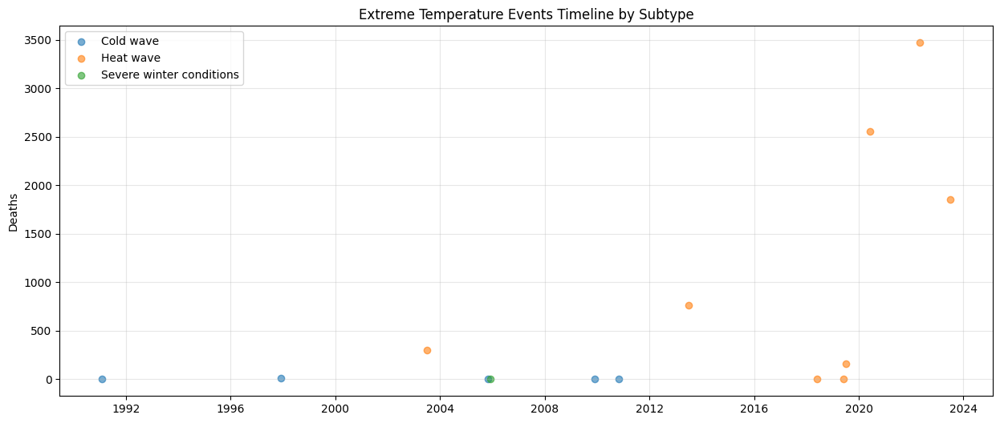

<Figure size 1000x500 with 0 Axes>

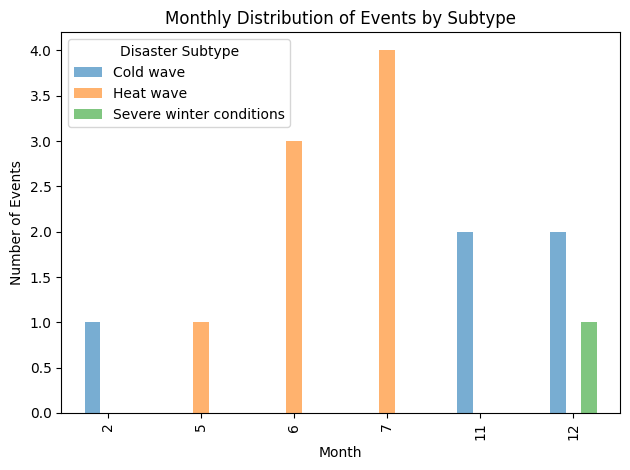

In [92]:
temp_events = analyze_temperature_events(disasters_df)

In [93]:
def prepare_shared_features(soil_moisture_df, met_data_1980, mean_temps, max_temps, min_temps, annual_sun_stats):
    """
    Prepare common feature set for all disaster models
    """
    # Create monthly dataset first
    monthly_data = pd.DataFrame()
    
    # Process soil moisture
    data_start = soil_moisture_df.index[soil_moisture_df.iloc[:, 0].str.contains('-', na=False)].min()
    soil_data = soil_moisture_df.loc[data_start:].copy()
    soil_data.columns = ['date', 'soil_moisture']
    soil_data['soil_moisture'] = soil_data['soil_moisture'].astype(float)
    soil_data['date'] = pd.to_datetime(soil_data['date'])
    
    # Create base dataframe with dates
    monthly_data = soil_data.copy()
    monthly_data['year'] = monthly_data['date'].dt.year
    monthly_data['month'] = monthly_data['date'].dt.month
    
    # Add rainfall
    monthly_rain = met_data_1980.groupby(['year', 'month'])['rain'].mean().reset_index()
    monthly_data = pd.merge(monthly_data, monthly_rain, on=['year', 'month'], how='left')
    
    # Add temperature features
    monthly_data['temp_max'] = None
    monthly_data['temp_min'] = None
    monthly_data['temp_mean'] = None
    
    # Calculate rolling statistics
    monthly_data['soil_moisture_3m'] = monthly_data['soil_moisture'].rolling(window=3).mean()
    monthly_data['rain_3m'] = monthly_data['rain'].rolling(window=3).mean()
    
    # Add seasonal indicators
    monthly_data['is_summer'] = monthly_data['month'].isin([5, 6, 7, 8]).astype(int)
    monthly_data['is_winter'] = monthly_data['month'].isin([11, 12, 1, 2]).astype(int)
    
    return monthly_data

def create_disaster_specific_datasets(monthly_data, disasters_df):
    """
    Create specialized datasets for each disaster type
    """
    disaster_types = {
        'heat_wave': {
            'type': 'Extreme temperature',
            'subtype': 'Heat wave',
            'season_filter': [5, 6, 7, 8],
            'primary_features': ['temp_max', 'soil_moisture', 'rain']
        },
        'flood': {
            'type': 'Flood',
            'subtype': None,
            'season_filter': None,
            'primary_features': ['soil_moisture', 'rain', 'rain_3m']
        },
        'cold_wave': {
            'type': 'Extreme temperature',
            'subtype': 'Cold wave',
            'season_filter': [11, 12, 1, 2],
            'primary_features': ['temp_min', 'soil_moisture']
        }
    }
    
    specialized_datasets = {}
    
    for disaster_name, params in disaster_types.items():
        # Filter data for relevant season if specified
        if params['season_filter']:
            data = monthly_data[monthly_data['month'].isin(params['season_filter'])].copy()
        else:
            data = monthly_data.copy()
            
        # Add disaster occurrence
        data['event_occurred'] = 0
        events = disasters_df[
            (disasters_df['Disaster Type'] == params['type']) &
            (disasters_df['Disaster Subtype'].fillna('') == 
             (params['subtype'] if params['subtype'] else ''))
        ]
        
        for _, event in events.iterrows():
            mask = (data['year'] == event['Start Year']) & \
                   (data['month'] == event['Start Month'])
            data.loc[mask, 'event_occurred'] = 1
            
        specialized_datasets[disaster_name] = data
        
    return specialized_datasets

def train_specialized_model(data, disaster_type, min_training_years=5):
    """
    Train model for specific disaster type using only past data
    """
    features = [
        'soil_moisture', 'rain', 'soil_moisture_3m', 'rain_3m',
        'is_summer', 'is_winter'
    ]
    
    # Add any temperature features if they exist
    if 'temp_max' in data.columns and data['temp_max'].notna().any():
        features.append('temp_max')
    if 'temp_min' in data.columns and data['temp_min'].notna().any():
        features.append('temp_min')
    
    results = []
    
    # Sort by date
    data = data.sort_values(['year', 'month'])
    
    # Create predictions for each point after minimum training period
    for i in range(min_training_years * 12, len(data)):
        train = data.iloc[:i]
        test = data.iloc[i:i+1]
        
        if len(train[train['event_occurred'] == 1]) > 0:  # Only train if we have some events
            rf = RandomForestClassifier(n_estimators=100, random_state=42)
            rf.fit(train[features], train['event_occurred'])
            
            pred_prob = rf.predict_proba(test[features])[0][1]
            
            results.append({
                'year': test['year'].iloc[0],
                'month': test['month'].iloc[0],
                'actual': test['event_occurred'].iloc[0],
                'predicted_probability': pred_prob,
                'training_months': len(train)
            })
    
    return pd.DataFrame(results)

def evaluate_specialized_models(monthly_data, disasters_df):
    """
    Train and evaluate models for each disaster type
    """
    # Create specialized datasets
    datasets = create_disaster_specific_datasets(monthly_data, disasters_df)
    
    # Train and evaluate each model
    results = {}
    for disaster_type, data in datasets.items():
        print(f"\nTraining model for: {disaster_type}")
        print("-" * 50)
        
        predictions = train_specialized_model(data, disaster_type)
        results[disaster_type] = predictions
        
        # Calculate metrics
        if len(predictions) > 0:
            actual = predictions['actual']
            pred = predictions['predicted_probability'] > 0.5
            
            print("\nModel Performance:")
            print(classification_report(actual, pred))
            print("\nConfusion Matrix:")
            print(confusion_matrix(actual, pred))
    
    return results

# Example usage:
monthly_data = prepare_shared_features(soil_moisture_df, met_data_1980, 
                                     mean_temps, max_temps, min_temps, annual_sun_stats)
results = evaluate_specialized_models(monthly_data, disasters_df)


Training model for: heat_wave
--------------------------------------------------

Model Performance:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        48
           1       0.00      0.00      0.00         1

    accuracy                           0.98        49
   macro avg       0.49      0.50      0.49        49
weighted avg       0.96      0.98      0.97        49


Confusion Matrix:
[[48  0]
 [ 1  0]]

Training model for: flood
--------------------------------------------------

Training model for: cold_wave
--------------------------------------------------

Model Performance:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        94
           1       0.00      0.00      0.00         4

    accuracy                           0.96        98
   macro avg       0.48      0.50      0.49        98
weighted avg       0.92      0.96      0.94        98


Confusion Matrix:
[[94  0

In [98]:
def prepare_annual_soil_moisture(soil_moisture_df):
    """
    Prepare annual soil moisture data, skipping metadata
    """
    # Find where actual data starts (after metadata)
    data_start = soil_moisture_df.index[soil_moisture_df.iloc[:, 0].str.contains('-', na=False)].min()
    soil_data = soil_moisture_df.loc[data_start:].copy()
    
    # Convert to proper format
    soil_data.columns = ['date', 'soil_moisture']
    soil_data['soil_moisture'] = soil_data['soil_moisture'].astype(float)
    soil_data['year'] = pd.to_datetime(soil_data['date']).dt.year
    
    # Calculate annual means
    annual_soil = soil_data.groupby('year')['soil_moisture'].mean()
    
    return annual_soil

def calculate_metric_anomalies(data, metric_name, window=5, threshold_std=2):
    """
    Calculate anomalies for a given metric using rolling statistics
    """
    # Calculate rolling mean and std
    rolling_mean = data[metric_name].rolling(window=window, center=True).mean()
    rolling_std = data[metric_name].rolling(window=window, center=True).std()
    
    # Calculate z-scores
    z_scores = (data[metric_name] - rolling_mean) / rolling_std
    
    # Identify anomalies
    anomalies = abs(z_scores) > threshold_std
    
    # Calculate risk score
    risk_score = (abs(z_scores) / threshold_std * 100).clip(0, 100)
    
    return pd.DataFrame({
        'year': data.index,
        'value': data[metric_name],
        'rolling_mean': rolling_mean,
        'rolling_std': rolling_std,
        'z_score': z_scores,
        'is_anomaly': anomalies,
        'risk_score': risk_score
    })

def monitor_annual_metrics(soil_moisture_df, met_data_1980, disasters_df, window=5, threshold_std=2):
    """
    Monitor annual metrics and identify anomalies
    """
    # 1. Prepare annual soil moisture
    annual_soil = prepare_annual_soil_moisture(soil_moisture_df)
    
    # 2. Prepare annual rainfall
    annual_rain = met_data_1980.groupby('year')['rain'].mean()
    
    # Filter for post-1980 data
    annual_soil = annual_soil[annual_soil.index >= 1980]
    annual_rain = annual_rain[annual_rain.index >= 1980]
    
    # Calculate anomalies
    soil_monitoring = calculate_metric_anomalies(
        pd.DataFrame(annual_soil).rename(columns={'soil_moisture': 'value'}),
        'value', window, threshold_std
    )
    
    rain_monitoring = calculate_metric_anomalies(
        pd.DataFrame(annual_rain).rename(columns={'rain': 'value'}),
        'value', window, threshold_std
    )
    
    # Visualize anomalies and risk scores
    fig, axes = plt.subplots(2, 1, figsize=(15, 10))
    
    # Soil moisture anomalies
    axes[0].plot(soil_monitoring['year'], soil_monitoring['value'], 
                 label='Soil Moisture', alpha=0.6)
    axes[0].plot(soil_monitoring['year'], soil_monitoring['rolling_mean'], 
                 label='Rolling Mean', color='red', alpha=0.4)
    anomaly_points = soil_monitoring[soil_monitoring['is_anomaly']]
    axes[0].scatter(anomaly_points['year'], anomaly_points['value'], 
                   color='red', label='Anomalies')
    axes[0].set_title('Annual Soil Moisture Anomalies')
    axes[0].legend()
    
    # Rainfall anomalies
    axes[1].plot(rain_monitoring['year'], rain_monitoring['value'], 
                 label='Rainfall', alpha=0.6)
    axes[1].plot(rain_monitoring['year'], rain_monitoring['rolling_mean'], 
                 label='Rolling Mean', color='red', alpha=0.4)
    anomaly_points = rain_monitoring[rain_monitoring['is_anomaly']]
    axes[1].scatter(anomaly_points['year'], anomaly_points['value'], 
                   color='red', label='Anomalies')
    axes[1].set_title('Annual Rainfall Anomalies')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Add disaster events analysis
    temp_events = disasters_df[disasters_df['Disaster Type'] == 'Extreme temperature'].copy()
    
    print("\nAnalyzing anomalies during disaster years:")
    print("-" * 50)
    for year in temp_events['Start Year'].unique():
        year_events = temp_events[temp_events['Start Year'] == year]
        print(f"\nYear {year}: {len(year_events)} event(s)")
        for _, event in year_events.iterrows():
            print(f"Event Type: {event['Disaster Subtype']}")
        
        try:
            print(f"Soil Moisture z-score: {soil_monitoring.loc[soil_monitoring['year'] == year, 'z_score'].iloc[0]:.2f}")
            print(f"Soil Moisture risk score: {soil_monitoring.loc[soil_monitoring['year'] == year, 'risk_score'].iloc[0]:.1f}")
            print(f"Rainfall z-score: {rain_monitoring.loc[rain_monitoring['year'] == year, 'z_score'].iloc[0]:.2f}")
            print(f"Rainfall risk score: {rain_monitoring.loc[rain_monitoring['year'] == year, 'risk_score'].iloc[0]:.1f}")
        except:
            print("Data not available for this year")
    
    return soil_monitoring, rain_monitoring


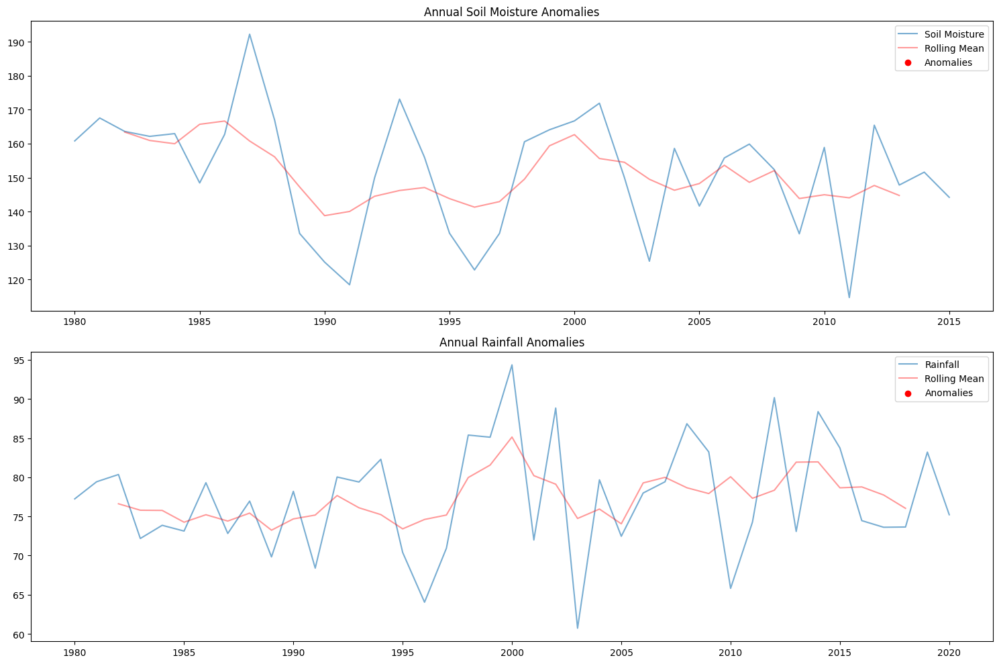


Analyzing anomalies during disaster years:
--------------------------------------------------

Year 1991: 1 event(s)
Event Type: Cold wave
Soil Moisture z-score: -0.98
Soil Moisture risk score: 49.2
Rainfall z-score: -1.21
Rainfall risk score: 60.6

Year 1997: 1 event(s)
Event Type: Cold wave
Soil Moisture z-score: -0.51
Soil Moisture risk score: 25.6
Rainfall z-score: -0.44
Rainfall risk score: 22.1

Year 2003: 1 event(s)
Event Type: Heat wave
Soil Moisture z-score: -1.38
Soil Moisture risk score: 68.8
Rainfall z-score: -1.35
Rainfall risk score: 67.4

Year 2005: 2 event(s)
Event Type: Cold wave
Event Type: Severe winter conditions
Soil Moisture z-score: -0.45
Soil Moisture risk score: 22.5
Rainfall z-score: -0.20
Rainfall risk score: 9.9

Year 2009: 1 event(s)
Event Type: Cold wave
Soil Moisture z-score: -0.53
Soil Moisture risk score: 26.7
Rainfall z-score: 0.65
Rainfall risk score: 32.4

Year 2010: 1 event(s)
Event Type: Cold wave
Soil Moisture z-score: 0.67
Soil Moisture risk sco

In [99]:
soil_monitoring, rain_monitoring = monitor_annual_metrics(
    soil_moisture_df, met_data_1980, disasters_df,
    window=5, threshold_std=2
)

In [116]:
from scipy.stats import normaltest

def plot_metric_anomalies(monitoring_df, metric_name, ax):
    """
    Create scatter plot with trend line and anomalies
    """
    # Regular points
    regular_points = monitoring_df[~monitoring_df['is_anomaly']]
    anomaly_points = monitoring_df[monitoring_df['is_anomaly']]
    
    # Plot regular points
    ax.scatter(regular_points['year'], regular_points['value'], 
              alpha=0.6, label='Regular Values', color='blue')
    
    # Plot anomalies
    ax.scatter(anomaly_points['year'], anomaly_points['value'],
              color='red', label='Anomalies', s=100)
    
    # Add trend line
    z = np.polyfit(monitoring_df['year'], monitoring_df['value'], 1)
    p = np.poly1d(z)
    ax.plot(monitoring_df['year'], p(monitoring_df['year']), 
            "r--", alpha=0.8, label=f'Trend (slope: {z[0]:.3f})')
    
    # Rolling mean
    ax.plot(monitoring_df['year'], monitoring_df['rolling_mean'],
            color='green', alpha=0.4, label='Rolling Mean')
    
    ax.set_title(f'Annual {metric_name} Analysis')
    ax.legend()
    
    # Add year labels for anomalies
    for _, point in anomaly_points.iterrows():
        ax.annotate(str(int(point['year'])), 
                   (point['year'], point['value']),
                   xytext=(5, 5), textcoords='offset points')

def analyze_metric_statistics(monitoring_df, metric_name):
    """
    Calculate and print relevant statistics for the metric
    """
    print(f"\nStatistical Analysis for {metric_name}")
    print("-" * 50)
    
    # Basic statistics
    print("Basic Statistics:")
    stats_df = monitoring_df['value'].describe()
    print(stats_df)
    
    # Trend analysis
    slope, intercept, r_value, p_value, std_err = stats.linregress(
        monitoring_df['year'], monitoring_df['value']
    )
    print(f"\nTrend Analysis:")
    print(f"Slope: {slope:.4f}")
    print(f"R-squared: {r_value**2:.4f}")
    print(f"P-value: {p_value:.4f}")
    
    # Test for normality
    stat, norm_p_value = normaltest(monitoring_df['value'])
    print(f"\nNormality Test:")
    print(f"p-value: {norm_p_value:.4f}")
    print(f"Distribution is {'normal' if norm_p_value > 0.05 else 'not normal'}")
    
    # Anomaly statistics
    anomalies = monitoring_df[monitoring_df['is_anomaly']]
    print(f"\nAnomalies detected: {len(anomalies)} ({len(anomalies)/len(monitoring_df)*100:.1f}%)")
    if len(anomalies) > 0:
        print("\nAnomaly Years:")
        for _, row in anomalies.iterrows():
            print(f"Year: {int(row['year'])}, Value: {row['value']:.2f}, Z-score: {row['z_score']:.2f}")

def monitor_temperature_metrics(temp_var, disasters_df, window=5, threshold_std=2):
    """
    Monitor temperature metrics and identify anomalies with improved visualization
    """
    # Filter for post-1980 data
    temp_data = temp_var[temp_var['year'] >= 1980].copy()
    
    # Calculate anomalies for each temperature metric
    metrics = {
        'Temperature Range': temp_data.set_index('year')[['temp_range']],
        'Maximum Temperature': temp_data.set_index('year')[['max_temp']],
        'Minimum Temperature': temp_data.set_index('year')[['min_temp']]
    }
    
    monitoring_results = {}
    fig, axes = plt.subplots(3, 1, figsize=(15, 20))
    
    for i, (metric_name, data) in enumerate(metrics.items()):
        monitoring_df = calculate_metric_anomalies(
            data,
            data.columns[0],
            window,
            threshold_std
        )
        monitoring_results[metric_name] = monitoring_df
        
        # Plot
        plot_metric_anomalies(monitoring_df, metric_name, axes[i])
        
        # Calculate statistics
        analyze_metric_statistics(monitoring_df, metric_name)
    
    plt.tight_layout()
    plt.show()
    
    # Analyze temperature-related disasters
    temp_events = disasters_df[disasters_df['Disaster Type'] == 'Extreme temperature'].copy()
    
    print("\nDisaster Event Analysis")
    print("-" * 50)
    
    for year in temp_events['Start Year'].unique():
        year_events = temp_events[temp_events['Start Year'] == year]
        print(f"\nYear {year}: {len(year_events)} event(s)")
        
        for _, event in year_events.iterrows():
            print(f"Event Type: {event['Disaster Subtype']}")
            print(f"Deaths: {event['Total Deaths']}")
            print(f"Duration: {event['End Month'] - event['Start Month'] + 1} months")
            
            # Print metric values for disaster years
            for metric_name, monitoring_df in monitoring_results.items():
                if year in monitoring_df['year'].values:
                    year_data = monitoring_df[monitoring_df['year'] == year].iloc[0]
                    print(f"{metric_name}:")
                    print(f"  Value: {year_data['value']:.2f}")
                    print(f"  Z-score: {year_data['z_score']:.2f}")
                    print(f"  Risk score: {year_data['risk_score']:.1f}")
    
    return monitoring_results

def analyze_metric_correlations(monitoring_results, disasters_df):
    """
    Analyze correlations between metrics and with disaster occurrences
    """
    # Create correlation matrix of metrics
    metric_values = pd.DataFrame()
    for metric_name, monitoring_df in monitoring_results.items():
        metric_values[metric_name] = monitoring_df['value']
    
    print("\nMetric Correlations:")
    print("-" * 50)
    correlation_matrix = metric_values.corr()
    print(correlation_matrix)
    
    # Correlations with disaster occurrences
    temp_events = disasters_df[disasters_df['Disaster Type'] == 'Extreme temperature'].copy()
    event_years = temp_events['Start Year'].unique()
    
    print("\nCorrelations with Disaster Occurrences:")
    print("-" * 50)
    for metric_name, monitoring_df in monitoring_results.items():
        monitoring_df['is_disaster_year'] = monitoring_df['year'].isin(event_years)
        correlation = monitoring_df['value'].corr(monitoring_df['is_disaster_year'])
        print(f"{metric_name}: {correlation:.3f}")

# Function to run the analysis
def run_temperature_analysis(temp_var, disasters_df):
    """
    Run the complete temperature monitoring analysis with improved visualizations
    """
    monitoring_results = monitor_temperature_metrics(temp_var, disasters_df)
    analyze_metric_correlations(monitoring_results, disasters_df)
    return monitoring_results


Statistical Analysis for Temperature Range
--------------------------------------------------
Basic Statistics:
count    44.000000
mean      7.236136
std       0.252487
min       6.820000
25%       7.040000
50%       7.240000
75%       7.372500
max       7.980000
Name: value, dtype: float64

Trend Analysis:
Slope: 0.0094
R-squared: 0.2288
P-value: 0.0010

Normality Test:
p-value: 0.2063
Distribution is normal

Anomalies detected: 0 (0.0%)

Statistical Analysis for Maximum Temperature
--------------------------------------------------
Basic Statistics:
count    44.000000
mean     12.654091
std       0.671178
min      11.210000
25%      12.282500
50%      12.875000
75%      13.102500
max      13.920000
Name: value, dtype: float64

Trend Analysis:
Slope: 0.0355
R-squared: 0.4617
P-value: 0.0000

Normality Test:
p-value: 0.3141
Distribution is normal

Anomalies detected: 0 (0.0%)

Statistical Analysis for Minimum Temperature
--------------------------------------------------
Basic Statist

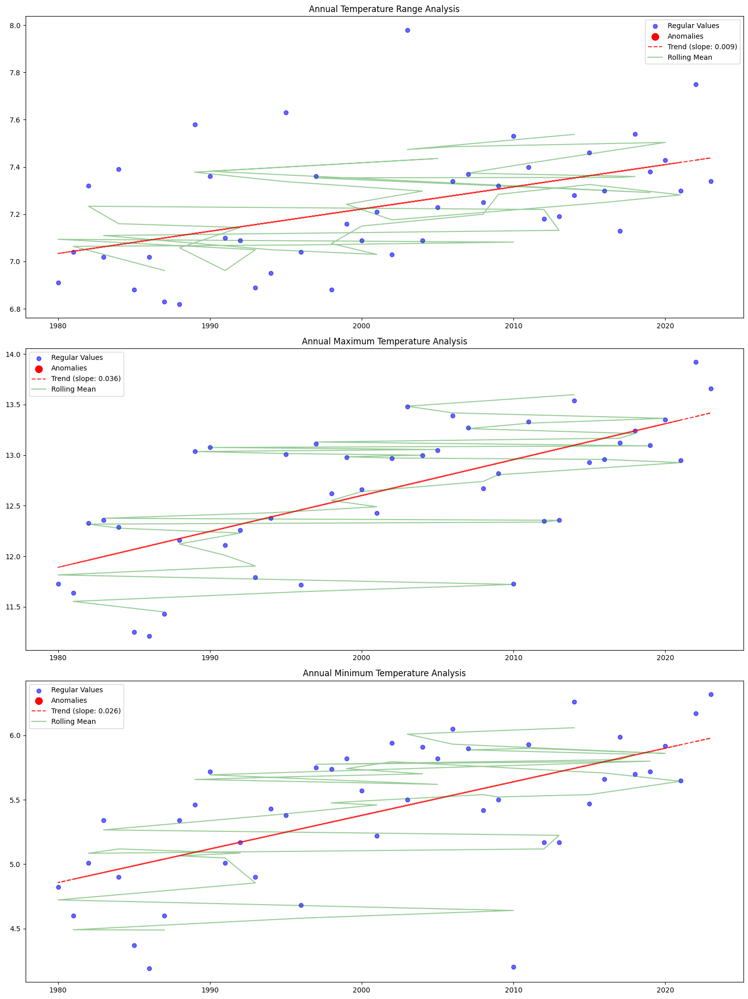


Disaster Event Analysis
--------------------------------------------------

Year 1991: 1 event(s)
Event Type: Cold wave
Deaths: 0.0
Duration: 1 months
Temperature Range:
  Value: 7.10
  Z-score: 1.10
  Risk score: 54.8
Maximum Temperature:
  Value: 12.11
  Z-score: 0.42
  Risk score: 21.2
Minimum Temperature:
  Value: 5.01
  Z-score: -0.18
  Risk score: 9.1

Year 1997: 1 event(s)
Event Type: Cold wave
Deaths: 14.0
Duration: 1 months
Temperature Range:
  Value: 7.36
  Z-score: 0.04
  Risk score: 2.1
Maximum Temperature:
  Value: 13.11
  Z-score: -0.32
  Risk score: 15.8
Minimum Temperature:
  Value: 5.75
  Z-score: -0.21
  Risk score: 10.7

Year 2003: 1 event(s)
Event Type: Heat wave
Deaths: 301.0
Duration: 1 months
Temperature Range:
  Value: 7.98
  Z-score: 1.76
  Risk score: 87.9
Maximum Temperature:
  Value: 13.48
  Z-score: -0.03
  Risk score: 1.6
Minimum Temperature:
  Value: 5.50
  Z-score: -1.56
  Risk score: 77.9

Year 2005: 2 event(s)
Event Type: Cold wave
Deaths: 0.0
Duratio

In [117]:
monitoring_results = run_temperature_analysis(temp_var, disasters_df)

In [122]:
def analyze_temperature_metrics(temp_data, disasters_df, window=5, threshold_std=2):
    """
    Enhanced temperature analysis including variability
    """
    temp_metrics = {
        'Temperature Variability': temp_data.set_index('year')[['temp_variability']],
        'Maximum Temperature': temp_data.set_index('year')[['max_temp']],
        'Minimum Temperature': temp_data.set_index('year')[['min_temp']]
    }
    
    monitoring_results = {}
    fig, axes = plt.subplots(3, 1, figsize=(15, 20))
    
    for i, (metric_name, data) in enumerate(temp_metrics.items()):
        # Drop NaN values for variability
        data = data.dropna()
        
        monitoring_df = calculate_metric_anomalies(
            data,
            data.columns[0],
            window,
            threshold_std
        )
        monitoring_results[metric_name] = monitoring_df
        
        # Plot
        plot_metric_anomalies(monitoring_df, metric_name, axes[i])
        analyze_metric_statistics(monitoring_df, metric_name)
    
    plt.tight_layout()
    plt.show()
    
    # Analyze relationships with disasters
    analyze_disaster_patterns(monitoring_results, disasters_df)
    
    return monitoring_results

def analyze_disaster_patterns(monitoring_results, disasters_df):
    """
    Analyze patterns in disaster events related to temperature metrics
    """
    temp_events = disasters_df[
        (disasters_df['Disaster Type'] == 'Extreme temperature') & 
        (disasters_df['Start Year'] >= 1980)
    ].copy()
    
    print("\nDisaster Pattern Analysis")
    print("-" * 50)
    
    # Analyze trends in disaster characteristics
    print("\nTrends in Disaster Duration and Impact:")
    decades = temp_events['Start Year'].map(lambda x: f"{x//10*10}s")
    for decade in decades.unique():
        decade_events = temp_events[decades == decade]
        print(f"\n{decade}:")
        print(f"Number of events: {len(decade_events)}")
        print(f"Average duration (months): {decade_events['End Month'].mean() - decade_events['Start Month'].mean():.1f}")
        print(f"Total deaths: {decade_events['Total Deaths'].sum():.0f}")
        print(f"Events by type: {decade_events['Disaster Subtype'].value_counts().to_dict()}")
    
    # Correlation analysis
    metric_values = pd.DataFrame()
    for metric_name, monitoring_df in monitoring_results.items():
        metric_values[metric_name] = monitoring_df['value']
    
    correlation_matrix = metric_values.corr()
    print("\nMetric Correlations:")
    print(correlation_matrix)
    
    # Calculate disaster correlations
    event_years = set(temp_events['Start Year'])
    print("\nCorrelations with Disaster Occurrence:")
    for metric_name, monitoring_df in monitoring_results.items():
        monitoring_df['is_disaster_year'] = monitoring_df['year'].isin(event_years)
        correlation = monitoring_df['value'].corr(monitoring_df['is_disaster_year'])
        print(f"{metric_name}: {correlation:.3f}")


Statistical Analysis for Temperature Variability
--------------------------------------------------
Basic Statistics:
count    42.000000
mean      0.225330
std       0.092930
min       0.077006
25%       0.141782
50%       0.229672
75%       0.281820
max       0.442176
Name: value, dtype: float64

Trend Analysis:
Slope: 0.0015
R-squared: 0.0413
P-value: 0.1968

Normality Test:
p-value: 0.3812
Distribution is normal

Anomalies detected: 0 (0.0%)

Statistical Analysis for Maximum Temperature
--------------------------------------------------
Basic Statistics:
count    44.000000
mean     12.654091
std       0.671178
min      11.210000
25%      12.282500
50%      12.875000
75%      13.102500
max      13.920000
Name: value, dtype: float64

Trend Analysis:
Slope: 0.0355
R-squared: 0.4617
P-value: 0.0000

Normality Test:
p-value: 0.3141
Distribution is normal

Anomalies detected: 0 (0.0%)

Statistical Analysis for Minimum Temperature
--------------------------------------------------
Basic S

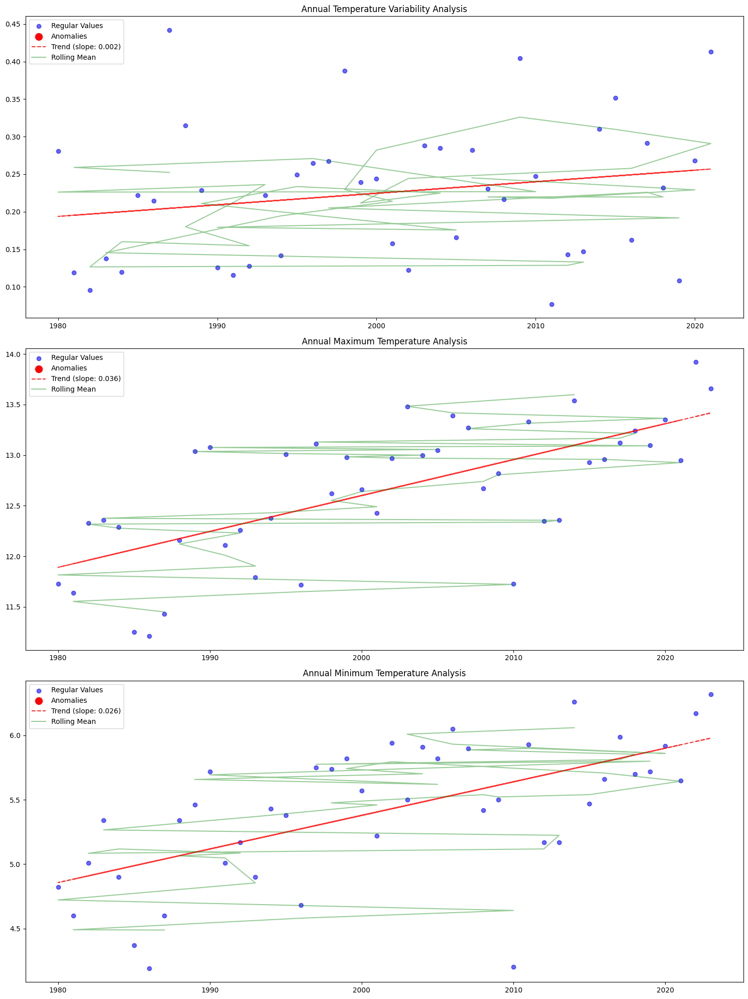


Disaster Pattern Analysis
--------------------------------------------------

Trends in Disaster Duration and Impact:

1990s:
Number of events: 2
Average duration (months): 0.0
Total deaths: 14
Events by type: {'Cold wave': 2}

2000s:
Number of events: 4
Average duration (months): 0.0
Total deaths: 305
Events by type: {'Cold wave': 2, 'Heat wave': 1, 'Severe winter conditions': 1}

2010s:
Number of events: 5
Average duration (months): 0.6
Total deaths: 926
Events by type: {'Heat wave': 4, 'Cold wave': 1}

2020s:
Number of events: 3
Average duration (months): 2.3
Total deaths: 7876
Events by type: {'Heat wave': 3}

Metric Correlations:
                         Temperature Variability  Maximum Temperature  \
Temperature Variability                 1.000000             0.057208   
Maximum Temperature                     0.057208             1.000000   
Minimum Temperature                     0.090062             0.930506   

                         Minimum Temperature  
Temperature Vari

In [123]:
monitoring_results = analyze_temperature_metrics(temp_var, disasters_df)

In [141]:
def prepare_annual_rainfall(annual_rainfall):
    """
    Prepare annual rainfall data
    """
    # If annual_rainfall is a DataFrame, extract the rainfall values
    if isinstance(annual_rainfall, pd.DataFrame):
        if 'mean_rainfall' in annual_rainfall.columns:
            return annual_rainfall.set_index('year')['mean_rainfall']
        elif 'rain' in annual_rainfall.columns:
            return annual_rainfall.set_index('year')['rain']
    return annual_rainfall  # If it's already a Series, return as is

def analyze_unified_metrics(temp_var, soil_moisture_df, annual_rainfall, disasters_df, 
                           window=5, threshold_std=2):
    """
    Unified analysis of all environmental metrics with fixed risk calculation
    """
    # Prepare data
    annual_soil = prepare_annual_soil_moisture(soil_moisture_df)
    annual_soil = annual_soil[annual_soil.index >= 1980]
    
    # Prepare rainfall data
    rainfall = prepare_annual_rainfall(annual_rainfall)
    rainfall = rainfall[rainfall.index >= 1980]
    
    # Prepare temperature data
    temp_data = temp_var[temp_var['year'] >= 1980].copy()
    
    # Create unified metrics dataframe
    metrics_df = pd.DataFrame(index=range(1980, 2024))
    
    # Add raw metrics
    metrics_df['soil_moisture'] = annual_soil
    metrics_df['rainfall'] = rainfall
    metrics_df['temp_variability'] = temp_data.set_index('year')['temp_variability']
    metrics_df['max_temp'] = temp_data.set_index('year')['max_temp']
    metrics_df['min_temp'] = temp_data.set_index('year')['min_temp']
    
    # Print data availability check
    print("Data availability check:")
    print(metrics_df.notna().sum())
    print("\nDate ranges:")
    for col in metrics_df.columns:
        available_years = metrics_df[metrics_df[col].notna()].index
        if len(available_years) > 0:
            print(f"{col}: {min(available_years)} - {max(available_years)}")
    
    # Add disaster indicator
    temp_events = disasters_df[disasters_df['Disaster Type'] == 'Extreme temperature']
    metrics_df['disaster_year'] = metrics_df.index.isin(temp_events['Start Year'])
    
    # Calculate composite risk
    metrics_df['composite_risk'] = calculate_composite_risk(metrics_df)
    
    # Plot correlation matrix
    plt.figure(figsize=(12, 8))
    correlation_matrix = metrics_df.dropna().corr()
    sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm',
                center=0, vmin=-1, vmax=1)
    plt.title('Correlation Matrix of Environmental Metrics')
    plt.tight_layout()
    plt.show()
    
    # Plot composite risk scores
    plt.figure(figsize=(15, 6))
    
    # Plot risk score line
    plt.plot(metrics_df.index, metrics_df['composite_risk'], 
             label='Composite Risk', alpha=0.7)
    
    # Highlight disaster years
    disaster_years = metrics_df[metrics_df['disaster_year']].index
    plt.scatter(disaster_years, 
               metrics_df.loc[disaster_years, 'composite_risk'],
               color='red', s=100, label='Disaster Years')
    
    plt.title('Composite Environmental Risk Score (1980-2023)')
    plt.ylabel('Risk Score (0-100)')
    plt.xlabel('Year')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return metrics_df

def analyze_risk_thresholds(metrics_df, thresholds=[50, 60, 70, 80, 90]):
    """
    Analyze risk score effectiveness at different thresholds
    """
    # Drop years with missing risk scores
    metrics_df = metrics_df.dropna(subset=['composite_risk'])
    
    print("\nRisk Score Analysis")
    print("-" * 50)
    
    print(f"\nAverage Risk Scores:")
    disaster_mean = metrics_df[metrics_df['disaster_year']]['composite_risk'].mean()
    non_disaster_mean = metrics_df[~metrics_df['disaster_year']]['composite_risk'].mean()
    print(f"Disaster years: {disaster_mean:.1f}")
    print(f"Non-disaster years: {non_disaster_mean:.1f}")
    
    print("\nThreshold Analysis:")
    for threshold in thresholds:
        high_risk = metrics_df['composite_risk'] >= threshold
        
        true_positives = (high_risk & metrics_df['disaster_year']).sum()
        false_positives = (high_risk & ~metrics_df['disaster_year']).sum()
        true_negatives = (~high_risk & ~metrics_df['disaster_year']).sum()
        false_negatives = (~high_risk & metrics_df['disaster_year']).sum()
        
        # Calculate metrics
        total_disasters = metrics_df['disaster_year'].sum()
        total_non_disasters = (~metrics_df['disaster_year']).sum()
        
        if total_disasters > 0:
            sensitivity = true_positives / total_disasters
        else:
            sensitivity = 0
            
        if total_non_disasters > 0:
            specificity = true_negatives / total_non_disasters
        else:
            specificity = 0
            
        if (true_positives + false_positives) > 0:
            precision = true_positives / (true_positives + false_positives)
        else:
            precision = 0
        
        print(f"\nThreshold {threshold}:")
        print(f"Capture Rate: {sensitivity:.1%}")
        print(f"False Positive Rate: {1-specificity:.1%}")
        print(f"Precision: {precision:.1%}")
        print(f"True Positives: {true_positives}, False Positives: {false_positives}")

Data availability check:
soil_moisture       36
rainfall            41
temp_variability    42
max_temp            44
min_temp            44
dtype: int64

Date ranges:
soil_moisture: 1980 - 2015
rainfall: 1980 - 2020
temp_variability: 1980 - 2021
max_temp: 1980 - 2023
min_temp: 1980 - 2023


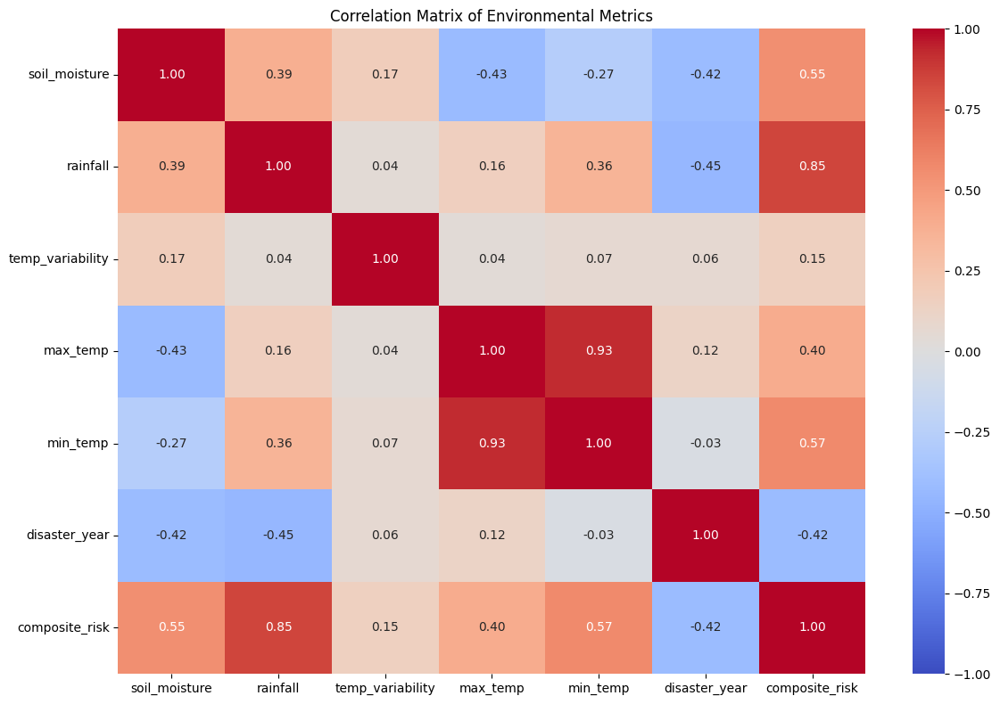

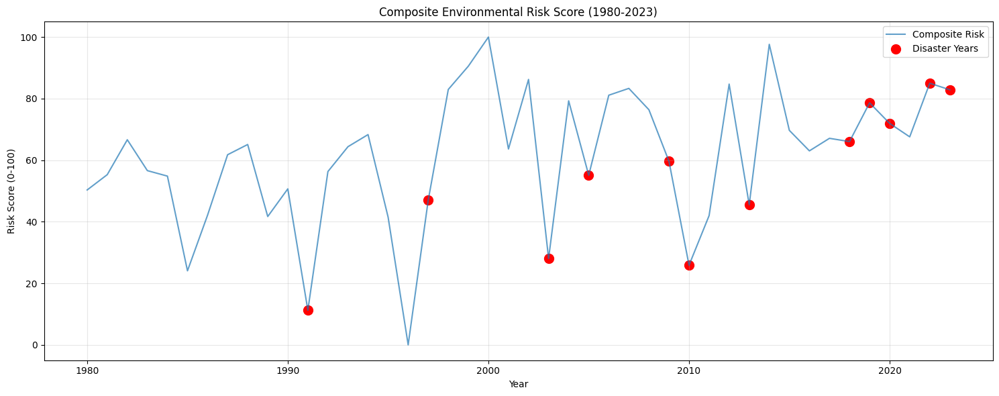


Risk Score Analysis
--------------------------------------------------

Average Risk Scores:
Disaster years: 54.8
Non-disaster years: 63.6

Threshold Analysis:

Threshold 50:
Capture Rate: 58.3%
False Positive Rate: 81.2%
Precision: 21.2%
True Positives: 7, False Positives: 26

Threshold 60:
Capture Rate: 41.7%
False Positive Rate: 62.5%
Precision: 20.0%
True Positives: 5, False Positives: 20

Threshold 70:
Capture Rate: 33.3%
False Positive Rate: 31.2%
Precision: 28.6%
True Positives: 4, False Positives: 10

Threshold 80:
Capture Rate: 16.7%
False Positive Rate: 25.0%
Precision: 20.0%
True Positives: 2, False Positives: 8

Threshold 90:
Capture Rate: 0.0%
False Positive Rate: 9.4%
Precision: 0.0%
True Positives: 0, False Positives: 3


In [143]:
# Add the rainfall data to a Series if it isn't already
if isinstance(annual_rainfall, pd.DataFrame):
    annual_rainfall = annual_rainfall.set_index('year')['mean_rainfall']

# Run analysis with fixed calculations
metrics_df = analyze_unified_metrics(temp_var, soil_moisture_df, annual_rainfall, disasters_df)

# Analyze effectiveness at different thresholds
analyze_risk_thresholds(metrics_df)

In [147]:
def analyze_disaster_types(disasters_df):
    """
    Analyze all types of disasters and their relationships with environmental metrics
    """
    # Filter for relevant period
    disasters = disasters_df[disasters_df['Start Year'] >= 1980].copy()
    
    # Analyze disaster distribution
    print("\nDisaster Type Distribution:")
    print(disasters['Disaster Type'].value_counts())
    
    # Analyze trends by decade
    disasters['Decade'] = (disasters['Start Year'] // 10) * 10
    
    print("\nDisasters by Decade:")
    decade_summary = disasters.groupby(['Decade', 'Disaster Type']).size().unstack(fill_value=0)
    print(decade_summary)
    
    # Calculate impact metrics
    print("\nImpact Analysis by Disaster Type:")
    impact_analysis = disasters.groupby('Disaster Type').agg({
        'Total Deaths': ['count', 'sum', 'mean'],
        'Total Affected': ['sum', 'mean']
    }).round(2)
    print(impact_analysis)
    
    return disasters

def create_type_specific_risks(metrics_df, disasters):
    """
    Create risk scores specific to different types of disasters
    """
    # Create risk indicators for major disaster types
    disaster_types = disasters['Disaster Type'].unique()
    
    for disaster_type in disaster_types:
        type_events = disasters[disasters['Disaster Type'] == disaster_type]
        metrics_df[f'{disaster_type.lower()}_year'] = metrics_df.index.isin(type_events['Start Year'])
    
    # Calculate type-specific risk scores
    risk_scores = pd.DataFrame(index=metrics_df.index)
    
    for disaster_type in disaster_types:
        type_col = f'{disaster_type.lower()}_year'
        
        # Calculate correlations with environmental metrics
        correlations = metrics_df[['soil_moisture', 'rainfall', 'temp_variability', 
                                 'max_temp', 'min_temp']].corrwith(metrics_df[type_col])
        
        # Create weighted risk score
        weights = correlations.abs() / correlations.abs().sum()
        risk_score = pd.Series(0.0, index=metrics_df.index)
        
        for metric in weights.index:
            normalized_metric = (metrics_df[metric] - metrics_df[metric].mean()) / metrics_df[metric].std()
            risk_score += normalized_metric * weights[metric]
        
        # Scale to 0-100
        risk_scores[f'{disaster_type.lower()}_risk'] = ((risk_score - risk_score.min()) / 
                                                       (risk_score.max() - risk_score.min()) * 100)
    
    return risk_scores

def analyze_risk_effectiveness(metrics_df, risk_scores, disasters):
    """
    Analyze effectiveness of type-specific risk scores
    """
    print("\nRisk Score Effectiveness Analysis")
    print("-" * 50)
    
    for disaster_type in disasters['Disaster Type'].unique():
        risk_col = f'{disaster_type.lower()}_risk'
        event_col = f'{disaster_type.lower()}_year'
        
        if risk_col in risk_scores.columns:
            disaster_years = metrics_df[metrics_df[event_col]]
            non_disaster_years = metrics_df[~metrics_df[event_col]]
            
            print(f"\n{disaster_type}:")
            print(f"Average risk score in disaster years: "
                  f"{risk_scores.loc[disaster_years.index, risk_col].mean():.1f}")
            print(f"Average risk score in non-disaster years: "
                  f"{risk_scores.loc[non_disaster_years.index, risk_col].mean():.1f}")
            
            # Calculate ROC curve metrics
            thresholds = range(0, 101, 10)
            print("\nPerformance at different thresholds:")
            
            for threshold in thresholds:
                high_risk = risk_scores[risk_col] >= threshold
                true_pos = (high_risk & metrics_df[event_col]).sum()
                false_pos = (high_risk & ~metrics_df[event_col]).sum()
                total_events = metrics_df[event_col].sum()
                
                if total_events > 0:
                    sensitivity = true_pos / total_events
                    precision = true_pos / max(true_pos + false_pos, 1)
                    
                    if true_pos > 0:
                        print(f"\nThreshold {threshold}:")
                        print(f"Capture Rate: {sensitivity:.1%}")
                        print(f"Precision: {precision:.1%}")
                        print(f"Events Captured: {true_pos} of {total_events}")

def plot_risk_timeline(risk_scores, disasters, start_year=1980):
    """
    Plot timeline of risk scores with disaster events
    """
    disaster_types = disasters['Disaster Type'].unique()
    n_types = len(disaster_types)
    
    fig, axes = plt.subplots(n_types, 1, figsize=(15, 5*n_types))
    if n_types == 1:
        axes = [axes]
    
    for ax, disaster_type in zip(axes, disaster_types):
        risk_col = f'{disaster_type.lower()}_risk'
        
        # Plot risk score
        ax.plot(risk_scores.index, risk_scores[risk_col], 
                label='Risk Score', alpha=0.7)
        
        # Add disaster events
        type_events = disasters[disasters['Disaster Type'] == disaster_type]
        
        # Filter event years to only include those in risk_scores index
        event_years = type_events['Start Year'].unique()
        valid_years = [year for year in event_years if year in risk_scores.index]
        
        if len(valid_years) > 0:
            event_scores = risk_scores.loc[valid_years, risk_col]
            ax.scatter(valid_years, event_scores, color='red', s=100,
                      label='Disaster Events')
        
        ax.set_title(f'{disaster_type} Risk Timeline')
        ax.set_ylabel('Risk Score (0-100)')
        ax.set_xlabel('Year')
        ax.grid(True, alpha=0.3)
        ax.legend()
    
    plt.tight_layout()
    plt.show()


Disaster Type Distribution:
Disaster Type
Storm                  45
Flood                  34
Extreme temperature    14
Epidemic                3
Earthquake              2
Drought                 1
Name: count, dtype: int64

Disasters by Decade:
Disaster Type  Drought  Earthquake  Epidemic  Extreme temperature  Flood  \
Decade                                                                     
1980                 0           0         2                    0      0   
1990                 0           1         0                    2      8   
2000                 0           1         1                    4     15   
2010                 0           0         0                    5     10   
2020                 1           0         0                    3      1   

Disaster Type  Storm  
Decade                
1980               6  
1990              15  
2000              10  
2010               7  
2020               7  

Impact Analysis by Disaster Type:
                    Tota

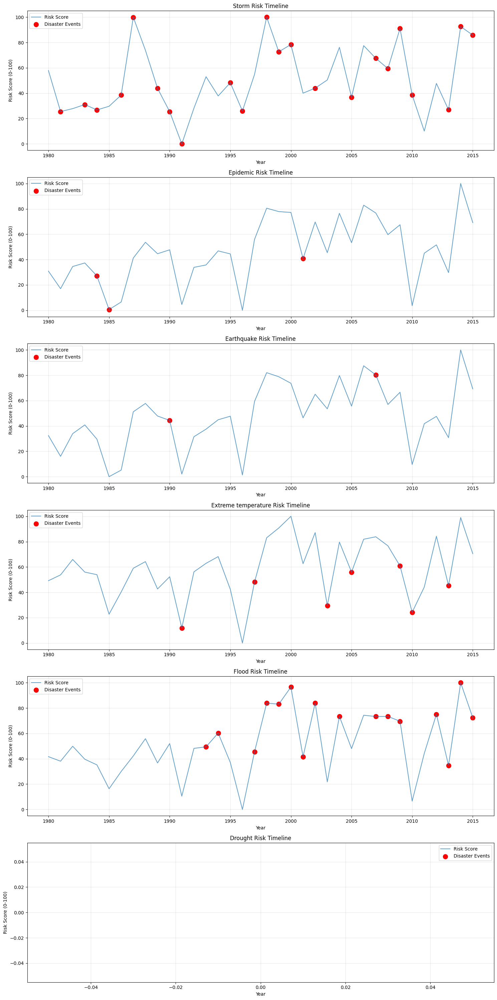

In [148]:
# Analyze all disaster types
disaster_analysis = analyze_disaster_types(disasters_df)

# Create type-specific risk scores
risk_scores = create_type_specific_risks(metrics_df, disaster_analysis)

# Analyze effectiveness
analyze_risk_effectiveness(metrics_df, risk_scores, disaster_analysis)

# Plot risk timelines
plot_risk_timeline(risk_scores, disaster_analysis)

INFO:__main__:
Flood risk factor weights:
INFO:__main__:rainfall: 0.424
INFO:__main__:temp_variability: 0.032
INFO:__main__:max_temp: 0.152
INFO:__main__:min_temp: 0.241
INFO:__main__:soil_moisture: 0.151
INFO:__main__:
Storm risk factor weights:
INFO:__main__:rainfall: 0.088
INFO:__main__:temp_variability: 0.557
INFO:__main__:max_temp: 0.153
INFO:__main__:min_temp: 0.033
INFO:__main__:soil_moisture: 0.169



Flood Risk Analysis:
AUC Score: 0.846

Performance at key thresholds:

Threshold 30:
Precision: 48.72%
Recall: 100.00%

Threshold 50:
Precision: 59.26%
Recall: 84.21%

Threshold 70:
Precision: 78.57%
Recall: 57.89%

Storm Risk Analysis:
AUC Score: 0.588

Performance at key thresholds:

Threshold 30:
Precision: 64.52%
Recall: 74.07%

Threshold 50:
Precision: 68.42%
Recall: 48.15%

Threshold 70:
Precision: 100.00%
Recall: 29.63%


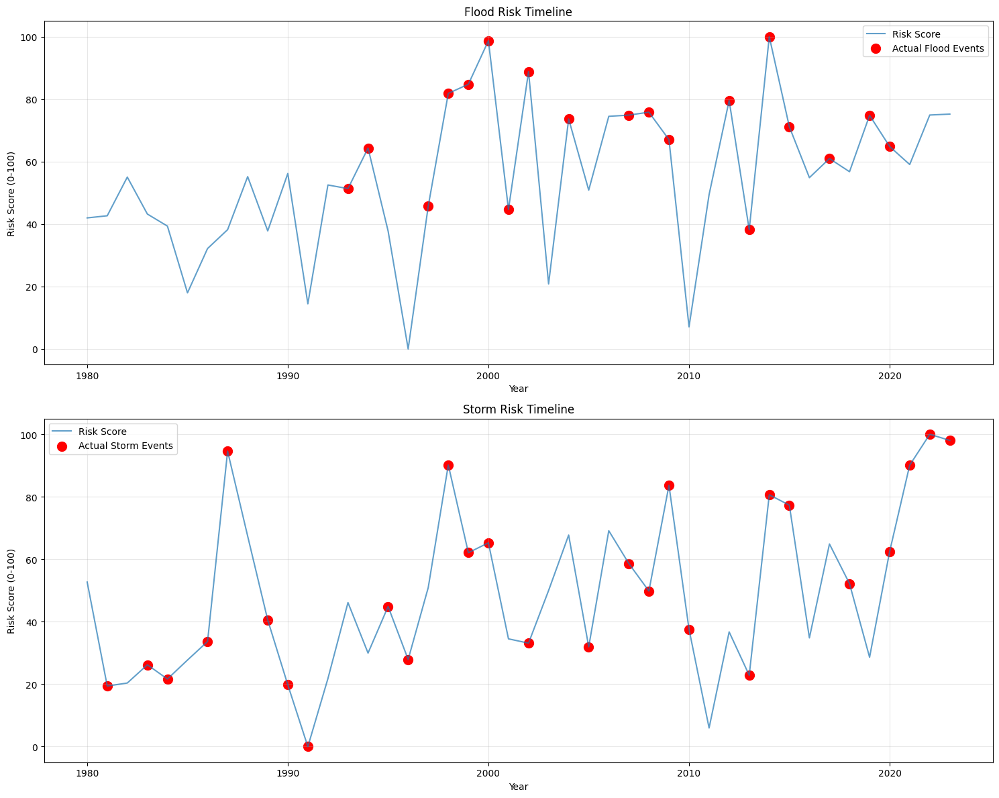

In [157]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, precision_score, recall_score
import matplotlib.pyplot as plt
import logging

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

class FloodStormDisasterModel:
    """
    Analyzes flood and storm risks using environmental indicators including
    soil moisture, rainfall, and temperature metrics.
    """
    
    def __init__(self, metrics_df, disasters_df, soil_moisture_df):
        """Initialize analyzer with environmental and disaster data."""
        self.metrics_df = self._prepare_metrics(metrics_df, soil_moisture_df)
        self.disasters_df = self._prepare_disasters(disasters_df)
    
    def _prepare_metrics(self, metrics_df, soil_moisture_df):
        """Process and merge environmental metrics."""
        # Process soil moisture data to yearly values
        soil_yearly = self._process_soil_moisture(soil_moisture_df)
        
        # Merge with existing metrics
        metrics = metrics_df.copy()
        metrics['soil_moisture'] = soil_yearly
        
        # Handle missing values through interpolation
        for col in ['rainfall', 'temp_variability', 'soil_moisture']:
            if col in metrics.columns and metrics[col].isna().any():
                metrics[col] = metrics[col].interpolate(method='linear')
        
        return metrics
    
    def _process_soil_moisture(self, soil_df):
        """Convert soil moisture data to yearly averages."""
        # Extract data after metadata rows
        data_start_idx = soil_df.index[soil_df.iloc[:, 0].astype(str).str.match(r'^\d{4}-\d{2}-\d{2}$')].min()
        data_df = soil_df.loc[data_start_idx:].copy()
        
        # Convert index to datetime and values to numeric
        data_df.iloc[:, 0] = pd.to_datetime(data_df.iloc[:, 0])
        data_df.iloc[:, 1] = pd.to_numeric(data_df.iloc[:, 1])
        
        # Calculate yearly averages
        yearly_data = data_df.set_index(data_df.iloc[:, 0]).iloc[:, 1]
        yearly_moisture = yearly_data.groupby(yearly_data.index.year).mean()
        
        # Filter for analysis period
        return yearly_moisture[yearly_moisture.index >= 1980]
    
    def _prepare_disasters(self, df):
        """Process disaster records."""
        return df[
            (df['Disaster Type'].isin(['Flood', 'Storm'])) &
            (df['Start Year'] >= 1980)
        ].copy()
    
    def analyze_risks(self):
        """Conduct comprehensive risk analysis for floods and storms."""
        # Create event indicators
        for disaster_type in ['Flood', 'Storm']:
            type_events = self.disasters_df[
                self.disasters_df['Disaster Type'] == disaster_type
            ]
            self.metrics_df[f'{disaster_type.lower()}_event'] = (
                self.metrics_df.index.isin(type_events['Start Year'])
            ).astype(int)
        
        # Calculate risk scores
        risk_scores = pd.DataFrame(index=self.metrics_df.index)
        performance_metrics = {}
        
        # Standardize predictors
        predictors = ['rainfall', 'temp_variability', 'max_temp', 
                     'min_temp', 'soil_moisture']
        scaler = StandardScaler()
        metrics_scaled = pd.DataFrame(
            scaler.fit_transform(self.metrics_df[predictors]),
            columns=predictors,
            index=self.metrics_df.index
        )
        
        # Calculate risk scores for each disaster type
        for disaster_type in ['flood', 'storm']:
            # Calculate correlations and weights
            correlations = metrics_scaled.corrwith(
                self.metrics_df[f'{disaster_type}_event'].astype(float)
            )
            weights = correlations.abs() / correlations.abs().sum()
            
            # Calculate weighted risk score
            risk_score = (metrics_scaled * weights).sum(axis=1)
            risk_scores[f'{disaster_type}_risk'] = (
                (risk_score - risk_score.min()) / 
                (risk_score.max() - risk_score.min()) * 100
            )
            
            # Log feature importance
            logger.info(f"\n{disaster_type.title()} risk factor weights:")
            for metric, weight in weights.items():
                logger.info(f"{metric}: {weight:.3f}")
            
            # Calculate performance metrics
            y_true = self.metrics_df[f'{disaster_type}_event']
            y_score = risk_scores[f'{disaster_type}_risk']
            
            performance_metrics[disaster_type] = {
                'auc_score': roc_auc_score(y_true, y_score),
                'thresholds': self._calculate_threshold_metrics(y_true, y_score)
            }
        
        return risk_scores, performance_metrics
    
    def _calculate_threshold_metrics(self, y_true, y_score):
        """Calculate precision and recall at different thresholds."""
        thresholds = [30, 50, 70]
        metrics = []
        
        for threshold in thresholds:
            predictions = (y_score >= threshold).astype(int)
            metrics.append({
                'threshold': threshold,
                'precision': precision_score(y_true, predictions, zero_division=0),
                'recall': recall_score(y_true, predictions)
            })
        
        return metrics
    
    def plot_analysis(self, risk_scores):
        """Generate visualization of risk scores and actual events."""
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))
        
        for ax, disaster_type in zip([ax1, ax2], ['flood', 'storm']):
            risk_col = f'{disaster_type}_risk'
            event_col = f'{disaster_type}_event'
            
            # Plot risk score
            ax.plot(risk_scores.index, risk_scores[risk_col], 
                   label='Risk Score', alpha=0.7)
            
            # Add actual events
            event_years = self.metrics_df[
                self.metrics_df[f'{disaster_type}_event'] == 1
            ].index
            
            if len(event_years) > 0:
                event_scores = risk_scores.loc[event_years, risk_col]
                ax.scatter(event_years, event_scores, color='red', s=100,
                          label=f'Actual {disaster_type.title()} Events')
            
            ax.set_title(f'{disaster_type.title()} Risk Timeline')
            ax.set_ylabel('Risk Score (0-100)')
            ax.set_xlabel('Year')
            ax.grid(True, alpha=0.3)
            ax.legend()
        
        plt.tight_layout()
        return fig

# Initialize the analyzer
analyzer = FloodStormDisasterModel(metrics_df, disasters_df, soil_moisture_df)

# Conduct risk analysis
risk_scores, performance = analyzer.analyze_risks()

# Print performance metrics
for disaster_type, metrics in performance.items():
    print(f"\n{disaster_type.title()} Risk Analysis:")
    print(f"AUC Score: {metrics['auc_score']:.3f}")
    
    print("\nPerformance at key thresholds:")
    for m in metrics['thresholds']:
        print(f"\nThreshold {m['threshold']}:")
        print(f"Precision: {m['precision']:.2%}")
        print(f"Recall: {m['recall']:.2%}")

# Generate visualization
analyzer.plot_analysis(risk_scores)
plt.show()

In [158]:
class DisasterSeverityAnalyzer(FloodStormDisasterModel):
    """
    Extends the hydrometeorological analysis to incorporate severity prediction,
    focusing on mortality as a primary impact metric.
    """
    
    def analyze_severity_patterns(self):
        """Analyze patterns in disaster severity."""
        severity_metrics = {}
        
        for disaster_type in ['Flood', 'Storm']:
            # Filter events for this disaster type
            type_events = self.disasters_df[
                self.disasters_df['Disaster Type'] == disaster_type
            ].copy()
            
            # Calculate basic severity statistics
            severity_metrics[disaster_type] = {
                'total_deaths': type_events['Total Deaths'].sum(),
                'mean_deaths': type_events['Total Deaths'].mean(),
                'median_deaths': type_events['Total Deaths'].median(),
                'max_deaths': type_events['Total Deaths'].max(),
                'events_with_deaths': (type_events['Total Deaths'] > 0).sum(),
                'total_events': len(type_events)
            }
            
            # Log severity metrics
            logger.info(f"\n{disaster_type} Severity Analysis:")
            for metric, value in severity_metrics[disaster_type].items():
                logger.info(f"{metric}: {value:.2f}")
        
        return severity_metrics
    
    def create_severity_indicators(self):
        """Create severity classes based on death toll distribution."""
        for disaster_type in ['Flood', 'Storm']:
            events = self.disasters_df[
                self.disasters_df['Disaster Type'] == disaster_type
            ]
            
            # Calculate severity thresholds using percentiles
            deaths = events['Total Deaths'].fillna(0)
            thresholds = {
                'low': deaths.quantile(0.33),
                'medium': deaths.quantile(0.67),
                'high': deaths.quantile(0.90)
            }
            
            # Assign severity classes
            def assign_severity(deaths):
                if deaths == 0:
                    return 'none'
                elif deaths <= thresholds['low']:
                    return 'low'
                elif deaths <= thresholds['medium']:
                    return 'medium'
                elif deaths <= thresholds['high']:
                    return 'high'
                else:
                    return 'extreme'
            
            self.disasters_df[f'{disaster_type.lower()}_severity'] = \
                events['Total Deaths'].apply(assign_severity)
            
            # Log severity distribution
            severity_dist = self.disasters_df[
                f'{disaster_type.lower()}_severity'
            ].value_counts()
            
            logger.info(f"\n{disaster_type} Severity Distribution:")
            logger.info(severity_dist)
            
            # Calculate correlation with environmental metrics
            yearly_severity = pd.get_dummies(
                self.disasters_df[
                    self.disasters_df['Disaster Type'] == disaster_type
                ].groupby('Start Year')[f'{disaster_type.lower()}_severity']
                .agg(lambda x: x.mode().iloc[0] if len(x) > 0 else 'none')
            )
            
            # Analyze correlation with environmental metrics
            metrics_yearly = self.metrics_df[
                ['rainfall', 'temp_variability', 'soil_moisture']
            ]
            
            correlations = pd.DataFrame()
            for severity in yearly_severity.columns:
                if severity != 'none':
                    correlations[severity] = metrics_yearly.corrwith(
                        yearly_severity[severity].reindex(metrics_yearly.index).fillna(0)
                    )
            
            logger.info(f"\n{disaster_type} Environmental Correlations with Severity:")
            logger.info(correlations)
            
        return correlations

# Create severity analyzer instance
severity_analyzer = DisasterSeverityAnalyzer(metrics_df, disasters_df, soil_moisture_df)

# Analyze severity patterns
severity_metrics = severity_analyzer.analyze_severity_patterns()

# Create and analyze severity indicators
correlations = severity_analyzer.create_severity_indicators()

INFO:__main__:
Flood Severity Analysis:
INFO:__main__:total_deaths: 54.00
INFO:__main__:mean_deaths: 1.59
INFO:__main__:median_deaths: 0.00
INFO:__main__:max_deaths: 8.00
INFO:__main__:events_with_deaths: 16.00
INFO:__main__:total_events: 34.00
INFO:__main__:
Storm Severity Analysis:
INFO:__main__:total_deaths: 351.00
INFO:__main__:mean_deaths: 7.80
INFO:__main__:median_deaths: 5.00
INFO:__main__:max_deaths: 48.00
INFO:__main__:events_with_deaths: 35.00
INFO:__main__:total_events: 45.00
INFO:__main__:
Flood Severity Distribution:
INFO:__main__:flood_severity
none       18
high        7
medium      5
extreme     4
Name: count, dtype: int64
INFO:__main__:
Flood Environmental Correlations with Severity:
INFO:__main__:                   extreme      high    medium
rainfall          0.261102  0.229648 -0.003456
temp_variability  0.122863 -0.081956 -0.102156
soil_moisture     0.105645  0.083711 -0.176961
INFO:__main__:
Storm Severity Distribution:
INFO:__main__:storm_severity
medium     14
h

INFO:__main__:
Flood Metric Correlations and Weights:
INFO:__main__:rainfall:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:soil_moisture:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:temp_variability:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:max_temp:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:min_temp:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:
Storm Metric Correlations and Weights:
INFO:__main__:rainfall:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:soil_moisture:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:temp_variability:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:max_temp:
INFO:__main__:  Correlation: 0.000
INFO:__main__:  Weight: 0.200
INFO:__main__:min_temp:
INFO:__main__:  Correlation: 0.000
INFO:_

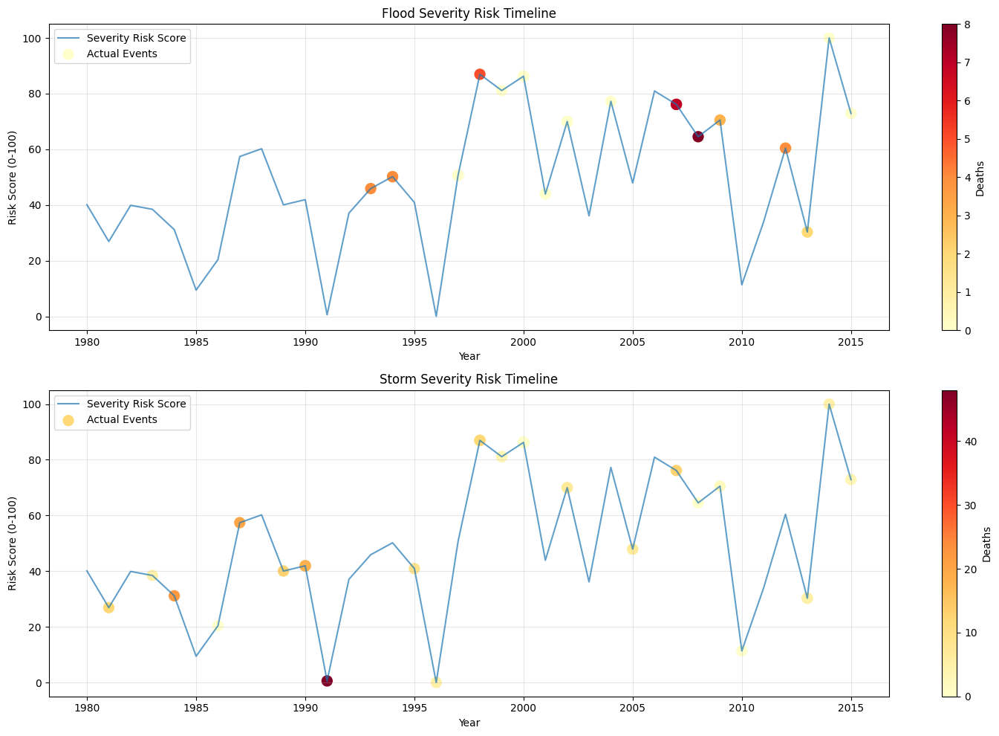

In [162]:
class WeightedSeverityAnalyzer(DisasterSeverityAnalyzer):
    """
    Enhanced severity analysis incorporating weighted environmental metrics
    based on empirical correlations with disaster impacts.
    """
    
    def __init__(self, metrics_df, disasters_df, soil_moisture_df):
        super().__init__(metrics_df, disasters_df, soil_moisture_df)
        self.metric_weights = {}
        self.enhanced_metrics = None
    
    def calculate_metric_weights(self):
        """
        Calculate empirical weights for environmental metrics based on
        their correlation with disaster severity.
        """
        # Define core environmental metrics
        base_metrics = ['rainfall', 'soil_moisture', 'temp_variability']
        temp_metrics = ['temp_range', 'max_temp', 'min_temp']
        all_metrics = base_metrics + temp_metrics
        
        weights = {}
        correlations = {}
        
        for disaster_type in ['Flood', 'Storm']:
            # Get events for this disaster type
            events = self.disasters_df[
                self.disasters_df['Disaster Type'] == disaster_type
            ]
            
            # Calculate correlations with Total Deaths
            metric_correlations = {}
            for metric in all_metrics:
                if metric in self.metrics_df.columns:
                    yearly_metric = self.metrics_df[metric].reindex(
                        events['Start Year']
                    )
                    corr = abs(yearly_metric.corr(events['Total Deaths']))
                    metric_correlations[metric] = corr if not np.isnan(corr) else 0
            
            correlations[disaster_type] = metric_correlations
            
            # Calculate normalized weights
            total_corr = sum(metric_correlations.values())
            weights[disaster_type] = {
                metric: (corr / total_corr if total_corr > 0 else 1/len(metric_correlations))
                for metric, corr in metric_correlations.items()
            }
            
            # Log weights and correlations
            logger.info(f"\n{disaster_type} Metric Correlations and Weights:")
            for metric in all_metrics:
                if metric in metric_correlations:
                    logger.info(f"{metric}:")
                    logger.info(f"  Correlation: {metric_correlations[metric]:.3f}")
                    logger.info(f"  Weight: {weights[disaster_type][metric]:.3f}")
        
        self.metric_weights = weights
        return correlations
    
    def calculate_severity_risk(self):
        """
        Calculate weighted severity risk scores using empirically
        derived metric weights.
        """
        risk_scores = pd.DataFrame(index=self.metrics_df.index)
        
        for disaster_type in ['Flood', 'Storm']:
            weights = self.metric_weights[disaster_type]
            
            # Calculate weighted sum of standardized metrics
            weighted_score = pd.Series(0.0, index=self.metrics_df.index)
            
            for metric, weight in weights.items():
                if metric in self.metrics_df.columns:
                    # Standardize metric
                    standardized = (
                        self.metrics_df[metric] - self.metrics_df[metric].mean()
                    ) / self.metrics_df[metric].std()
                    
                    weighted_score += standardized * weight
            
            # Scale to 0-100
            risk_scores[f'{disaster_type.lower()}_severity_risk'] = (
                (weighted_score - weighted_score.min()) /
                (weighted_score.max() - weighted_score.min()) * 100
            )
        
        return risk_scores
    
    def plot_severity_risk(self, risk_scores):
        """
        Generate visualization of weighted severity risk scores
        with actual disaster impacts.
        """
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))
        
        for idx, disaster_type in enumerate(['Flood', 'Storm']):
            ax = ax1 if idx == 0 else ax2
            risk_col = f'{disaster_type.lower()}_severity_risk'
            
            # Plot risk score
            ax.plot(risk_scores.index, risk_scores[risk_col],
                   label='Severity Risk Score', alpha=0.7)
            
            # Add actual events with death counts
            events = self.disasters_df[
                self.disasters_df['Disaster Type'] == disaster_type
            ]
            
            # Filter events to only include years present in risk_scores
            events = events[events['Start Year'].isin(risk_scores.index)]
            
            if len(events) > 0:
                scatter = ax.scatter(
                    events['Start Year'],
                    risk_scores.loc[events['Start Year'], risk_col],
                    c=events['Total Deaths'],
                    s=100,
                    cmap='YlOrRd',
                    label='Actual Events'
                )
                plt.colorbar(scatter, ax=ax, label='Deaths')
            
            ax.set_title(f'{disaster_type} Severity Risk Timeline')
            ax.set_xlabel('Year')
            ax.set_ylabel('Risk Score (0-100)')
            ax.grid(True, alpha=0.3)
            ax.legend()
        
        plt.tight_layout()
        return fig

# Initialize analyzer
weighted_analyzer = WeightedSeverityAnalyzer(metrics_df, disasters_df, soil_moisture_df)

# Calculate empirical weights
correlations = weighted_analyzer.calculate_metric_weights()

# Calculate severity risk scores
risk_scores = weighted_analyzer.calculate_severity_risk()

# Generate visualization
weighted_analyzer.plot_severity_risk(risk_scores)
plt.show()

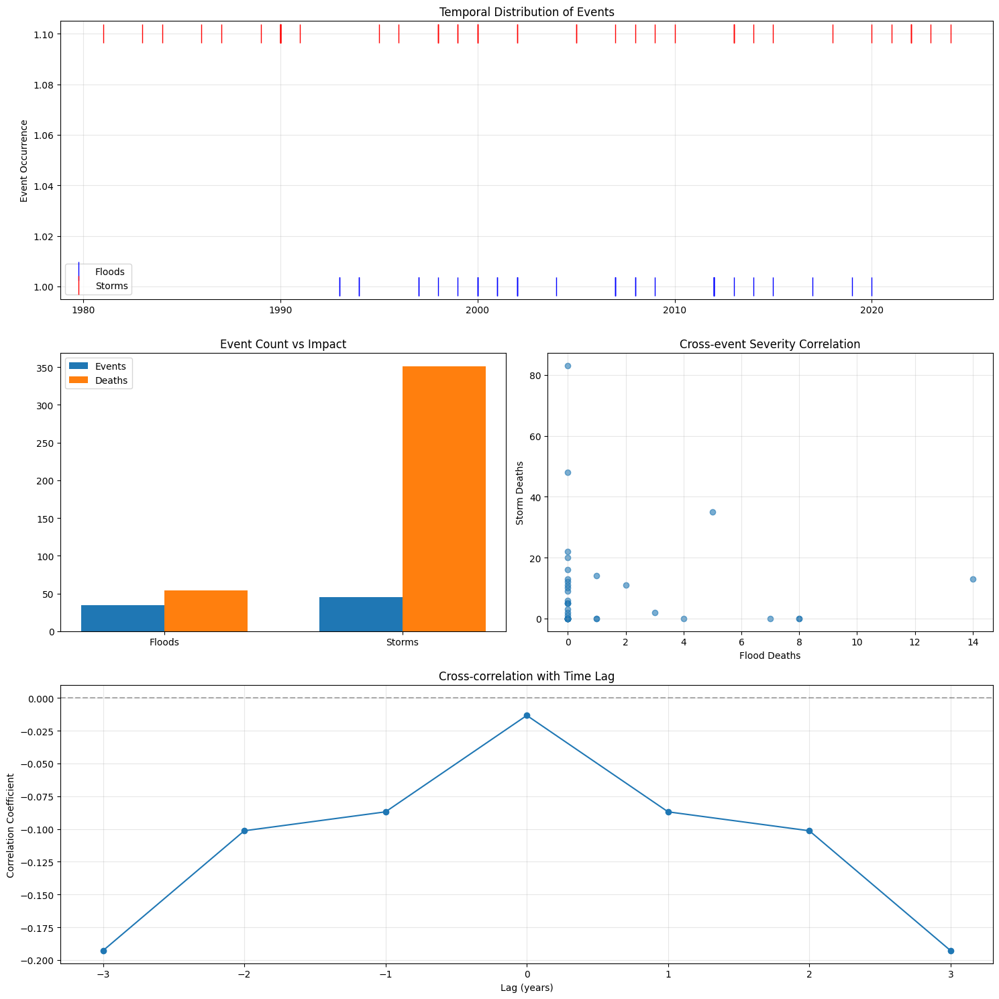

In [164]:
def analyze_disaster_relationships():
    """
    Analyze temporal and severity relationships between floods and storms,
    with focus on predictive patterns and cross-event correlations.
    """
    fig = plt.figure(figsize=(15, 15))
    gs = plt.GridSpec(3, 2, figure=fig)
    
    # 1. Temporal Distribution
    ax1 = fig.add_subplot(gs[0, :])
    floods = disasters_df[disasters_df['Disaster Type'] == 'Flood']
    storms = disasters_df[disasters_df['Disaster Type'] == 'Storm']
    
    ax1.plot(floods['Start Year'], np.ones_like(floods['Start Year']), '|b', 
             markersize=20, label='Floods')
    ax1.plot(storms['Start Year'], np.ones_like(storms['Start Year'])*1.1, '|r', 
             markersize=20, label='Storms')
    ax1.set_title('Temporal Distribution of Events')
    ax1.set_ylabel('Event Occurrence')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. Event Impact Distribution
    ax2 = fig.add_subplot(gs[1, 0])
    data = {
        'Floods': {'Events': len(floods), 'Deaths': floods['Total Deaths'].sum()},
        'Storms': {'Events': len(storms), 'Deaths': storms['Total Deaths'].sum()}
    }
    
    x = np.arange(2)
    width = 0.35
    ax2.bar(x - width/2, [data['Floods']['Events'], data['Storms']['Events']], 
            width, label='Events')
    ax2.bar(x + width/2, [data['Floods']['Deaths'], data['Storms']['Deaths']], 
            width, label='Deaths')
    ax2.set_xticks(x)
    ax2.set_xticklabels(['Floods', 'Storms'])
    ax2.set_title('Event Count vs Impact')
    ax2.legend()
    
    # 3. Cross-correlation of severity
    ax3 = fig.add_subplot(gs[1, 1])
    
    # Create yearly severity mapping
    yearly_severity = pd.DataFrame(index=range(1980, 2024))
    yearly_severity['flood_deaths'] = floods.groupby('Start Year')['Total Deaths'].sum()
    yearly_severity['storm_deaths'] = storms.groupby('Start Year')['Total Deaths'].sum()
    yearly_severity.fillna(0, inplace=True)
    
    ax3.scatter(yearly_severity['flood_deaths'], yearly_severity['storm_deaths'], 
                alpha=0.6)
    ax3.set_xlabel('Flood Deaths')
    ax3.set_ylabel('Storm Deaths')
    ax3.set_title('Cross-event Severity Correlation')
    ax3.grid(True, alpha=0.3)
    
    # Calculate correlation with lag
    max_lag = 3
    lags = range(-max_lag, max_lag + 1)
    correlations = []
    
    for lag in lags:
        if lag >= 0:
            corr = yearly_severity['flood_deaths'].corr(
                yearly_severity['storm_deaths'].shift(-lag)
            )
        else:
            corr = yearly_severity['flood_deaths'].shift(abs(lag)).corr(
                yearly_severity['storm_deaths']
            )
        correlations.append(corr)
    
    # 4. Lag Correlation Analysis
    ax4 = fig.add_subplot(gs[2, :])
    ax4.plot(lags, correlations, 'o-')
    ax4.set_xlabel('Lag (years)')
    ax4.set_ylabel('Correlation Coefficient')
    ax4.set_title('Cross-correlation with Time Lag')
    ax4.grid(True, alpha=0.3)
    ax4.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    return yearly_severity, correlations, data

# Execute analysis
yearly_severity, correlations, impact_data = analyze_disaster_relationships()

In [121]:
disasters_df.shape[0]
temp_data.head(10)

,year,min_temp,max_temp,temp_variability
0,2023,6.32,13.66,7.34
1,2014,6.26,13.54,7.28
2,2022,6.17,13.92,7.75
3,2006,6.05,13.39,7.34
4,2017,5.99,13.12,7.13
5,2002,5.94,12.97,7.03
6,2011,5.93,13.33,7.40
7,2020,5.92,13.35,7.43
8,2004,5.91,13.00,7.09
9,2007,5.90,13.27,7.37


In [109]:
print(f"Disasters dataframe columns: \n {disasters_df.columns.to_list()}")
print(f"Met Office dataframe columns (only using rainfall and sunshine data): \n {met_data_1980.columns.to_list()}")
print(f"Disasters dataframe column: \n {disasters_df.columns.to_list()}")
print(f"Temperature Variability: \n {temp_var.head(10)}")


Disasters dataframe columns: 
 ['DisNo.', 'Historic', 'Classification Key', 'Disaster Group', 'Disaster Subgroup', 'Disaster Type', 'Disaster Subtype', 'External IDs', 'Event Name', 'ISO', 'Country', 'Subregion', 'Region', 'Location', 'Origin', 'Associated Types', 'OFDA/BHA Response', 'Appeal', 'Declaration', "AID Contribution ('000 US$)", 'Magnitude', 'Magnitude Scale', 'Latitude', 'Longitude', 'River Basin', 'Start Year', 'Start Month', 'Start Day', 'End Year', 'End Month', 'End Day', 'Total Deaths', 'No. Injured', 'No. Affected', 'No. Homeless', 'Total Affected', "Reconstruction Costs ('000 US$)", "Reconstruction Costs, Adjusted ('000 US$)", "Insured Damage ('000 US$)", "Insured Damage, Adjusted ('000 US$)", "Total Damage ('000 US$)", "Total Damage, Adjusted ('000 US$)", 'CPI', 'Admin Units', 'Entry Date', 'Last Update', 'Decade']
Met Office dataframe columns (only using rainfall and sunshine data): 
 ['year', 'month', 'tmax', 'tmin', 'af', 'rain', 'sun', 'station']
Disasters datafr

In [153]:
soil_moisture_df.head(20)

,file_timestamp,20241211211548
0,location,point: 571500 278500
1,dataset_name,Historic G2G flows and soil moisture with Oudi...
2,dataset_title,Grid-to-Grid model estimates of monthly mean f...
3,DOI,10.5285/f52f012d-9f2e-42cc-b628-9cdea4fa3ba0
4,start_year,1891
5,end_year,2015
6,parameter,soil
7,interval,monthly
8,statistic,mean
9,procedure,modelled
